In [1]:
import sys
sys.path.append('/home/aklantbhowmick/anaconda3/lib/python3.7/site-packages')
sys.path.append('/home/aklantbhowmick/anaconda3/lib/python3.7/site-packages/scalpy/')
sys.path.append('/home/aklantbhowmick/anaconda3/envs/nbodykit-env/lib/python3.6/site-packages/')
import mdot_to_Lbol
import arepo_package
import scipy.interpolate
import illustris_python

import scipy.integrate

radiative_efficiency=0.2
total_conv=mdot_to_Lbol.get_conversion_factor_arepo(radiative_efficiency)
import h5py

import warnings
warnings.filterwarnings('ignore')

%pylab inline

colors_res=['#83c995','orange','blue','black']


def show_seeding_histories2(basePath,col,labl='.',width=4,style='solid',nbins=40,cumulative=0,plot=1):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    redshifts_fac=1./scale_fac_complete2-1
    return redshifts_fac


def show_seed_FOFmass(basePath,col,labl='.',width=4,style='solid',nbins=40,cumulative=0):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    redshifts_fac=1./scale_fac_complete2-1

    seed_redshifts=1./scale_fac_complete2-1.
    mask=(seed_redshifts>redshift_cut)
    return FOFDMmass_complete2[mask]*1e10
 
    

def show_seed_SFGmass(basePath,col,labl='.',width=4,style='solid',nbins=40,cumulative=0):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    redshifts_fac=1./scale_fac_complete2-1

    seed_redshifts=1./scale_fac_complete2-1.
    mask=(seed_redshifts>redshift_cut)
    return FOFStarFormingGasMass_complete2[mask]*1e10


def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0,cumulative=0,density=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        if (cumulative==1):
            mask=(HM>HM_min)
        else:
            mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    if (density==1):
        norm=numpy.diff(centers)
    return centers,HMF/norm,dHMF/norm

def show_seeding_halomass2(basePath,labl='.',width=4,style='solid',nbins=40,offset=0):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    #scale_fac_complete,BH_id_complete,density_complete,metallicity_complete,SFR_complete,FOFDMmass_complete,indexmaxdens_complete,FOFTask_complete, file_id_complete,N_empty=arepo_package.get_seeding_events(basePath)
    #scale_fac_complete,BH_id_complete,density_complete,metallicity_complete,SFR_complete,FOFDMmas
    redshifts_fac=1./scale_fac_complete2-1
    print("No of seeds formed:", len(redshifts_fac[redshifts_fac>0]))
    #obj=ax
    seed_redshifts=1./scale_fac_complete2-1.
    mask=(seed_redshifts>redshift_cut)
    print(FOFDMmass_complete2[mask]) 
    return FOFDMmass_complete2




def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    return centers,HMF/norm,dHMF/norm


def get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=0,HDF5=0,path_to_hdf5='./'):
    if(HDF5):
        fobj=h5py.File(path_to_hdf5)
        scale_fac_complete_sorted=fobj.get('time')[:]
        primary_mass_sorted=fobj.get('mass_out')[:]
        secondary_mass_sorted=fobj.get('mass_in')[:]
    else:
        scale_fac_complete_sorted,primary_mass_sorted,secondary_mass_sorted,primary_id_sorted,secondary_id_sorted,file_id_complete_sorted,N_empty=arepo_package.get_merger_events_from_snapshot(basePath,upto_redshift,HOSTS=0)
    mass_ratio=secondary_mass_sorted/primary_mass_sorted
    #print(mass_ratio[mass_ratio>1.])
        #print(primary_mass_sorted,secondary_mass_sorted)
    merger_redshifts=1./scale_fac_complete_sorted-1.
    
    #print(merger_redshifts)
    
    #print("###",primary_mass_sorted)
    mask_primary=primary_mass_sorted>=mass_cut/1e10
    mask_secondary=secondary_mass_sorted>=mass_cut/1e10
    mask_total_mass=(primary_mass_sorted+secondary_mass_sorted)>=total_mass_cut/1e10
    mask_redshift=merger_redshifts>=redshift_cut
    mask_ratio_cut=mass_ratio>=mass_ratio_cut
    mask=((mask_primary&mask_secondary)&(mask_redshift&mask_ratio_cut))&mask_total_mass
    merger_redshifts=merger_redshifts[mask]
  
    #print("!!!",merger_redshifts)
    bins, dist, dist_err,norm,counts_sum=arepo_package.get_probability_density(merger_redshifts,nbins,min_value,max_value,linear=linear)
 
    dist*=counts_sum

    dist_err*=counts_sum
    dt=numpy.array([T(zz-norm/2,zz+norm/2) for zz in bins])
    

    dz=numpy.diff(bins)[0]
    #print("!!!",dist)    
    dz_dt=numpy.array([dz/T(zz-dz/2,zz+dz/2) for zz in bins])
    
    return bins,dist,dist_err,norm,dz_dt


def get_merger_distributions_hosts(basePath,nbins,min_value,max_value,mass_cut,linear=0,HDF5=0,path_to_hdf5='./'):
    if(HDF5):
        fobj=h5py.File(path_to_hdf5)
        scale_fac_complete_sorted=fobj.get('time')[:]
        primary_mass_sorted=fobj.get('mass_out')[:]
        secondary_mass_sorted=fobj.get('mass_in')[:]
    else:
        scale_fac_complete,BH_id_primary,BH_mass_primary,hosthalomass_primary,hosthalostellarmass_primary,hosthalogasmass_primary,hosthalodmmass_primary,BH_id_secondary,BH_mass_secondary,hosthalomass_secondary,hosthalostellarmass_secondary,hosthalogasmass_secondary,hosthalodmmass_secondary,file_id_complete=arepo_package.get_merger_events_hosts(basePath,HDF5=1)        #print(primary_mass_sorted,secondary_mass_sorted)
    mass_ratio=BH_id_secondary/BH_mass_primary
    mask_ratio_cut=mass_ratio>mass_ratio_cut
    merger_redshifts=1./scale_fac_complete-1.
    #print("###",BH_mass_primary)
    mask_primary=BH_mass_primary>mass_cut/1e10
    mask_secondary=BH_mass_secondary>mass_cut/1e10
    mask_total_mass=(BH_mass_primary+BH_mass_secondary)>total_mass_cut/1e10
    mask_redshift=merger_redshifts>redshift_cut
    mask=((mask_primary&mask_secondary)&(mask_redshift&mask_ratio_cut))&mask_total_mass
    
    maskhost1=hosthalomass_primary+hosthalomass_secondary>14.2e10/1e10*h
    maskhost2=hosthalomass_primary>7.1e10/1e10*h
    maskhost3=hosthalodmmass_primary>2e9/1e10*h
    maskhost4=hosthalodmmass_secondary>2e9/1e10*h
    maskhost5=hosthalostellarmass_primary>1e8/1e10*h   
    maskhost6=hosthalostellarmass_secondary>1e8/1e10*h
    
    if(apply_host_cuts==0):
        maskhost=mask
    else:
        maskhost=((((maskhost1&maskhost2)&maskhost3)&maskhost4)&maskhost5)&maskhost6
    
    
    merger_redshifts=merger_redshifts[mask&maskhost]
    
    #print("!!!",merger_redshifts)
    
    bins, dist, dist_err,norm,counts_sum=arepo_package.get_probability_density(merger_redshifts,nbins,min_value,max_value,linear=linear)
    
    dt=numpy.array([T(zz-norm/2,zz+norm/2) for zz in bins])
     
    
    dz=numpy.diff(bins)[0]
    #print("!!!",dist)
    dz_dt=numpy.array([dz/T(zz-dz/2,zz+dz/2) for zz in bins])
    
    return bins,dist,dist_err,norm,dz_dt

def get_merger_rate(basePath, nbins, min_value,max_value,ZOOM=0,HDF5=0,input_simulation_boxsize_in_Mpch=1.,path_to_hdf5='.',GasFractionCut=0.1,hosts=0):
    Mpc_to_kpc=1000
    if (hosts):
        bins,dist,dist_err,norm,dz_dt=get_merger_distributions_hosts(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    else:
        bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])
    if ZOOM:
        if (HDF5):
            simulation_volume=input_simulation_boxsize_in_Mpch**3
        else:
            output_redshifts,high_res_volumes,total_volumes=numpy.load(basePath+'/zoom_volumes_high_res_fraction_cut_%.2f.npy'%(GasFractionCut),allow_pickle=True)
            #print(output_redshifts,high_res_volumes)
            mask=high_res_volumes>0 
            get_volume=scipy.interpolate.interp1d(output_redshifts[mask],high_res_volumes[mask],fill_value='extrapolate')
            simulation_volume=get_volume(bins)
            print("Simulation volumes are:", simulation_volume)
    else:
        if (HDF5):
            simulation_volume=input_simulation_boxsize_in_Mpch**3
        else:
            simulation_volume=(arepo_package.get_box_size(basePath)/Mpc_to_kpc)**3
            print("Simulation volumes are:", simulation_volume)
        
    
    merger_rate=dist*1.
    merger_rate_err=dist_err*1
    
    merger_rate*=dz_dt
    merger_rate_err*=dz_dt
    
    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell
    
    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    return bins, dist, dist_err, merger_rate, merger_rate_err 


def make_LF(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3,offset=0):

    DM1Pos,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',1,desired_redshift)
    COM=numpy.average(DM1Pos,axis=0)
    
    GroupBHMdot,output_redshift=arepo_package.get_particle_property(basePath,'BH_Mdot',5,desired_redshift)
    GroupBHMdot=GroupBHMdot*total_conv
    #print(output_redshift)

    GroupBHMass,output_redshift=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
    GroupBHMass=GroupBHMass*1e10

    
    Coordinates,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',5,desired_redshift)
    dist=numpy.sqrt(numpy.sum((Coordinates-COM)**2,axis=1))
      
    #GroupBHMdot=numpy.array([convert_mdot_to_Lbol(mdot,mass,radiative_efficiency,1) for mdot,mass in zip(GroupBHMdot,GroupBHMass)])

    
    if (ZOOM==1):
        mask_pos=dist<max_dist
        mask=mask_pos
        GroupBHMdot=GroupBHMdot[mask]
        GroupBHMass=GroupBHMass[mask]
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        #print(N_space)
        obj.errorbar(loglumcut_space[N_space>0]+offset,N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl,linestyle=lstyle);           
    else:   
        mask1=GroupBHMdot>10**loglumcut
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        obj.errorbar(loglumcut_space[N_space>0]+offset,N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl,linestyle=lstyle);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    #print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')
    obj.tick_params(labelsize=40)

def make_MF(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3):
    
    DM1Pos,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',1,desired_redshift)
    COM=numpy.average(DM1Pos,axis=0)
    
    GroupBHMass,output_redshift=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
    GroupBHMass=GroupBHMass*1e10
    
    Coordinates,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',5,desired_redshift)
    dist=numpy.sqrt(numpy.sum((Coordinates-COM)**2,axis=1))


    if (ZOOM==1):
        
        mask_pos=dist<max_dist
        mask=mask_pos
       # GroupBHMdot=GroupBHMdot[mask]
        GroupBHMass=GroupBHMass[mask]
     
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        print(N_space)
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);           
    else:    
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')
    return logmasscut_space,N_space,numpy.sqrt(N_space)


def make_MF_group(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3):
    
    GroupMassType,output_redshift=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
    GroupLenType,output_redshift=arepo_package.get_group_property(basePath,'GroupLenType',desired_redshift)
    
    GroupMass1=GroupMassType[:,1]
    GroupMass2=GroupMassType[:,2]
    
    LowResFraction=GroupMass2/(GroupMass1+GroupMass2)
    
    GroupLen=GroupLenType[:,4]
    GroupMass=GroupMassType[:,4]
    #print(GroupLen)
    GroupBHMass,output_redshift=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
    GroupMass*=1e10
    GroupBHMass*=1e10

    if (ZOOM==1):
        mask=LowResFraction<0.1
        GroupBHMass=GroupBHMass[mask]    
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        print(N_space)
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);           
    else:    
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')

    


def make_LF_group(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3):
    
    GroupMassType,output_redshift=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
    GroupLenType,output_redshift=arepo_package.get_group_property(basePath,'GroupLenType',desired_redshift)
    
    GroupMass1=GroupMassType[:,1]
    GroupMass2=GroupMassType[:,2]
    
    LowResFraction=GroupMass2/(GroupMass1+GroupMass2)
    
    GroupLen=GroupLenType[:,4]
    GroupMass=GroupMassType[:,4]
    #print(GroupLen)
    GroupBHMdot,output_redshift=arepo_package.get_group_property(basePath,'GroupBHMdot',desired_redshift)
    GroupBHMdot=GroupBHMdot*total_conv

    GroupBHMass,output_redshift=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
    GroupBHMass=GroupBHMass*1e10
    
    if (ZOOM==1):
        mask=LowResFraction<0.1
        GroupBHMdot=GroupBHMdot[mask]
        GroupBHMass=GroupBHMass[mask]
    
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        #print(N_space)
        obj.errorbar(loglumcut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);           
    else:   
        mask1=GroupBHMdot>10**loglumcut
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        obj.errorbar(loglumcut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    #print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')
    obj.tick_params(labelsize=40)

 
    

from scipy.integrate import quad
global c,h,omm,oml,omk
omk=0
oml=0.6911
omm=0.3089
c=3*10**5
h=0.6771


def DC(z0, z1):
    # Comoving distance in Mpc                                                                                          $
    def integrand(z):
        return 1.0/E(z)
    return c/(100.0)*quad(integrand,z0,z1)[0]

def dx_dz(z):
    # Comoving distance in Mpc                                                                                          $
    def integrand(z):
        return 1.0/E(z)
    return c/(100.0)*integrand(z)


def E(z):
        #normalized hubble parameter                                                                                    $
    return np.sqrt(omm*(1.0+z)**3 + oml + omk*(1.0+z)**2)

def DL(z):
    #Luminosity distance in Mpcs                                                                                        $
    return (1.0+z)*DC(0,z)

def DM(z):
        #Distance Modulus                                                                                               $
        return 5*np.log10((DL(z)*1e6)/10.0)

def mtoM(m,z):
    return m - DM(z) - K(z)

def Mtom(M, z):
    return M + DM(z) + K(z)

def LtoM(L):
    M = -2.5 * np.log10(L*1e-7)+34.1
    return M

def MtoL(M):
    return 10**((-1/2.5*(M-34.1)))*1e7

def K(z):
    #K correction, assuming same filter size in emitted and observed frame                                              $
    return 2.5*np.log10(1.0/(1+z))

def T(z0,z1):
    sectoyrs=3.171e-08
    Mpctokm=3.0857E+19
    def integrand(z):
        return 1.0/E(z)/(1+z)
    return 1./(100.0)*quad(integrand,z0,z1)[0]*Mpctokm*sectoyrs






Populating the interactive namespace from numpy and matplotlib


In [2]:
label_fontsize=40
title_fontsize=40
ntsize=40

In [3]:
iii=2.58
hhh=0.45


redshift_cut=11

levelmax_gas=12
logseedmass_gas=3.19

levelmax=11




def get_info():
    #path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run

    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d_hightimeres_bFOF3'%(Mh,Msfmp)

    output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)


    basePath=path_to_output+run+output

    '''
    levelmax_gas=11
    logseedmass_gas=4.10
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_bFOF0/'
    basePath=path_to_output+run+output
    '''



    #target_redshift_space,target_LogGroupMass_space,target_LogGroupSFMPMass_space,target_LogGroupSFMass_space,min_redshift_space,max_redshift_space,LogGroupBHMass_min_redshift_space,LogGroupBHMass_max_redshift_space,GroupIndex_min_redshift_space,GroupIndex_max_redshift_space,target_LogGroupStellarMass_space,target_LogGroupSFR_space,target_LogGroupGasMetallicity_space,target_LogGroupStellarMetallicity_space,min_snap_space,max_snap_space,LogGroupMass_min_redshift_space,LogGroupMass_max_redshift_space=numpy.load(basePath+'/postprocessing/group_properties_seed%.2f_cleaned8.npy'%LogTargetGroupBHMass)

    data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_min_redshift_space=data[0]
    unique_LogGroupStellarMass_min_redshift_space=data[1]
    unique_LogGroupSFR_min_redshift_space=data[2]
    unique_LogGroupSF_min_redshift_space=data[3]
    unique_LogGroupSFMP_min_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
    unique_LogGroupGasMetallicity_min_redshift_space=data[6]
    unique_min_redshift_space=data[7]

    data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_max_redshift_space=data[0]
    unique_LogGroupStellarMass_max_redshift_space=data[1]
    unique_LogGroupSFR_max_redshift_space=data[2]
    unique_LogGroupSF_max_redshift_space=data[3]
    unique_LogGroupSFMP_max_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
    unique_LogGroupGasMetallicity_max_redshift_space=data[6]
    unique_max_redshift_space=data[7]

    data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_target_redshift_space=data[0]
    unique_LogGroupStellarMass_target_redshift_space=data[1]
    unique_LogGroupSFR_target_redshift_space=data[2]
    unique_LogGroupSF_target_redshift_space=data[3]
    unique_LogGroupSFMP_target_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
    unique_LogGroupGasMetallicity_target_redshift_space=data[6]
    unique_target_redshift_space=data[7]

    unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)
    mask=unique_target_redshift_space>6
    a,b,c,d=arepo_package.mean_plot(unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask],False,False,Nbins)

    
    return a,b,c,d,unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask]



def get_info2():
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run

    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    #output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d_hightimeres_bFOF3'%(Mh,Msfmp)

    output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete=arepo_package.get_seeding_events3(basePath,GET_ENVIRONMENT=1)
    unique_target_redshift_space=1./scale_fac_complete-1
    unique_LogGroupMass_target_redshift_space = numpy.log10(FOFDMmass_complete*1e10)
    mask=unique_target_redshift_space>6
    a,b,c,d=arepo_package.mean_plot(unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask],False,False,20)

    
    return a,b,c,d,unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask]

def get_info3():
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run

    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)

    #output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)


    basePath=path_to_output+run+output

    '''
    levelmax_gas=11
    logseedmass_gas=4.10
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_bFOF0/'
    basePath=path_to_output+run+output
    '''



    #target_redshift_space,target_LogGroupMass_space,target_LogGroupSFMPMass_space,target_LogGroupSFMass_space,min_redshift_space,max_redshift_space,LogGroupBHMass_min_redshift_space,LogGroupBHMass_max_redshift_space,GroupIndex_min_redshift_space,GroupIndex_max_redshift_space,target_LogGroupStellarMass_space,target_LogGroupSFR_space,target_LogGroupGasMetallicity_space,target_LogGroupStellarMetallicity_space,min_snap_space,max_snap_space,LogGroupMass_min_redshift_space,LogGroupMass_max_redshift_space=numpy.load(basePath+'/postprocessing/group_properties_seed%.2f_cleaned8.npy'%LogTargetGroupBHMass)

    data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_min_redshift_space=data[0]
    unique_LogGroupStellarMass_min_redshift_space=data[1]
    unique_LogGroupSFR_min_redshift_space=data[2]
    unique_LogGroupSF_min_redshift_space=data[3]
    unique_LogGroupSFMP_min_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
    unique_LogGroupGasMetallicity_min_redshift_space=data[6]
    unique_min_redshift_space=data[7]

    data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_max_redshift_space=data[0]
    unique_LogGroupStellarMass_max_redshift_space=data[1]
    unique_LogGroupSFR_max_redshift_space=data[2]
    unique_LogGroupSF_max_redshift_space=data[3]
    unique_LogGroupSFMP_max_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
    unique_LogGroupGasMetallicity_max_redshift_space=data[6]
    unique_max_redshift_space=data[7]

    data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_target_redshift_space=data[0]
    unique_LogGroupStellarMass_target_redshift_space=data[1]
    unique_LogGroupSFR_target_redshift_space=data[2]
    unique_LogGroupSF_target_redshift_space=data[3]
    unique_LogGroupSFMP_target_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
    unique_LogGroupGasMetallicity_target_redshift_space=data[6]
    unique_target_redshift_space=data[7]

    #unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)
    mask=unique_target_redshift_space>6
    a,b,c,d=arepo_package.mean_plot(unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask],False,False,Nbins)

    
    return a,b,c,d,unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask]


   






In [4]:
h

0.6771

Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
{'NumPart_ThisFile': array([9714287, 9759541,  361796,       0,  127415,     136], dtype=int32), 'NumPart_Total': array([155180504, 153021952,   7756653,         0,   1822868,      2070],
      dtype=uint32), 'NumPart_Total_HighWord': array([0, 0, 0, 0, 0, 0], dtype=uint32), 'MassTable': array([0.00000000e+00, 1.64251077e-06, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00]), 'Time': 0.11096103078290759, 'Redshift': 8.012172948865935, 'BoxSize': 25000.0, 'NumFilesPerSnapshot': 16, 'Omega0': 0.3089, 'OmegaLambda': 0.6911, 'OmegaBaryon': 0.0486, 'HubbleParam': 0.6771, 'Flag_Sfr': 1, 'Flag_Cooling': 1, 'Flag_StellarAge': 0, 'Flag_Metals': 0, 'Flag_Feedback': 1, 'Flag_DoublePrecision': 0, 'Composition_vector_length': 0, 'Git_commit': b'e9248873f6fabf87d52c75937a7e11a479b2847d', 'Git_date': b'Thu Sep 9 12:15:43 2021 -0400', 'UnitLength_in_cm': 3.085678e+21, 'UnitMass_in_g': 1.989e+43, 'UnitVe

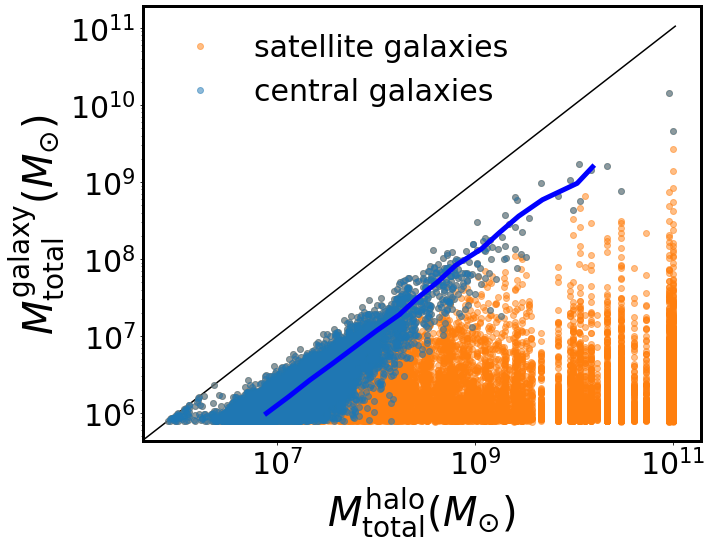

In [13]:
levelmax_gas,logseedmass_gas=12,3.19
Msfmp,Mh=5,3000
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output

def get_quantities(desired_redshift):
    file_format='fof_sub_subfind'
    GroupHostHaloMass,o=arepo_package.get_group_property(basePath,'GroupHostHaloMass',desired_redshift,file_format=file_format)

    GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift,file_format=file_format)
    LowResFraction=GroupMassType[:,2]/(GroupMassType[:,1]+GroupMassType[:,2])

    GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift,file_format=file_format)
    GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift,file_format=file_format)

    u_GroupHostHaloMass=numpy.unique(GroupHostHaloMass)

    bFOF_mass_space=[]
    LowResFraction_space=[]
    GroupBHMass_space=[]

    for host_mass in u_GroupHostHaloMass:
        GroupMass_sub=GroupMass[GroupHostHaloMass==host_mass]
        GroupBHMass_sub=GroupBHMass[GroupHostHaloMass==host_mass]
        LowResFraction_sub=LowResFraction[GroupHostHaloMass==host_mass]
        max_mass=numpy.amax(GroupMass_sub)
        bFOF_mass_space.append(max_mass)
        LowResFraction_space.append(LowResFraction_sub[GroupMass_sub==max_mass][0])
        GroupBHMass_space.append(GroupBHMass_sub[GroupMass_sub==max_mass][0])
    GroupBHMass_space=numpy.array(GroupBHMass_space)
    bFOF_mass_space=numpy.array(bFOF_mass_space)
    LowResFraction_space=numpy.array(LowResFraction_space)
    DM_Mass=arepo_package.load_snapshot_header(basePath,desired_redshift)['MassTable'][1]
    mask=(LowResFraction_space==0)&(bFOF_mass_space>DM_Mass*32)&(u_GroupHostHaloMass>DM_Mass*32)
     
    mask2=(LowResFraction==0)&(GroupMass>DM_Mass*32)&(GroupHostHaloMass>DM_Mass*32)
   
    GroupHostHaloMass
    return bFOF_mass_space[mask]*1e10, u_GroupHostHaloMass[mask]*1e10,GroupMass[mask2]*1e10,GroupHostHaloMass[mask2]*1e10

desired_redshift=8
bFOF_mass_space, u_GroupHostHaloMass,GroupMass,GroupHostHaloMass=get_quantities(desired_redshift)
f,ax=plt.subplots(1,1,figsize=(10,8))

ax.errorbar(GroupHostHaloMass/h,GroupMass/h,marker='o',linewidth=0,alpha=0.5,color='C1',label='satellite galaxies')


ax.errorbar(u_GroupHostHaloMass/h,bFOF_mass_space/h,marker='o',linewidth=0,alpha=0.5,color='C0',label='central galaxies')
Nbins=20
a,b,c,d=arepo_package.mean_plot(numpy.log10(bFOF_mass_space),numpy.log10(u_GroupHostHaloMass),False,False,Nbins)
ax.errorbar(10**b/h,10**a/h,linewidth=5,marker=' ',color='blue')



'''
desired_redshift=14
bFOF_mass_space, u_GroupHostHaloMass,GroupMass,GroupHostHaloMass=get_quantities(desired_redshift)
#ax.errorbar(bFOF_mass_space, u_GroupHostHaloMass,marker='o',linewidth=0,alpha=0.1)
a,b,c,d=arepo_package.mean_plot(numpy.log10(bFOF_mass_space),numpy.log10(u_GroupHostHaloMass),False,False,Nbins)
ax.errorbar(10**b,10**a,linewidth=5,marker=' ',color='C1')

desired_redshift=18
bFOF_mass_space, u_GroupHostHaloMass,GroupMass,GroupHostHaloMass=get_quantities(desired_redshift)
#ax.errorbar(bFOF_mass_space, u_GroupHostHaloMass,marker='o',linewidth=0,alpha=0.1)
a,b,c,d=arepo_package.mean_plot(numpy.log10(bFOF_mass_space),numpy.log10(u_GroupHostHaloMass),False,False,Nbins)
ax.errorbar(10**b,10**a,linewidth=5,marker=' ',color='C2')
'''

ax.plot(ax.get_xlim(),ax.get_xlim(),color='black')

ax.set_xlabel('$M_{\mathrm{total}}^{\mathrm{halo}}(M_{\odot})$',fontsize=label_fontsize)
ax.set_ylabel('$M_{\mathrm{total}}^{\mathrm{galaxy}}(M_{\odot})$',fontsize=label_fontsize)

ax.legend(loc='upper left',fontsize=label_fontsize-10,frameon=False)

#ax.axvline(DM_Mass*1e10*32)
#ax.axhline(DM_Mass*1e10*32)
ax.set_yscale('log')
ax.set_xscale('log')


ax.tick_params(labelsize=30)

ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)  # Right axis

# Show the plot
#plt.show()

plt.savefig('./Paper5_figures/FOFmass_vs_bFOFmass.png',bbox_inches='tight')



32
[0.00000000e+00 0.00000000e+00 0.00000000e+00 2.02224469e-03
 3.05498982e-03 4.34782609e-02 2.17315514e-01 5.13089005e-01
 8.53372434e-01 1.29411765e+00 2.34545455e+00 2.52000000e+00
 4.50000000e+00 5.28571429e+00 1.23333333e+01 6.33333333e+00
            nan            nan            nan]


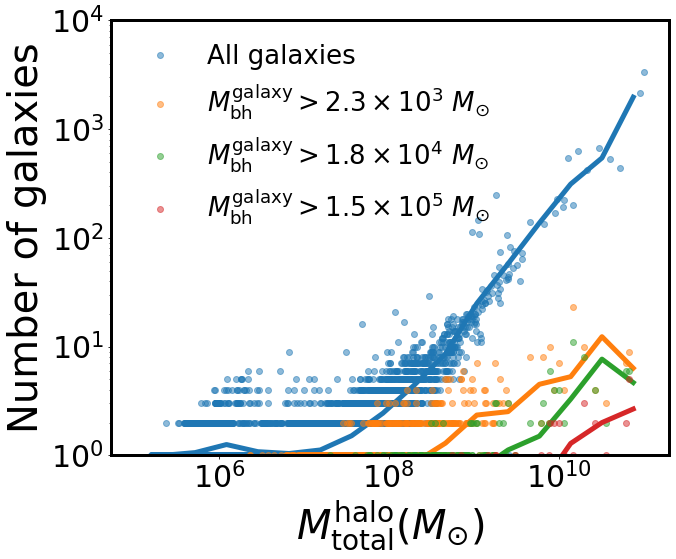

In [56]:
levelmax_gas,logseedmass_gas=12,3.19
Msfmp,Mh=5,3000
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output

def get_quantities(desired_redshift):
    file_format='fof_sub_subfind'
    GroupHostHaloMass,o=arepo_package.get_group_property(basePath,'GroupHostHaloMass',desired_redshift,file_format=file_format)

    GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift,file_format=file_format)
    LowResFraction=GroupMassType[:,2]/(GroupMassType[:,1]+GroupMassType[:,2])

    GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift,file_format=file_format)
    GroupLen,o=arepo_package.get_group_property(basePath,'GroupLen',desired_redshift,file_format=file_format)
    GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift,file_format=file_format)

    u_GroupHostHaloMass=numpy.unique(GroupHostHaloMass)
    print(min(GroupLen))

    bFOF_mass_space=[]
    LowResFraction_space=[]
    GroupBHMass_space=[]
    number_space=[]
    number_space2=[]
    number_space3=[]
    number_space4=[]
    for host_mass in u_GroupHostHaloMass:
        GroupMass_sub=GroupMass[GroupHostHaloMass==host_mass]
        GroupBHMass_sub=GroupBHMass[GroupHostHaloMass==host_mass]
        LowResFraction_sub=LowResFraction[GroupHostHaloMass==host_mass]
        max_mass=numpy.amax(GroupMass_sub)
        bFOF_mass_space.append(max_mass)
        LowResFraction_space.append(LowResFraction_sub[GroupMass_sub==max_mass][0])
        GroupBHMass_space.append(GroupBHMass_sub[GroupMass_sub==max_mass][0])
        number_space.append(len(GroupMass_sub))
        number_space2.append(len(GroupMass_sub[GroupBHMass_sub>=1.56e3/1e10]))
        number_space3.append(len(GroupMass_sub[GroupBHMass_sub>=1.25e4/1e10]))
        number_space4.append(len(GroupMass_sub[GroupBHMass_sub>=1e5/1e10]))
        
        
    number_space=numpy.array(number_space)
    number_space2=numpy.array(number_space2)
    number_space3=numpy.array(number_space3)
    number_space4=numpy.array(number_space4)
    return u_GroupHostHaloMass*1e10,number_space,number_space2,number_space3,number_space4

desired_redshift=8
u_GroupHostHaloMass,number_space,number_space2,number_space3,number_space4=get_quantities(desired_redshift)

min_x,max_x,Nbins=5,12,20
f,ax=plt.subplots(1,1,figsize=(10,8))

ax.errorbar(u_GroupHostHaloMass/h,number_space,marker='o',linewidth=0,alpha=0.5,color='C0',label='All galaxies')

a,b,c=arepo_package.mean_plot2(numpy.log10(u_GroupHostHaloMass),number_space,False,False,min_x,max_x,Nbins)
ax.errorbar(10**a/h,b,linewidth=5,marker=' ',color='C0')



ax.errorbar(u_GroupHostHaloMass,number_space2,marker='o',linewidth=0,alpha=0.5,color='C1',label=r'$M^{\mathrm{galaxy}}_{\mathrm{bh}}>2.3\times10^3 \ M_{\odot}$')
a,b,c=arepo_package.mean_plot2(numpy.log10(u_GroupHostHaloMass),number_space2,False,False,min_x,max_x,Nbins)
ax.errorbar(10**a/h,b,linewidth=5,marker=' ',color='C1')

print(b)

ax.errorbar(u_GroupHostHaloMass,number_space3,marker='o',linewidth=0,alpha=0.5,color='C2',label=r'$M^{\mathrm{galaxy}}_{\mathrm{bh}}>1.8\times10^4 \ M_{\odot}$')
a,b,c=arepo_package.mean_plot2(numpy.log10(u_GroupHostHaloMass),number_space3,False,False,min_x,max_x,Nbins)
ax.errorbar(10**a/h,b,linewidth=5,marker=' ',color='C2')

ax.errorbar(u_GroupHostHaloMass,number_space4,marker='o',linewidth=0,alpha=0.5,color='C3',label=r'$M^{\mathrm{galaxy}}_{\mathrm{bh}}>1.5\times10^5 \ M_{\odot}$')
a,b,c=arepo_package.mean_plot2(numpy.log10(u_GroupHostHaloMass),number_space4,False,False,min_x,max_x,Nbins)
ax.errorbar(10**a/h,b,linewidth=5,marker=' ',color='C3')



ax.legend(loc='upper left',fontsize=label_fontsize-14,frameon=False)

#ax.axvline(DM_Mass*1e10*32)
#ax.axhline(DM_Mass*1e10*32)
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylim(1,1e4)



ax.tick_params(labelsize=30)

ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)


ax.set_xlabel('$M^{\mathrm{halo}}_{\mathrm{total}}(M_{\odot})$',fontsize=label_fontsize)
ax.set_ylabel('Number of galaxies',fontsize=label_fontsize)
#ax.set_title('L12_SM%d_FOF%d'%(Msfmp,Mh),fontsize=label_fontsize)

ax.tick_params(labelsize=30)
plt.savefig('./Paper5_figures/FOFmass_vs_satellites.png',bbox_inches='tight')





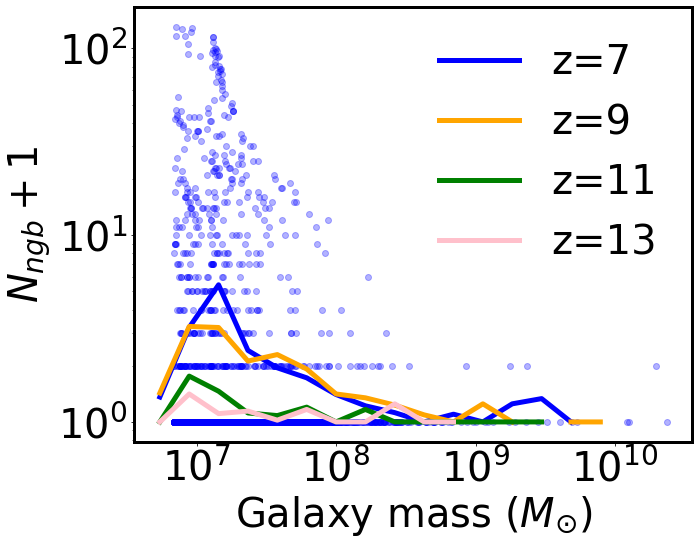

In [18]:
levelmax_gas,logseedmass_gas=12,3.19
Msfmp,Mh=150,3000
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
f,ax=plt.subplots(1,1,figsize=(10,8))
for desired_redshift,col in list(zip([7,9,11,13],['blue','orange','green','pink'])):

    GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift,file_format='fof_sub_subfind')
    GroupNumberOfMajorNeighbors,o=arepo_package.get_group_property(basePath,'GroupNumberOfMajorNeighbors',desired_redshift,file_format='fof_sub_subfind')
    mask=(GroupMass > 3000 * 1.56e-7)& (GroupNumberOfMajorNeighbors>=0)

    if(desired_redshift==7):
        ax.errorbar(numpy.log10(GroupMass[mask]*1e10/h),GroupNumberOfMajorNeighbors[mask]+1,marker='o',linewidth=0,alpha=0.3,color=col)

    a,b,c=arepo_package.mean_plot2(numpy.log10(GroupMass[mask]*1e10/h),GroupNumberOfMajorNeighbors[mask]+1,False,False,6,10,20)
    ax.errorbar(a,b,color=col,linewidth=5,label='z=%d'%desired_redshift)
    
    ax.set_xlabel('Galaxy mass $(M_{\odot})$',fontsize=label_fontsize)

    ax.set_ylabel('$N_{ngb} + 1$',fontsize=label_fontsize)
    
    ax.set_yscale('log')
    
    ax.tick_params(labelsize=label_fontsize)
    ax.set_xticks([7,8,9,10])
    ax.set_xticklabels(['$10^7$','$10^8$','$10^9$','$10^{10}$'])
ax.legend(loc='upper right',fontsize=label_fontsize,frameon=False)

ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)


#ax.set_xscale('log')

plt.savefig('./Paper5_figures/FOF_environment_mass_scaling.png',bbox_inches='tight')




In [34]:
b

array([ nan,  nan,  nan,  nan, -inf, -inf, -inf, -inf, -inf, -inf, -inf,
       -inf, -inf, -inf, -inf, -inf, -inf, -inf, -inf])

0.14118457300275483
0.00768775872264932


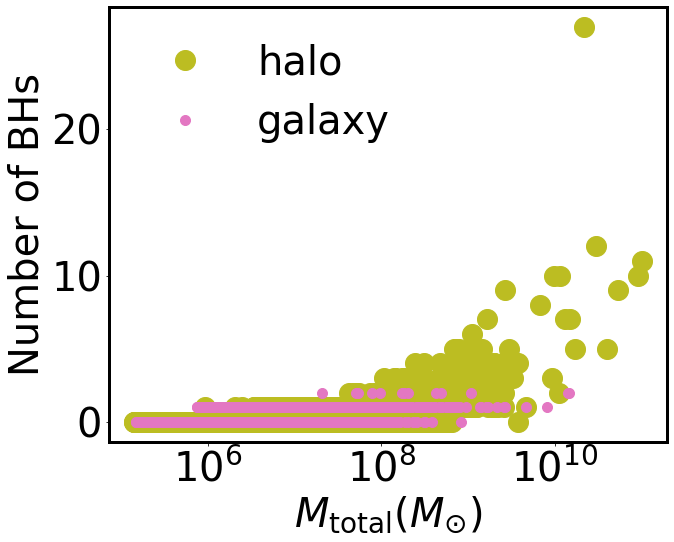

In [22]:
levelmax_gas,logseedmass_gas=12,3.19
Msfmp,Mh=5,3000
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output

def get_quantities(desired_redshift,file_format='fof_sub_subfind'):
    
    GroupHostHaloMass,o=arepo_package.get_group_property(basePath,'GroupHostHaloMass',desired_redshift,file_format=file_format)

    GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift,file_format=file_format)
    LowResFraction=GroupMassType[:,2]/(GroupMassType[:,1]+GroupMassType[:,2])

    GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift,file_format=file_format)
    GroupLen,o=arepo_package.get_group_property(basePath,'GroupLenType',desired_redshift,file_format=file_format)
    GroupLen5=GroupLen[:,5]
    GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift,file_format=file_format)
    
    log_Mh_space=numpy.linspace(5,10,20)
    
    return GroupMass,GroupLen5
    
f,ax=plt.subplots(1,1,figsize=(10,8))


for redshift in [8]:

    GroupMass,GroupLen5=get_quantities(redshift,file_format='fof_subfind')
    ax.errorbar(GroupMass*1e10/h,GroupLen5,marker='o',linewidth=0,ms=20,label='halo',color='C8')
    print(float(len(GroupLen5[GroupLen5>1]))/len(GroupLen5[GroupLen5>0]))



    GroupMass,GroupLen5=get_quantities(redshift)
    ax.errorbar(GroupMass*1e10/h,GroupLen5,marker='o',linewidth=0,ms=10,label='galaxy',color='C6')

    print(float(len(GroupLen5[GroupLen5>1]))/len(GroupLen5[GroupLen5>0]))


    ax.legend(loc='upper left',fontsize=label_fontsize,frameon=False)
    ax.tick_params(labelsize=label_fontsize)

    ax.set_xlabel('$M_{\mathrm{total}}(M_{\odot})$',fontsize=label_fontsize)
    ax.set_ylabel('Number of BHs',fontsize=label_fontsize)



    ax.set_xscale('log')

    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)
    plt.savefig('./Paper5_figures/FOFmass_vs_bh_occupation.png',bbox_inches='tight')

    
    
    



LogMinHaloMassSeedingThresholdAverageTransition           7.391341049071592
TransitionRedshift         12.08
Slope_lowz        -0.09112046304173617
Slope_highz       0.06689463512926437
[0.31345688 0.30865436 0.37625075 0.33362849 0.18692051 0.3058366
 0.12770955 0.27372276] 0.27827248837425345
-----
LogMinHaloMassSeedingThresholdAverageTransition           7.304402139790596
TransitionRedshift         13.1
Slope_lowz        -0.1506333945804154
Slope_highz       0.00959446118888313
[0.31437675 0.33946315 0.32918009 0.39738952 0.43819639 0.37442786
 0.40433703 0.28662102] 0.36049897610124515
-----
LogMinHaloMassSeedingThresholdAverageTransition           7.098222152144785
TransitionRedshift         13.1
Slope_lowz        -0.1287449805590553
Slope_highz       -0.01709678195790553
[0.43406745 0.32249155 0.33976511 0.39276037 0.32714495 0.45290867
 0.29040122 0.        ] 0.31994241535973594
-----
LogMinHaloMassSeedingThresholdAverageTransition           6.865298910147922
TransitionRedshift 

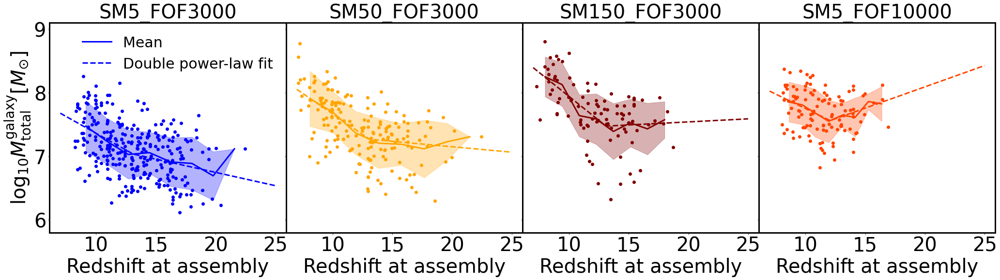

In [40]:
def bFOF_mass_model(z, slope_l, slope_u):
    y = np.zeros(z.shape)
    y += (z < z_trans) * (slope_l*(z-z_trans) + value)
    #print(y)
    y += (z > z_trans) * (slope_u*(z-z_trans) + value)
    return y
   

def fit_and_plot():
    global value
    a,b,c,d,e,f=get_info()
    std=(c-d)/2
    mask2=std>=0.1
    ax.set_title('SM%d_FOF%d'%(Msfmp,Mh),fontsize=label_fontsize)
    ax.errorbar(e,f-log10(h),color=col,marker='o',linewidth=0)
    ax.errorbar(a,b-log10(h),linewidth=3,color=col,label='Mean')
    ax.fill_between(a,c-log10(h),d-log10(h),alpha=0.3,color=col)
    gen_bFOF_mass=scipy.interpolate.interp1d(a,b,fill_value='extrapolate')
    value=gen_bFOF_mass(z_trans)
    print("LogMinHaloMassSeedingThresholdAverageTransition          ",value)
    print("TransitionRedshift        ",z_trans)
    popt=scipy.optimize.curve_fit(bFOF_mass_model,a[mask2],b[mask2])
    print("Slope_lowz       ",popt[0][0])
    print("Slope_highz      ",popt[0][1])
    
    print(std,numpy.mean(std))
    
    print("-----")

    z_space_cont = numpy.linspace(7,25,100)
    bFOF_mass_cont=bFOF_mass_model(z_space_cont,popt[0][0],popt[0][1])
    
    ax.errorbar(z_space_cont,bFOF_mass_cont-log10(h),linewidth=3,color=col,linestyle='dashed',label='Double power-law fit')
    ax.tick_params(labelsize=label_fontsize)
    ax.set_xlabel('Redshift at assembly',fontsize=label_fontsize)
    
    
    
fig,axx=plt.subplots(1,4,figsize=(35,8),sharex=True,sharey=True)
logseedmass=4.10
LogTargetGroupBHMass=4.10
ax=axx[3]
Msfmp=5
Mh=10000
Nbins=8
col='orangered'
z_trans=12.08
fit_and_plot()

Msfmp=150
Mh=3000
Nbins=8
ax=axx[2]
col='maroon'
z_trans=13.1
fit_and_plot()


Msfmp=50
Mh=3000
Nbins=8
ax=axx[1]
col='orange'
z_trans=13.1
fit_and_plot()


Msfmp=5
Mh=3000
Nbins=8
ax=axx[0]
col='blue'
z_trans=13.1
fit_and_plot()

axx[0].set_ylim(5.8,9.1)

axx[0].set_ylabel('$\log_{10}M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)
axx[0].legend(loc='upper right',fontsize=label_fontsize-10,frameon=False)



for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)  



plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper5_figures/bFOFmass_vs_redshift_at_assembly.png',bbox_inches='tight')


blackhole_seeding2_79.txt
blackhole_seeding2_99.txt
blackhole_seeding2_407.txt
blackhole_seeding2_374.txt
blackhole_seeding2_429.txt
blackhole_seeding2_409.txt
blackhole_seeding2_467.txt
blackhole_seeding2_39.txt
blackhole_seeding2_483.txt
blackhole_seeding2_495.txt
blackhole_seeding2_253.txt
blackhole_seeding2_193.txt
blackhole_seeding2_342.txt
blackhole_seeding2_292.txt
blackhole_seeding2_186.txt
blackhole_seeding2_142.txt
blackhole_seeding2_54.txt
blackhole_seeding2_461.txt
blackhole_seeding2_199.txt
blackhole_seeding2_140.txt
blackhole_seeding2_275.txt
blackhole_seeding2_169.txt
blackhole_seeding2_375.txt
blackhole_seeding2_135.txt
blackhole_seeding2_61.txt
blackhole_seeding2_256.txt
blackhole_seeding2_344.txt
blackhole_seeding2_78.txt
blackhole_seeding2_109.txt
blackhole_seeding2_230.txt
blackhole_seeding2_215.txt
blackhole_seeding2_119.txt
blackhole_seeding2_380.txt
blackhole_seeding2_396.txt
blackhole_seeding2_323.txt
blackhole_seeding2_202.txt
blackhole_seeding2_218.txt
blackho

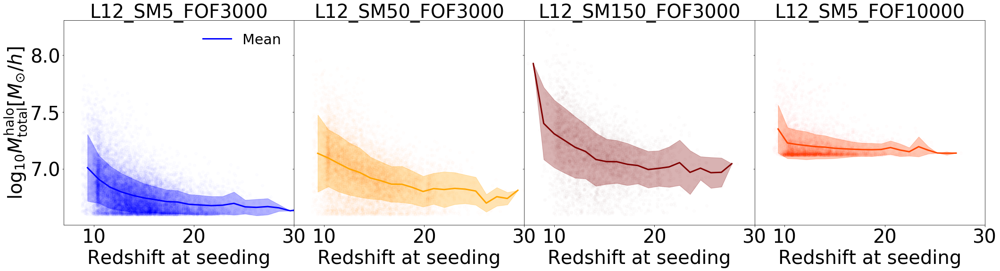

In [13]:
def bFOF_mass_model(z, slope_l, slope_u):
    y = np.zeros(z.shape)
    y += (z < z_trans) * (slope_l*(z-z_trans) + value)
    #print(y)
    y += (z > z_trans) * (slope_u*(z-z_trans) + value)
    return y
   

def fit_and_plot():
    global value
    a,b,c,d,e,f=get_info2()
    std=(c-d)/2
    mask2=std>=0.1
    ax.set_title('L12_SM%d_FOF%d'%(Msfmp,Mh),fontsize=label_fontsize)
    ax.errorbar(e,f,color=col,marker='o',linewidth=0,alpha=0.01)
    ax.errorbar(a,b,linewidth=3,color=col,label='Mean')
    ax.fill_between(a,c,d,alpha=0.3,color=col)
    gen_bFOF_mass=scipy.interpolate.interp1d(a,b,fill_value='extrapolate')
    value=gen_bFOF_mass(z_trans)
    #print("LogMinHaloMassSeedingThresholdAverageTransition          ",value)
    #print("TransitionRedshift        ",z_trans)
    #popt=scipy.optimize.curve_fit(bFOF_mass_model,a[mask2],b[mask2])
    #print("Slope_lowz       ",popt[0][0])
    #print("Slope_highz      ",popt[0][1])
    
    #print(std,numpy.mean(std))
    
    print("-----")

    z_space_cont = numpy.linspace(7,25,100)
    #bFOF_mass_cont=bFOF_mass_model(z_space_cont,popt[0][0],popt[0][1])
    
    #ax.errorbar(z_space_cont,bFOF_mass_cont,linewidth=3,color=col,linestyle='dashed',label='Double power-law fit')
    ax.tick_params(labelsize=label_fontsize)
    ax.set_xlabel('Redshift at seeding',fontsize=label_fontsize)
    
    
    
fig,axx=plt.subplots(1,4,figsize=(35,8),sharex=True,sharey=True)
logseedmass=4.10
LogTargetGroupBHMass=4.10
ax=axx[3]
Msfmp=5
Mh=10000
Nbins=8
col='orangered'
z_trans=12.08
fit_and_plot()

Msfmp=150
Mh=3000
Nbins=8
ax=axx[2]
col='maroon'
z_trans=13.1
fit_and_plot()


Msfmp=50
Mh=3000
Nbins=8
ax=axx[1]
col='orange'
z_trans=13.1
fit_and_plot()


Msfmp=5
Mh=3000
Nbins=8
ax=axx[0]
col='blue'
z_trans=13.1
fit_and_plot()

#axx[0].set_ylim(5.8,8.8)
axx[0].set_xlim(7,30)

axx[0].set_ylabel('$\log_{10}M^{\mathrm{halo}}_{\mathrm{total}}[M_{\odot}/h]$',fontsize=label_fontsize)
axx[0].legend(loc='upper right',fontsize=label_fontsize-10,frameon=False)

plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper5_figures/bFOFmass_vs_redshift_at_seed.png',bbox_inches='tight')


blackhole_seeding2_79.txt
blackhole_seeding2_99.txt
blackhole_seeding2_407.txt
blackhole_seeding2_374.txt
blackhole_seeding2_429.txt
blackhole_seeding2_409.txt
blackhole_seeding2_467.txt
blackhole_seeding2_39.txt
blackhole_seeding2_483.txt
blackhole_seeding2_495.txt
blackhole_seeding2_253.txt
blackhole_seeding2_193.txt
blackhole_seeding2_342.txt
blackhole_seeding2_292.txt
blackhole_seeding2_186.txt
blackhole_seeding2_142.txt
blackhole_seeding2_54.txt
blackhole_seeding2_461.txt
blackhole_seeding2_199.txt
blackhole_seeding2_140.txt
blackhole_seeding2_275.txt
blackhole_seeding2_169.txt
blackhole_seeding2_375.txt
blackhole_seeding2_135.txt
blackhole_seeding2_61.txt
blackhole_seeding2_256.txt
blackhole_seeding2_344.txt
blackhole_seeding2_78.txt
blackhole_seeding2_109.txt
blackhole_seeding2_230.txt
blackhole_seeding2_215.txt
blackhole_seeding2_119.txt
blackhole_seeding2_380.txt
blackhole_seeding2_396.txt
blackhole_seeding2_323.txt
blackhole_seeding2_202.txt
blackhole_seeding2_218.txt
blackho

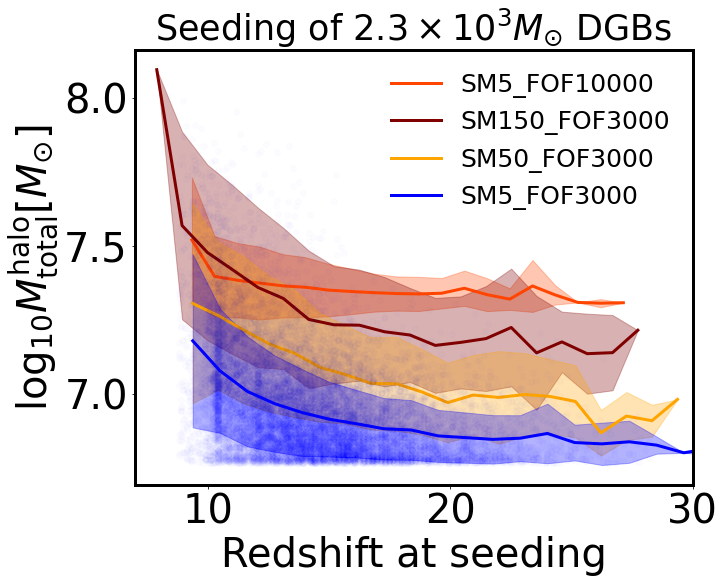

In [55]:
def bFOF_mass_model(z, slope_l, slope_u):
    y = np.zeros(z.shape)
    y += (z < z_trans) * (slope_l*(z-z_trans) + value)
    #print(y)
    y += (z > z_trans) * (slope_u*(z-z_trans) + value)
    return y
   

def fit_and_plot(scatter=0):
    global value
    a,b,c,d,e,f=get_info2()
    std=(c-d)/2
    mask2=std>=0.1
    ax.set_title(r'Seeding of $2.3\times10^3 M_{\odot}$ DGBs',fontsize=label_fontsize-5)
    if(scatter):
        ax.errorbar(e,f-log10(h),color=col,marker='o',linewidth=0,alpha=0.01)
    ax.errorbar(a,b-log10(h),linewidth=3,color=col,label='SM%d_FOF%d'%(Msfmp,Mh))
    ax.fill_between(a,c-log10(h),d-log10(h),alpha=0.3,color=col)
    gen_bFOF_mass=scipy.interpolate.interp1d(a,b,fill_value='extrapolate')
    value=gen_bFOF_mass(z_trans)
    #print("LogMinHaloMassSeedingThresholdAverageTransition          ",value)
    #print("TransitionRedshift        ",z_trans)
    #popt=scipy.optimize.curve_fit(bFOF_mass_model,a[mask2],b[mask2])
    #print("Slope_lowz       ",popt[0][0])
    #print("Slope_highz      ",popt[0][1])
    
    #print(std,numpy.mean(std))
    
    print("-----")

    z_space_cont = numpy.linspace(7,25,100)
    #bFOF_mass_cont=bFOF_mass_model(z_space_cont,popt[0][0],popt[0][1])
    
    #ax.errorbar(z_space_cont,bFOF_mass_cont,linewidth=3,color=col,linestyle='dashed',label='Double power-law fit')
    ax.tick_params(labelsize=label_fontsize)
    ax.set_xlabel('Redshift at seeding',fontsize=label_fontsize)
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)    
    
    
fig,axx=plt.subplots(1,1,figsize=(10,8),sharex=True,sharey=True)
logseedmass=4.10
LogTargetGroupBHMass=4.10
ax=axx
Msfmp=5
Mh=10000
Nbins=8
col='orangered'
z_trans=12.08
fit_and_plot()

Msfmp=150
Mh=3000
Nbins=8
ax=axx
col='maroon'
z_trans=13.1
fit_and_plot()


Msfmp=50
Mh=3000
Nbins=8
ax=axx
col='orange'
z_trans=13.1
fit_and_plot()


Msfmp=5
Mh=3000
Nbins=8
ax=axx
col='blue'
z_trans=13.1
fit_and_plot(scatter=1)

#axx[0].set_ylim(5.8,8.8)
axx.set_xlim(7,30)

axx.set_ylabel('$\log_{10}M^{\mathrm{halo}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)
axx.legend(loc='upper right',fontsize=label_fontsize-15,frameon=False)

plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper5_figures/FOFmass_vs_redshift_at_seed.png',bbox_inches='tight')


-----
-----
-----
-----


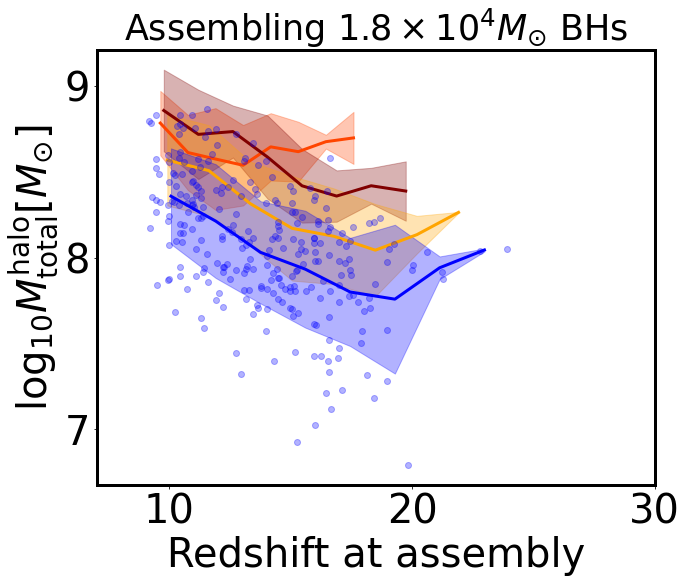

In [59]:
def bFOF_mass_model(z, slope_l, slope_u):
    y = np.zeros(z.shape)
    y += (z < z_trans) * (slope_l*(z-z_trans) + value)
    #print(y)
    y += (z > z_trans) * (slope_u*(z-z_trans) + value)
    return y
   

def fit_and_plot(scatter=0):
    global value
    a,b,c,d,e,f=get_info3()
    std=(c-d)/2
    mask2=std>=0.1
    ax.set_title(r'Assembling $1.8\times10^4 M_{\odot}$ BHs',fontsize=label_fontsize-5)
    if(scatter):
        ax.errorbar(e,f-log10(h),color=col,marker='o',linewidth=0,alpha=0.3)
    ax.errorbar(a,b-log10(h),linewidth=3,color=col,label='L12_SM%d_FOF%d'%(Msfmp,Mh))
    ax.fill_between(a,c-log10(h),d-log10(h),alpha=0.3,color=col)
    gen_bFOF_mass=scipy.interpolate.interp1d(a,b,fill_value='extrapolate')
    value=gen_bFOF_mass(z_trans)
    #print("LogMinHaloMassSeedingThresholdAverageTransition          ",value)
    #print("TransitionRedshift        ",z_trans)
    #popt=scipy.optimize.curve_fit(bFOF_mass_model,a[mask2],b[mask2])
    #print("Slope_lowz       ",popt[0][0])
    #print("Slope_highz      ",popt[0][1])
    
    #print(std,numpy.mean(std))
    
    print("-----")

    z_space_cont = numpy.linspace(7,25,100)
    #bFOF_mass_cont=bFOF_mass_model(z_space_cont,popt[0][0],popt[0][1])
    
    #ax.errorbar(z_space_cont,bFOF_mass_cont,linewidth=3,color=col,linestyle='dashed',label='Double power-law fit')
    ax.tick_params(labelsize=label_fontsize)
    ax.set_xlabel('Redshift at assembly',fontsize=label_fontsize)
    
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3) 
    
    
    
fig,axx=plt.subplots(1,1,figsize=(10,8),sharex=True,sharey=True)
logseedmass=4.10
LogTargetGroupBHMass=4.10
ax=axx
Msfmp=5
Mh=10000
Nbins=8
col='orangered'
z_trans=12.08
fit_and_plot()

Msfmp=150
Mh=3000
Nbins=8
ax=axx
col='maroon'
z_trans=13.1
fit_and_plot()


Msfmp=50
Mh=3000
Nbins=8
ax=axx
col='orange'
z_trans=13.1
fit_and_plot()


Msfmp=5
Mh=3000
Nbins=8
ax=axx
col='blue'
z_trans=13.1
fit_and_plot(scatter=1)

#axx[0].set_ylim(5.8,8.8)
axx.set_xlim(7,30)




axx.set_ylabel('$\log_{10}M^{\mathrm{halo}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)
#axx.legend(loc='lower right',fontsize=label_fontsize-22,frameon=False)

plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper5_figures/FOFmass_vs_redshift_at_assembly.png',bbox_inches='tight')


-----
-----
-----
-----


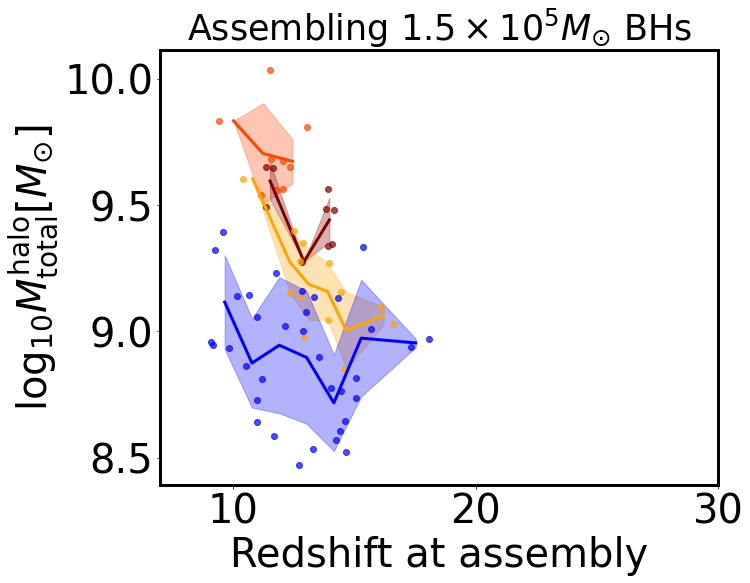

In [57]:
def bFOF_mass_model(z, slope_l, slope_u):
    y = np.zeros(z.shape)
    y += (z < z_trans) * (slope_l*(z-z_trans) + value)
    #print(y)
    y += (z > z_trans) * (slope_u*(z-z_trans) + value)
    return y
   

def fit_and_plot(scatter=0):
    global value
    a,b,c,d,e,f=get_info3()
    std=(c-d)/2
    mask2=std>=0.1
    ax.set_title(r'Assembling $1.5\times10^5 M_{\odot}$ BHs',fontsize=label_fontsize-5)
    if(scatter):
        ax.errorbar(e,f-log10(h),color=col,marker='o',linewidth=0,alpha=0.7)
    
    ax.errorbar(a,b-log10(h),linewidth=3,color=col,label='L12_SM%d_FOF%d'%(Msfmp,Mh))
    ax.fill_between(a,c-log10(h),d-log10(h),alpha=0.3,color=col)
    gen_bFOF_mass=scipy.interpolate.interp1d(a,b,fill_value='extrapolate')
    value=gen_bFOF_mass(z_trans)
    #print("LogMinHaloMassSeedingThresholdAverageTransition          ",value)
    #print("TransitionRedshift        ",z_trans)
    #popt=scipy.optimize.curve_fit(bFOF_mass_model,a[mask2],b[mask2])
    #print("Slope_lowz       ",popt[0][0])
    #print("Slope_highz      ",popt[0][1])
    
    #print(std,numpy.mean(std))
    
    print("-----")

    z_space_cont = numpy.linspace(7,25,100)
    #bFOF_mass_cont=bFOF_mass_model(z_space_cont,popt[0][0],popt[0][1])
    
    #ax.errorbar(z_space_cont,bFOF_mass_cont,linewidth=3,color=col,linestyle='dashed',label='Double power-law fit')
    ax.tick_params(labelsize=label_fontsize)
    ax.set_xlabel('Redshift at assembly',fontsize=label_fontsize)
    
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)
    
    
    
fig,axx=plt.subplots(1,1,figsize=(10,8),sharex=True,sharey=True)
logseedmass=4.10
LogTargetGroupBHMass=5.00
ax=axx
Msfmp=5
Mh=10000
Nbins=3
col='orangered'
z_trans=12.08
fit_and_plot(scatter=1)

Msfmp=150
Mh=3000
Nbins=8
ax=axx
col='maroon'
z_trans=13.1
fit_and_plot(scatter=1)


Msfmp=50
Mh=3000
Nbins=8
ax=axx
col='orange'
z_trans=13.1
fit_and_plot(scatter=1)


Msfmp=5
Mh=3000
Nbins=8
ax=axx
col='blue'
z_trans=13.1
fit_and_plot(scatter=1)

#axx[0].set_ylim(5.8,8.8)
axx.set_xlim(7,30)

axx.set_ylabel('$\log_{10}M^{\mathrm{halo}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)
#axx.legend(loc='lower right',fontsize=label_fontsize-22,frameon=False)

plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper5_figures/FOFmass_vs_redshift_at_assembly_seed5.00.png',bbox_inches='tight')


-----
-----
-----
-----


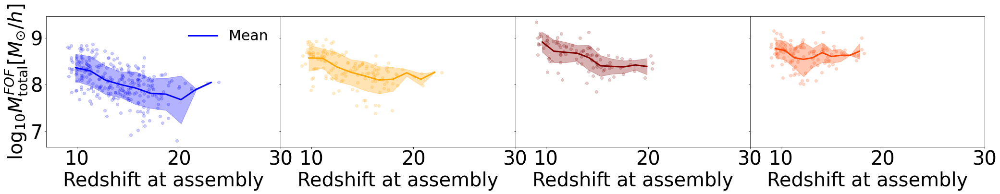

In [47]:
def bFOF_mass_model(z, slope_l, slope_u):
    y = np.zeros(z.shape)
    y += (z < z_trans) * (slope_l*(z-z_trans) + value)
    #print(y)
    y += (z > z_trans) * (slope_u*(z-z_trans) + value)
    return y
   

def fit_and_plot():
    global value
    a,b,c,d,e,f=get_info3()
    std=(c-d)/2
    mask2=std>=0.1
    #ax.set_title('L12_SM%d_FOF%d'%(Msfmp,Mh),fontsize=label_fontsize)
    ax.errorbar(e,f-log10(h),color=col,marker='o',linewidth=0,alpha=0.2)
    ax.errorbar(a,b-log10(h),linewidth=3,color=col,label='Mean')
    ax.fill_between(a,c-log10(h),d-log10(h),alpha=0.3,color=col)
    gen_bFOF_mass=scipy.interpolate.interp1d(a,b,fill_value='extrapolate')
    value=gen_bFOF_mass(z_trans)
    #print("LogMinHaloMassSeedingThresholdAverageTransition          ",value)
    #print("TransitionRedshift        ",z_trans)
    #popt=scipy.optimize.curve_fit(bFOF_mass_model,a[mask2],b[mask2])
    #print("Slope_lowz       ",popt[0][0])
    #print("Slope_highz      ",popt[0][1])
    
    #print(std,numpy.mean(std))
    
    print("-----")

    z_space_cont = numpy.linspace(7,25,100)
    #bFOF_mass_cont=bFOF_mass_model(z_space_cont,popt[0][0],popt[0][1])
    
    #ax.errorbar(z_space_cont,bFOF_mass_cont,linewidth=3,color=col,linestyle='dashed',label='Double power-law fit')
    ax.tick_params(labelsize=label_fontsize)
    ax.set_xlabel('Redshift at assembly',fontsize=label_fontsize)
     
    
    
fig,axx=plt.subplots(1,4,figsize=(35,5),sharex=True,sharey=True)
logseedmass=4.10
LogTargetGroupBHMass=4.10
ax=axx[3]
Msfmp=5
Mh=10000
Nbins=10
col='orangered'
z_trans=12.4
fit_and_plot()

Msfmp=150
Mh=3000

ax=axx[2]
col='maroon'
z_trans=15.2
fit_and_plot()


Msfmp=50
Mh=3000

ax=axx[1]
col='orange'
z_trans=15.2
fit_and_plot()


Msfmp=5
Mh=3000

ax=axx[0]
col='blue'
z_trans=15.2
fit_and_plot()

axx[0].set_xlim(7,30)

axx[0].set_ylabel('$\log_{10}M^{FOF}_{\mathrm{total}}[M_{\odot}/h]$',fontsize=label_fontsize)
axx[0].legend(loc='upper right',fontsize=label_fontsize-10,frameon=False)

plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper5_figures/FOFmass_vs_redshift_at_assembly.png',bbox_inches='tight')


-----
-----
-----
-----


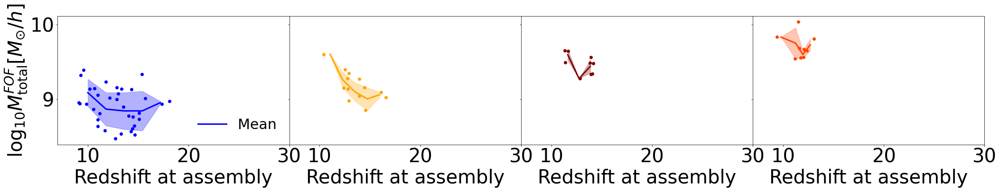

In [48]:
def bFOF_mass_model(z, slope_l, slope_u):
    slope_u=0
    y = np.zeros(z.shape)
    y += (z < z_trans) * (slope_l*(z-z_trans) + value)
    #print(y)
    y += (z > z_trans) * (slope_u*(z-z_trans) + value)
    return y
   
def fit_and_plot():
    global value
    a,b,c,d,e,f=get_info3()
    std=(c-d)/2
    mask2=std>=0.1
    #ax.set_title('L12_SM%d_FOF%d'%(Msfmp,Mh),fontsize=label_fontsize)
    ax.errorbar(e,f-log10(h),color=col,marker='o',linewidth=0,alpha=1)
    ax.errorbar(a,b-log10(h),linewidth=3,color=col,label='Mean')
    ax.fill_between(a,c-log10(h),d-log10(h),alpha=0.3,color=col)
    gen_bFOF_mass=scipy.interpolate.interp1d(a,b,fill_value='extrapolate')
    value=gen_bFOF_mass(z_trans)
    #print("LogMinHaloMassSeedingThresholdAverageTransition          ",value)
    #print("TransitionRedshift        ",z_trans)
    #popt=scipy.optimize.curve_fit(bFOF_mass_model,a[mask2],b[mask2])
    #print("Slope_lowz       ",popt[0][0])
    #print("Slope_highz      ",popt[0][1])
    
    #print(std,numpy.mean(std))
    
    print("-----")

    z_space_cont = numpy.linspace(7,25,100)
    #bFOF_mass_cont=bFOF_mass_model(z_space_cont,popt[0][0],popt[0][1])
    
    #ax.errorbar(z_space_cont,bFOF_mass_cont,linewidth=3,color=col,linestyle='dashed',label='Double power-law fit')
    ax.tick_params(labelsize=label_fontsize)
    ax.set_xlabel('Redshift at assembly',fontsize=label_fontsize)
     
    
    
fig,axx=plt.subplots(1,4,figsize=(35,5),sharex=True,sharey=True)
logseedmass=5.00
LogTargetGroupBHMass=5.00
ax=axx[3]
Msfmp=5
Mh=10000
Nbins=5
col='orangered'
z_trans=12.08
fit_and_plot()


Msfmp=150
Mh=3000

ax=axx[2]
col='maroon'
z_trans=13.1
fit_and_plot()


Msfmp=50
Mh=3000

ax=axx[1]
col='orange'
z_trans=13.1
fit_and_plot()


Msfmp=5
Mh=3000

ax=axx[0]
col='blue'
z_trans=13.1
fit_and_plot()

axx[0].set_ylabel('$\log_{10}M^{FOF}_{\mathrm{total}}[M_{\odot}/h]$',fontsize=label_fontsize)
axx[0].legend(loc='lower right',fontsize=label_fontsize-10,frameon=False)

#axx[0].set_ylim(5.8,10)

axx[0].set_xlim(7,30)

plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper5_figures/FOFmass_vs_redshift_at_assembly_seed5.00.png',bbox_inches='tight')


LogMinHaloMassSeedingThresholdAverageTransition           8.460322220641533
TransitionRedshift         12.08
Slope_lowz        -0.02404257090952444
Slope_highz       1.0
[0.18773834 0.13083485 0.22604216] 0.18153845301139585
-----
LogMinHaloMassSeedingThresholdAverageTransition           8.416881194245175
TransitionRedshift         13.1
Slope_lowz        -0.060257261500472524
Slope_highz       1.0
[0.20665891 0.28708685] 0.24687287955523995
-----
LogMinHaloMassSeedingThresholdAverageTransition           8.103914600602977
TransitionRedshift         13.1
Slope_lowz        -0.06770609806889932
Slope_highz       1.0
[0.26885625 0.30425299] 0.2865546171970488
-----
LogMinHaloMassSeedingThresholdAverageTransition           7.7282181026874985
TransitionRedshift         13.1
Slope_lowz        -0.12002048006344865
Slope_highz       1.0
[0.25403565 0.34358217] 0.29880890581013797
-----


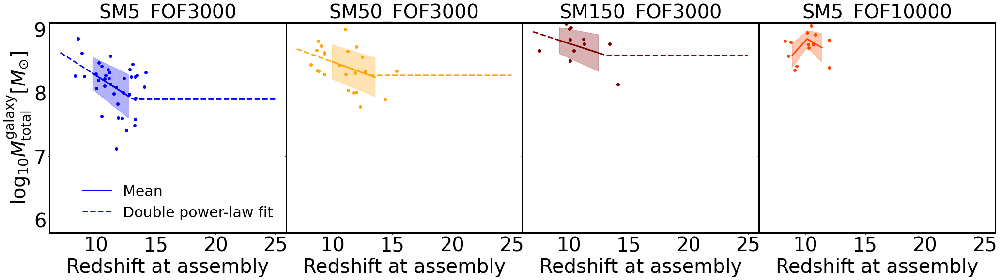

In [39]:
def bFOF_mass_model(z, slope_l, slope_u):
    slope_u=0
    y = np.zeros(z.shape)
    y += (z < z_trans) * (slope_l*(z-z_trans) + value)
    #print(y)
    y += (z > z_trans) * (slope_u*(z-z_trans) + value)
    return y
   

def fit_and_plot():
    global value
    a,b,c,d,e,f=get_info()
    std=(c-d)/2
    mask2=std>=0.1
    ax.set_title('SM%d_FOF%d'%(Msfmp,Mh),fontsize=label_fontsize)
    ax.errorbar(e,f-log10(h),color=col,marker='o',linewidth=0)
    ax.errorbar(a,b-log10(h),linewidth=3,color=col,label='Mean')
    ax.fill_between(a,c-log10(h),d-log10(h),alpha=0.3,color=col)
    gen_bFOF_mass=scipy.interpolate.interp1d(a,b,fill_value='extrapolate')
    value=gen_bFOF_mass(z_trans)
    
    print("LogMinHaloMassSeedingThresholdAverageTransition          ",value)
    print("TransitionRedshift        ",z_trans)
    popt=scipy.optimize.curve_fit(bFOF_mass_model,a[mask2],b[mask2])
    print("Slope_lowz       ",popt[0][0])
    print("Slope_highz      ",popt[0][1])
    
    print(std,numpy.mean(std))
    
    print("-----")

    z_space_cont = numpy.linspace(7,25,100)
    bFOF_mass_cont=bFOF_mass_model(z_space_cont,popt[0][0],popt[0][1])
    if(Mh!=10000):
        ax.errorbar(z_space_cont,bFOF_mass_cont-log10(h),linewidth=3,color=col,linestyle='dashed',label='Double power-law fit')
    ax.tick_params(labelsize=label_fontsize)
    ax.set_xlabel('Redshift at assembly',fontsize=label_fontsize)
    
    
    
fig,axx=plt.subplots(1,4,figsize=(35,8),sharex=True,sharey=True)
logseedmass=4.10
LogTargetGroupBHMass=5.00
ax=axx[3]
Msfmp=5
Mh=10000
Nbins=3
col='orangered'
z_trans=12.08
fit_and_plot()

Nbins=2
Msfmp=150
Mh=3000

ax=axx[2]
col='maroon'
z_trans=13.1
fit_and_plot()


Msfmp=50
Mh=3000

ax=axx[1]
col='orange'
z_trans=13.1
fit_and_plot()


Msfmp=5
Mh=3000
Nbins=2
ax=axx[0]
col='blue'
z_trans=13.1
fit_and_plot()

axx[0].set_ylabel('$\log_{10}M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)
axx[0].legend(loc='lower right',fontsize=label_fontsize-10,frameon=False)

axx[0].set_ylim(5.8,9.1)


for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3) 

plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper5_figures/bFOFmass_vs_redshift_at_assembly_seed5.00.png',bbox_inches='tight')


In [ ]:
def bFOF_mass_model(z, slope_l, slope_u):
    y = np.zeros(z.shape)
    y += (z < z_trans) * (slope_l*(z-z_trans) + value)
    #print(y)
    y += (z > z_trans) * (slope_u*(z-z_trans) + value)
    return y
   

def fit_and_plot():
    global value
    a,b,c,d,e,f=get_info()
    std=(c-d)/2
    mask2=std>=0.1
    ax.set_title('L12_SM%d_FOF%d'%(Msfmp,Mh),fontsize=label_fontsize)
    ax.errorbar(e,f,color=col,marker='o',linewidth=0)
    ax.errorbar(a,b,linewidth=3,color=col,label='Mean')
    ax.fill_between(a,c,d,alpha=0.3,color=col)
    gen_bFOF_mass=scipy.interpolate.interp1d(a,b,fill_value='extrapolate')
    value=gen_bFOF_mass(z_trans)
    print("value:",value)
    print("z_trans:",z_trans)
    popt=scipy.optimize.curve_fit(bFOF_mass_model,a[mask2],b[mask2])
    print("Slope l:",popt[0][0])
    print("Slope u:",popt[0][1])

    z_space_cont = numpy.linspace(7,25,100)
    bFOF_mass_cont=bFOF_mass_model(z_space_cont,popt[0][0],popt[0][1])
    
    ax.errorbar(z_space_cont,bFOF_mass_cont,linewidth=3,color=col,linestyle='dashed',label='Double power-law fit')
    ax.tick_params(labelsize=label_fontsize)
    ax.set_xlabel('Redshift at assembly',fontsize=label_fontsize)
    
    
    
fig,axx=plt.subplots(1,4,figsize=(35,8),sharex=True,sharey=True)
ax=axx[3]
Msfmp=5
Mh=10000
Nbins=8
col='orangered'
z_trans=12.08
fit_and_plot()

Msfmp=150
Mh=3000
Nbins=8
ax=axx[2]
col='maroon'
z_trans=13.1
fit_and_plot()


Msfmp=50
Mh=3000
Nbins=8
ax=axx[1]
col='orange'
z_trans=13.1
fit_and_plot()


Msfmp=5
Mh=3000
Nbins=8
ax=axx[0]
col='blue'
z_trans=13.1
fit_and_plot()

axx[0].set_ylabel('$\log_{10}M^{bFOF}_{\mathrm{total}}[M_{\odot}/h]$',fontsize=label_fontsize)
axx[0].legend(loc='upper right',fontsize=label_fontsize-10,frameon=False)

plt.subplots_adjust(wspace=0,hspace=0)
plt.savefig('./Paper5_figures/bFOFmass_vs_redshift_at_assembly.png',bbox_inches='tight')


In [16]:

def do():
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_SFMFGM%d_FOF%d_seed3.19_env_normal/'%(Msfmp,Mh)
    basePath=path_to_output+run+output

    redshift_space=numpy.arange(7,25)



    Mseed=1.5625e3

    z_space=[]
    n0_space=[]
    n1_space=[]
    n2_space=[]
    n3_space=[]
    for zz in redshift_space:
        try:
            print(zz)
            
            GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',zz)
            GroupMass1=GroupMassType[:,1]
            GroupMass2=GroupMassType[:,2]
            LowResFraction=GroupMass2/(GroupMass1+GroupMass2)
            
            GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',zz)
            GroupStarFormingGasMass,o=arepo_package.get_group_property(basePath,'GroupStarFormingGasMass',zz)
            GroupStarFormingMetalFreeGasMass,o=arepo_package.get_group_property(basePath,'GroupStarFormingMetalFreeGasMass',zz)
            masklow=LowResFraction==0
            mask0=(GroupMass>t0/1e10)&masklow
            mask1=(GroupMass>t1*Mseed/1e10)&masklow
            mask2=(GroupStarFormingGasMass>t2*Mseed/1e10)&masklow
            mask3=(GroupStarFormingMetalFreeGasMass>t2*Mseed/1e10)&masklow
            n0_space.append(len(GroupMass[mask0]))
            n1_space.append(len(GroupMass[mask1]))
            n2_space.append(len(GroupMass[mask2]))
            n3_space.append(len(GroupMass[mask3]))
            z_space.append(o)
        except:
            aaaa=1
    n0_space=numpy.array(n0_space)
    n1_space=numpy.array(n1_space)
    n2_space=numpy.array(n2_space)
    n3_space=numpy.array(n3_space)
    z_space=numpy.array(z_space)
    numpy.save(basePath+'halo_numbers3.19_%d_%d.npy'%(t1,t2),[z_space,n1_space,n2_space,n3_space,n0_space])
    return z_space,n1_space,n2_space,n3_space




In [15]:
levelmax_gas=12
logseedmass_gas=3.19

Msfmp,Mh=150,3000
t0=1e6
t1=3000
t2=5
z_space,n1_space,n2_space,n3_space=do()


t1=3000
t2=50
z_space,n1_space,n2_space,n3_space=do()

t1=3000
t2=150
z_space,n1_space,n2_space,n3_space=do()


t1=10000
t2=5
z_space,n1_space,n2_space,n3_space=do()



7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24


[12438. 12438. 10546. 10142.  7599.  5738.  4073.  3094.  2323.  1716.
  1338.  1010.   739.   519.   329.   206.   112.    66.]
[1295. 1295. 1195. 1326. 1082. 1043.  908.  796.  644.  468.  343.  262.
  171.  100.   61.   30.   15.    8.]
[427. 427. 464. 422. 347. 311. 279. 249. 219. 183. 129.  97.  62.  39.
  21.   7.   3.   2.]
[12438. 12438. 10546. 10142.  7599.  5738.  4073.  3094.  2323.  1716.
  1338.  1010.   739.   519.   329.   206.   112.    66.]


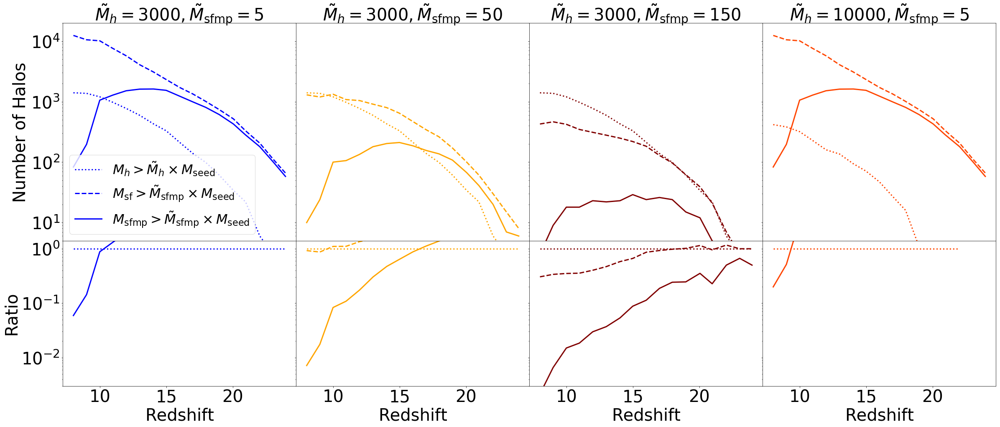

In [7]:
def make_plot(ax0,ax1,col):
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    
    
    z_space,n1_space,n2_space,n3_space,n0_space=numpy.load(basePath+'halo_numbers4.10_%d_%d.npy'%(t1,t2))
    #ax0.errorbar(z_space,n0_space,linewidth=3,color='black')
    ax0.errorbar(z_space,n1_space,linewidth=3,color=col,linestyle='dotted',label=r'$M_h > \tilde{M}_h \times M_{\mathrm{seed}}$')
    ax0.errorbar(z_space,n2_space,linewidth=3,color=col,linestyle='dashed',label=r'$M_{\mathrm{sf}}>\tilde{M}_{\mathrm{sfmp}} \times M_{\mathrm{seed}}$')
    ax0.errorbar(z_space,n3_space,linewidth=3,color=col,label=r'$M_{\mathrm{sfmp}}> \tilde{M}_{\mathrm{sfmp}}\times M_{\mathrm{seed}}$')
    ax0.set_yscale('log')
    ax1.errorbar(z_space,n1_space/n1_space,linewidth=3,color=col,linestyle='dotted')
    ax1.errorbar(z_space,n2_space/n1_space,linewidth=3,color=col,linestyle='dashed',label='Dashed/Dotted')
    ax1.errorbar(z_space,n3_space/n1_space,linewidth=3,color=col,label='Solid/Dotted')
    print(n2_space)
    ax0.set_yscale('log')
    ax1.set_yscale('log')
    
    ax0.set_ylim(5,20000)
    ax1.set_ylim(3e-3,1.4)
    ax0.tick_params(labelsize=label_fontsize)
    ax1.tick_params(labelsize=label_fontsize)
    ax1.set_xlabel('Redshift',fontsize=label_fontsize)


f,axx=plt.subplots(2,4,figsize=(40,16),sharex=True,gridspec_kw={'height_ratios': [3, 2]})

t1=3000
t2=5



ax0=axx[0,0]
ax1=axx[1,0]
ax0.set_title(r'$\tilde{M}_h = %d,\tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)
col='blue'
make_plot(ax0,ax1,col)


t1=3000
t2=50
ax0=axx[0,1]
ax1=axx[1,1]
ax0.set_title(r'$\tilde{M}_h = %d, \tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)
ax0.tick_params(labelleft='off')
ax1.tick_params(labelleft='off')
col='orange'
make_plot(ax0,ax1,col)


t1=3000
t2=150
ax0=axx[0,2]
ax1=axx[1,2]
ax0.set_title(r'$\tilde{M}_h = %d, \tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)
ax0.tick_params(labelleft='off')
ax1.tick_params(labelleft='off')
col='maroon'
make_plot(ax0,ax1,col)



t1=10000
t2=5
ax0=axx[0,3]
ax1=axx[1,3]
ax0.set_title(r'$\tilde{M}_h = %d, \tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)

ax0.tick_params(labelleft='off')
ax1.tick_params(labelleft='off')
col='orangered'
make_plot(ax0,ax1,col)


axx[0,0].set_ylabel('Number of Halos',fontsize=label_fontsize)

axx[1,0].set_ylabel('Ratio',fontsize=label_fontsize)

axx[0,0].legend(loc='lower left',fontsize=label_fontsize-8)

plt.subplots_adjust(hspace=0,wspace=0)


#axx[2].set_yscale('log')









[17886. 17886. 15443. 14442. 11384.  8711.  6639.  5213.  4126.  3368.
  2668.  2383.  1823.  1350.   973.   620.   393.   261.]
[8158. 8158. 6761. 6603. 4943. 3758. 2656. 2047. 1633. 1230.  957.  746.
  570.  389.  246.  151.   79.   48.]
[1616. 1616. 1290. 1720. 1470. 1425. 1276. 1133.  943.  712.  542.  416.
  296.  195.  111.   60.   33.   20.]
[17886. 17886. 15443. 14442. 11384.  8711.  6639.  5213.  4126.  3368.
  2668.  2383.  1823.  1350.   973.   620.   393.   261.]


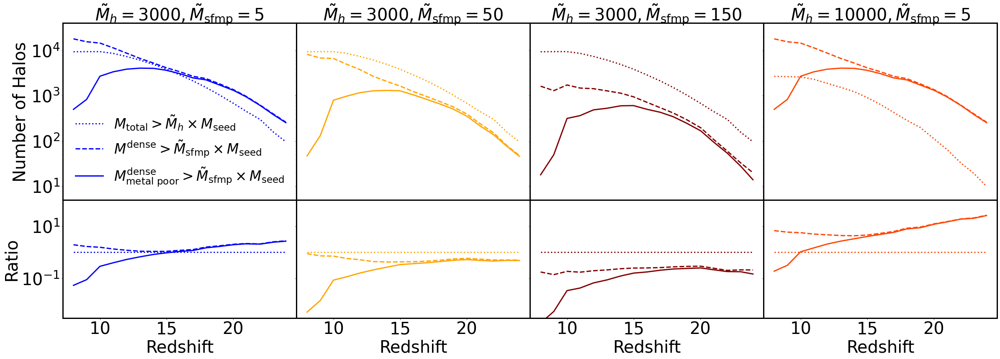

In [4]:
def make_plot(ax0,ax1,col):
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    
    z_space,n1_space,n2_space,n3_space,n0_space=numpy.load(basePath+'halo_numbers3.19_%d_%d.npy'%(t1,t2))
    #ax0.errorbar(z_space,n0_space,linewidth=3,color='black')
    ax0.errorbar(z_space,n1_space,linewidth=3,color=col,linestyle='dotted',label=r'$M_{\mathrm{total}} > \tilde{M}_h \times M_{\mathrm{seed}}$')
    ax0.errorbar(z_space,n2_space,linewidth=3,color=col,linestyle='dashed',label=r'$M^{\mathrm{dense}}>\tilde{M}_{\mathrm{sfmp}} \times M_{\mathrm{seed}}$')
    ax0.errorbar(z_space,n3_space,linewidth=3,color=col,label=r'$M^{\mathrm{dense}}_{\mathrm{metal \ poor}}> \tilde{M}_{\mathrm{sfmp}}\times M_{\mathrm{seed}}$')

    #z_space,n1_space,n2_space,n3_space,n0_space=numpy.load(basePath+'halo_numbers3.19_%d_%d_ll.npy'%(t1,t2))
    #ax0.errorbar(z_space,n0_space,linewidth=3,color='black')
    #ax0.errorbar(z_space,n3_space,linewidth=3,color='black',label=r'$M^{\mathrm{SF}}_{\mathrm{metal \ poor}}> \tilde{M}_{\mathrm{sfmp}}\times M_{\mathrm{seed}}$')
   
    
    ax0.set_yscale('log')
    ax1.errorbar(z_space,n1_space/n1_space,linewidth=3,color=col,linestyle='dotted')
    ax1.errorbar(z_space,n2_space/n1_space,linewidth=3,color=col,linestyle='dashed',label='Dashed/Dotted')
    ax1.errorbar(z_space,n3_space/n1_space,linewidth=3,color=col,label='Solid/Dotted')
    print(n2_space)
    ax0.set_yscale('log')
    ax1.set_yscale('log')
    
    ax0.set_ylim(5,40000)
    ax1.set_ylim(3e-3,1e2)
    ax0.tick_params(labelsize=label_fontsize)
    ax1.tick_params(labelsize=label_fontsize)
    ax1.set_xlabel('Redshift',fontsize=label_fontsize)


f,axx=plt.subplots(2,4,figsize=(40,13),sharex=True,gridspec_kw={'height_ratios': [3, 2]})

Msfmp,Mh=5,3000

t1=3000
t2=5



ax0=axx[0,0]
ax1=axx[1,0]
ax0.set_title(r'$\tilde{M}_h = %d,\tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)
col='blue'
make_plot(ax0,ax1,col)


t1=3000
t2=50
ax0=axx[0,1]
ax1=axx[1,1]
ax0.set_title(r'$\tilde{M}_h = %d, \tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)
ax0.tick_params(labelleft='off')
ax1.tick_params(labelleft='off')
col='orange'
make_plot(ax0,ax1,col)


t1=3000
t2=150
ax0=axx[0,2]
ax1=axx[1,2]
ax0.set_title(r'$\tilde{M}_h = %d, \tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)
ax0.tick_params(labelleft='off')
ax1.tick_params(labelleft='off')
col='maroon'
make_plot(ax0,ax1,col)



t1=10000
t2=5
ax0=axx[0,3]
ax1=axx[1,3]
ax0.set_title(r'$\tilde{M}_h = %d, \tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)

ax0.tick_params(labelleft='off')
ax1.tick_params(labelleft='off')
col='orangered'
make_plot(ax0,ax1,col)


axx[0,0].set_ylabel('Number of Halos',fontsize=label_fontsize)

axx[1,0].set_ylabel('Ratio',fontsize=label_fontsize)

axx[0,0].legend(loc='lower left',fontsize=label_fontsize-7,frameon=False)

plt.subplots_adjust(hspace=0,wspace=0)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)  # Right axis
    
for i in range(1,4):
    axx[0,i].tick_params(labelleft=0)
    axx[1,i].tick_params(labelleft=0)
    

plt.savefig('./Paper5_figures/Number_of_halos.png',bbox_inches='tight')


#axx[2].set_yscale('log')









[ 836.  836. 1017. 2630. 2387. 2001. 1567. 1385. 1080.  797.  561.  343.
  228.  150.   93.   47.   27.   14.]
[ 694.  694.  789. 1533. 1245. 1019.  756.  590.  427.  293.  178.  120.
   67.   41.   17.   10.    5.    0.]
[559. 559. 582. 935. 717. 614. 421. 333. 243. 149. 102.  59.  34.  16.
   8.   1.   0.   0.]
[ 836.  836. 1017. 2630. 2387. 2001. 1567. 1385. 1080.  797.  561.  343.
  228.  150.   93.   47.   27.   14.]


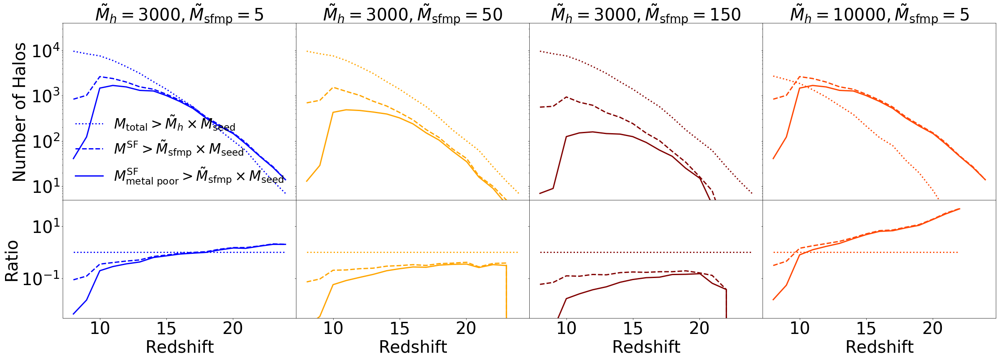

In [19]:
def make_plot(ax0,ax1,col):
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_SFMFGM%d_FOF%d_seed3.19_env_normal/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    
    z_space,n1_space,n2_space,n3_space,n0_space=numpy.load(basePath+'halo_numbers3.19_%d_%d.npy'%(t1,t2))
    #ax0.errorbar(z_space,n0_space,linewidth=3,color='black')
    ax0.errorbar(z_space,n1_space,linewidth=3,color=col,linestyle='dotted',label=r'$M_{\mathrm{total}} > \tilde{M}_h \times M_{\mathrm{seed}}$')
    ax0.errorbar(z_space,n2_space,linewidth=3,color=col,linestyle='dashed',label=r'$M^{\mathrm{SF}}>\tilde{M}_{\mathrm{sfmp}} \times M_{\mathrm{seed}}$')
    ax0.errorbar(z_space,n3_space,linewidth=3,color=col,label=r'$M^{\mathrm{SF}}_{\mathrm{metal \ poor}}> \tilde{M}_{\mathrm{sfmp}}\times M_{\mathrm{seed}}$')

    #z_space,n1_space,n2_space,n3_space,n0_space=numpy.load(basePath+'halo_numbers3.19_%d_%d_ll.npy'%(t1,t2))
    #ax0.errorbar(z_space,n0_space,linewidth=3,color='black')
    #ax0.errorbar(z_space,n3_space,linewidth=3,color='black',label=r'$M^{\mathrm{SF}}_{\mathrm{metal \ poor}}> \tilde{M}_{\mathrm{sfmp}}\times M_{\mathrm{seed}}$')
   
    
    ax0.set_yscale('log')
    ax1.errorbar(z_space,n1_space/n1_space,linewidth=3,color=col,linestyle='dotted')
    ax1.errorbar(z_space,n2_space/n1_space,linewidth=3,color=col,linestyle='dashed',label='Dashed/Dotted')
    ax1.errorbar(z_space,n3_space/n1_space,linewidth=3,color=col,label='Solid/Dotted')
    print(n2_space)
    ax0.set_yscale('log')
    ax1.set_yscale('log')
    
    ax0.set_ylim(5,40000)
    ax1.set_ylim(3e-3,1e2)
    ax0.tick_params(labelsize=label_fontsize)
    ax1.tick_params(labelsize=label_fontsize)
    ax1.set_xlabel('Redshift',fontsize=label_fontsize)


f,axx=plt.subplots(2,4,figsize=(40,13),sharex=True,gridspec_kw={'height_ratios': [3, 2]})

Msfmp,Mh=150,3000

t1=3000
t2=5



ax0=axx[0,0]
ax1=axx[1,0]
ax0.set_title(r'$\tilde{M}_h = %d,\tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)
col='blue'
make_plot(ax0,ax1,col)


t1=3000
t2=50
ax0=axx[0,1]
ax1=axx[1,1]
ax0.set_title(r'$\tilde{M}_h = %d, \tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)
ax0.tick_params(labelleft='off')
ax1.tick_params(labelleft='off')
col='orange'
make_plot(ax0,ax1,col)


t1=3000
t2=150
ax0=axx[0,2]
ax1=axx[1,2]
ax0.set_title(r'$\tilde{M}_h = %d, \tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)
ax0.tick_params(labelleft='off')
ax1.tick_params(labelleft='off')
col='maroon'
make_plot(ax0,ax1,col)



t1=10000
t2=5
ax0=axx[0,3]
ax1=axx[1,3]
ax0.set_title(r'$\tilde{M}_h = %d, \tilde{M}_{\mathrm{sfmp}} = %d$'%(t1,t2),fontsize=label_fontsize)

ax0.tick_params(labelleft='off')
ax1.tick_params(labelleft='off')
col='orangered'
make_plot(ax0,ax1,col)


axx[0,0].set_ylabel('Number of Halos',fontsize=label_fontsize)

axx[1,0].set_ylabel('Ratio',fontsize=label_fontsize)

axx[0,0].legend(loc='lower left',fontsize=label_fontsize-7,frameon=False)

plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper5_figures/Number_of_halos.png',bbox_inches='tight')


#axx[2].set_yscale('log')









[1457. 1457. 1925. 3918. 3884. 3752. 3569. 3094. 2656. 2109. 1587. 1233.
  855.  607.  407.  254.  150.   88.]
[1205. 1205. 1469. 2747. 2524. 2391. 2149. 1893. 1618. 1257.  961.  738.
  532.  362.  229.  141.   80.   48.]
[1021. 1021. 1139. 1907. 1720. 1653. 1481. 1301. 1086.  824.  614.  473.
  327.  216.  123.   69.   41.   26.]
[ 748.  748. 1285. 2676. 2414. 2054. 1669. 1324.  989.  692.  463.  313.
  215.  121.   74.   39.   23.   12.]


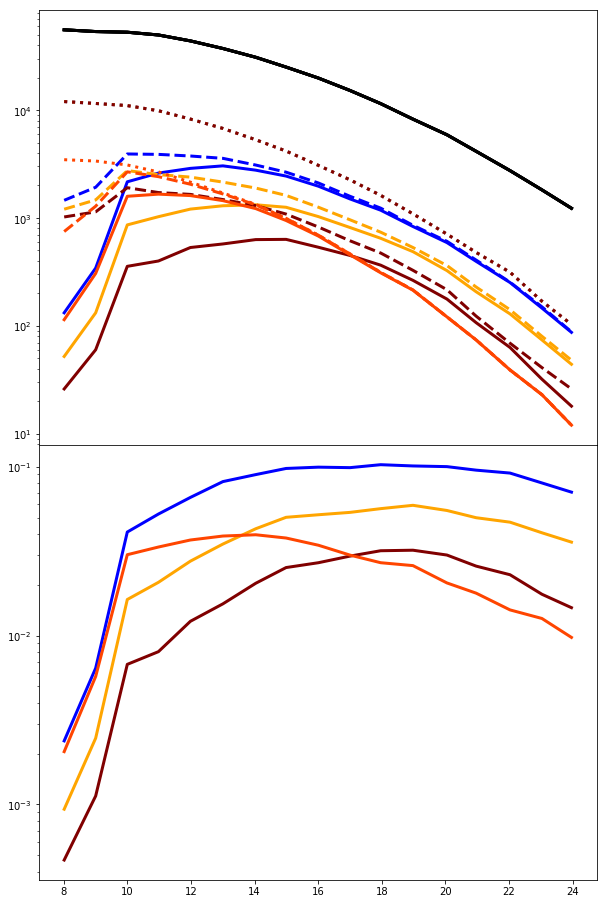

In [100]:




def make_plot(ax0,ax1,col):
    z_space,n1_space,n2_space,n3_space,n0_space=numpy.load(basePath+'halo_numbers_%d_%d.npy'%(t1,t2))
    ax0.errorbar(z_space,n0_space,linewidth=3,color='black')
    ax0.errorbar(z_space,n1_space,linewidth=3,color=col,linestyle='dotted')
    ax0.errorbar(z_space,n2_space,linewidth=3,color=col,linestyle='dashed')
    ax0.errorbar(z_space,n3_space,linewidth=3,color=col)
    ax.set_yscale('log')
    #ax1.errorbar(z_space,n1_space/n0_space,linewidth=3,color=col,linestyle='dotted')
    #ax1.errorbar(z_space,n2_space/n0_space,linewidth=3,color=col,linestyle='dashed')
    ax1.errorbar(z_space,n3_space/n0_space,linewidth=3,color=col)
    print(n2_space)
    ax0.set_yscale('log')
    ax1.set_yscale('log')
    
    #ax0.set_ylim(5,20000)
    #ax1.set_ylim(3e-3,1.4)


f,axx=plt.subplots(2,1,figsize=(10,16),sharex=True)

t1=3000
t2=5
ax0=axx[0]
ax1=axx[1]
col='blue'
make_plot(ax0,ax1,col)


t1=3000
t2=50
ax0=axx[0]
ax1=axx[1]
#ax0.tick_params(labelleft='off')
#ax1.tick_params(labelleft='off')
col='orange'
make_plot(ax0,ax1,col)


t1=3000
t2=150
ax0=axx[0]
ax1=axx[1]
#ax0.tick_params(labelleft='off')
#ax1.tick_params(labelleft='off')
col='maroon'
make_plot(ax0,ax1,col)



t1=10000
t2=5
ax0=axx[0]
ax1=axx[1]
#ax0.tick_params(labelleft='off')
#ax1.tick_params(labelleft='off')
col='orangered'
make_plot(ax0,ax1,col)



plt.subplots_adjust(hspace=0,wspace=0)


#axx[2].set_yscale('log')









In [3]:
iii=2.58
hhh=0.45

LogTargetGroupBHMass=4.10
redshift_cut=11

levelmax_gas=12
logseedmass_gas=3.19

levelmax=11
logseedmass=4.10



def get_info():
    #path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run

    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d_hightimeres_bFOF3'%(Mh,Msfmp)

    output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)


    basePath=path_to_output+run+output

    '''
    levelmax_gas=11
    logseedmass_gas=4.10
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_bFOF0/'
    basePath=path_to_output+run+output
    '''



    #target_redshift_space,target_LogGroupMass_space,target_LogGroupSFMPMass_space,target_LogGroupSFMass_space,min_redshift_space,max_redshift_space,LogGroupBHMass_min_redshift_space,LogGroupBHMass_max_redshift_space,GroupIndex_min_redshift_space,GroupIndex_max_redshift_space,target_LogGroupStellarMass_space,target_LogGroupSFR_space,target_LogGroupGasMetallicity_space,target_LogGroupStellarMetallicity_space,min_snap_space,max_snap_space,LogGroupMass_min_redshift_space,LogGroupMass_max_redshift_space=numpy.load(basePath+'/postprocessing/group_properties_seed%.2f_cleaned8.npy'%LogTargetGroupBHMass)

    data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_min_redshift_space=data[0]
    unique_LogGroupStellarMass_min_redshift_space=data[1]
    unique_LogGroupSFR_min_redshift_space=data[2]
    unique_LogGroupSF_min_redshift_space=data[3]
    unique_LogGroupSFMP_min_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
    unique_LogGroupGasMetallicity_min_redshift_space=data[6]
    unique_min_redshift_space=data[7]

    data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_max_redshift_space=data[0]
    unique_LogGroupStellarMass_max_redshift_space=data[1]
    unique_LogGroupSFR_max_redshift_space=data[2]
    unique_LogGroupSF_max_redshift_space=data[3]
    unique_LogGroupSFMP_max_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
    unique_LogGroupGasMetallicity_max_redshift_space=data[6]
    unique_max_redshift_space=data[7]

    data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_target_redshift_space=data[0]
    unique_LogGroupStellarMass_target_redshift_space=data[1]
    unique_LogGroupSFR_target_redshift_space=data[2]
    unique_LogGroupSF_target_redshift_space=data[3]
    unique_LogGroupSFMP_target_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
    unique_LogGroupGasMetallicity_target_redshift_space=data[6]
    unique_target_redshift_space=data[7]

    unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)
    mask=unique_target_redshift_space>6
    a,b,c,d=arepo_package.mean_plot(unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask],False,False,Nbins)
    #ax.errorbar(a,b,linewidth=3,color=col)
    
    return a,b,c,d,unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask]
    






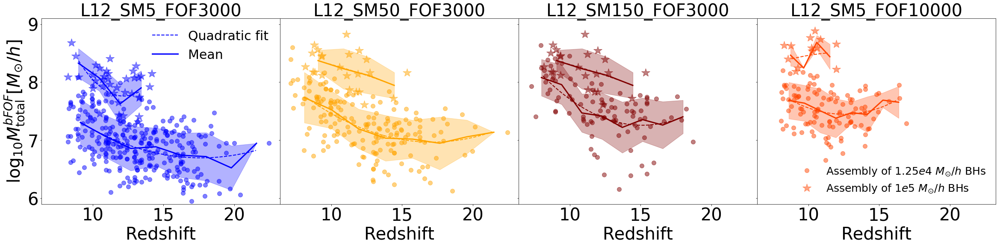

In [27]:
f,ax=plt.subplots(1,4,figsize=(40,8),sharex=True,sharey=True)


LogTargetGroupBHMass=4.10
Nbins=8


col='blue'

Msfmp=5
Mh=3000

axx=ax[0]
a,b,c,d,e,f=get_info()
axx.errorbar(e,f,linewidth=0,marker='o',ms=10,color=col,alpha=0.5)
axx.errorbar(a,b,linewidth=3,color=col,label='Mean')
axx.fill_between(a,c,d,alpha=0.3,color=col)
coff=numpy.polyfit(a,b,2)
z_space_con=numpy.linspace(7,25,100)
value_space=z_space_con**2*coff[0]+ z_space_con*coff[1]+ coff[2]
mask_min=z_space_con<max(a)
mask_max=z_space_con>min(a)
maskt=mask_min&mask_max
axx.plot(z_space_con[maskt],value_space[maskt],linewidth=2,color=col,linestyle='dashed',label='Quadratic fit')

axx=ax[1]
col='orange'
Msfmp=50
Mh=3000
a,b,c,d,e,f=get_info()
axx.errorbar(e,f,linewidth=0,marker='o',ms=10,color=col,alpha=0.5)
axx.errorbar(a,b,linewidth=3,color=col)
axx.fill_between(a,c,d,alpha=0.3,color=col)
coff=numpy.polyfit(a,b,2)
z_space_con=numpy.linspace(7,25,100)
value_space=z_space_con**2*coff[0]+ z_space_con*coff[1]+ coff[2]
mask_min=z_space_con<max(a)
mask_max=z_space_con>min(a)
maskt=mask_min&mask_max
axx.plot(z_space_con[maskt],value_space[maskt],linewidth=2,color=col,linestyle='dashed')


axx=ax[2]
col='maroon'
Msfmp=150
Mh=3000
a,b,c,d,e,f=get_info()
axx.errorbar(e,f,linewidth=0,marker='o',ms=10,color=col,alpha=0.5)
axx.errorbar(a,b,linewidth=3,color=col)
axx.fill_between(a,c,d,alpha=0.3,color=col)
coff=numpy.polyfit(a,b,2)
z_space_con=numpy.linspace(7,25,100)
value_space=z_space_con**2*coff[0]+ z_space_con*coff[1]+ coff[2]
mask_min=z_space_con<max(a)
mask_max=z_space_con>min(a)
maskt=mask_min&mask_max
axx.plot(z_space_con[maskt],value_space[maskt],linewidth=2,color=col,linestyle='dashed')

axx=ax[3]
col='orangered'
Msfmp=5
Mh=10000

a,b,c,d,e,f=get_info()
axx.errorbar(e,f,linewidth=0,marker='o',ms=10,color=col,alpha=0.5,label='Assembly of $1.25e4 \ M_{\odot}/h$ BHs')
axx.errorbar(a,b,linewidth=3,color=col)
axx.fill_between(a,c,d,alpha=0.3,color=col)
coff=numpy.polyfit(a,b,2)
z_space_con=numpy.linspace(7,25,100)
value_space=z_space_con**2*coff[0]+ z_space_con*coff[1]+ coff[2]
mask_min=z_space_con<max(a)
mask_max=z_space_con>min(a)
maskt=mask_min&mask_max
axx.plot(z_space_con[maskt],value_space[maskt],linewidth=2,color=col,linestyle='dashed')

LogTargetGroupBHMass=5.00
Nbins=4


col='blue'

Msfmp=5
Mh=3000
axx=ax[0]
a,b,c,d,e,f=get_info()
axx.errorbar(e,f,linewidth=0,marker='*',ms=20,color=col,alpha=0.5)
axx.errorbar(a,b,linewidth=3,color=col)
axx.fill_between(a,c,d,alpha=0.3,color=col)
coff=numpy.polyfit(a,b,2)
z_space_con=numpy.linspace(7,25,100)
value_space=z_space_con**2*coff[0]+ z_space_con*coff[1]+ coff[2]
mask_min=z_space_con<max(a)
mask_max=z_space_con>min(a)
maskt=mask_min&mask_max
axx.plot(z_space_con[maskt],value_space[maskt],linewidth=2,color=col,linestyle='dashed')


axx=ax[1]
col='orange'
Msfmp=50
Mh=3000
a,b,c,d,e,f=get_info()
axx.errorbar(e,f,linewidth=0,marker='*',ms=20,color=col,alpha=0.5)
axx.errorbar(a,b,linewidth=3,color=col)
axx.fill_between(a,c,d,alpha=0.3,color=col)
coff=numpy.polyfit(a,b,2)
z_space_con=numpy.linspace(7,25,100)
value_space=z_space_con**2*coff[0]+ z_space_con*coff[1]+ coff[2]
mask_min=z_space_con<max(a)
mask_max=z_space_con>min(a)
maskt=mask_min&mask_max
axx.plot(z_space_con[maskt],value_space[maskt],linewidth=2,color=col,linestyle='dashed')

axx=ax[2]
col='maroon'
Msfmp=50
Mh=3000
a,b,c,d,e,f=get_info()
axx.errorbar(e,f,linewidth=0,marker='*',ms=20,color=col,alpha=0.5)
axx.errorbar(a,b,linewidth=3,color=col)
axx.fill_between(a,c,d,alpha=0.3,color=col)
coff=numpy.polyfit(a,b,2)
z_space_con=numpy.linspace(7,25,100)
value_space=z_space_con**2*coff[0]+ z_space_con*coff[1]+ coff[2]
mask_min=z_space_con<max(a)
mask_max=z_space_con>min(a)
maskt=mask_min&mask_max
axx.plot(z_space_con[maskt],value_space[maskt],linewidth=2,color=col,linestyle='dashed')

axx=ax[3]
col='orangered'
Msfmp=5
Mh=10000
a,b,c,d,e,f=get_info()
axx.errorbar(e,f,linewidth=0,marker='*',ms=20,color=col,alpha=0.5,label='Assembly of $1e5 \ M_{\odot}/h$ BHs')
axx.errorbar(a,b,linewidth=3,color=col)
axx.fill_between(a,c,d,alpha=0.3,color=col)
coff=numpy.polyfit(a,b,2)
z_space_con=numpy.linspace(7,25,100)
value_space=z_space_con**2*coff[0]+ z_space_con*coff[1]+ coff[2]
mask_min=z_space_con<max(a)
mask_max=z_space_con>min(a)
maskt=mask_min&mask_max
axx.plot(z_space_con[maskt],value_space[maskt],linewidth=2,color=col,linestyle='dashed')


ax[0].tick_params(labelsize=label_fontsize)
ax[1].tick_params(labelsize=label_fontsize)
ax[2].tick_params(labelsize=label_fontsize)
ax[3].tick_params(labelsize=label_fontsize)


ax[0].set_title('L12_SM5_FOF3000',fontsize=label_fontsize)
ax[1].set_title('L12_SM50_FOF3000',fontsize=label_fontsize)
ax[2].set_title('L12_SM150_FOF3000',fontsize=label_fontsize)
ax[3].set_title('L12_SM5_FOF10000',fontsize=label_fontsize)


ax[0].set_xlabel('Redshift',fontsize=label_fontsize)
ax[1].set_xlabel('Redshift',fontsize=label_fontsize)
ax[2].set_xlabel('Redshift',fontsize=label_fontsize)
ax[3].set_xlabel('Redshift',fontsize=label_fontsize)

ax[0].set_ylabel('$\log_{10}M_{\mathrm{total}}^{bFOF}[M_{\odot}/h]$',fontsize=label_fontsize)

ax[3].legend(loc='lower right',fontsize=label_fontsize-15,frameon=False)
ax[0].legend(loc='upper right',fontsize=label_fontsize-10,frameon=False)
ax[0].set_ylim(5.9,9.1)
plt.subplots_adjust(hspace=0,wspace=0)

plt.savefig('./Paper5_figures/bFOFmass_vs_redshift_at_assembly.png',bbox_inches='tight')






In [7]:
def get_info():


    '''
    levelmax_gas=11
    logseedmass_gas=4.10
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_bFOF0/'
    basePath=path_to_output+run+output
    '''



    #target_redshift_space,target_LogGroupMass_space,target_LogGroupSFMPMass_space,target_LogGroupSFMass_space,min_redshift_space,max_redshift_space,LogGroupBHMass_min_redshift_space,LogGroupBHMass_max_redshift_space,GroupIndex_min_redshift_space,GroupIndex_max_redshift_space,target_LogGroupStellarMass_space,target_LogGroupSFR_space,target_LogGroupGasMetallicity_space,target_LogGroupStellarMetallicity_space,min_snap_space,max_snap_space,LogGroupMass_min_redshift_space,LogGroupMass_max_redshift_space=numpy.load(basePath+'/postprocessing/group_properties_seed%.2f_cleaned8.npy'%LogTargetGroupBHMass)

    data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_min_redshift_space=data[0]
    unique_LogGroupStellarMass_min_redshift_space=data[1]
    unique_LogGroupSFR_min_redshift_space=data[2]
    unique_LogGroupSF_min_redshift_space=data[3]
    unique_LogGroupSFMP_min_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
    unique_LogGroupGasMetallicity_min_redshift_space=data[6]
    unique_min_redshift_space=data[7]

    data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_max_redshift_space=data[0]
    unique_LogGroupStellarMass_max_redshift_space=data[1]
    unique_LogGroupSFR_max_redshift_space=data[2]
    unique_LogGroupSF_max_redshift_space=data[3]
    unique_LogGroupSFMP_max_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
    unique_LogGroupGasMetallicity_max_redshift_space=data[6]
    unique_max_redshift_space=data[7]

    data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_target_redshift_space=data[0]
    unique_LogGroupStellarMass_target_redshift_space=data[1]
    unique_LogGroupSFR_target_redshift_space=data[2]
    unique_LogGroupSF_target_redshift_space=data[3]
    unique_LogGroupSFMP_target_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
    unique_LogGroupGasMetallicity_target_redshift_space=data[6]
    unique_target_redshift_space=data[7]

    unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)
    mask=unique_target_redshift_space>6
    a,b,c,d=arepo_package.mean_plot(unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask],False,False,Nbins)
    #ax.errorbar(a,b,linewidth=3,color=col)
    
    return a,b,c,d,unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask]
    


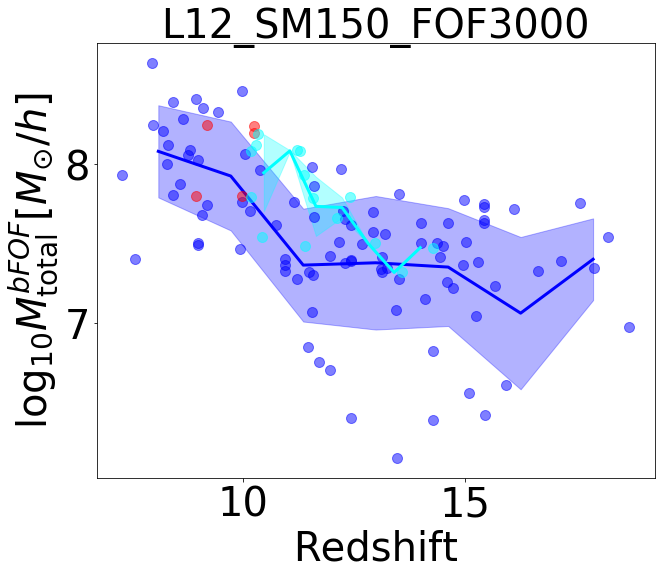

In [19]:
f,ax=plt.subplots(1,1,figsize=(10,8),sharex=True,sharey=True)


LogTargetGroupBHMass=4.10
Nbins=7




Msfmp=150
Mh=3000

    #path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
col='blue'
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
axx=ax
a,b,c,d,e,f=get_info()
axx.errorbar(e,f,linewidth=0,marker='o',ms=10,color=col,alpha=0.5)
axx.errorbar(a,b,linewidth=3,color=col,label='Mean')
axx.fill_between(a,c,d,alpha=0.3,color=col)

col='red'
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env_normal/'%(Msfmp,Mh)
basePath=path_to_output+run+output
axx=ax
a,b,c,d,e,f=get_info()
axx.errorbar(e,f,linewidth=0,marker='o',ms=10,color=col,alpha=0.5)


col='green'
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env_-2sigma/'%(Msfmp,Mh)
basePath=path_to_output+run+output
axx=ax
a,b,c,d,e,f=get_info()
axx.errorbar(e,f,linewidth=0,marker='o',ms=10,color=col,alpha=0.5)





col='cyan'
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env_1sigma/'%(Msfmp,Mh)
basePath=path_to_output+run+output
axx=ax
a,b,c,d,e,f=get_info()
axx.errorbar(e,f,linewidth=0,marker='o',ms=10,color=col,alpha=0.5)
axx.errorbar(a,b,linewidth=3,color=col,label='Mean')
axx.fill_between(a,c,d,alpha=0.3,color=col)





ax.tick_params(labelsize=label_fontsize)


ax.set_title('L12_SM150_FOF3000',fontsize=label_fontsize)

ax.set_xlabel('Redshift',fontsize=label_fontsize)

ax.set_ylabel('$\log_{10}M_{\mathrm{total}}^{bFOF}[M_{\odot}/h]$',fontsize=label_fontsize)

plt.subplots_adjust(hspace=0,wspace=0)

#plt.savefig('./Paper5_figures/bFOFmass_vs_redshift_at_assembly.png',bbox_inches='tight')






In [14]:
f

array([], dtype=float64)

Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16


Text(0, 0.5, 'Number of seeds')

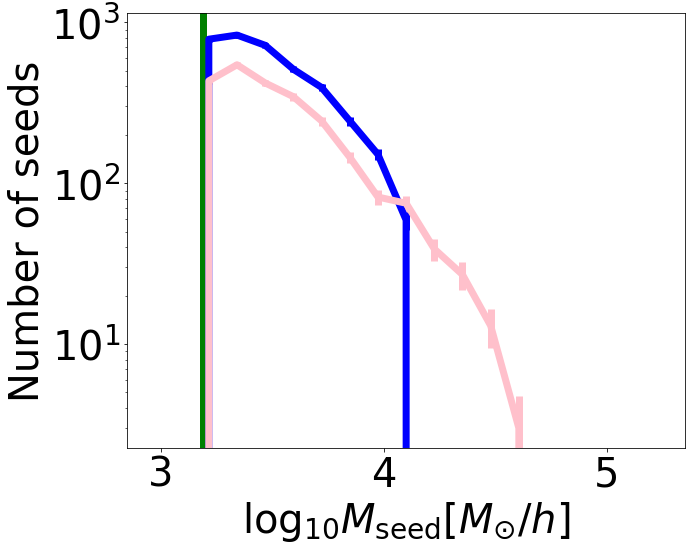

In [3]:
desired_redshift=9
basePath='/blue/lblecha/aklantbhowmick/code_development/AREPO/output_uni_test2/'
BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift,file_format='fof')

levelmax_gas,logseedmass_gas=12,3.19

Msfmp,Mh=50,3000

f,axx=plt.subplots(1,1,figsize=(10,8))
#path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,FOFDrawnSeedMass_complete=arepo_package.get_seeding_events4(basePath)
Nbins,minimum,maximum = 20,2.9,5.3
a,b,c=get_distribution(numpy.log10(FOFDrawnSeedMass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
#b/=norm
#c/=norm
axx.errorbar(a,b,c,marker='o',linewidth=7,color='blue',label='Seed halo mass threshold at seeding')

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_5.00_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,FOFDrawnSeedMass_complete=arepo_package.get_seeding_events4(basePath)
Nbins,minimum,maximum = 20,2.9,5.3
a,b,c=get_distribution(numpy.log10(FOFDrawnSeedMass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
#b/=norm
#c/=norm
axx.errorbar(a,b,c,marker='o',linewidth=7,color='pink',label='Seed halo mass threshold at seeding')

axx.axvline(3.19,color='green',linewidth=7)
axx.set_yscale('log')
axx.tick_params(labelsize=label_fontsize)

axx.set_xlabel('$\log_{10}M_{\mathrm{seed}}[M_{\odot}/h]$',fontsize=label_fontsize)

axx.set_ylabel('Number of seeds',fontsize=label_fontsize)






Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16


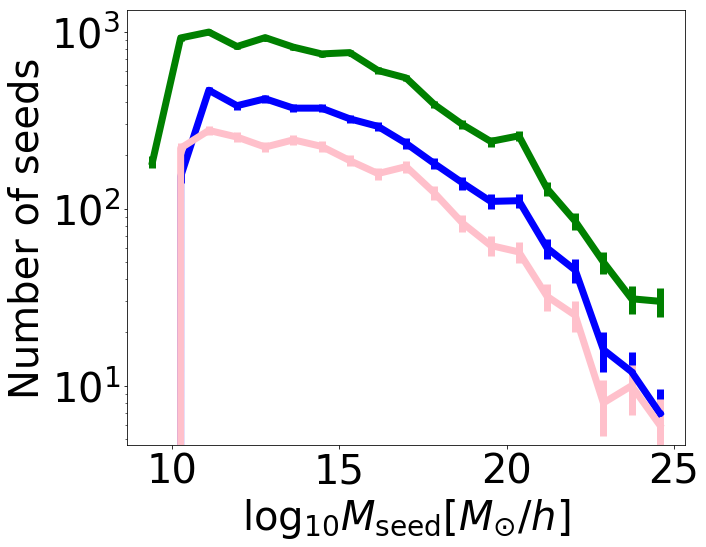

In [4]:
desired_redshift=9
basePath='/blue/lblecha/aklantbhowmick/code_development/AREPO/output_uni_test2/'
BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift,file_format='fof')

levelmax_gas,logseedmass_gas=12,3.19

Msfmp,Mh=50,3000

f,axx=plt.subplots(1,1,figsize=(10,8))
#path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,FOFDrawnSeedMass_complete=arepo_package.get_seeding_events4(basePath)
redshift_complete=1./scale_fac_complete-1

Nbins,minimum,maximum = 20,9,25
a,b,c=get_distribution(redshift_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
#b/=norm
#c/=norm
axx.errorbar(a,b,c,marker='o',linewidth=7,color='blue',label='Seed halo mass threshold at seeding')


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_5.00_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,FOFDrawnSeedMass_complete=arepo_package.get_seeding_events4(basePath)
redshift_complete=1./scale_fac_complete-1

Nbins,minimum,maximum = 20,9,25
a,b,c=get_distribution(redshift_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
#b/=norm
#c/=norm
axx.errorbar(a,b,c,marker='o',linewidth=7,color='pink',label='Seed halo mass threshold at seeding')


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete=arepo_package.get_seeding_events3(basePath,GET_ENVIRONMENT=1)
redshift_complete=1./scale_fac_complete-1

Nbins,minimum,maximum = 20,9,25
a,b,c=get_distribution(redshift_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
#b/=norm
#c/=norm
axx.errorbar(a,b,c,marker='o',linewidth=7,color='green',label='Seed halo mass threshold at seeding')


axx.tick_params(labelsize=label_fontsize)

axx.set_xlabel('$\log_{10}M_{\mathrm{seed}}[M_{\odot}/h]$',fontsize=label_fontsize)

axx.set_ylabel('Number of seeds',fontsize=label_fontsize)

axx.set_yscale('log')

Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16


Text(0, 0.5, '$\\log_{10}M_{\\mathrm{bh}}[M_{\\odot}/h]$')

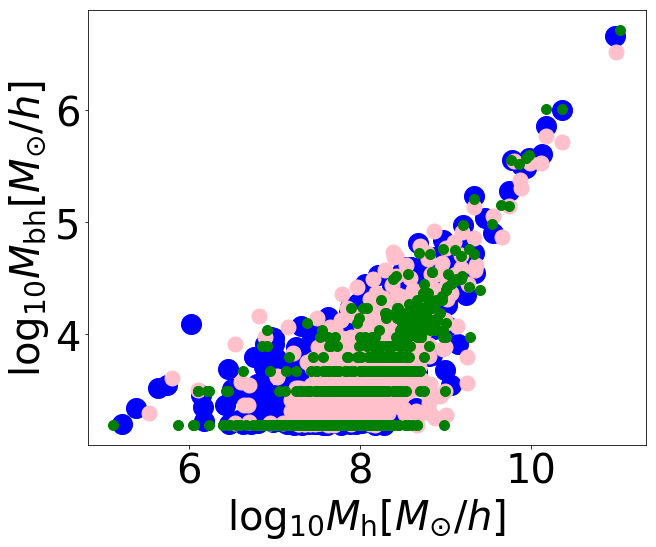

In [5]:
desired_redshift=9
basePath='/blue/lblecha/aklantbhowmick/code_development/AREPO/output_uni_test2/'
BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift,file_format='fof')

levelmax_gas,logseedmass_gas=12,3.19

desired_redshift=9
mass_unit_conv=1e10
Msfmp,Mh=50,3000

f,axx=plt.subplots(1,1,figsize=(10,8))
#path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output

GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)

GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)

axx.errorbar(numpy.log10(GroupMass*mass_unit_conv),numpy.log10(GroupBHMass*mass_unit_conv),marker='o',ms=20,linewidth=0,color='blue',label='Seed halo mass threshold at seeding',linestyle='dashed')


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_5.00_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)

GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)

axx.errorbar(numpy.log10(GroupMass*mass_unit_conv),numpy.log10(GroupBHMass*mass_unit_conv),marker='o',ms=15,linewidth=0,color='pink',label='Seed halo mass threshold at seeding',linestyle='dashed')


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)

GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)

axx.errorbar(numpy.log10(GroupMass*mass_unit_conv),numpy.log10(GroupBHMass*mass_unit_conv),marker='o',ms=10,linewidth=0,color='green',label='Seed halo mass threshold at seeding',linestyle='dashed')

axx.tick_params(labelsize=label_fontsize)
axx.set_xlabel('$\log_{10}M_{\mathrm{h}}[M_{\odot}/h]$',fontsize=label_fontsize)
axx.set_ylabel('$\log_{10}M_{\mathrm{bh}}[M_{\odot}/h]$',fontsize=label_fontsize)


#axx.set_yscale('log')



Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
[2.06962136e-06 1.00574536e-05 4.88748207e-05 2.37510228e-04
 1.15419571e-03 5.60888576e-03 2.72567289e-02]
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
[2.73802552e-06 1.33056051e-05 6.46594147e-05 3.14216443e-04
 1.52695433e-03 7.42032943e-03 3.60595519e-02]
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
[2.73802552e-06 1.33056051e-05 6.46594147e-05 3.14216443e-04
 1.52695433e-03 7.42032943e-03 3.60595519e-02]
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
[3.51791658e-08 1.70955342e-07 8.30768106e-07 4.03716923e-06

Text(0.5, 1.0, '$M_{bh}>1e5 \\ M_{\\odot}/h$')

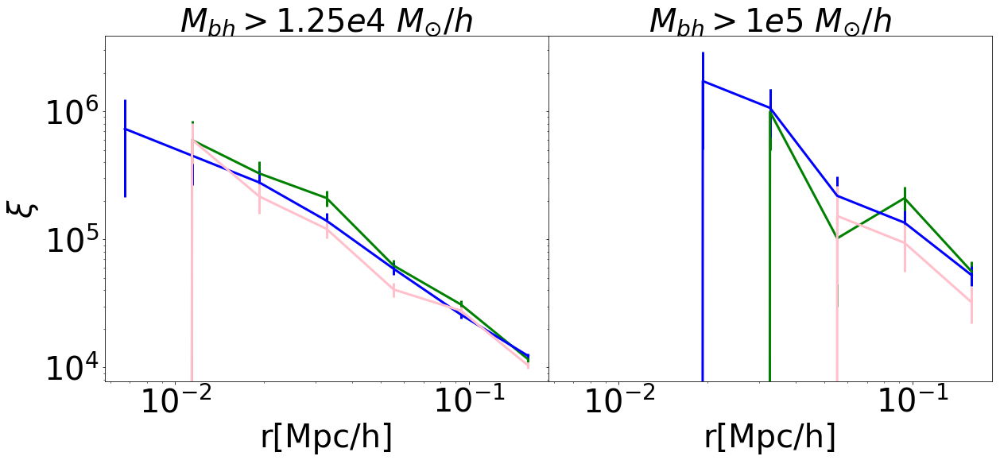

In [45]:
def make_plot(ax,style='solid',col='black'):
            redshift=9
            Coordinates,o=arepo_package.get_particle_property(basePath,'Coordinates',5,redshift)
            BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
            BH_Mass*=1e10
            Coordinates/=1e3
            r, DD,RR=arepo_package.correlate_info(Coordinates[BH_Mass>=Mass_cut], 7, 5e-3, 0.2, 25000, WRAP=1)
            xi=DD/RR-1
            dxi=numpy.sqrt(DD)/RR-1
            print(RR)
            ax.errorbar(r,xi,dxi,color=col,linewidth=3,linestyle=style)




            ax.set_title('z=%d'%redshift,fontsize=label_fontsize)


            ax.set_xlabel('r[Mpc/h]',fontsize=label_fontsize)


            #ax.set_ylim(1e2,1e6)

            ax.tick_params(labelsize=label_fontsize)
            ax.set_yscale('log')
            ax.set_xscale('log')


f,axx=plt.subplots(1,2,figsize=(20,8),sharey=True,sharex=True)

            
Mass_cut=1.25e4        
levelmax_gas,logseedmass_gas=12,3.19
Mh,Msfmp=3000,50

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs

output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],style='solid',col='green')


output='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],style='solid',col='blue')

    
output='/output_SFMFGM%d_FOF%d_seed3.19_5.00_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],style='solid',col='pink')


Mass_cut=1e5       
levelmax_gas,logseedmass_gas=12,3.19
Mh,Msfmp=3000,50

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs

output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[1],style='solid',col='green')


output='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[1],style='solid',col='blue')

    
output='/output_SFMFGM%d_FOF%d_seed3.19_5.00_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[1],style='solid',col='pink')


axx[0].set_ylabel(r'$\xi$',fontsize=label_fontsize)


axx[0].set_title('$M_{bh}>1.25e4 M_{\odot}/h$',fontsize=label_fontsize)


axx[1].set_title('$M_{bh}>1e5 M_{\odot}/h$',fontsize=label_fontsize)


plt.subplots_adjust(hspace=0,wspace=0)

axx[0].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


axx[1].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)










16 9.00233985416247
Total number of mergers 6835
16 9.00233985416247
Total number of mergers 2775
16 9.00233985416247
Total number of mergers 1623
16 9.00233985416247
Total number of mergers 6835
16 9.00233985416247
Total number of mergers 2775
16 9.00233985416247
Total number of mergers 1623


(0.8, 100.0)

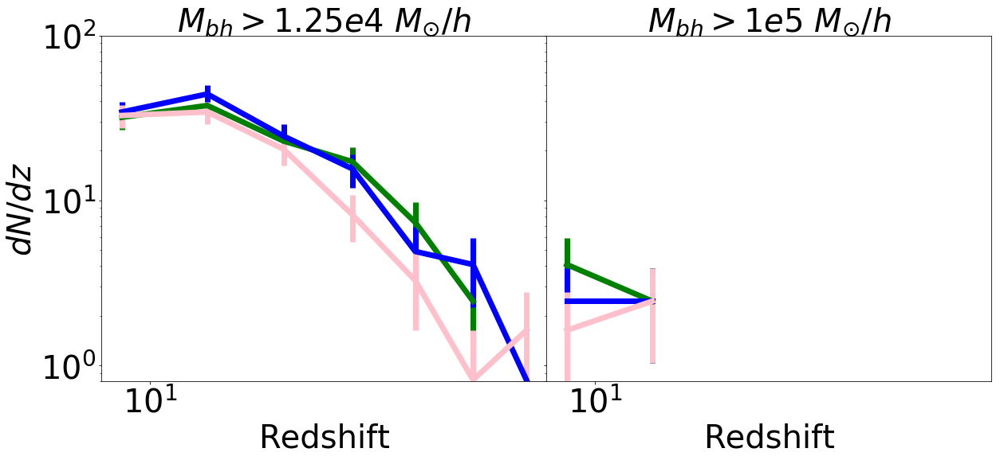

In [77]:
def make_plot(ax,style='solid',col='black'):
            redshift=9

            bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
            mask=dist>0
            ax.errorbar(bins[mask],dist[mask],dist_err[mask],label='$L_{\mathrm{max}}=11$',linewidth=7,color=col)
#            offset+=0.05



            ax.set_title('z=%d'%redshift,fontsize=label_fontsize)


            ax.set_xlabel('Redshift',fontsize=label_fontsize)


            #ax.set_ylim(1e2,1e6)

            ax.tick_params(labelsize=label_fontsize)
            ax.set_yscale('log')
            ax.set_xscale('log')
offset=0
upto_redshift=9
redshift_cut=upto_redshift
total_mass_cut=0
mass_ratio_cut=0


f,axx=plt.subplots(1,2,figsize=(20,8),sharey=True,sharex=True)
nbins,min_value, max_value=10,9,20
            
mass_cut=1.25e4        
levelmax_gas,logseedmass_gas=12,3.19
Mh,Msfmp=3000,50

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs

output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],style='solid',col='green')


output='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],style='solid',col='blue')

    
output='/output_SFMFGM%d_FOF%d_seed3.19_5.00_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],style='solid',col='pink')


mass_cut=1e5       
levelmax_gas,logseedmass_gas=12,3.19
Mh,Msfmp=3000,50

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs

output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[1],style='solid',col='green')


output='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[1],style='solid',col='blue')

    
output='/output_SFMFGM%d_FOF%d_seed3.19_5.00_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[1],style='solid',col='pink')


axx[0].set_ylabel('$dN/dz$',fontsize=label_fontsize)


axx[0].set_title('$M_{bh}>1.25e4 M_{\odot}/h$',fontsize=label_fontsize)


axx[1].set_title('$M_{bh}>1e5 M_{\odot}/h$',fontsize=label_fontsize)


plt.subplots_adjust(hspace=0,wspace=0)

axx[0].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


axx[1].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)


axx[0].set_ylim(0.8,1e2)









Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  12
Output redshift:  11.980213315300293
Output snapshot:  13
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  14
Output redshift:  14.033992144452485
Output snapshot:  11
Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10
Desired redshift:  16
Output redshift:  16.005041538113627
Output snapshot:  9
Desired redshift:  17
Output redshift:  16.999960992518137
Output snapshot:  8
Desired redshift:  18
Output redshift:  17.963024604582767
Output snapshot:  7
Desired redshift:  19
Output redshift:  18.977615635027277
Output snapshot:  6
Desired redshift:  20
Output redshift:  20.046490988807516
Output snapshot:  5
Desired redshift:  21
Output redshift:  20.963426

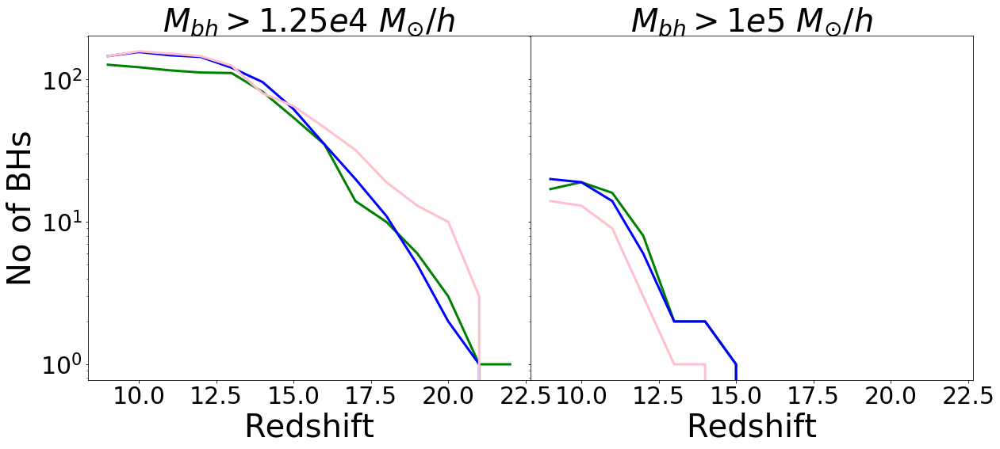

In [46]:
def make_plot(ax1,ax2,style='solid',col='black'):




        
        
        len1=[]
        len2=[]
        len3=[]
        z_space=[]
        for redshift in [9,10,11,12,13,14,15,16,17,18,19,20,21,22]:



            BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
            len1.append(len(BH_Mass[BH_Mass>mass_cut1/1e10]))
            len2.append(len(BH_Mass[BH_Mass>mass_cut2/1e10]))
            
            z_space.append(redshift)


            ax1.tick_params(labelsize=30)
            ax1.set_yscale('log')
            ax2.tick_params(labelsize=30)
            ax2.set_yscale('log')
        len1=numpy.array(len1)
        len2=numpy.array(len2)

        z_space=numpy.array(z_space)
        ax1.errorbar(z_space,len1,color=col,linewidth=3)
        ax2.errorbar(z_space,len2,color=col,linewidth=3)
        ax1.set_xlabel('Redshift',fontsize=label_fontsize)
        ax2.set_xlabel('Redshift',fontsize=label_fontsize)



        
f,axx=plt.subplots(1,2,figsize=(20,8),sharey=True,sharex=True)

            
mass_cut1=1.25e4  
mass_cut2=1e5
levelmax_gas,logseedmass_gas=12,3.19
Mh,Msfmp=3000,50

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs

output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='green')


output='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='blue')

    
output='/output_SFMFGM%d_FOF%d_seed3.19_5.00_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[0],axx[1],style='solid',col='pink')


axx[0].set_title('$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)


axx[1].set_title('$M_{bh}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)





axx[0].set_ylabel('No of BHs',fontsize=label_fontsize)

plt.subplots_adjust(hspace=0,wspace=0)


Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18


KeyboardInterrupt: 

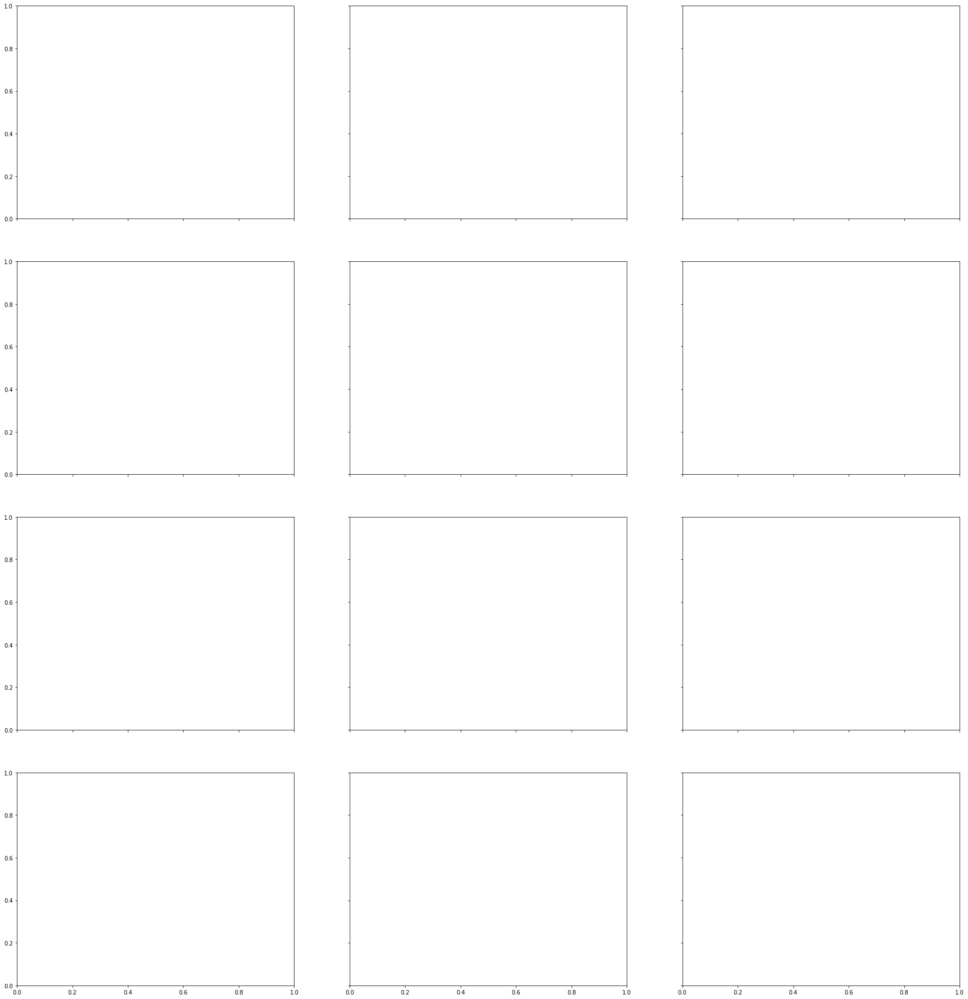

In [5]:
def make_plot(style='solid'):
    j=0
    for mmass_cut in [1.25e4,3.75e4,1e5,3e5]:
        mass_cut=mmass_cut/1e10
        i=0
        for redshift in [7,9,11]:
            ax=axx[j,i]
            i+=1

            Coordinates,o=arepo_package.get_particle_property(basePath1,'Coordinates',5,redshift)
            BH_Mass,o=arepo_package.get_particle_property(basePath1,'BH_Mass',5,redshift)
            Coordinates/=1e3
            r, DD,RR=arepo_package.correlate_info(Coordinates[BH_Mass>=mass_cut], 7, 1e-2, 5, 25000, WRAP=1)
            xi=DD/RR-1
            dxi=numpy.sqrt(DD)/RR-1
            print(RR)
            ax.errorbar(r,xi,dxi,color='maroon',linewidth=3,linestyle=style)



            Coordinates,o=arepo_package.get_particle_property(basePath2,'Coordinates',5,redshift)
            BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
            Coordinates/=1e3
            r, DD,RR=arepo_package.correlate_info(Coordinates[BH_Mass>=mass_cut], 7, 1e-2, 5, 25000, WRAP=1)
            xi=DD/RR-1
            dxi=numpy.sqrt(DD)/RR-1
            print(RR)
            ax.errorbar(r,xi,dxi,color='orange',linewidth=3,linestyle=style)

            if(mmass_cut>=1e5):
                Coordinates,o=arepo_package.get_particle_property(basePath3,'Coordinates',5,redshift)
                BH_Mass,o=arepo_package.get_particle_property(basePath3,'BH_Mass',5,redshift)
                Coordinates/=1e3
                r, DD,RR=arepo_package.correlate_info(Coordinates[BH_Mass>=mass_cut], 7, 1e-2, 5, 25000, WRAP=1)
                xi=DD/RR-1
                dxi=numpy.sqrt(DD)/RR-1
                print(RR)
                ax.errorbar(r,xi,dxi,color='blue',linewidth=3,linestyle=style)




            ax.set_title('z=%d'%redshift,fontsize=40)


            ax.set_xlabel('r[Mpc/h]',fontsize=30)
            ax.set_ylabel(r'$\xi$',fontsize=30)

            ax.set_ylim(1e2,1e6)

            ax.tick_params(labelsize=30)
            ax.set_yscale('log')
            ax.set_xscale('log')
        j+=1

        
levelmax_gas,logseedmass_gas=12,3.19
Mh,Msfmp=3000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath1=path_to_output+run+output
    
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d_seed4.10/'%(Mh,Msfmp)
basePath2=path_to_output+run+output

output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d_seed5.00/'%(Mh,Msfmp)
basePath3=path_to_output+run+output
f,axx=plt.subplots(4,3,figsize=(30,32),sharey=True,sharex=True)
make_plot(style='solid')



Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
[2.35375466e-04 3.37646789e-03 4.84355298e-02 6.94809079e-01
 9.96705639e+00 1.42977713e+02 2.05101944e+03]
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
[2.83493779e-04 4.06672648e-03 5.83373093e-02 8.36850393e-01
 1.20046432e+01 1.72206954e+02 2.47031375e+03]
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
[2.80195260e-05 4.01940913e-04 5.76585405e-03 8.27113435e-02
 1.18649662e+00 1.70203284e+01 2.44157105e+02]
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
[7.98713903e-04 1.14575741e-02 1.64359233e-01 2.357737

[7.15513942e-08 1.02640682e-06 1.47238357e-05 2.11213850e-04
 3.02986880e-03 4.34635557e-02 6.23485967e-01]
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
[4.29308365e-08 6.15844095e-07 8.83430140e-06 1.26728310e-04
 1.81792128e-03 2.60781334e-02 3.74091580e-01]
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
[4.29308365e-08 6.15844095e-07 8.83430140e-06 1.26728310e-04
 1.81792128e-03 2.60781334e-02 3.74091580e-01]
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
[7.15513942e-09 1.02640682e-07 1.47238357e-06 2.11213850e-05
 3.02986880e-04 4.34635557e-03 6.23485967e-02]
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshi

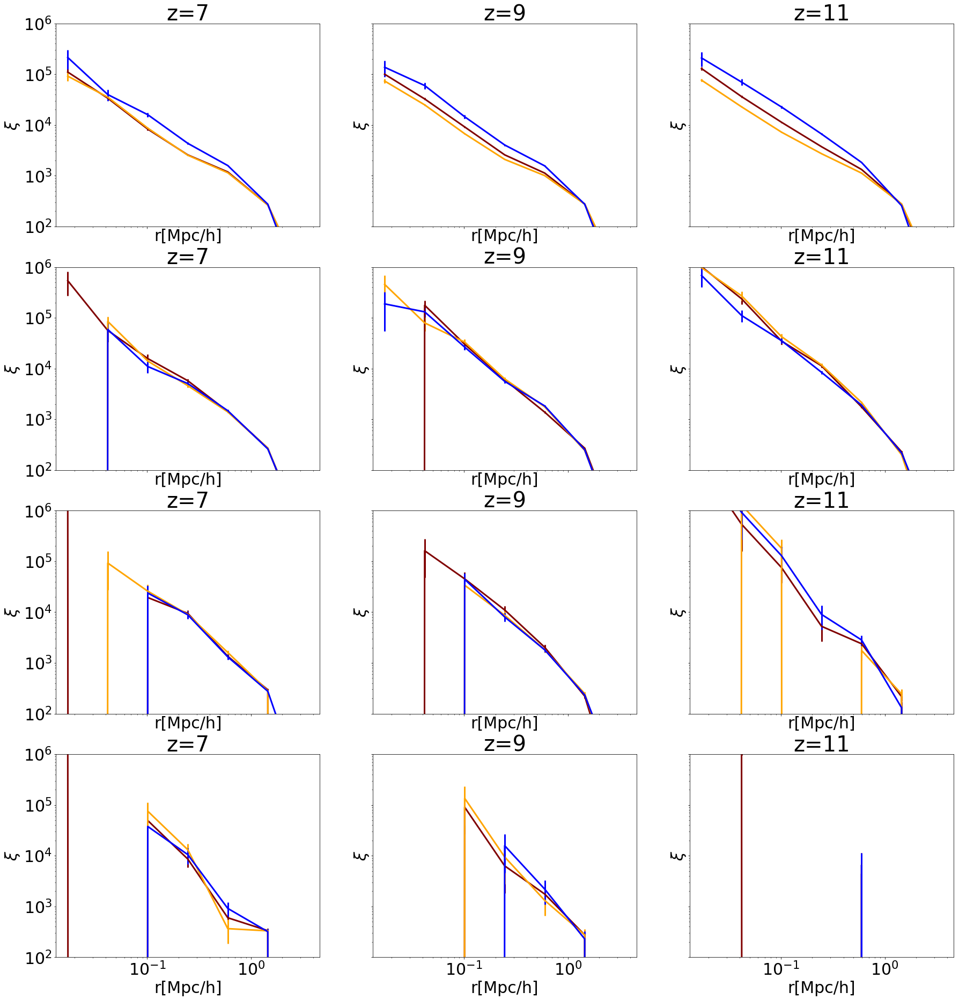

In [10]:
def make_plot(style='solid'):
    j=0
    for lum_cut in [1e38,1e40,1e41,1e42]:
        #mass_cut=mmass_cut/1e10
        i=0
        for redshift in [7,9,11]:
            ax=axx[j,i]
            i+=1

            Coordinates,o=arepo_package.get_particle_property(basePath1,'Coordinates',5,redshift)
            BH_Mdot,o=arepo_package.get_particle_property(basePath1,'BH_Mdot',5,redshift)
            BH_lum= BH_Mdot*total_conv
            Coordinates/=1e3
            r, DD,RR=arepo_package.correlate_info(Coordinates[BH_lum>=lum_cut], 7, 1e-2, 5, 25000, WRAP=1)
            xi=DD/RR-1
            dxi=numpy.sqrt(DD)/RR-1
            print(RR)
            ax.errorbar(r,xi,dxi,color='maroon',linewidth=3,linestyle=style)



            Coordinates,o=arepo_package.get_particle_property(basePath2,'Coordinates',5,redshift)
            BH_Mdot,o=arepo_package.get_particle_property(basePath2,'BH_Mdot',5,redshift)
            BH_lum= BH_Mdot*total_conv
            Coordinates/=1e3
            r, DD,RR=arepo_package.correlate_info(Coordinates[BH_lum>=lum_cut], 7, 1e-2, 5, 25000, WRAP=1)
            xi=DD/RR-1
            dxi=numpy.sqrt(DD)/RR-1
            print(RR)
            ax.errorbar(r,xi,dxi,color='orange',linewidth=3,linestyle=style)


            Coordinates,o=arepo_package.get_particle_property(basePath3,'Coordinates',5,redshift)
            BH_Mdot,o=arepo_package.get_particle_property(basePath3,'BH_Mdot',5,redshift)
            BH_lum= BH_Mdot*total_conv
            Coordinates/=1e3
            r, DD,RR=arepo_package.correlate_info(Coordinates[BH_lum>=lum_cut], 7, 1e-2, 5, 25000, WRAP=1)
            xi=DD/RR-1
            dxi=numpy.sqrt(DD)/RR-1
            print(RR)
            ax.errorbar(r,xi,dxi,color='blue',linewidth=3,linestyle=style)




            ax.set_title('z=%d'%redshift,fontsize=40)


            ax.set_xlabel('r[Mpc/h]',fontsize=30)
            ax.set_ylabel(r'$\xi$',fontsize=30)

            ax.set_ylim(1e2,1e6)

            ax.tick_params(labelsize=30)
            ax.set_yscale('log')
            ax.set_xscale('log')
        j+=1

        
levelmax_gas,logseedmass_gas=12,3.19
Mh,Msfmp=3000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath1=path_to_output+run+output
    
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d_seed4.10/'%(Mh,Msfmp)
basePath2=path_to_output+run+output

output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d_seed5.00/'%(Mh,Msfmp)
basePath3=path_to_output+run+output
f,axx=plt.subplots(4,3,figsize=(30,32),sharey=True,sharex=True)
make_plot(style='solid')



Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  15
Output redshift:  14.989173240042

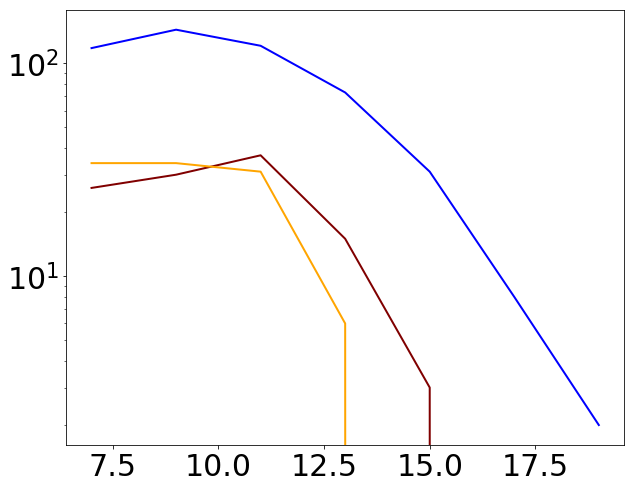

In [7]:
def make_plot(style='solid'):
    j=0
    for mmass_cut in [1e5]:
        mass_cut=mmass_cut/1e10
        i=0
        
        
        len1=[]
        len2=[]
        len3=[]
        z_space=[]
        for redshift in [7,9,11,13,15,17,19]:

            i+=1

            BH_Mass,o=arepo_package.get_particle_property(basePath1,'BH_Mass',5,redshift)
            len1.append(len(BH_Mass[BH_Mass>mass_cut]))
            
            BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
            len2.append(len(BH_Mass[BH_Mass>mass_cut]))
            
            if(mmass_cut>=1e5):
                BH_Mass,o=arepo_package.get_particle_property(basePath3,'BH_Mass',5,redshift)
                len3.append(len(BH_Mass[BH_Mass>mass_cut]))
            z_space.append(redshift)


            ax.tick_params(labelsize=30)
            ax.set_yscale('log')
        len1=numpy.array(len1)
        len2=numpy.array(len2)
        len3=numpy.array(len3)
        z_space=numpy.array(z_space)
        ax.errorbar(z_space,len1,color='maroon',linewidth=2)
        ax.errorbar(z_space,len2,color='orange',linewidth=2)
        if(mmass_cut>=1e5):
            ax.errorbar(z_space,len3,color='blue',linewidth=2)



        
levelmax_gas,logseedmass_gas=12,3.19
Mh,Msfmp=3000,5
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath1=path_to_output+run+output
    
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d_seed4.10/'%(Mh,Msfmp)
basePath2=path_to_output+run+output

output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d_seed5.00/'%(Mh,Msfmp)
basePath3=path_to_output+run+output
f,ax=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)
make_plot(style='solid')



In [ ]:

f,ax=plt.subplots(1,1,figsize=(8,6))
levelmax=12
logseedmass=3.19
desired_redshift=0
Mh=3000
Msfmp=5

desired_redshift=7

redshift_space=numpy.arange(7,25)
if (1==1):


    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    
    fraction_space=[]
    
    for desired_redshift in redshift_space:

            GroupLenType,o=arepo_package.get_group_property(basePath,'GroupLenType',desired_redshift,file_format='fof_sub_subfind')
            GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift,file_format='fof_sub_subfind')
            GroupIndices = numpy.len(Grou)
            mask1 = GroupBHMass>10**log_mass_cut/1e10
            mask2 = GroupLenType[:,5] > 1
            
            
            
            BH_Mass,o=arepo_package.get_particle_property_within_groups(basePath,'BH_Mass',5,desired_redshift)
            No_of_BHs=len(BH_Mass)
            fraction_space.append(numpy.float(BHs_in_groups)/No_of_BHs)
   
    #ax.errorbar(redshift_space,fraction_space)

    
    
    
    print("===")
    ax.set_xscale('log')
    ax.tick_params(labelsize=30)
    ax.set_xlabel('$M_h(M_{\odot}/h)$',fontsize=30)
    ax.set_ylabel('No. of BHs',fontsize=30)
    ax.set_yscale('log')

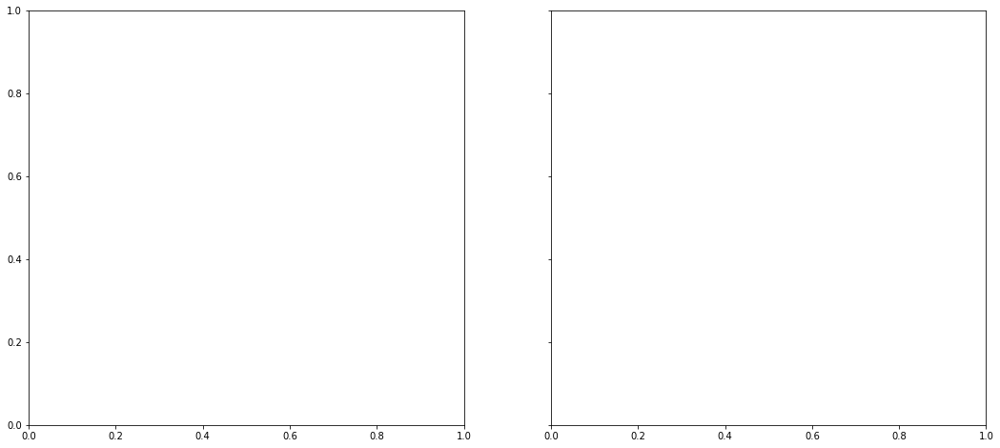

In [10]:

f,axx=plt.subplots(1,2,figsize=(18,8),sharey=True)

LogTargetGroupBHMass=4.10
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19
Msfmp,Mh=50,3000
Nbins,minimum,maximum=20,4,10
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output




f,ax=plt.subplots(1,1,figsize=(8,6))
levelmax=11
logseedmass=4.10
desired_redshift=0
Mh=3000
Msfmp=5

desired_redshift=7

redshift_space=numpy.arange(7,25)
for LR in [1,2,3,4,5]:


    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
    output='/output_SFMFGM%d_FOF%d_seed4.10_subFOF%d'%(Msfmp,Mh,LR)
    basePath=path_to_output+run+output
    

    redshift_space,fraction_space=numpy.load('fractions2_%d_%d_%d.npy'%(Msfmp,Mh,LR))    

    
    fraction_space=numpy.array(fraction_space)
    

    
    ax.errorbar(redshift_space,fraction_space,label='LinkL/%d'%LR)

    
    
    
    print("===")
    #ax.set_xscale('log')
    ax.tick_params(labelsize=30)
    ax.set_ylabel('Fraction of BHs in multiples \n within the same group',fontsize=30)
    ax.set_xlabel('Redshift',fontsize=30)
    ax.set_yscale('log')
    ax.legend(loc='lower right',fontsize=20)





In [4]:
def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0,do_mask=1):
    #print(HM)
    
    def extract(HM_min,HM_max):
        mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    if(do_mask):
        mask=HMF>0
    else:
        mask=HMF==HMF
    
    return centers[mask],HMF[mask]/norm,dHMF[mask]/norm


def get_prop_distribution(HM,prop,Nbins,log_HM_min,log_HM_max,linear=0,do_mask=1):
    #print(HM)
    
    def extract(HM_min,HM_max):
        mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,sum(prop[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)*numpy.sqrt(numpy.average(prop))
    norm=1.#sum(HMF)
    
    if(do_mask):
        mask=HMF>0
    else:
        mask=HMF==HMF
    return centers[mask],HMF[mask]/norm,dHMF[mask]/norm

In [8]:
def make_plot(i,col='C2',probingmass=1.25e4/1e10,plot_fit=0):
    upto_redshift=7
    
    mass_unit_conv=1e10
    #merging_time,primary_id,primary_mass,hosthalomass_primary,hosthalostellarmass_primary,hosthalogasmass_primary,hosthalodmmass_primary,secondary_id,secondary_mass,hosthalomass_secondary,hosthalostellarmass_secondary,hosthalogasmass_secondary,hosthalodmmass_secondary,file_id_complete=arepo_package.get_merger_events_hosts(basePath,HDF5=1,SORT_PRIMARY_SECONDARY=0)
    merging_time,primary_mass,secondary_mass,primary_id_sorted,secondary_id_sorted,file_id_complete_sorted,N_empty=arepo_package.get_merger_events_from_snapshot(basePath,upto_redshift,HOSTS=0)

    merging_redshift = 1./merging_time-1



    minmass=numpy.amin([secondary_mass,primary_mass],axis=0)
    maxmass=numpy.amax([secondary_mass,primary_mass],axis=0)
#    diff=numpy.diff(loghosthalodmmass_space)[0]

    ax=axx[0,i]




    mask0=(maxmass>probingmass)
    mask1=(minmass<probingmass) & (maxmass>probingmass)
    mask2=(minmass>probingmass) & (maxmass>probingmass)


    #mask02=(maxmass>probingmass)
    #mask12=(minmass<probingmass2) & (maxmass>probingmass2)
    #mask22=(minmass>probingmass2) & (maxmass>probingmass2)

    centers,HMF,dHMF=get_distribution(merging_redshift[mask0],Nbins, minm, maxm,linear=1,do_mask=0)
    ax.errorbar(centers,HMF,dHMF,label='All mergers',color='olive',linewidth=7)

    centers,HMF,dHMF=get_distribution(merging_redshift[mask1],Nbins, minm, maxm,linear=1,do_mask=0)
    ax.errorbar(centers,HMF,dHMF,label='light minor',color='C1',linewidth=5)
    #centers,HMF,dHMF=get_distribution(merging_redshift[mask2],20,6,20,linear=1)
    #ax.errorbar(centers,HMF*1.5675e-7*20*1.6*6,label='Mpri > 1e4 Msun, Msec > 1e4 Msun \n (unresolved mergers)')
    centers,HMF,dHMF=get_distribution(merging_redshift[mask2],Nbins, minm, maxm,linear=1,do_mask=0)
    centers_c,HMF_c,dHMF_c=centers,HMF,dHMF
    ax.errorbar(centers,HMF,dHMF,label='heavy',color='C2',linewidth=5)




    ax.tick_params(labelsize=30)
    #ax.legend(loc='lower left',fontsize=20)
    ax.set_yscale('log')
    
    ax.set_ylim(0.3,500000)

    ax=axx[1,i]
    centers,HMF,dHMF=get_prop_distribution(merging_redshift[mask0],minmass[mask0],Nbins, minm, maxm,linear=1,do_mask=0)
    ax.errorbar(centers,HMF*mass_unit_conv,dHMF*mass_unit_conv,label='Gas Based',color='olive',linewidth=7)    
    centers0,HMF0,dHMF0=centers,HMF,dHMF
    centers,HMF,dHMF=get_prop_distribution(merging_redshift[mask1],minmass[mask1],Nbins, minm, maxm,linear=1,do_mask=0)
    ax.errorbar(centers,HMF*mass_unit_conv,dHMF*mass_unit_conv,color='C1',linewidth=5)

    
    mass_per_merger=1.25e-6
    centers,HMF,dHMF=get_prop_distribution(merging_redshift[mask2],minmass[mask2],Nbins, minm, maxm,linear=1,do_mask=0)
    centers1,HMF1,dHMF1=centers,HMF,dHMF
    ax.errorbar(centers,HMF*mass_unit_conv,dHMF*mass_unit_conv,color='C2',linewidth=5)
    
    
    
    ax.set_yscale('log')
    
    ax.set_ylim(1e3,1e7)
    axx[0,0].set_ylabel('$dN/dz$' +'\n Merger rate',fontsize=label_fontsize)
    axx[1,0].set_ylabel('$dM/dz$'+'\n Mass growth rate',fontsize=label_fontsize)
    axx[2,0].set_ylabel(r'$\log_{10}[\Delta M^{\mathrm{light}}_{\mathrm{minor}}/ M_{\mathrm{seed}}^{\mathrm{ESD}}]$' '\n per heavy merger',fontsize=label_fontsize)
    
    print(mass_per_merger)
    ax=axx[2,i]   
   
    logdeltam=numpy.log10((HMF0-HMF1)/HMF_c/probingmass)
    
    
    
    logdeltam_u=numpy.log10(abs(HMF0-HMF1+dHMF0+dHMF1)/abs(HMF_c-dHMF_c)/probingmass)
    logdeltam_l=numpy.log10(abs(HMF0-HMF1-dHMF0-dHMF1)/abs(HMF_c+dHMF_c)/probingmass)
  
    logdeltam_h=numpy.log10(HMF1/HMF_c/probingmass)

    
    d_logdeltam = (logdeltam_u-logdeltam_l)/2
    print(d_logdeltam)
    mm2=(isnan(d_logdeltam))|(isinf(d_logdeltam))
    d_logdeltam[mm2]=1e19
    
    ax.errorbar(centers,logdeltam,d_logdeltam,color=col,linewidth=5) 
    
    #ax.errorbar(centers,logdeltam_h,color=col,linewidth=3,linestyle='dotted') 
    
    
    
    
    #d_logdeltam=
    
    def lin_func(x,m,c):
        return m*x+c
    
    redshift_cont= numpy.linspace(7,20,100)
  
    
    mm=(~isnan(logdeltam))&(~isinf(logdeltam))
    fit=scipy.optimize.curve_fit(lin_func,centers[mm],logdeltam[mm],sigma=d_logdeltam[mm])
    
    print("SlopeMassGrowthPerResolvedEvent    ",fit[0][0])
    print("InterceptMassGrowthPerResolvedEvent    ",fit[0][1])
    deltam_cont=(fit[0][0]*redshift_cont+fit[0][1])
    #print(deltam_cont)
    if(plot_fit==1):
        ax.errorbar(redshift_cont,deltam_cont,color='C2',linewidth=3,linestyle='dotted') 
    
    
    deltam_cont2=0.049*redshift_cont+0.126   
    #ax.errorbar(redshift_cont,deltam_cont2,color='red',linewidth=3,linestyle='solid') 
      
    
    #ax.set_yscale('log')
    
    

    
    ax.set_ylim(0,1.4)
    

    
    if(i>0):
        axx[0,i].tick_params(labelleft=0)
        axx[1,i].tick_params(labelleft=0)
        axx[2,i].tick_params(labelleft=0)
        
    axx[1,i].set_xticks([9,11,13,15,17,19])
        
    axx[0,i].set_title('SM%d_FOF%d'%(Msfmp,Mh),fontsize=label_fontsize)
    axx[2,i].set_xlabel('Redshift',fontsize=label_fontsize)
    #axx[]
    axx[0,i].tick_params(labelsize=label_fontsize)
    axx[1,i].tick_params(labelsize=label_fontsize)
    axx[2,i].tick_params(labelsize=label_fontsize)
    
    
    

17 8.012172948865935
Total number of mergers 15403
1.25e-06
[0.5983106  0.17323217 0.14607954 0.11904471 0.13893916 0.17538867
 0.24008237 0.57338066        inf]
SlopeMassGrowthPerResolvedEvent     0.06454503615230286
InterceptMassGrowthPerResolvedEvent     -0.2789309652065104
18 7.005417045544533
Total number of mergers 7815
1.25e-06
[0.35738912 0.23659847 0.20152293 0.16828418 0.19674456 0.29932416
        inf        nan        nan]
SlopeMassGrowthPerResolvedEvent     0.0712805368570722
InterceptMassGrowthPerResolvedEvent     -0.3666181582445379
18 7.005417045544533
Total number of mergers 3964
1.25e-06
[0.3890946  0.30822517 0.24374253 0.2295409  0.32351617 0.60565387
        nan        nan        nan]
SlopeMassGrowthPerResolvedEvent     0.07273456837328161
InterceptMassGrowthPerResolvedEvent     -0.34239093607067866
17 8.012172948865935
Total number of mergers 5409
1.25e-06
[0.47779686 0.19309041 0.19088483 0.18952589 0.4931624         inf
        nan        nan        nan]
SlopeMa

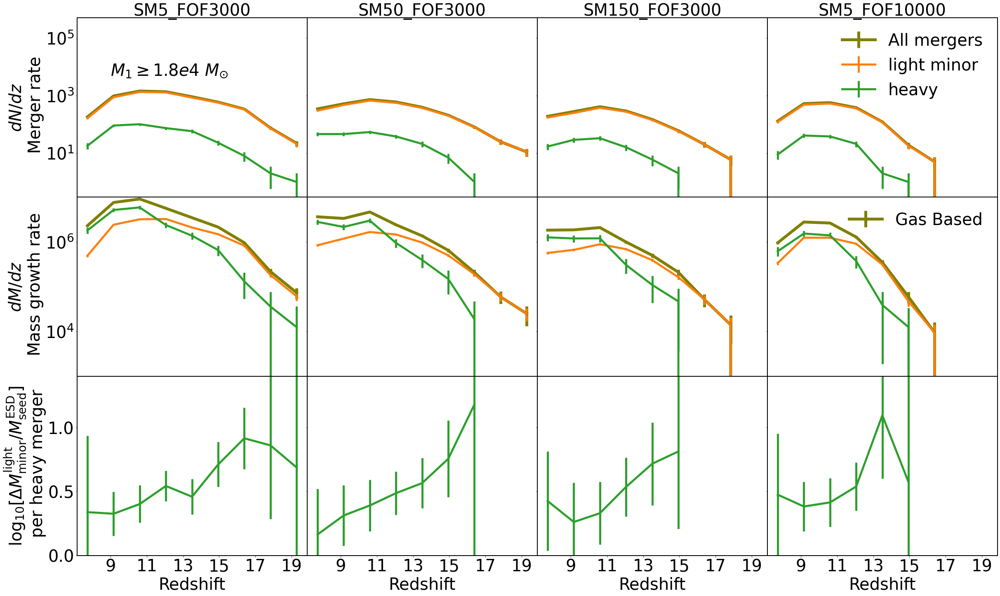

In [9]:
  



    #print(HMF2*mass_unit_conv*1.6*20*1.56e3)


levelmax_gas=12
logseedmass_gas=3.19

Nbins, minm, maxm=20,7,20

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs

f,axx=plt.subplots(3,4,figsize=(40,24),sharex=True)

'''
Msfmp=5
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(0)

Msfmp=50
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(1)

Msfmp=150
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(2)


Msfmp=5
Mh=10000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output

#arepo_package.convert_merger_hosts_to_hdf5(basePath)
#arepo_package.convert_merger_events_to_hdf5(basePath)
make_plot(3)
'''


levelmax_gas=12
logseedmass_gas=3.19
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs

Nbins, minm, maxm=10,7,20



Msfmp=5
Mh=3000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(0)



Msfmp=50
Mh=3000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
#arepo_package.convert_merger_hosts_to_hdf5(basePath)

make_plot(1)

Msfmp=150
Mh=3000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
#arepo_package.convert_merger_events_to_hdf5(basePath)
make_plot(2)


Msfmp=5
Mh=10000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
#arepo_package.convert_merger_events_to_hdf5(basePath)
make_plot(3)

for ii in [1,2,3]:
    axx[0,ii].tick_params(labelleft=0)
    axx[1,ii].tick_params(labelleft=0)
    axx[2,ii].tick_params(labelleft=0)


axx[1,3].legend(loc='upper right',fontsize=label_fontsize,frameon=False)

axx[0,3].legend(loc='upper right',fontsize=label_fontsize,frameon=False)
axx[0,0].text(9,5e3,'$M_1\geq1.8e4 \ M_{\odot}$',fontsize=label_fontsize)
#axx[0,1].text(9,5e3,'$M^{\mathrm{ESD}}_{\mathrm{seed}}=1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)

plt.subplots_adjust(hspace=0,wspace=0)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(2)    # Top axis
    ax.spines['bottom'].set_linewidth(2) # Bottom axis
    ax.spines['left'].set_linewidth(2)   # Left axis
    ax.spines['right'].set_linewidth(2)  # Right axis


plt.savefig('./Paper5_figures/Minor_vs_major_mergers_seed4.10.png',bbox_inches='tight')




18 7.005417045544533
Total number of mergers 32012
1.25e-06
[0.0916321  0.09150114 0.09782652 0.117508   0.13754223 0.19131897
 0.3186607         inf        nan]
SlopeMassGrowthPerResolvedEvent     0.06308928801470627
InterceptMassGrowthPerResolvedEvent     -0.21832025987477938
18 7.005417045544533
Total number of mergers 19624
1.25e-06
[0.09762445 0.10890609 0.12741822 0.24676477 0.45959203 0.54025675
        nan        nan        nan]
SlopeMassGrowthPerResolvedEvent     0.049268414344354514
InterceptMassGrowthPerResolvedEvent     0.12636312923280862
18 7.005417045544533
Total number of mergers 2970
1.25e-06
[0.24109035 0.37564915        inf        inf        nan        nan
        nan        nan        nan]
SlopeMassGrowthPerResolvedEvent     0.3496997461268787
InterceptMassGrowthPerResolvedEvent     -2.243292372885723
18 7.005417045544533
Total number of mergers 6893
1.25e-06
[0.15447839 0.21690816        inf        nan        nan        nan
        nan        nan        nan]
SlopeM

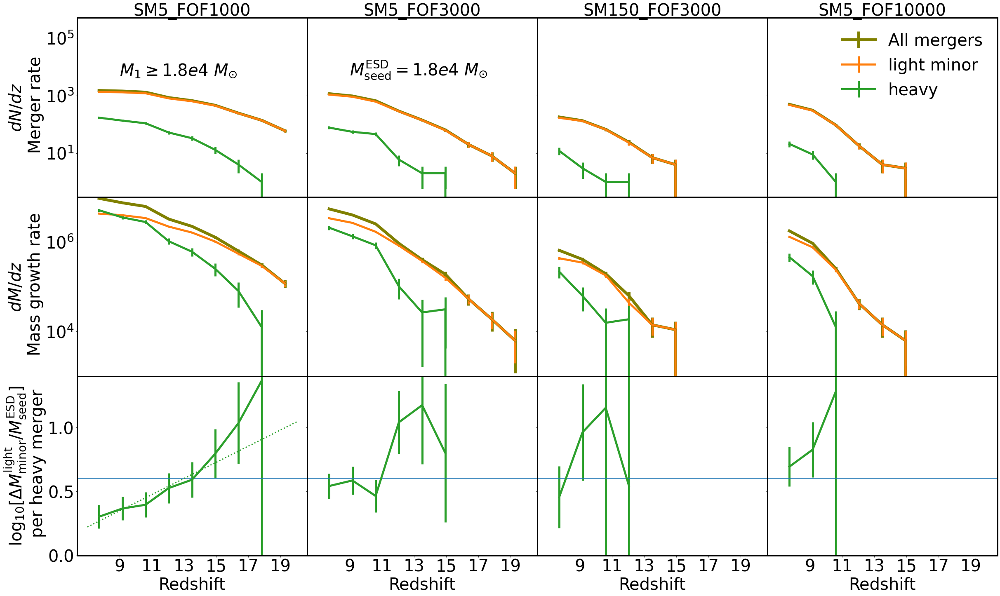

In [11]:






    #print(HMF2*mass_unit_conv*1.6*20*1.56e3)


levelmax_gas=12
logseedmass_gas=3.19

Nbins, minm, maxm=10,7,20

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs

f,axx=plt.subplots(3,4,figsize=(40,24),sharex=True)

'''
Msfmp=5
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(0)

Msfmp=50
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(1)

Msfmp=150
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(2)


Msfmp=5
Mh=10000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output

#arepo_package.convert_merger_hosts_to_hdf5(basePath)
#arepo_package.convert_merger_events_to_hdf5(basePath)
make_plot(3)
'''


levelmax_gas=12
logseedmass_gas=3.19
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/'# name of the simulation runs

#Nbins, minm, maxm=7,7,20



Msfmp=5
Mh=1000
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(0,plot_fit=1)


Msfmp=5
Mh=3000
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(1)



Msfmp=150
Mh=3000
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
#arepo_package.convert_merger_hosts_to_hdf5(basePath)

make_plot(2)

Msfmp=5
Mh=10000
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
#arepo_package.convert_merger_events_to_hdf5(basePath)
make_plot(3)







#axx[1,3].legend(loc='upper right',fontsize=label_fontsize-10,frameon=False)

axx[0,3].legend(loc='upper right',fontsize=label_fontsize,frameon=False)
axx[0,0].text(9,5e3,'$M_1\geq1.8e4 \ M_{\odot}$',fontsize=label_fontsize)
axx[0,1].text(9,5e3,'$M^{\mathrm{ESD}}_{\mathrm{seed}}=1.8e4 \ M_{\odot}$',fontsize=label_fontsize)

axx[2,0].axhline(numpy.log10(4))

axx[2,1].axhline(numpy.log10(4))
axx[2,2].axhline(numpy.log10(4))
axx[2,3].axhline(numpy.log10(4))


for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)


plt.subplots_adjust(hspace=0,wspace=0)


plt.savefig('./Paper5_figures/Minor_vs_major_mergers_seed4.10_uni.png',bbox_inches='tight')




In [ ]:

levelmax_gas=12
logseedmass_gas=3.19

Nbins, minm, maxm=10,7,20

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs

f,axx=plt.subplots(3,2,figsize=(20,24),sharex=True)

'''
Msfmp=5
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(0)

Msfmp=50
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(1)

Msfmp=150
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(2)


Msfmp=5
Mh=10000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output

#arepo_package.convert_merger_hosts_to_hdf5(basePath)
#arepo_package.convert_merger_events_to_hdf5(basePath)
make_plot(3)
'''


levelmax_gas=12
logseedmass_gas=3.19
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS/' # this is the folder containing the simulation run
run='/L6p25n1024/AREPO/'# name of the simulation runs

#Nbins, minm, maxm=7,7,20



Msfmp=5
Mh=1000
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(0,probingmass=1e5/1e10)



Msfmp=5
Mh=3000
output='/output_ratio%d_SFMFGM%d_seed3.19_bFOF/'%(Mh,Msfmp)
basePath=path_to_output+run+output
#arepo_package.convert_merger_hosts_to_hdf5(basePath)

make_plot(1,probingmass=1e5/1e10)


axx[2,0].axhline(numpy.log10(4))
axx[2,1].axhline(numpy.log10(4))

axx[0,0].text(9,5e3,'$M_1\geq1.5e5 \ M_{\odot}$',fontsize=label_fontsize)
axx[0,1].text(9,5e3,'$M^{\mathrm{ESD}}_{\mathrm{seed}}=1.5e5 \ M_{\odot}$',fontsize=label_fontsize)

#axx[1,0].legend(loc='upper right',fontsize=label_fontsize-10,frameon=False)

#axx[0,0].legend(loc='upper right',fontsize=label_fontsize-10,frameon=False)
#axx[0,0].text(10,1e2,'$M_{\mathrm{primary}}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)

plt.subplots_adjust(hspace=0,wspace=0)


for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)


plt.savefig('./Paper5_figures/Minor_vs_major_mergers_seed5.00_uni.png',bbox_inches='tight')




18 7.005417045544533
Total number of mergers 32012
1.25e-06
[0.28633997 0.36208393        inf        nan        nan        nan
        nan        nan        nan]
SlopeMassGrowthPerResolvedEvent     0.04558876030032368
InterceptMassGrowthPerResolvedEvent     0.18565392823973978
18 7.005417045544533
Total number of mergers 19624
1.25e-06
[inf inf nan nan nan nan nan nan nan]
SlopeMassGrowthPerResolvedEvent     -0.23321910778353622
InterceptMassGrowthPerResolvedEvent     2.8857196793456943


17 8.012172948865935
Total number of mergers 15403
1e-05
17 8.012172948865935
Total number of mergers 7408
1e-05
17 8.012172948865935
Total number of mergers 3722
1e-05
17 8.012172948865935
Total number of mergers 5409
1e-05
17 8.012172948865935
Total number of mergers 42
17 8.012172948865935
Total number of mergers 24


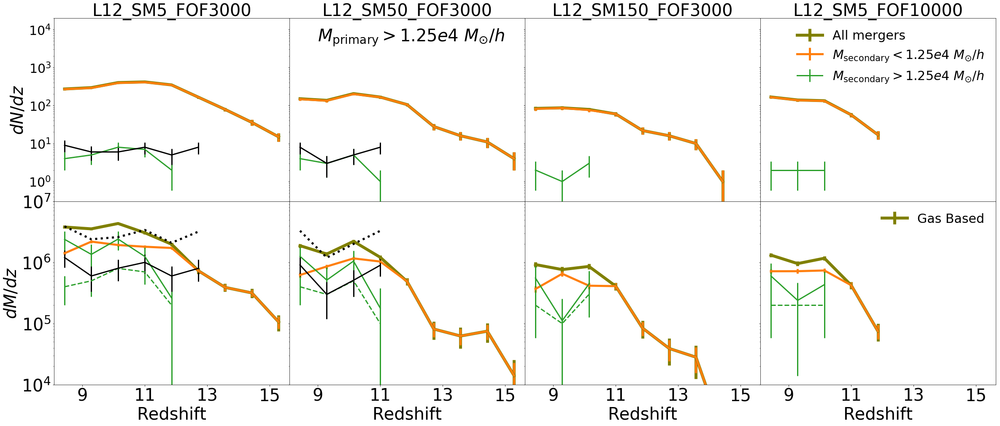

In [11]:
# 
def make_plot(i):
    upto_redshift=8
    
    mass_unit_conv=1e10
    #merging_time,primary_id,primary_mass,hosthalomass_primary,hosthalostellarmass_primary,hosthalogasmass_primary,hosthalodmmass_primary,secondary_id,secondary_mass,hosthalomass_secondary,hosthalostellarmass_secondary,hosthalogasmass_secondary,hosthalodmmass_secondary,file_id_complete=arepo_package.get_merger_events_hosts(basePath,HDF5=1,SORT_PRIMARY_SECONDARY=0)
    merging_time,primary_mass,secondary_mass,primary_id_sorted,secondary_id_sorted,file_id_complete_sorted,N_empty=arepo_package.get_merger_events_from_snapshot(basePath,upto_redshift,HOSTS=0)

    merging_redshift = 1./merging_time-1
    probingmass=1e5/1e10
    probingmass2=1e5/1e10

    minmass=numpy.amin([secondary_mass,primary_mass],axis=0)
    maxmass=numpy.amax([secondary_mass,primary_mass],axis=0)
#    diff=numpy.diff(loghosthalodmmass_space)[0]

    ax=axx[0,i]




    mask0=(maxmass>probingmass)
    mask1=(minmass<probingmass) & (maxmass>probingmass)
    mask2=(minmass>probingmass) & (maxmass>probingmass)


    mask02=(maxmass>probingmass)
    mask12=(minmass<probingmass2) & (maxmass>probingmass2)
    mask22=(minmass>probingmass2) & (maxmass>probingmass2)

    centers,HMF,dHMF=get_distribution(merging_redshift[mask0],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF,dHMF,label='All mergers',color='olive',linewidth=7)

    centers,HMF,dHMF=get_distribution(merging_redshift[mask1],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF,dHMF,label='$M_{\mathrm{secondary}}<1.25e4 \ M_{\odot}/h$',color='C1',linewidth=5)
    #centers,HMF,dHMF=get_distribution(merging_redshift[mask2],20,6,20,linear=1)
    #ax.errorbar(centers,HMF*1.5675e-7*20*1.6*6,label='Mpri > 1e4 Msun, Msec > 1e4 Msun \n (unresolved mergers)')
    centers,HMF,dHMF=get_distribution(merging_redshift[mask2],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF,dHMF,label='$M_{\mathrm{secondary}}>1.25e4 \ M_{\odot}/h$',color='C2',linewidth=3)




    ax.tick_params(labelsize=30)
    #ax.legend(loc='lower left',fontsize=20)
    ax.set_yscale('log')
    
    ax.set_ylim(0.3,20000)

    ax=axx[1,i]
    centers,HMF,dHMF=get_prop_distribution(merging_redshift[mask0],minmass[mask0],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF*mass_unit_conv,dHMF*mass_unit_conv,label='Gas Based',color='olive',linewidth=7)    
    centers,HMF,dHMF=get_prop_distribution(merging_redshift[mask1],minmass[mask1],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF*mass_unit_conv,dHMF*mass_unit_conv,color='C1',linewidth=5)

    
    mass_per_merger=1e-5
    centers,HMF,dHMF=get_distribution(merging_redshift[mask2],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF*mass_per_merger*mass_unit_conv,dHMF*mass_per_merger*mass_unit_conv, linestyle='dashed',color='C2',linewidth=3)
    centers,HMF,dHMF=get_prop_distribution(merging_redshift[mask2],minmass[mask2],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF*mass_unit_conv,dHMF*mass_unit_conv,color='C2',linewidth=3)

    print(mass_per_merger)
    
    

    axx[0,0].set_ylabel('$dN/dz$',fontsize=label_fontsize)
    axx[1,0].set_ylabel(r'$dM/dz$',fontsize=label_fontsize)

    #axx[1].set_xlabel('Redshift',fontsize=20)
    #ax.set_ylabel('Mass growth rate',fontsize=20)
    #.legend(loc='lower left',fontsize=20)
    ax.set_yscale('log')
    
    ax.set_ylim(1e4,1e7)
    
    if(i>0):
        axx[0,i].tick_params(labelleft='off')
        axx[1,i].tick_params(labelleft='off')
        
    axx[1,i].set_xticks([9,11,13,15,17,19])
        
    axx[0,i].set_title('L12_SM%d_FOF%d'%(Msfmp,Mh),fontsize=label_fontsize)
    axx[1,i].set_xlabel('Redshift',fontsize=label_fontsize)
    #axx[]
    axx[0,i].tick_params(labelsize=label_fontsize)
    axx[1,i].tick_params(labelsize=label_fontsize)
    
    
    


def make_plot2(i):
    upto_redshift=8
    
    mass_unit_conv=1e10
    #merging_time,primary_id,primary_mass,hosthalomass_primary,hosthalostellarmass_primary,hosthalogasmass_primary,hosthalodmmass_primary,secondary_id,secondary_mass,hosthalomass_secondary,hosthalostellarmass_secondary,hosthalogasmass_secondary,hosthalodmmass_secondary,file_id_complete=arepo_package.get_merger_events_hosts(basePath,HDF5=1,SORT_PRIMARY_SECONDARY=0)
    merging_time,primary_mass,secondary_mass,primary_id_sorted,secondary_id_sorted,file_id_complete_sorted,N_empty=arepo_package.get_merger_events_from_snapshot(basePath,upto_redshift,HOSTS=0)

    merging_redshift = 1./merging_time-1
    probingmass=1e5/1e10
    probingmass2=1e5/1e10

    minmass=numpy.amin([secondary_mass,primary_mass],axis=0)
    maxmass=numpy.amax([secondary_mass,primary_mass],axis=0)
#    diff=numpy.diff(loghosthalodmmass_space)[0]

    ax=axx[0,i]




    mask0=(maxmass>=probingmass)
    mask1=(minmass<probingmass) & (maxmass>=probingmass)
    mask2=(minmass>=probingmass) & (maxmass>=probingmass)


    #mask02=(maxmass>=probingmass)
    #mask12=(minmass<probingmass2) & (maxmass>=probingmass2)
    #mask22=(minmass>=probingmass2) & (maxmass>=probingmass2)

    centers,HMF2,dHMF2=get_distribution(merging_redshift[mask0],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF2,dHMF2,color='black',linewidth=3)

    ax.tick_params(labelsize=30)
    #ax.legend(loc='lower left',fontsize=20)
    ax.set_yscale('log')
    
    ax.set_ylim(0.3,20000)

    ax=axx[1,i]
    centers,HMF,dHMF=get_prop_distribution(merging_redshift[mask0],minmass[mask0],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF*mass_unit_conv,dHMF*mass_unit_conv,label='bFOF_MASS_ENV',color='black',linewidth=3) 
    
    ax.errorbar(centers,HMF*mass_unit_conv+HMF2*9.6*20*1.56e3,color='black',linewidth=5,linestyle='dotted') 

    


levelmax_gas=12
logseedmass_gas=3.19

Nbins, minm, maxm=15,7,20

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs

f,axx=plt.subplots(2,4,figsize=(40,16),sharex=True)

'''
Msfmp=5
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(0)

Msfmp=50
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(1)

Msfmp=150
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(2)


Msfmp=5
Mh=10000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output

#arepo_package.convert_merger_hosts_to_hdf5(basePath)
#arepo_package.convert_merger_events_to_hdf5(basePath)
make_plot(3)
'''


levelmax_gas=12
logseedmass_gas=3.19
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs

Nbins, minm, maxm=15,8,20



Msfmp=5
Mh=3000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(0)



Msfmp=50
Mh=3000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
#arepo_package.convert_merger_hosts_to_hdf5(basePath)

make_plot(1)

Msfmp=150
Mh=3000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
#arepo_package.convert_merger_events_to_hdf5(basePath)
make_plot(2)


Msfmp=5
Mh=10000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
#arepo_package.convert_merger_events_to_hdf5(basePath)
make_plot(3)

levelmax_gas=11
logseedmass_gas=4.10
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs


output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.2_0.4_slope1.6_seed5.00_noboost0.6//'
basePath=path_to_output+run+output
#arepo_package.convert_merger_hosts_to_hdf5(basePath)
make_plot2(0)


output='/output_Msfmp50_Mh3000_double_powerlaw_env_5_0.2_0.4_slope1.6_seed5.00_noboost//'
basePath=path_to_output+run+output
#arepo_package.convert_merger_hosts_to_hdf5(basePath)
make_plot2(1)




axx[1,3].legend(loc='upper right',fontsize=label_fontsize-10,frameon=False)

axx[0,3].legend(loc='upper right',fontsize=label_fontsize-10,frameon=False)
axx[0,1].text(9,5e3,'$M_{\mathrm{primary}}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize)

plt.subplots_adjust(hspace=0,wspace=0)


plt.savefig('./Paper5_figures/Minor_vs_major_mergers_seed5.00.png',bbox_inches='tight')




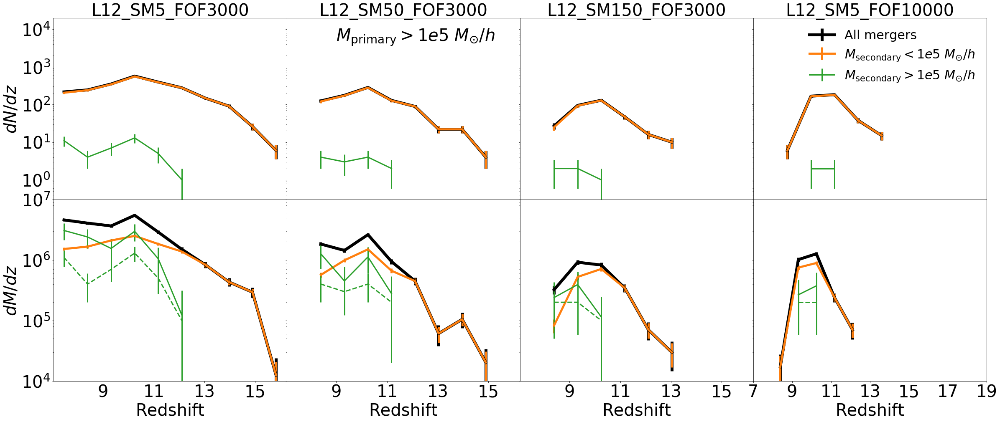

In [70]:


def make_plot(i):
    
    mass_unit_conv=1e10
    merging_time,primary_id,primary_mass,hosthalomass_primary,hosthalostellarmass_primary,hosthalogasmass_primary,hosthalodmmass_primary,secondary_id,secondary_mass,hosthalomass_secondary,hosthalostellarmass_secondary,hosthalogasmass_secondary,hosthalodmmass_secondary,file_id_complete=arepo_package.get_merger_events_hosts(basePath,HDF5=1,SORT_PRIMARY_SECONDARY=0)
    merging_redshift = 1./merging_time-1
    probingmass=1e5/1e10
    probingmass2=1e5/1e10

    minmass=numpy.amin([secondary_mass,primary_mass],axis=0)
    maxmass=numpy.amax([secondary_mass,primary_mass],axis=0)
#    diff=numpy.diff(loghosthalodmmass_space)[0]

    ax=axx[0,i]




    mask0=(maxmass>probingmass)
    mask1=(minmass<probingmass) & (maxmass>probingmass)
    mask2=(minmass>probingmass) & (maxmass>probingmass)


    mask02=(maxmass>probingmass)
    mask12=(minmass<probingmass2) & (maxmass>probingmass2)
    mask22=(minmass>probingmass2) & (maxmass>probingmass2)

    centers,HMF,dHMF=get_distribution(merging_redshift[mask0],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF,dHMF,label='All mergers',color='black',linewidth=7)

    centers,HMF,dHMF=get_distribution(merging_redshift[mask1],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF,dHMF,label='$M_{\mathrm{secondary}}<1e5 \ M_{\odot}/h$',color='C1',linewidth=5)
    #centers,HMF,dHMF=get_distribution(merging_redshift[mask2],20,6,20,linear=1)
    #ax.errorbar(centers,HMF*1.5675e-7*20*1.6*6,label='Mpri > 1e4 Msun, Msec > 1e4 Msun \n (unresolved mergers)')
    centers,HMF,dHMF=get_distribution(merging_redshift[mask2],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF,dHMF,label='$M_{\mathrm{secondary}}>1e5 \ M_{\odot}/h$',color='C2',linewidth=3)




    ax.tick_params(labelsize=30)
    #ax.legend(loc='lower left',fontsize=20)
    ax.set_yscale('log')
    
    ax.set_ylim(0.3,20000)

    ax=axx[1,i]
    centers,HMF,dHMF=get_prop_distribution(merging_redshift[mask0],minmass[mask0],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF*mass_unit_conv,dHMF*mass_unit_conv,label='Mpri > 1e4 Msun, Msec < 1e4 Msun \n (unresolved mergers)',color='black',linewidth=7)    
    centers,HMF,dHMF=get_prop_distribution(merging_redshift[mask1],minmass[mask1],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF*mass_unit_conv,dHMF*mass_unit_conv,label='Mpri > 1e4 Msun, Msec < 1e4 Msun \n (unresolved mergers)',color='C1',linewidth=5)

    
    mass_per_merger=1e-5
    centers,HMF,dHMF=get_distribution(merging_redshift[mask2],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF*mass_per_merger*mass_unit_conv, dHMF*mass_per_merger*mass_unit_conv, linestyle='dashed',label='Mpri > 1e4 Msun, Msec > 1e4 Msun \n (unresolved mergers)',color='C2',linewidth=3)
    centers,HMF,dHMF=get_prop_distribution(merging_redshift[mask2],minmass[mask2],Nbins, minm, maxm,linear=1)
    ax.errorbar(centers,HMF*mass_unit_conv,dHMF*mass_unit_conv,label='Mpri > 1e4 Msun, Msec > 1e4 Msun \n (resolved mergers)',color='C2',linewidth=3)


    
    

    axx[0,0].set_ylabel('$dN/dz$',fontsize=label_fontsize)
    axx[1,0].set_ylabel(r'$dM/dz$',fontsize=label_fontsize)

    #axx[1].set_xlabel('Redshift',fontsize=20)
    #ax.set_ylabel('Mass growth rate',fontsize=20)
    #.legend(loc='lower left',fontsize=20)
    ax.set_yscale('log')
    
    ax.set_ylim(1e4,1e7)
    
    if(i>0):
        axx[0,i].tick_params(labelleft='off')
        axx[1,i].tick_params(labelleft='off')
        
    axx[1,i].set_xticks([7,9,11,13,15,17,19])
        
    axx[0,i].set_title('L12_SM%d_FOF%d'%(Msfmp,Mh),fontsize=label_fontsize)
    axx[1,i].set_xlabel('Redshift',fontsize=label_fontsize)
    #axx[]
    axx[0,i].tick_params(labelsize=label_fontsize)
    axx[1,i].tick_params(labelsize=label_fontsize)
    
    


levelmax_gas=12
logseedmass_gas=3.19

Nbins, minm, maxm=15,7,20

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs

f,axx=plt.subplots(2,4,figsize=(40,16),sharex=True)
Msfmp=5
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(0)

Msfmp=50
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(1)

Msfmp=150
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(2)




Msfmp=5
Mh=10000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output

#arepo_package.convert_merger_hosts_to_hdf5(basePath)
#arepo_package.convert_merger_events_to_hdf5(basePath)
make_plot(3)

axx[0,3].legend(loc='upper right',fontsize=label_fontsize-10,frameon=False)
axx[0,1].text(9,5e3,'$M_{\mathrm{primary}}>1e5 \ M_{\odot}/h$',fontsize=label_fontsize)

plt.subplots_adjust(hspace=0,wspace=0)


plt.savefig('./Paper5_figures/Minor_vs_major_mergers_seed5.00.png',bbox_inches='tight')




Desired redshift:  7
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  7
Output redshift:  9.00233985416247
Output snapshot:  16
[5.28120841e-05 7.57590877e-04 1.08676631e-02 1.55896942e-01
 2.23634616e+00 3.20804505e+01 4.60194992e+02]
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
[2.93654077e-04 4.21247625e-03 6.04280940e-02 8.66842760e-01
 1.24348845e+01 1.78378779e+02 2.55884876e+03]
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
[5.28120841e-05 7.57590877e-04 1.08676631e-02 1.55896942e-01
 2.23634616e+00 3.20804505e+01 4.60194992e+02]
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
[7.52083860e-04 1.07886648e-02 1.54763709e-01 2.22008989e+

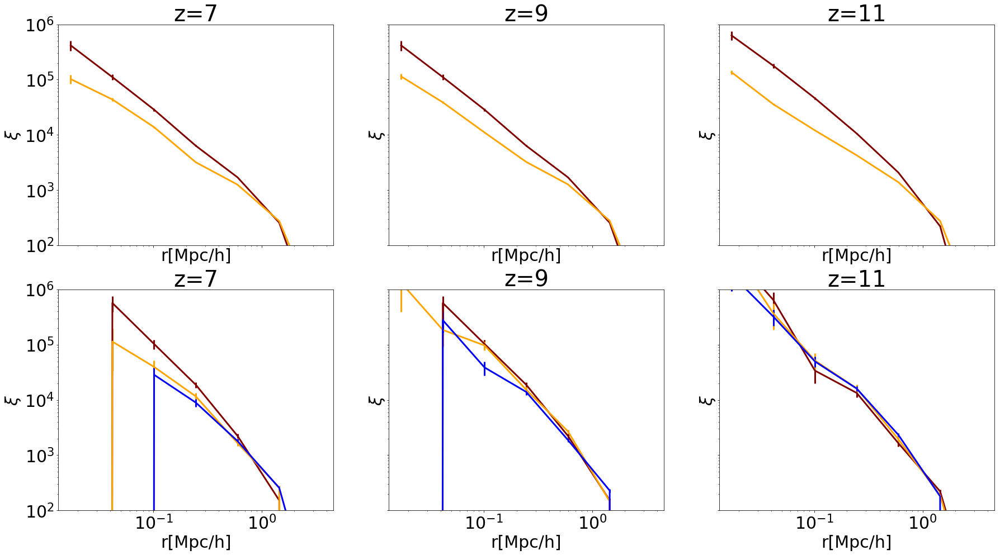

In [22]:
Mh,Msfmp=3000,50

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath1=path_to_output+run+output
    
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d_seed4.10/'%(Mh,Msfmp)
basePath2=path_to_output+run+output

output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d_seed5.00/'%(Mh,Msfmp)
basePath3=path_to_output+run+output



def make_plot(style='solid'):
    j=0
    for mmass_cut in [1.25e4,1e5]:
        mass_cut=mmass_cut/1e10
        i=0
        for redshift in [7,9,11]:
            ax=axx[j,i]
            i+=1

            Coordinates,o=arepo_package.get_particle_property(basePath1,'Coordinates',5,redshift)
            BH_Mass,o=arepo_package.get_particle_property(basePath1,'BH_Mass',5,redshift)
            Coordinates/=1e3
            r, DD,RR=arepo_package.correlate_info(Coordinates[BH_Mass>=mass_cut], 7, 1e-2, 5, 25000, WRAP=1)
            xi=DD/RR-1
            dxi=numpy.sqrt(DD)/RR-1
            print(RR)
            ax.errorbar(r,xi,dxi,color='maroon',linewidth=3,linestyle=style)



            Coordinates,o=arepo_package.get_particle_property(basePath2,'Coordinates',5,redshift)
            BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
            Coordinates/=1e3
            r, DD,RR=arepo_package.correlate_info(Coordinates[BH_Mass>=mass_cut], 7, 1e-2, 5, 25000, WRAP=1)
            xi=DD/RR-1
            dxi=numpy.sqrt(DD)/RR-1
            print(RR)
            ax.errorbar(r,xi,dxi,color='orange',linewidth=3,linestyle=style)

            if(j>0):
                Coordinates,o=arepo_package.get_particle_property(basePath3,'Coordinates',5,redshift)
                BH_Mass,o=arepo_package.get_particle_property(basePath3,'BH_Mass',5,redshift)
                Coordinates/=1e3
                r, DD,RR=arepo_package.correlate_info(Coordinates[BH_Mass>=mass_cut], 7, 1e-2, 5, 25000, WRAP=1)
                xi=DD/RR-1
                dxi=numpy.sqrt(DD)/RR-1
                print(RR)
                ax.errorbar(r,xi,dxi,color='blue',linewidth=3,linestyle=style)




            ax.set_title('z=%d'%redshift,fontsize=40)


            ax.set_xlabel('r[Mpc/h]',fontsize=30)
            ax.set_ylabel(r'$\xi$',fontsize=30)

            ax.set_ylim(1e2,1e6)

            ax.tick_params(labelsize=30)
            ax.set_yscale('log')
            ax.set_xscale('log')
        j+=1
        

f,axx=plt.subplots(2,3,figsize=(30,16),sharey=True,sharex=True)
make_plot(style='solid')


In [12]:
def min_dis(x1,x2,BOXSIZE=25000): 
        xdis_option1=(x1-x2)*(x1-x2)
        #print xdis_option1
        xdis_option2=(x1-x2+BOXSIZE)*(x1-x2+BOXSIZE)
        xdis_option3=(x1-x2-BOXSIZE)*(x1-x2-BOXSIZE)
        return numpy.amin(numpy.array([xdis_option1,xdis_option2,xdis_option3]),axis=0)

def calc_dis_square(pos1,pos2): # Calculates the distance between the two bjects in the box using periodic boundary condition   

        xdis2 = min_dis(pos1[0],pos2[0])
        ydis2 = min_dis(pos1[1],pos2[1])
        zdis2 = min_dis(pos1[2],pos2[2])
        calc_dis = xdis2+ydis2+zdis2
        return calc_dis
    
def calc_dis_square_vectorized(pos1,pos2,PROJECTION_MODE=0,PROJECTION='z'):# Calculates the distance between the two objects in the box using periodic boundary condition, the second argument can be a vector   

        
        xdis2 = min_dis(pos1[0],pos2[:,0])
        ydis2 = min_dis(pos1[1],pos2[:,1])
        zdis2 = min_dis(pos1[2],pos2[:,2])
        
        #print xdis2
        if (PROJECTION=='z'):
            par_dis=xdis2+ydis2
            los_dis=zdis2
        if (PROJECTION=='x'):
            par_dis=ydis2+zdis2
            los_dis=xdis2
        if (PROJECTION=='y'):
            par_dis=xdis2+zdis2
            los_dis=ydis2
        if (PROJECTION_MODE):    
            return par_dis,los_dis
        else:
            return par_dis+los_dis

def get_no_of_ngbs_ana(Coordinate,GroupSM,GroupPos):
    dist=calc_dis_square_vectorized(Coordinate,GroupPos)
    #max_dist=2000.
    mask=dist<max_dist*max_dist
    hostmass=0
    mask2 =GroupSM > 10**log_galaxy_mass_cut/unit_mass_conv
    return len(dist[mask&mask2])






BH_Mass_cut =1e5
log_galaxy_mass_cut = 8
unit_mass_conv= 1e10


desired_redshift=9


def get_N_Ngb(basePath):
    Coordinates,o=arepo_package.get_particle_property(basePath,'Coordinates',5,desired_redshift)
    BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)

    GroupPos,o=arepo_package.get_group_property(basePath,'GroupPos',desired_redshift)
    GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
    GroupSM=GroupMassType[:,4]
    maskBH = BH_Mass>BH_Mass_cut/unit_mass_conv
    N_Ngb = numpy.array([get_no_of_ngbs_ana(Coordinate,GroupSM,GroupPos) for Coordinate in Coordinates])
    return N_Ngb,BH_Mass

for max_dist in [50,100,200,500]:
    print("------")
    Mh,Msfmp=3000,5
    levelmax_gas,logseedmass_gas=12,3.19
    '''
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    
    output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d_seed4.10/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    N_Ngb,BH_Mass=get_N_Ngb(basePath)
    numpy.save(basePath+'galaxy_env_galcut%.2f_maxdist%.2f.npy'%(log_galaxy_mass_cut,max_dist),[N_Ngb,BH_Mass])

    output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d_seed5.00/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    N_Ngb,BH_Mass=get_N_Ngb(basePath)
    numpy.save(basePath+'galaxy_env_galcut%.2f_maxdist%.2f.npy'%(log_galaxy_mass_cut,max_dist),[N_Ngb,BH_Mass])

    
    '''
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_test_0.48_2.88_new_no_ex_new9_bFOF3_env/'
    basePath=path_to_output+run+output
    
    N_Ngb,BH_Mass=get_N_Ngb(basePath)
    numpy.save(basePath+'galaxy_env_galcut%.2f_maxdist%.2f.npy'%(log_galaxy_mass_cut,max_dist),[N_Ngb,BH_Mass])






















------
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
------
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
------
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
------
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16


In [26]:
def min_dis(x1,x2,BOXSIZE=25000): 
        xdis_option1=(x1-x2)*(x1-x2)
        #print xdis_option1
        xdis_option2=(x1-x2+BOXSIZE)*(x1-x2+BOXSIZE)
        xdis_option3=(x1-x2-BOXSIZE)*(x1-x2-BOXSIZE)
        return numpy.amin(numpy.array([xdis_option1,xdis_option2,xdis_option3]),axis=0)

def calc_dis_square(pos1,pos2): # Calculates the distance between the two bjects in the box using periodic boundary condition   

        xdis2 = min_dis(pos1[0],pos2[0])
        ydis2 = min_dis(pos1[1],pos2[1])
        zdis2 = min_dis(pos1[2],pos2[2])
        calc_dis = xdis2+ydis2+zdis2
        return calc_dis
    
def calc_dis_square_vectorized(pos1,pos2,PROJECTION_MODE=0,PROJECTION='z'):# Calculates the distance between the two objects in the box using periodic boundary condition, the second argument can be a vector   

        
        xdis2 = min_dis(pos1[0],pos2[:,0])
        ydis2 = min_dis(pos1[1],pos2[:,1])
        zdis2 = min_dis(pos1[2],pos2[:,2])
        
        #print xdis2
        if (PROJECTION=='z'):
            par_dis=xdis2+ydis2
            los_dis=zdis2
        if (PROJECTION=='x'):
            par_dis=ydis2+zdis2
            los_dis=xdis2
        if (PROJECTION=='y'):
            par_dis=xdis2+zdis2
            los_dis=ydis2
        if (PROJECTION_MODE):    
            return par_dis,los_dis
        else:
            return par_dis+los_dis

def get_no_of_ngbs_ana(Coordinate,GroupSM,GroupPos):
    dist=calc_dis_square_vectorized(Coordinate,GroupPos)
    #max_dist=2000.
    mask=dist<max_dist*max_dist
    hostmass=0
    mask2 =GroupSM > 10**log_galaxy_mass_cut/unit_mass_conv
    return len(dist[mask&mask2])






BH_Mass_cut =1e5
lum_cut = 1e40
log_galaxy_mass_cut = 6
unit_mass_conv= 1e10


desired_redshift=9


def get_N_Ngb(basePath):
    Coordinates,o=arepo_package.get_particle_property(basePath,'Coordinates',5,desired_redshift)
    BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
    BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,desired_redshift)
    BH_lum= BH_Mdot*total_conv

    GroupPos,o=arepo_package.get_group_property(basePath,'GroupPos',desired_redshift)
    GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
    GroupSM=GroupMassType[:,4]
    maskBH = BH_lum>lum_cut
    N_Ngb = numpy.array([get_no_of_ngbs_ana(Coordinate,GroupSM,GroupPos) for Coordinate in Coordinates])
    return N_Ngb,BH_Mass,BH_lum

for max_dist in [50,100,200,500]:
    print("------")
    Mh,Msfmp=3000,5
    levelmax_gas,logseedmass_gas=12,3.19

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    N_Ngb,BH_Mass,BH_lum=get_N_Ngb(basePath)
    numpy.save(basePath+'galaxy_env_galcut%.2f_maxdist%.2f_lum.npy'%(log_galaxy_mass_cut,max_dist),[N_Ngb,BH_Mass,BH_lum])
   
    output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d_seed4.10/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    N_Ngb,BH_Mass,BH_lum=get_N_Ngb(basePath)
    numpy.save(basePath+'galaxy_env_galcut%.2f_maxdist%.2f_lum.npy'%(log_galaxy_mass_cut,max_dist),[N_Ngb,BH_Mass,BH_lum])

    output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d_seed5.00/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    N_Ngb,BH_Mass,BH_lum=get_N_Ngb(basePath)
    numpy.save(basePath+'galaxy_env_galcut%.2f_maxdist%.2f_lum.npy'%(log_galaxy_mass_cut,max_dist),[N_Ngb,BH_Mass,BH_lum])

    
    '''
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_test_0.48_2.88_new_no_ex_new9_bFOF3_env/'
    basePath=path_to_output+run+output
    
    N_Ngb,BH_Mass=get_N_Ngb(basePath)
    numpy.save(basePath+'galaxy_env_galcut%.2f_maxdist%.2f_lum.npy'%(log_galaxy_mass_cut,max_dist),[N_Ngb,BH_Mass])
    '''





















------
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
------
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output

[4.08657e+07 2.93024e+07 3.14048e+07 3.27188e+07 1.76077e+07 1.24831e+07
 2.33894e+07 1.98415e+07 1.58995e+07 3.46898e+07 2.07613e+07 3.79748e+07
 1.51111e+07 2.45720e+07 5.80792e+07 3.57410e+07 1.95787e+07 1.70821e+07
 1.70821e+07 6.04444e+06 8.97468e+07 1.09063e+08 4.41507e+07 1.35343e+07
 2.27323e+07 1.78705e+07 1.18261e+07 3.19304e+07 3.65294e+07 2.72000e+07
 1.53739e+07 3.77120e+07 4.20483e+06 3.63980e+07 2.75942e+07 1.98415e+07
 1.78968e+08 5.80792e+07 7.09565e+06 1.30087e+07 2.72000e+07 7.51613e+07
 2.29952e+07 5.76850e+07 2.81198e+07 4.59903e+07 1.10377e+07 6.57004e+06
 4.12599e+07 1.30087e+07 6.43864e+06 1.62937e+07 3.40328e+07 1.76603e+08
 1.32715e+07 2.44406e+07 9.46086e+07 1.85275e+07 1.34029e+07 1.37971e+07
 2.04985e+07 4.11285e+07 4.74357e+07 3.82377e+07 2.18125e+07 2.29952e+07
 2.02357e+07 1.73449e+07 3.58724e+07 1.10377e+07 6.96425e+06 2.02357e+07
 4.33623e+06 2.87768e+07 8.93526e+06 7.14821e+07 2.57546e+07 3.27188e+07
 2.04985e+07 1.56367e+07 1.41913e+07 7.62125e+06 1.

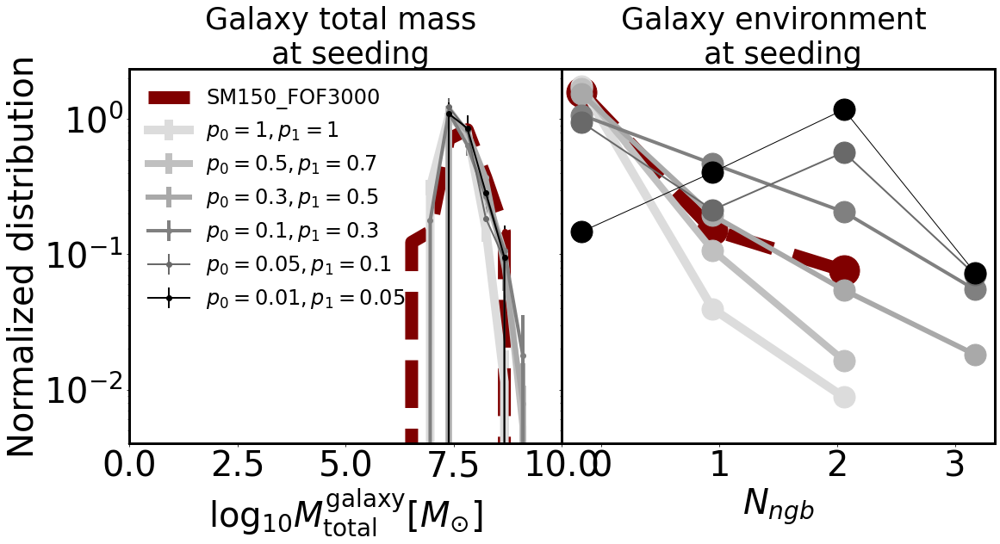

In [35]:

f,axx=plt.subplots(1,2,figsize=(18,8),sharey=True)

LogTargetGroupBHMass=4.10
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19
Msfmp,Mh=150,3000
Nbins,minimum,maximum=20,4,10
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)


basePath=path_to_output+run+output

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_min_redshift_space=data[0]
unique_LogGroupStellarMass_min_redshift_space=data[1]
unique_LogGroupSFR_min_redshift_space=data[2]
unique_LogGroupSF_min_redshift_space=data[3]
unique_LogGroupSFMP_min_redshift_space=data[4]
unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
unique_LogGroupGasMetallicity_min_redshift_space=data[6]
unique_min_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_max_redshift_space=data[0]
unique_LogGroupStellarMass_max_redshift_space=data[1]
unique_LogGroupSFR_max_redshift_space=data[2]
unique_LogGroupSF_max_redshift_space=data[3]
unique_LogGroupSFMP_max_redshift_space=data[4]
unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
unique_LogGroupGasMetallicity_max_redshift_space=data[6]
unique_max_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_target_redshift_space=data[0]
unique_LogGroupStellarMass_target_redshift_space=data[1]
unique_LogGroupSFR_target_redshift_space=data[2]
unique_LogGroupSF_target_redshift_space=data[3]
unique_LogGroupSFMP_target_redshift_space=data[4]
unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
unique_LogGroupGasMetallicity_target_redshift_space=data[6]
unique_target_redshift_space=data[7]

unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)





unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)
levelmax,logseedmass=11,4.10


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw/'
basePath2=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.5_0.7_slope1.6/'
basePath3=path_to_output+run+output





path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.3_0.5_slope1.6/'
basePath4=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
basePath5=path_to_output+run+output

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.05_0.1_slope1.6/'
basePath6=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.01_0.05_slope1.6/'
basePath7=path_to_output+run+output







Nbins,minimum,maximum=15,4,10
col_gas='maroon'
col_bFOF='gainsboro'
col_bFOF2='silver'
col_bFOF3='darkgrey'
col_bFOF4='gray'
col_bFOF5='dimgray'
col_bFOF6='black'





a,b,c=get_distribution(unique_LogGroupMass_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[0].errorbar(a-log10(h), b/norm,linewidth=15,marker='o',color=col_gas,linestyle='dashed',label='SM150_FOF3000')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,gg=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)

print(FOFDMmass_complete*1e10)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='$p_0=1,p_1=1$')#ax.set_yscale('log')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,gg=arepo_package.get_seeding_events4(basePath3,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=8,color=col_bFOF2,label='$p_0=0.5,p_1=0.7$')#ax.set_yscale('log')


scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,gg=arepo_package.get_seeding_events4(basePath4,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=6,color=col_bFOF3,label='$p_0=0.3,p_1=0.5$')#ax.set_yscale('log')


scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,gg=arepo_package.get_seeding_events4(basePath5,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=4,color=col_bFOF4,label='$p_0=0.1,p_1=0.3$')#ax.set_yscale('log')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,gg=arepo_package.get_seeding_events4(basePath6,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=2,color=col_bFOF5,label='$p_0=0.05,p_1=0.1$')#ax.set_yscale('log')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,gg=arepo_package.get_seeding_events4(basePath7,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=2,color=col_bFOF6,label='$p_0=0.01,p_1=0.05$')#ax.set_yscale('log')





Nbins,minimum,maximum=10,-1,4
a,b,c=get_distribution(unique_GroupNeighbors_max_redshift_space,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
#b/=norm
axx[1].errorbar(a[maskb], b[maskb]/norm,linewidth=15,marker='o',ms=35,color=col_gas,zorder=10,linestyle='dashed',label='L12_SM5_FOF3000')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,gg=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
axx[1].errorbar(a[maskb], b[maskb]/norm,linewidth=10,marker='o',ms=25,color=col_bFOF,zorder=10,linestyle='solid',label='L12_SM5_FOF3000')


scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,gg=arepo_package.get_seeding_events4(basePath3,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
axx[1].errorbar(a[maskb], b[maskb]/norm,linewidth=8,marker='o',ms=25,color=col_bFOF2,zorder=10,linestyle='solid',label='L12_SM5_FOF3000')


scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,gg=arepo_package.get_seeding_events4(basePath4,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
axx[1].errorbar(a[maskb], b[maskb]/norm,linewidth=6,marker='o',ms=25,color=col_bFOF3,zorder=10,linestyle='solid',label='L12_SM5_FOF3000')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,gg=arepo_package.get_seeding_events4(basePath5,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
axx[1].errorbar(a[maskb], b[maskb]/norm,linewidth=4,marker='o',ms=25,color=col_bFOF4,zorder=10,linestyle='solid',label='L12_SM5_FOF3000')



scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,gg=arepo_package.get_seeding_events4(basePath6,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
axx[1].errorbar(a[maskb], b[maskb]/norm,linewidth=2,marker='o',ms=25,color=col_bFOF5,zorder=10,linestyle='solid',label='L12_SM5_FOF3000')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,gg=arepo_package.get_seeding_events4(basePath7,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
axx[1].errorbar(a[maskb], b[maskb]/norm,linewidth=1,marker='o',ms=25,color=col_bFOF6,zorder=10,linestyle='solid',label='L12_SM5_FOF3000')





axx[0].set_yscale('log')

axx[0].tick_params(labelsize=label_fontsize)

axx[1].tick_params(labelsize=label_fontsize)

axx[0].set_xlabel('$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)
axx[1].set_xlabel('$N_{ngb}$',fontsize=label_fontsize)

axx[0].set_ylabel('Normalized distribution',fontsize=label_fontsize)


axx[0].set_title('Galaxy total mass \n at seeding',fontsize=label_fontsize-5)

axx[1].set_title('Galaxy environment \n at seeding',fontsize=label_fontsize-5)


axx[0].legend(loc='upper left',fontsize=label_fontsize-16,frameon=False)

plt.subplots_adjust(wspace=0)

axx[0].set_xlim(0,10)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)  


plt.savefig('./Paper5_figures/subhalo_based_models_Msfmp150_different_envs.png',bbox_inches='tight')



#axx[1].set_yscale('log')



Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[2.62119129e-06 2.07838605e-05 1.64798677e-04 1.30671605e-03
 1.03611683e-02 8.21554222e-02 6.51423970e-01 5.16524871e+00]
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[1.98586626e-05 1.57462630e-04 1.24854731e-03 9.89993872e-03
 7.84982563e-02 6.22425695e-01 4.93531658e+00 3.91329438e+01]
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[1.01880265e-05 8.07825521e-05 6.40538256e-04 5.0789

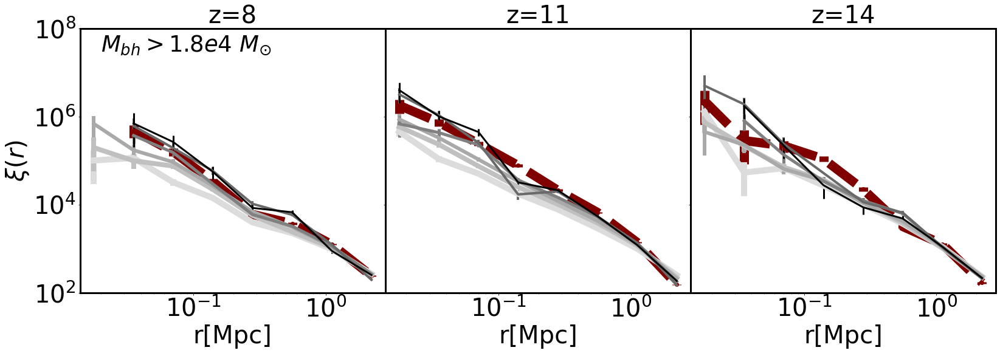

In [36]:



def make_plot(ax):
    for redshift in [desired_redshift]:
        ax.set_title('$z=%d$'%desired_redshift,fontsize=label_fontsize)

        dist_bins, max_dist,min_dist = 8, 8e-3, 2


        Coordinates,o=arepo_package.get_particle_property(basePath,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_gas,linewidth=15,linestyle='dashed',marker='o',label='SM150_FOF3000')


        Coordinates,o=arepo_package.get_particle_property(basePath2,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath2,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF,linewidth=10,label='$p_0,p_1 = 1,1$')



        Coordinates,o=arepo_package.get_particle_property(basePath3,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath3,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath3,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF2,linewidth=8,label='$p_0,p_1 = 0.5,0.7$')



        Coordinates,o=arepo_package.get_particle_property(basePath4,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath4,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath4,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=6,label='$p_0,p_1 = 0.3,0.5$')



        Coordinates,o=arepo_package.get_particle_property(basePath5,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath5,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath5,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF4,linewidth=5,label='$p_0,p_1 = 0.1,0.3$')
        
        
        
        Coordinates,o=arepo_package.get_particle_property(basePath6,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath6,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath6,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF5,linewidth=4,label='$p_0,p_1 = 0.05,0.1$')
        
        
        
        Coordinates,o=arepo_package.get_particle_property(basePath7,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath7,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath7,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF6,linewidth=3,label='$p_0,p_1 = 0.01,0.05$')



        ax.set_title('z=%d'%redshift,fontsize=40)


        ax.set_xlabel('r[Mpc]',fontsize=label_fontsize)


        #ax.set_ylim(1e2,1e6)

        ax.tick_params(labelsize=label_fontsize)
        ax.set_yscale('log')
        ax.set_xscale('log')

        
        
f,axx=plt.subplots(1,3,figsize=(27,8),sharex=True,sharey=True)

mass_cut=1.25e4/1e10
lum_cut=0

desired_redshift=8
make_plot(axx[0])


desired_redshift=11
make_plot(axx[1])



desired_redshift=14
make_plot(axx[2])

axx[0].set_ylabel(r'$\xi(r)$',fontsize=label_fontsize)
axx[0].text(0.02,3e7,r'$M_{bh}>1.8e4 \ M_{\odot}$',fontsize=label_fontsize-3)

#axx[1].legend(loc='upper right',fontsize=label_fontsize-20,frameon=False)

axx[0].set_ylim(1e2,1e8)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)  

plt.subplots_adjust(wspace=0)

plt.savefig('./Paper5_figures/subhalo_based_models2_env.png',bbox_inches='tight')

        

Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[2.62119129e-06 2.07838605e-05 1.64798677e-04 1.30671605e-03
 1.03611683e-02 8.21554222e-02 6.51423970e-01 5.16524871e+00]
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[1.03858523e-05 8.23511454e-05 6.52975892e-04 5.17755416e-03
 4.10536857e-02 3.25521484e-01 2.58111384e+00 2.04660798e+01]


NameError: name 'basePath3' is not defined

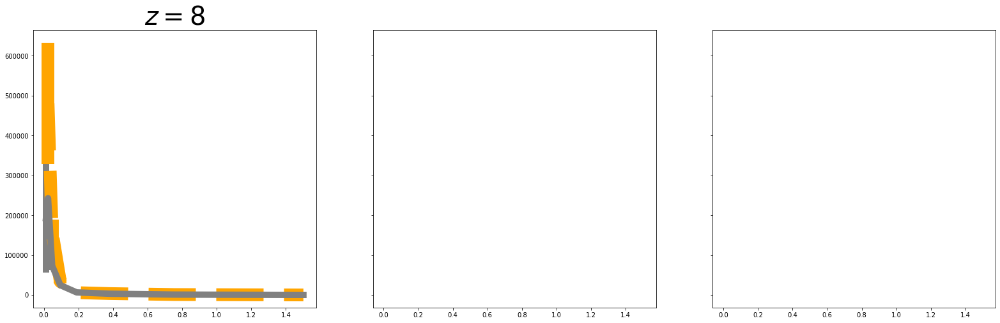

In [87]:



def make_plot(ax):
    for redshift in [desired_redshift]:
        ax.set_title('$z=%d$'%desired_redshift,fontsize=label_fontsize)

        dist_bins, max_dist,min_dist = 8, 8e-3, 2


        Coordinates,o=arepo_package.get_particle_property(basePath,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask],xi[mmask],dxi[mmask],color='orange',linewidth=20,linestyle='dashed',marker='o',label='High resolution')


        Coordinates,o=arepo_package.get_particle_property(basePath2,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath2,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask],xi[mmask],dxi[mmask],color='grey',linewidth=10,label='$p_0,p_1 = 1,1$')



        Coordinates,o=arepo_package.get_particle_property(basePath3,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath3,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath3,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        #ax.errorbar(r[mmask],xi[mmask],dxi[mmask],color=col_bFOF2,linewidth=8,label='$p_0,p_1 = 0.5,0.7$')



        Coordinates,o=arepo_package.get_particle_property(basePath4,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath4,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath4,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        #ax.errorbar(r[mmask],xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=6,label='$p_0,p_1 = 0.3,0.5$')



        Coordinates,o=arepo_package.get_particle_property(basePath5,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath5,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath5,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask],xi[mmask],dxi[mmask],color=col_bFOF6,linewidth=5,label='$p_0,p_1 = 0.1,0.3$')
        
        
        
        Coordinates,o=arepo_package.get_particle_property(basePath6,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath6,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath6,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        #ax.errorbar(r[mmask],xi[mmask],dxi[mmask],color=col_bFOF6,linewidth=4,label='$p_0,p_1 = 0.05,0.1$')
        
        
        
        Coordinates,o=arepo_package.get_particle_property(basePath7,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath7,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath7,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        #ax.errorbar(r[mmask],xi[mmask],dxi[mmask],color=col_bFOF6,linewidth=3,label='$p_0,p_1 = 0.01,0.05$')



        ax.set_title('z=%d'%redshift,fontsize=40)


        ax.set_xlabel('r[Mpc/h]',fontsize=label_fontsize)


        #ax.set_ylim(1e2,1e6)

        ax.tick_params(labelsize=label_fontsize)
        ax.set_yscale('log')
        ax.set_xscale('log')

        
        
f,axx=plt.subplots(1,3,figsize=(27,8),sharex=True,sharey=True)

mass_cut=1.25e4/1e10
lum_cut=0

desired_redshift=8
make_plot(axx[0])


desired_redshift=11
make_plot(axx[1])



desired_redshift=14
make_plot(axx[2])

axx[0].set_ylabel(r'$\xi(r)$',fontsize=label_fontsize)
axx[0].text(0.02,1e6,r'$M_{bh}>1.25e4 \ M_{\odot}/h$',fontsize=label_fontsize-3)

#axx[1].legend(loc='upper right',fontsize=label_fontsize-20,frameon=False)

axx[0].set_ylim(1e2,4e6)

plt.subplots_adjust(wspace=0.1)

#plt.savefig('./Paper5_figures/subhalo_based_models2_env.png',bbox_inches='tight')

        

Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  12
Output redshift:  11.980213315300293
Output snapshot:  13
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  14
Output redshift:  14.033992144452485
Output snapshot:  11
Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10
Desired redshift:  16
Output redshift:  16.005041538113627
Output snapshot:  9
Desired redshift:  17
Output redshift:  16.999960992518137
Output snapshot:  8
Desired redshift:  18
Output redshift:  17.963024604582767
Output snapshot:  7
Desired redshift:  19
Output redshift:  18.977615635027277
Output snapshot:  6
Desired redshift:  20
Output redshift:  20.0464909

Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  12
Output redshift:  11.980213315300293
Output snapshot:  13
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  14
Output redshift:  14.033992144452485
Output snapshot:  11
Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10
Desired redshift:  16
Output redshift:  16.005041538113627
Output snapshot:  9
Desired redshift:  17
Output redshift:  16.999960992518137
Output snapshot:  8
Desired redshift:  18
Output redshift:  17.963024604582767
Output snapshot:  7
Desired redshift:  19
Output redshift:  18.977615635027277
Output snapshot:  6
Desired redshift:  20
Output redshift:  20.046490988807516
Output snapshot:  5
Desired redshift:  21
Output redshift:  20.963426641402698
Output snapshot:  4


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Desired redshift:  22
Output redshift:  22.029171828882646
Output snapshot:  3
Desired redshift:  23
Output redshift:  23.032487237179105
Output snapshot:  2
Desired redshift:  24
Output redshift:  23.960960799485814
Output snapshot:  1


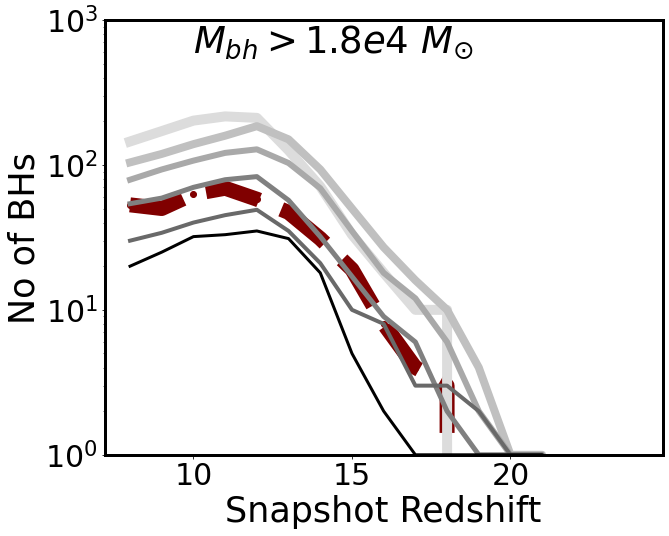

In [39]:
def make_plot(style='solid'):

    redshift_space=numpy.arange(8,25)

    BH_no_space=[]

    

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_gas,linewidth=15,linestyle='dashed',marker='o')


    BH_no_space=[]

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF,linewidth=10,linestyle=style)
    
    BH_no_space=[]
    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath3,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF2,linewidth=8,linestyle=style)

    BH_no_space=[]

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath4,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=6)
  
    BH_no_space=[]  

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath5,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF4,linewidth=5)
   
  
    BH_no_space=[]      
    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath6,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF5,linewidth=4)

    BH_no_space=[]  
    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath7,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF6,linewidth=3)

    

    

    ax.set_yscale('log')

    ax.tick_params(labelsize=30)
    ax.set_xlabel('Snapshot Redshift',fontsize=label_fontsize-5)
    ax.set_ylabel('No of BHs',fontsize=label_fontsize-5)
    


  
    
mass_cut=1.25e4
f,ax=plt.subplots(1,1,figsize=(10,8))
make_plot()
ax.set_ylim(1,1000)

ax.legend(loc='upper right',fontsize=label_fontsize,frameon=False)
ax.text(10,6e2,r'$M_{bh}>1.8e4 \ M_{\odot}$',fontsize=label_fontsize-3)

ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)

plt.savefig('./Paper5_figures/subhalo_based_models2_env_test',bbox_inches='tight')





[1.33109e+08 7.00367e+07 2.79095e+08 1.42044e+08 2.91184e+08 3.08135e+08
 1.85669e+08 7.51613e+07 1.31532e+08 1.20889e+08 6.85912e+07 7.01681e+07
 2.63327e+08 1.98415e+08 2.00255e+08 1.71347e+08 2.82118e+08 1.52162e+08
 8.12057e+07 1.38365e+08 1.11428e+08 6.99053e+07 8.86956e+07 1.28510e+08
 9.76308e+07]


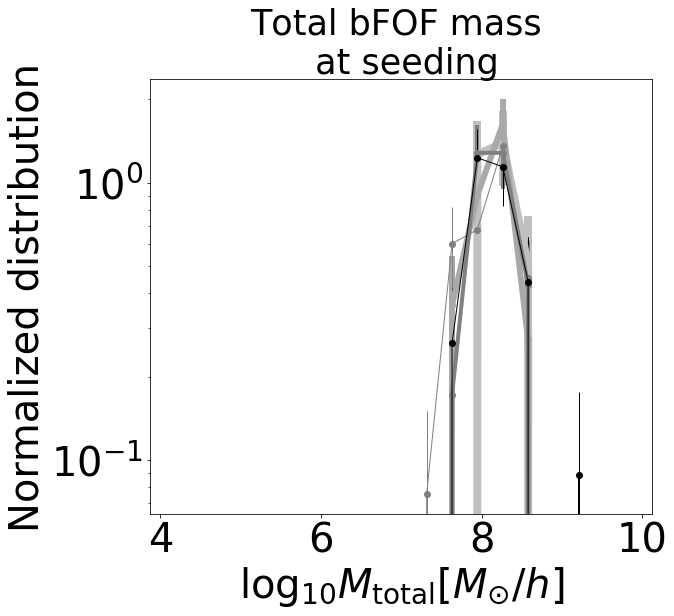

In [17]:

f,axx=plt.subplots(1,1,figsize=(9,8),sharey=True)

LogTargetGroupBHMass=5.00
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=11,4.10
Msfmp,Mh=5,3000
Nbins,minimum,maximum=20,4,10


col_bFOF='silver'
col_bFOF2='darkgrey'
col_bFOF3='grey'
col_bFOF4='gray'
col_bFOF5='black'

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.32_1.83_new_no_ex_new9_bFOF3_env_prob0.3_0.7_mod0.8_powerlaw4_seed5.00/'
basePath1=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.32_1.83_new_no_ex_new9_bFOF3_env_prob0.3_0.7_mod0.8_powerlaw4_seed5.00_2/'
basePath2=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.32_1.83_new_no_ex_new9_bFOF3_env_prob0.3_0.7_mod0.8_powerlaw4_seed5.00_3/'
basePath3=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.32_1.83_new_no_ex_new9_bFOF3_env_prob0.3_0.7_mod0.8_powerlaw4_seed5.00_4/'
basePath4=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.32_1.83_new_no_ex_new9_bFOF3_env_prob0.3_0.7_mod0.8_powerlaw4_seed5.00_5/'
basePath5=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.48_2.88_new_no_ex_new9_bFOF3_env_prob0.3_0.7_mod0.8_powerlaw4/'
basePath1_4=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.48_2.88_new_no_ex_new9_bFOF3_env_prob0.3_0.7_mod0.8_powerlaw4_2/'
basePath2_4=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.48_2.88_new_no_ex_new9_bFOF3_env_prob0.3_0.7_mod0.8_powerlaw4_3/'
basePath3_4=path_to_output+run+output

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.48_2.88_new_no_ex_new9_bFOF3_env_prob0.3_0.7_mod0.8_powerlaw4_4/'
basePath4_4=path_to_output+run+output

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.48_2.88_new_no_ex_new9_bFOF3_env_prob0.3_0.7_mod0.8_powerlaw4_5/'
basePath5_4=path_to_output+run+output





scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,DrawnSeedMass=arepo_package.get_seeding_events4(basePath1,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)

print(FOFDMmass_complete*1e10)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b/norm,c/norm,marker='o',linewidth=8,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,DrawnSeedMass=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b/norm,c/norm,marker='o',linewidth=6,color=col_bFOF2,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')


scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,DrawnSeedMass=arepo_package.get_seeding_events4(basePath3,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b/norm,c/norm,marker='o',linewidth=4,color=col_bFOF3,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')


scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,DrawnSeedMass=arepo_package.get_seeding_events4(basePath4,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b/norm,c/norm,marker='o',linewidth=1,color=col_bFOF4,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')



scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,DrawnSeedMass=arepo_package.get_seeding_events4(basePath5,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx.errorbar(a,b/norm,c/norm,marker='o',linewidth=1,color=col_bFOF5,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')





axx.set_yscale('log')

axx.tick_params(labelsize=label_fontsize)

axx.set_xlabel('$\log_{10} M_{\mathrm{total}}[M_{\odot}/h]$',fontsize=label_fontsize)

axx.set_ylabel('Normalized distribution',fontsize=label_fontsize)


axx.set_title('Total bFOF mass \n at seeding',fontsize=label_fontsize-5)



plt.subplots_adjust(wspace=0)

plt.savefig('./Paper5_figures/variance.png',bbox_inches='tight')



#axx[1].set_yscale('log')



Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  12
Output redshift:  11.980213315300293
Output snapshot:  13
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  14
Output redshift:  14.033992144452485
Output snapshot:  11
Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10
Desired redshift:  16
Output redshift:  16.005041538113627
Output snapshot:  9
Desired redshift:  17
Output redshift:  16.999960992518137
Output snapshot:  8
Desired redshift:  18
Output redshift:  17.963024604582767
Output snapshot:  7
Desired redshift:  19
Output redshift:  18.977615635027277
Output snapshot:  6
Desired redshift:  20
Output redshift:  20.046490988807516
Output snapshot:  5
Desired redshift:  21
Output redshift:  20.963426

Desired redshift:  18
Output redshift:  17.963024604582767
Output snapshot:  7
Desired redshift:  19
Output redshift:  18.977615635027277
Output snapshot:  6
Desired redshift:  20
Output redshift:  20.046490988807516
Output snapshot:  5
Desired redshift:  21
Output redshift:  20.963426641402698
Output snapshot:  4
Desired redshift:  22
Output redshift:  22.029171828882646
Output snapshot:  3
Desired redshift:  23
Output redshift:  23.032487237179105
Output snapshot:  2
Desired redshift:  24
Output redshift:  23.960960799485814
Output snapshot:  1
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  12
Output redshift:  11.980213315300293
Output snapshot:  13
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  14
Output redshift:  14.03399214

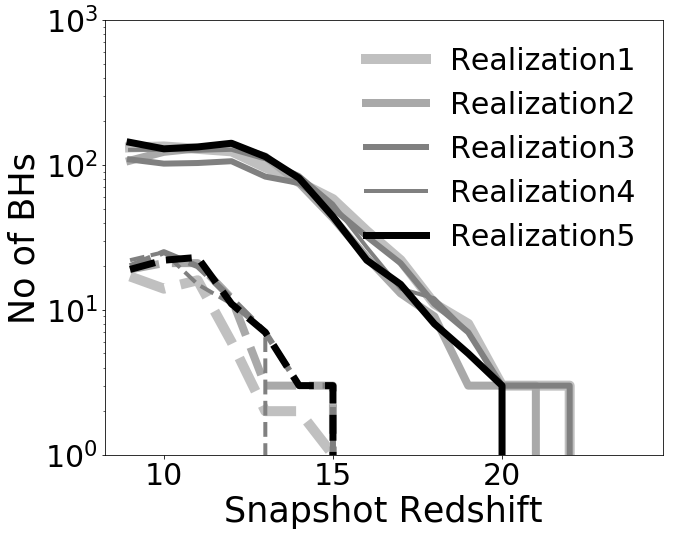

In [8]:
def make_plot(style='solid'):

    redshift_space=numpy.arange(9,25)

    BH_no_space=[]
    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath1,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)
    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF,linewidth=10,linestyle=style)


    BH_no_space=[]
    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)
    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF2,linewidth=8,linestyle=style)
    
    BH_no_space=[]
    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath3,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)
    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=6,linestyle=style)

    BH_no_space=[]
    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath4,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)
    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF4,linewidth=4,linestyle=style)
  
    BH_no_space=[]  
    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath5,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)
    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF5,linewidth=7,linestyle=style)


    

    ax.set_yscale('log')

    
def make_plot2(style='solid'):

    redshift_space=numpy.arange(9,25)

    BH_no_space=[]
    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath1_4,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)
    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF,linewidth=10,linestyle=style,label='Realization1')


    BH_no_space=[]
    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath2_4,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)
    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF2,linewidth=8,linestyle=style,label='Realization2')
    
    BH_no_space=[]
    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath3_4,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)
    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=6,linestyle=style,label='Realization3')

    BH_no_space=[]
    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath4_4,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)
    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF4,linewidth=4,linestyle=style,label='Realization4')
  
    BH_no_space=[]  
    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath5_4,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)
    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF5,linewidth=7,linestyle=style,label='Realization5')


    

    ax.set_yscale('log')

    ax.tick_params(labelsize=30)
    ax.set_xlabel('Snapshot Redshift',fontsize=label_fontsize-5)
    ax.set_ylabel('No of BHs',fontsize=label_fontsize-5)



    
mass_cut=1.25e4
f,ax=plt.subplots(1,1,figsize=(10,8))
make_plot2()
ax.set_ylim(1,1000)
    
mass_cut=1e5
#f,ax=plt.subplots(1,1,figsize=(10,8))
make_plot(style='dashed')







ax.legend(loc='upper right',fontsize=label_fontsize-10,frameon=False)


plt.savefig('./Paper5_figures/variance2.png',bbox_inches='tight')





17 8.012172948865935
Total number of mergers 158
17 8.012172948865935
Total number of mergers 142
18 7.005417045544533
Total number of mergers 175
17 8.012172948865935
Total number of mergers 193
17 8.012172948865935
Total number of mergers 176
18 7.005417045544533
Total number of mergers 13
17 8.012172948865935
Total number of mergers 20
17 8.012172948865935
Total number of mergers 17
17 8.012172948865935
Total number of mergers 21
17 8.012172948865935
Total number of mergers 18


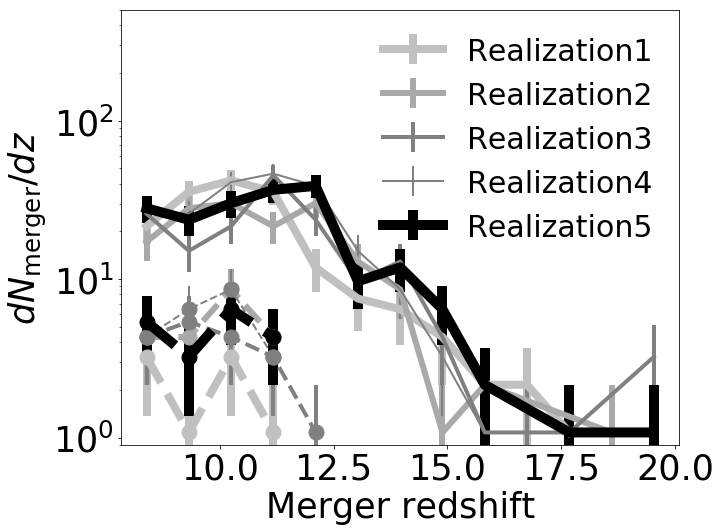

In [32]:
text_fontsize=25

title_fontsize=30

redshift_cut=8



mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=1

nbins=15
min_value=7
max_value=20

upto_redshift=7
f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

ratio=Mh

i=0
HDF5=1
levelmax=11
logseedmass=4.10  

mass_cut=1.25e4


ax=axx

bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath1_4,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
mask=dist>0
ax.errorbar(bins[mask],dist[mask],dist_err[mask],linewidth=8,color=col_bFOF,label='Realization1')


bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath2_4,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
mask=dist>0
ax.errorbar(bins[mask],dist[mask],dist_err[mask],linewidth=6,color=col_bFOF2,label='Realization2')


bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath3_4,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
mask=dist>0
ax.errorbar(bins[mask],dist[mask],dist_err[mask],linewidth=4,color=col_bFOF3,label='Realization3')


bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath4_4,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
mask=dist>0
ax.errorbar(bins[mask],dist[mask],dist_err[mask],linewidth=2,color=col_bFOF4,label='Realization4')

bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath5_4,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
mask=dist>0
ax.errorbar(bins[mask],dist[mask],dist_err[mask],linewidth=10,color=col_bFOF5,label='Realization5')



mass_cut=1e5


ax=axx

bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath1,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
mask=dist>0
ax.errorbar(bins[mask],dist[mask],dist_err[mask],linewidth=8,color=col_bFOF,linestyle='dashed',marker='o',ms=15)


bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath2,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
mask=dist>0
ax.errorbar(bins[mask],dist[mask],dist_err[mask],linewidth=6,color=col_bFOF2,linestyle='dashed',marker='o',ms=15)


bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath3,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
mask=dist>0
ax.errorbar(bins[mask],dist[mask],dist_err[mask],linewidth=4,color=col_bFOF3,linestyle='dashed',marker='o',ms=15)


bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath4,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
mask=dist>0
ax.errorbar(bins[mask],dist[mask],dist_err[mask],linewidth=2,color=col_bFOF4,linestyle='dashed',marker='o',ms=15)

bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath5,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
mask=dist>0
ax.errorbar(bins[mask],dist[mask],dist_err[mask],linewidth=10,color=col_bFOF5,linestyle='dashed',marker='o',ms=15)




axx.set_ylabel('$dN_{\mathrm{merger}}/dz$',fontsize=label_fontsize-5)

axx.set_xlabel('Merger redshift',fontsize=label_fontsize-5)
#set_default_fontsizes(axx[2],'Merger redshift',' ')
#set_default_fontsizes(axx[3],'Merger redshift',' ')
axx.set_ylim(0.9,500)
#axx[0].set_ylim(0.1,100)
#axx[1].set_ylim(0.1,100)

axx.tick_params(labelsize=label_fontsize-5)


axx.legend(loc='upper right',fontsize=label_fontsize,frameon=False)

#set_legend(axx[0],'upper right')

axx.set_yscale('log')
#axx[0].text(12,600,r'$M_{\mathrm{seed}} = 1.25 \times 10^{4} M_{\odot}/h$',fontsize=text_fontsize+2)


#axx[1].text(12,600,r'$M_{\mathrm{seed}} = 1 \times 10^{5} M_{\odot}/h$',fontsize=text_fontsize+2)

plt.subplots_adjust(wspace=0,hspace=0)


ax.legend(loc='upper right',fontsize=label_fontsize-10,frameon=False)


plt.savefig('./Paper5_figures/variance2_Dndz.png',bbox_inches='tight')


#plt.savefig('./Paper2_figures/All_Merger_rates_LW_dependence.png',bbox_inches='tight')





blackhole_seeding2_79.txt
blackhole_seeding2_17.txt
blackhole_seeding2_176.txt
blackhole_seeding2_99.txt
blackhole_seeding2_55.txt
blackhole_seeding2_138.txt
blackhole_seeding2_59.txt
blackhole_seeding2_120.txt
blackhole_seeding2_125.txt
blackhole_seeding2_39.txt
blackhole_seeding2_205.txt
blackhole_seeding2_98.txt
blackhole_seeding2_253.txt
blackhole_seeding2_163.txt
blackhole_seeding2_220.txt
blackhole_seeding2_193.txt
blackhole_seeding2_254.txt
blackhole_seeding2_233.txt
blackhole_seeding2_4.txt
blackhole_seeding2_157.txt
blackhole_seeding2_214.txt
blackhole_seeding2_23.txt
blackhole_seeding2_186.txt
blackhole_seeding2_245.txt
blackhole_seeding2_77.txt
blackhole_seeding2_5.txt
blackhole_seeding2_231.txt
blackhole_seeding2_134.txt
blackhole_seeding2_206.txt
blackhole_seeding2_142.txt
blackhole_seeding2_54.txt
blackhole_seeding2_200.txt
blackhole_seeding2_199.txt
blackhole_seeding2_36.txt
blackhole_seeding2_140.txt
blackhole_seeding2_63.txt
blackhole_seeding2_82.txt
blackhole_seeding2

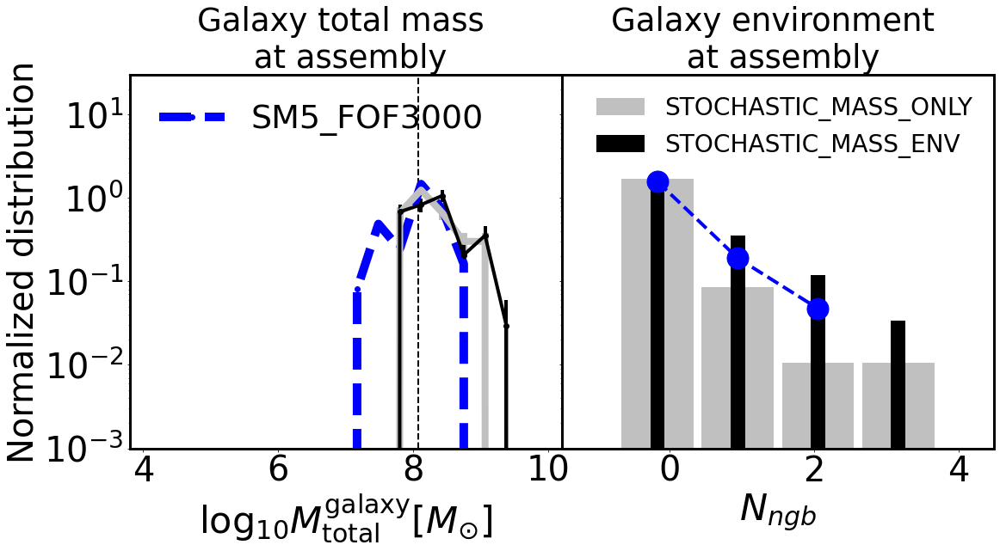

In [92]:

f,axx=plt.subplots(1,2,figsize=(18,8),sharey=True)
label_fontsize=40
LogTargetGroupBHMass=5.00
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19
Msfmp,Mh=5,3000
Nbins,minimum,maximum=20,4,10
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)


basePath=path_to_output+run+output

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_min_redshift_space=data[0]
unique_LogGroupStellarMass_min_redshift_space=data[1]
unique_LogGroupSFR_min_redshift_space=data[2]
unique_LogGroupSF_min_redshift_space=data[3]
unique_LogGroupSFMP_min_redshift_space=data[4]
unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
unique_LogGroupGasMetallicity_min_redshift_space=data[6]
unique_min_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_max_redshift_space=data[0]
unique_LogGroupStellarMass_max_redshift_space=data[1]
unique_LogGroupSFR_max_redshift_space=data[2]
unique_LogGroupSF_max_redshift_space=data[3]
unique_LogGroupSFMP_max_redshift_space=data[4]
unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
unique_LogGroupGasMetallicity_max_redshift_space=data[6]
unique_max_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_target_redshift_space=data[0]
unique_LogGroupStellarMass_target_redshift_space=data[1]
unique_LogGroupSFR_target_redshift_space=data[2]
unique_LogGroupSF_target_redshift_space=data[3]
unique_LogGroupSFMP_target_redshift_space=data[4]
unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
unique_LogGroupGasMetallicity_target_redshift_space=data[6]
unique_target_redshift_space=data[7]

unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)


levelmax,logseedmass=10,5.00
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.2_0.4_slope1.6_seed5.00/'
basePath44_10=path_to_output+run+output


levelmax,logseedmass=11,4.10
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_constant_mass_threshold_2.09_seed5.00/'
basePath5_11=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.2_0.4_slope1.6_seed5.00/'
basePath44_12=path_to_output+run+output



levelmax,logseedmass=10,5.00

unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_seed5.00/'
basePath2=path_to_output+run+output



path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp5_Mh3000_double_powerlaw_seed5.00_scatter0/'
basePath6_11=path_to_output+run+output

Nbins,minimum,maximum=20,4,10
col_gas='blue'
col_bFOF='silver'
col_bFOF2='grey'
col_bFOF3='black'


a,b,c=get_distribution(unique_LogGroupMass_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[0].errorbar(a-log10(h), b/norm,linewidth=10,marker='o',color=col_gas,linestyle='dashed',label='SM5_FOF3000')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,kk=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=8,color=col_bFOF)#ax.set_yscale('log')


scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,kk=arepo_package.get_seeding_events4(basePath44_10,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=4,color=col_bFOF3)#ax.set_yscale('log')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath5_11,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
#axx[0].errorbar(a,b/norm,c/norm,marker='o',linewidth=1,color=col_bFOF3,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

axx[0].axvline(-2.09+10-log10(h),linewidth=2,linestyle='dashed',color=col_bFOF3)




Nbins,minimum,maximum=10,-1,4
a,b,c=get_distribution(unique_GroupNeighbors_max_redshift_space,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
#b/=norm
axx[1].errorbar(a[maskb], b[maskb]/norm,linewidth=4,marker='o',ms=25,color=col_gas,zorder=10,linestyle='dashed')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,kk=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[1].bar(a,b/norm,width=1,color=col_bFOF,label='STOCHASTIC_MASS_ONLY')#ax.set_yscale('log')



scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,kk=arepo_package.get_seeding_events4(basePath44_10,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[1].bar(a,b/norm,width=0.2,color=col_bFOF3,label='STOCHASTIC_MASS_ENV')#ax.set_yscale('log')

axx[0].set_ylim(1e-3,3e1)

axx[0].set_xlim(3.8,10.2)

axx[0].set_yscale('log')

axx[0].tick_params(labelsize=label_fontsize)

axx[1].tick_params(labelsize=label_fontsize)

axx[0].set_xlabel('$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize+3)
axx[1].set_xlabel('$N_{ngb}$',fontsize=label_fontsize+3)

axx[0].set_ylabel('Normalized distribution',fontsize=label_fontsize)


axx[0].set_title('Galaxy total mass \n at assembly',fontsize=label_fontsize-3)

axx[1].set_title('Galaxy environment \n at assembly',fontsize=label_fontsize-3)

axx[0].legend(loc='upper left',fontsize=label_fontsize-2,frameon=False)
axx[1].legend(loc='upper right',fontsize=label_fontsize-12,frameon=False)

#axx[1].legend(loc='upper right',fontsize=label_fontsize-20)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)  # Right axis


plt.subplots_adjust(wspace=0)

plt.savefig('./Paper5_figures/subhalo_based_models_Msfmp5_Mh3000_seed5.00.png',bbox_inches='tight')



#axx[1].set_yscale('log')



Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[2.14699630e-06 6.38837600e-05 1.90085786e-03 5.65599239e-02
 1.68293751e+00]
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[7.01211107e-06 2.08644990e-04 6.20822050e-03 1.84725269e-01
 5.49649048e+00]
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[1.71865467e-06 5.11384778e-05 1.52162267e-03 4.52758011e-02
 1.34717904e+00]
Desired redshift:  8
Output redshift:  8.012172948865935
Output 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[8.74134208e-06 2.60098166e-04 7.73920700e-03 2.30279690e-01
 6.85195985e+00]


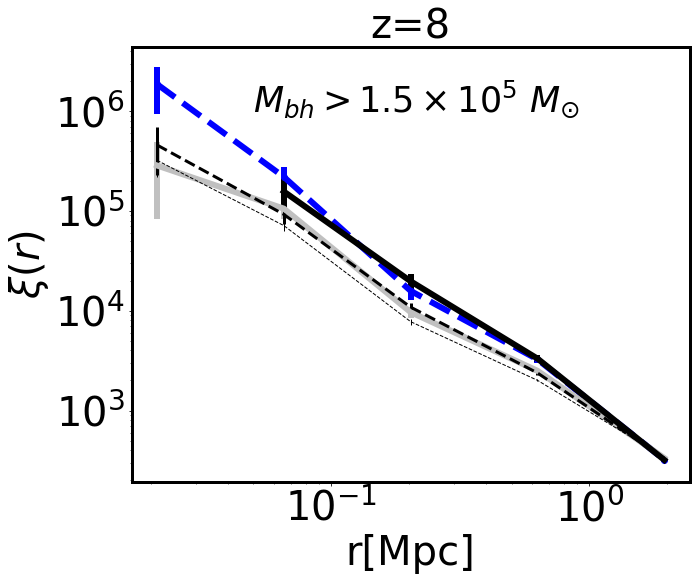

In [71]:



def make_plot(ax):
    for redshift in [8]:
        dist_bins, max_dist,min_dist = 5, 7e-3, 2


        Coordinates,o=arepo_package.get_particle_property(basePath,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_gas,linewidth=6,linestyle='dashed',marker='o')



        Coordinates,o=arepo_package.get_particle_property(basePath2,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath2,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF,linewidth=6)


        Coordinates,o=arepo_package.get_particle_property(basePath44_10,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath44_10,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath44_10,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=6)
        
        
        Coordinates,o=arepo_package.get_particle_property(basePath5_11,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath5_11,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath5_11,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=1,linestyle='dashed')
        
        
        Coordinates,o=arepo_package.get_particle_property(basePath6_11,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath6_11,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath6_11,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=3,linestyle='dashed')



        ax.set_title('z=%d'%redshift,fontsize=40)


        ax.set_xlabel('r[Mpc]',fontsize=label_fontsize)


        #ax.set_ylim(1e2,1e6)

        ax.tick_params(labelsize=label_fontsize)
        ax.set_yscale('log')
        ax.set_xscale('log')

        
        
f,axx=plt.subplots(1,1,figsize=(10,8),sharex=True,sharey=True)

mass_cut=1e5/1e10
lum_cut=0


make_plot(axx)



#axx.set_title(r'$M_{bh}>1.25\times10^{4}M_{\odot}/h$',fontsize=label_fontsize)


axx.set_ylabel(r'$\xi(r)$',fontsize=label_fontsize)

axx.text(0.05,1e6,r'$M_{bh}>1.5\times 10^5 \ M_{\odot}$',fontsize=label_fontsize-5)

axx.legend(loc='lower left',fontsize=label_fontsize-15,frameon=False)

ax=axx
ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)  # Right axis
plt.subplots_adjust(wspace=0)

plt.savefig('./Paper5_figures/subhalo_based_models4_Msfmp5_Mh3000_seed5.00.png',bbox_inches='tight')


        

Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  12
Output redshift:  11.980213315300293
Output snapshot:  13
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  14
Output redshift:  14.033992144452485
Output snapshot:  11
Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10
Desired redshift:  16
Output redshift:  16.005041538113627
Output snapshot:  9
Desired redshift:  17
Output redshift:  16.999960992518137
Output snapshot:  8
Desired redshift:  18
Output redshift:  17.963024604582767
Output snapshot:  7
Desired redshift:  19
Output redshift:  18.977615635027277
Output snapshot:  6
Desired redshift:  20
Output redshift:  20.0464909

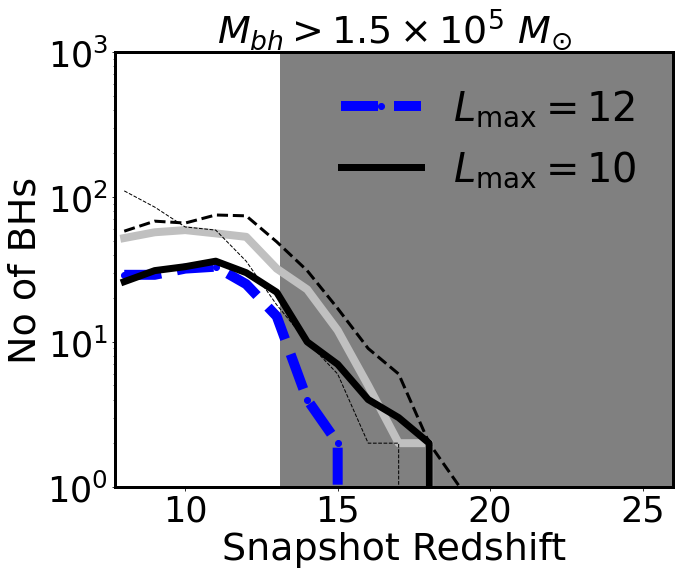

In [73]:
def make_plot(style='solid'):

    redshift_space=numpy.arange(8,25)

    BH_no_space=[]

    

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_gas,linewidth=10,linestyle='dashed',marker='o',label='$L_{\mathrm{max}}=12$')


    BH_no_space=[]

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF,linewidth=8,linestyle=style)
    
 
    BH_no_space=[]    
    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath44_10,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=7,linestyle='solid',label='$L_{\mathrm{max}}=10$')
 
    
    

    BH_no_space=[]  

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath5_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=1,linestyle='dashed')
    
    
    BH_no_space=[]  

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath6_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=3,linestyle='dashed')

    
    
    ax.set_yscale('log')

    ax.tick_params(labelsize=35)
    ax.set_xlabel('Snapshot Redshift',fontsize=label_fontsize-2)
    ax.set_ylabel('No of BHs',fontsize=label_fontsize-2)
    ax.set_title(r'$M_{bh}>1.5 \times 10^5 \ M_{\odot}$',fontsize=label_fontsize-2)
    ax.axvspan(13.1,26,color='grey')
    ax.set_xlim(7.7,26)

    
mass_cut=1e5
f,ax=plt.subplots(1,1,figsize=(10,8))
make_plot()
ax.set_ylim(1,1000)

ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)  # Right axis

ax.legend(loc='upper right',fontsize=label_fontsize,frameon=False)


plt.savefig('./Paper5_figures/subhalo_based_models2_Msfmp5_Mh3000_seed5.00.png',bbox_inches='tight')





17 8.012172948865935
Total number of mergers 15403
17 8.012172948865935
Total number of mergers 87
17 8.012172948865935
Total number of mergers 53
17 8.012172948865935
Total number of mergers 139
17 8.012172948865935
Total number of mergers 153


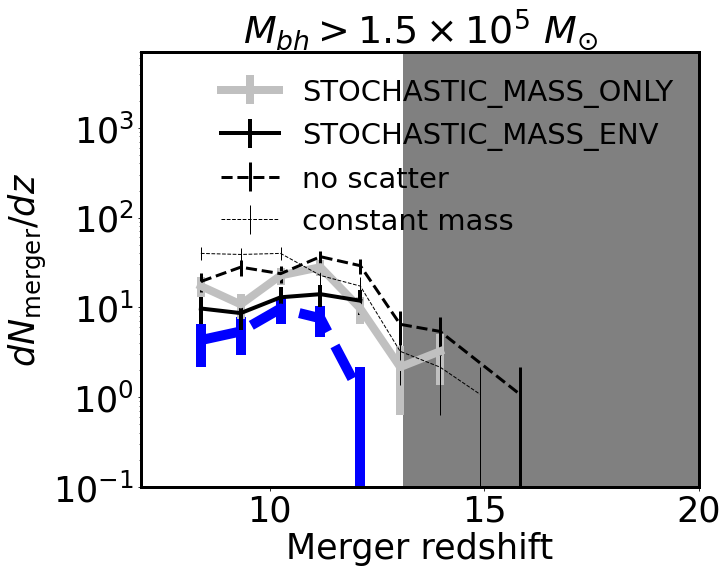

In [75]:
text_fontsize=25

title_fontsize=30

redshift_cut=8



mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=1

nbins=15
min_value=7
max_value=20

upto_redshift=8
f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

ratio=Mh

i=0
HDF5=1
levelmax=12
logseedmass=3.19  


offset=0
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    mass_cut=1e5
    
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linestyle='dashed',linewidth=10,color=col_gas)
    #offset+=0
   
    

for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath2,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=8,color=col_bFOF,label='STOCHASTIC_MASS_ONLY')
    #offset+=0.05

 

    
    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath44_10,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=4,color=col_bFOF3,label='STOCHASTIC_MASS_ENV')
    #offset+=0.05



    
    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath6_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=3,color=col_bFOF3,linestyle='dashed',label='no scatter')

    
    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath5_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=1,color=col_bFOF3,linestyle='dashed',label='constant mass')
    #offset+=0.05
    
  
    
    ax.set_yscale('log')
    ax.set_ylim(0.1,1000)    
    ax.set_xlim(9,20)
    
    
    
    #offset+=0.05
    
  
    
    ax.set_yscale('log')
    ax.set_ylim(0.1,7000)    
    ax.set_xlim(7,20)

    ax.axvspan(13.1,20,color='grey')




axx.set_ylabel('$dN_{\mathrm{merger}}/dz$',fontsize=label_fontsize-5)

axx.set_xlabel('Merger redshift',fontsize=label_fontsize-5)
#set_default_fontsizes(axx[2],'Merger redshift',' ')
#set_default_fontsizes(axx[3],'Merger redshift',' ')

#axx[0].set_ylim(0.1,100)
#axx[1].set_ylim(0.1,100)

axx.tick_params(labelsize=label_fontsize-5)


axx.legend(loc='upper right',fontsize=label_fontsize-11,frameon=False)

#set_legend(axx[0],'upper right')


#axx[0].text(12,600,r'$M_{\mathrm{seed}} = 1.25 \times 10^{4} M_{\odot}/h$',fontsize=text_fontsize+2)


#axx[1].text(12,600,r'$M_{\mathrm{seed}} = 1 \times 10^{5} M_{\odot}/h$',fontsize=text_fontsize+2)

plt.subplots_adjust(wspace=0,hspace=0)

axx.set_title(r'$M_{bh}>1.5 \times 10^5 \ M_{\odot}$',fontsize=label_fontsize-2)



ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)  # Right axis

plt.savefig('./Paper5_figures/subhalo_based_models3_Msfmp5_Mh3000_seed5.00.png',bbox_inches='tight')


#plt.savefig('./Paper2_figures/All_Merger_rates_LW_dependence.png',bbox_inches='tight')





blackhole_seeding2_79.txt
blackhole_seeding2_17.txt
blackhole_seeding2_176.txt
blackhole_seeding2_56.txt
blackhole_seeding2_99.txt
blackhole_seeding2_55.txt
blackhole_seeding2_138.txt
blackhole_seeding2_59.txt
blackhole_seeding2_120.txt
blackhole_seeding2_125.txt
blackhole_seeding2_39.txt
blackhole_seeding2_205.txt
blackhole_seeding2_98.txt
blackhole_seeding2_253.txt
blackhole_seeding2_163.txt
blackhole_seeding2_220.txt
blackhole_seeding2_193.txt
blackhole_seeding2_254.txt
blackhole_seeding2_233.txt
blackhole_seeding2_4.txt
blackhole_seeding2_157.txt
blackhole_seeding2_214.txt
blackhole_seeding2_186.txt
blackhole_seeding2_245.txt
blackhole_seeding2_77.txt
blackhole_seeding2_5.txt
blackhole_seeding2_231.txt
blackhole_seeding2_134.txt
blackhole_seeding2_206.txt
blackhole_seeding2_142.txt
blackhole_seeding2_54.txt
blackhole_seeding2_200.txt
blackhole_seeding2_199.txt
blackhole_seeding2_36.txt
blackhole_seeding2_140.txt
blackhole_seeding2_63.txt
blackhole_seeding2_82.txt
blackhole_seeding2

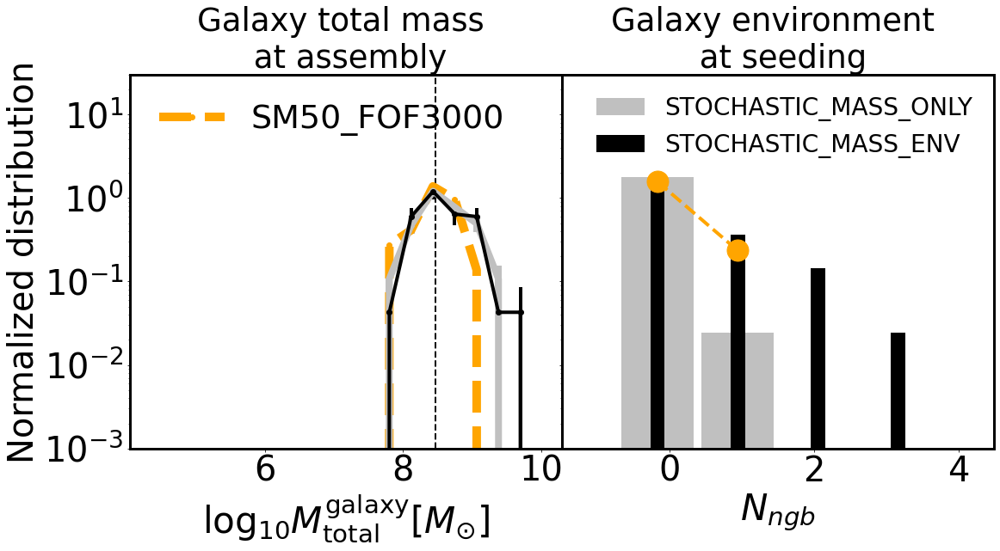

In [32]:

f,axx=plt.subplots(1,2,figsize=(18,8),sharey=True)
label_fontsize=40
LogTargetGroupBHMass=5.00
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19
Msfmp,Mh=50,3000
Nbins,minimum,maximum=15,4,10
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)


basePath=path_to_output+run+output

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_min_redshift_space=data[0]
unique_LogGroupStellarMass_min_redshift_space=data[1]
unique_LogGroupSFR_min_redshift_space=data[2]
unique_LogGroupSF_min_redshift_space=data[3]
unique_LogGroupSFMP_min_redshift_space=data[4]
unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
unique_LogGroupGasMetallicity_min_redshift_space=data[6]
unique_min_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_max_redshift_space=data[0]
unique_LogGroupStellarMass_max_redshift_space=data[1]
unique_LogGroupSFR_max_redshift_space=data[2]
unique_LogGroupSF_max_redshift_space=data[3]
unique_LogGroupSFMP_max_redshift_space=data[4]
unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
unique_LogGroupGasMetallicity_max_redshift_space=data[6]
unique_max_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_target_redshift_space=data[0]
unique_LogGroupStellarMass_target_redshift_space=data[1]
unique_LogGroupSFR_target_redshift_space=data[2]
unique_LogGroupSF_target_redshift_space=data[3]
unique_LogGroupSFMP_target_redshift_space=data[4]
unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
unique_LogGroupGasMetallicity_target_redshift_space=data[6]
unique_target_redshift_space=data[7]

unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)

levelmax,logseedmass=10,5.00
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp50_Mh3000_double_powerlaw_env_5_0.2_0.4_slope1.6_seed5.00/'
basePath44_10=path_to_output+run+output

levelmax,logseedmass=11,4.10
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp50_Mh3000_double_powerlaw_env_5_0.2_0.4_slope1.6_seed5.00/'
basePath44_11=path_to_output+run+output


levelmax,logseedmass=12,3.19
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp50_Mh3000_double_powerlaw_env_5_0.2_0.4_slope1.6_seed5.00/'
basePath44_12=path_to_output+run+output

levelmax,logseedmass=11,4.10


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_constant_mass_threshold_1.83_seed5.00/'
basePath5_11=path_to_output+run+output



levelmax,logseedmass=10,5.00

unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp50_Mh3000_double_powerlaw_seed5.00/'
basePath2=path_to_output+run+output

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp50_Mh3000_double_powerlaw_seed5.00_scatter0/'
basePath6_11=path_to_output+run+output

Nbins,minimum,maximum=20,4,10
col_gas='orange'
col_bFOF='silver'
col_bFOF2='grey'
col_bFOF3='black'


a,b,c=get_distribution(unique_LogGroupMass_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[0].errorbar(a-log10(h), b/norm,linewidth=10,marker='o',color=col_gas,linestyle='dashed',label='SM50_FOF3000')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,kk=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=8,color=col_bFOF)#ax.set_yscale('log')


scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,kk=arepo_package.get_seeding_events4(basePath44_10,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=4,color=col_bFOF3)#ax.set_yscale('log')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath5_11,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
#axx[0].errorbar(a,b/norm,c/norm,marker='o',linewidth=1,color=col_bFOF3,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

axx[0].axvline(-1.7+10-log10(h),linewidth=2,linestyle='dashed',color=col_bFOF3)




Nbins,minimum,maximum=10,-1,4
a,b,c=get_distribution(unique_GroupNeighbors_max_redshift_space,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
#b/=norm
axx[1].errorbar(a[maskb], b[maskb]/norm,linewidth=4,marker='o',ms=25,color=col_gas,zorder=10,linestyle='dashed')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,kk=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[1].bar(a,b/norm,width=1,color=col_bFOF,label='STOCHASTIC_MASS_ONLY')#ax.set_yscale('log')



scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,kk=arepo_package.get_seeding_events4(basePath44_10,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[1].bar(a,b/norm,width=0.2,color=col_bFOF3,label='STOCHASTIC_MASS_ENV')#ax.set_yscale('log')

axx[0].set_ylim(1e-3,3e1)

axx[0].set_yscale('log')

axx[0].tick_params(labelsize=label_fontsize)

axx[1].tick_params(labelsize=label_fontsize)

axx[0].set_xlabel('$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize+2)
axx[1].set_xlabel('$N_{ngb}$',fontsize=label_fontsize+2)

axx[0].set_ylabel('Normalized distribution',fontsize=label_fontsize)


axx[0].set_title('Galaxy total mass \n at assembly',fontsize=label_fontsize-3)

axx[1].set_title('Galaxy environment \n at seeding',fontsize=label_fontsize-3)


axx[0].legend(loc='upper left',fontsize=label_fontsize-2,frameon=False)
axx[1].legend(loc='upper right',fontsize=label_fontsize-12,frameon=False)

plt.subplots_adjust(wspace=0)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)  # Right axis

plt.savefig('./Paper5_figures/subhalo_based_models_Msfmp50_Mh3000_seed5.00.png',bbox_inches='tight')



#axx[1].set_yscale('log')



Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[9.04276767e-07 2.69067068e-05 8.00607621e-04 2.38220369e-02
 7.08823433e-01]
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[2.62293144e-06 7.80451846e-05 2.32223029e-03 6.90978380e-02
 2.05600247e+00]
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[1.33790656e-06 3.98093381e-05 1.18452473e-03 3.52454698e-02
 1.04872707e+00]
Desired redshift:  8
Output redshift:  8.012172948865935
Output 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[2.30035318e-06 6.84468857e-05 2.03663342e-03 6.05999184e-02
 1.80314733e+00]


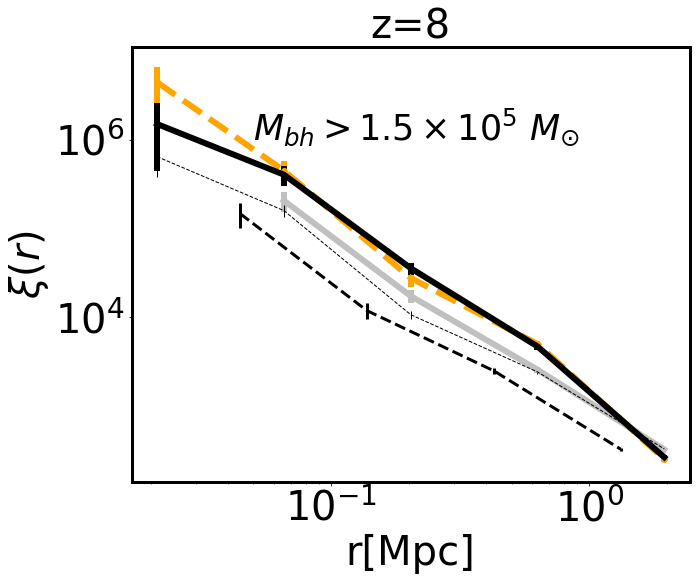

In [33]:



def make_plot(ax):
    for redshift in [8]:
        dist_bins, max_dist,min_dist = 5, 7e-3, 2


        Coordinates,o=arepo_package.get_particle_property(basePath,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>=mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_gas,linewidth=6,linestyle='dashed',marker='o')



        Coordinates,o=arepo_package.get_particle_property(basePath2,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath2,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>=mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF,linewidth=6)


        Coordinates,o=arepo_package.get_particle_property(basePath44_11,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath44_11,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath44_11,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>=mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=6)
        
        
        Coordinates,o=arepo_package.get_particle_property(basePath5_11,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath5_11,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath5_11,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>=mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=1,linestyle='dashed')
        
        
        Coordinates,o=arepo_package.get_particle_property(basePath6_11,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath6_11,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath6_11,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>=mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask],xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=3,linestyle='dashed')



        ax.set_title('z=%d'%redshift,fontsize=40)


        ax.set_xlabel('r[Mpc]',fontsize=label_fontsize)


        #ax.set_ylim(1e2,1e6)

        ax.tick_params(labelsize=label_fontsize)
        ax.set_yscale('log')
        ax.set_xscale('log')

        
        
f,axx=plt.subplots(1,1,figsize=(10,8),sharex=True,sharey=True)

mass_cut=1e5/1e10
lum_cut=-1


make_plot(axx)



#axx.set_title(r'$M_{bh}>1.25\times10^{4}M_{\odot}/h$',fontsize=label_fontsize)

ax=axx
ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3) 
axx.set_ylabel(r'$\xi(r)$',fontsize=label_fontsize)

axx.text(0.05,1e6,r'$M_{bh}>1.5\times 10^5 \ M_{\odot}$',fontsize=label_fontsize-5)

axx.legend(loc='lower left',fontsize=label_fontsize-15,frameon=False)

plt.subplots_adjust(wspace=0)

plt.savefig('./Paper5_figures/subhalo_based_models4_Msfmp50_Mh3000_seed5.00.png',bbox_inches='tight')


        

17 8.012172948865935
Total number of mergers 7408
17 8.012172948865935
Total number of mergers 51
17 8.012172948865935
Total number of mergers 21
17 8.012172948865935
Total number of mergers 72
17 8.012172948865935
Total number of mergers 73


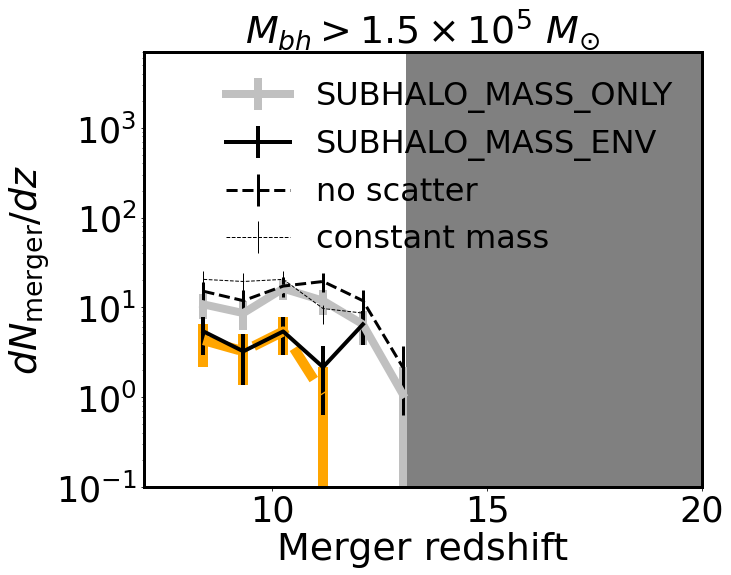

In [84]:
text_fontsize=25

title_fontsize=30

redshift_cut=8



mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=1

nbins=15
min_value=7
max_value=20

upto_redshift=8
f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

ratio=Mh

i=0
HDF5=1
levelmax=12
logseedmass=3.19  


offset=0
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    mass_cut=1e5
    
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linestyle='dashed',linewidth=10,color=col_gas)
    #offset+=0
   
    

for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath2,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=8,color=col_bFOF,label='SUBHALO_MASS_ONLY')
    #offset+=0.05

 

    
    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath44_10,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],label='SUBHALO_MASS_ENV',linewidth=4,color=col_bFOF3)
    #offset+=0.05


    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath6_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=3,color=col_bFOF3,linestyle='dashed',label='no scatter')

    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath5_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=1,color=col_bFOF3,linestyle='dashed',label='constant mass')
    #offset+=0.05
    
  
    
    ax.set_yscale('log')
    ax.set_ylim(0.1,1000)    
    ax.set_xlim(9,20)
    
    
    
    #offset+=0.05
    
  
    
    ax.set_yscale('log')
    ax.set_ylim(0.1,7000)    
    ax.set_xlim(7,20)

    ax.axvspan(13.1,20,color='grey')




axx.set_ylabel('$dN_{\mathrm{merger}}/dz$',fontsize=label_fontsize-2)

axx.set_xlabel('Merger redshift',fontsize=label_fontsize-2)
#set_default_fontsizes(axx[2],'Merger redshift',' ')
#set_default_fontsizes(axx[3],'Merger redshift',' ')

#axx[0].set_ylim(0.1,100)
#axx[1].set_ylim(0.1,100)

axx.tick_params(labelsize=label_fontsize-5)

axx.set_title(r'$M_{bh}>1.5 \times 10^5 \ M_{\odot}$',fontsize=label_fontsize-2)

axx.legend(loc='upper right',fontsize=label_fontsize-8,frameon=False)

#set_legend(axx[0],'upper right')

ax=axx
ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3) 
#axx[0].text(12,600,r'$M_{\mathrm{seed}} = 1.25 \times 10^{4} M_{\odot}/h$',fontsize=text_fontsize+2)


#axx[1].text(12,600,r'$M_{\mathrm{seed}} = 1 \times 10^{5} M_{\odot}/h$',fontsize=text_fontsize+2)

plt.subplots_adjust(wspace=0,hspace=0)


plt.savefig('./Paper5_figures/subhalo_based_models3_Msfmp50_Mh3000_seed5.00.png',bbox_inches='tight')


#plt.savefig('./Paper2_figures/All_Merger_rates_LW_dependence.png',bbox_inches='tight')





Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  12
Output redshift:  11.980213315300293
Output snapshot:  13
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  14
Output redshift:  14.033992144452485
Output snapshot:  11
Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10
Desired redshift:  16
Output redshift:  16.005041538113627
Output snapshot:  9
Desired redshift:  17
Output redshift:  16.999960992518137
Output snapshot:  8
Desired redshift:  18
Output redshift:  17.963024604582767
Output snapshot:  7
Desired redshift:  19
Output redshift:  18.977615635027277
Output snapshot:  6
Desired redshift:  20
Output redshift:  20.0464909

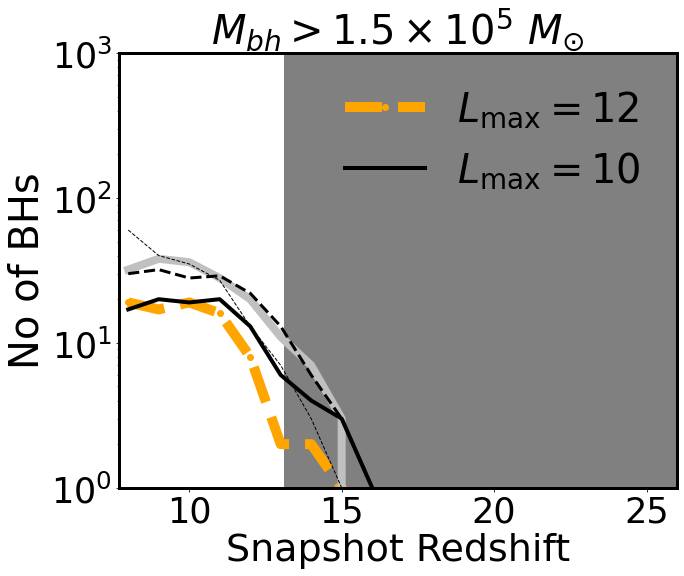

In [34]:
def make_plot(style='solid'):

    redshift_space=numpy.arange(8,25)

    BH_no_space=[]

    

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_gas,linewidth=10,linestyle='dashed',marker='o',label='$L_{\mathrm{max}}=12$')


    BH_no_space=[]

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF,linewidth=8,linestyle=style)
    
    BH_no_space=[]



    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath44_10,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=4,linestyle='solid',label='$L_{\mathrm{max}}=10$')
    
    

    BH_no_space=[]  

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath5_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=1,linestyle='dashed')
    
    
    BH_no_space=[]  

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath6_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=3,linestyle='dashed')

    
    
    ax.set_yscale('log')

    ax.tick_params(labelsize=35)
    ax.set_xlabel('Snapshot Redshift',fontsize=label_fontsize-2)
    ax.set_ylabel('No of BHs',fontsize=label_fontsize)
    
    
    
    ax.axvspan(13.1,26,color='grey')
    ax.set_xlim(7.7,26)

    
mass_cut=1e5
f,ax=plt.subplots(1,1,figsize=(10,8))
make_plot()
ax.set_ylim(1,1000)

ax.legend(loc='upper right',fontsize=label_fontsize,frameon=False)

ax.set_title(r'$M_{bh}>1.5 \times 10^5 \ M_{\odot}$',fontsize=label_fontsize)


ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3) 

plt.savefig('./Paper5_figures/subhalo_based_models2_Msfmp50_Mh3000_seed5.00.png',bbox_inches='tight')





blackhole_seeding2_79.txt
blackhole_seeding2_17.txt
blackhole_seeding2_176.txt
blackhole_seeding2_56.txt
blackhole_seeding2_99.txt
blackhole_seeding2_55.txt
blackhole_seeding2_138.txt
blackhole_seeding2_59.txt
blackhole_seeding2_120.txt
blackhole_seeding2_125.txt
blackhole_seeding2_39.txt
blackhole_seeding2_205.txt
blackhole_seeding2_98.txt
blackhole_seeding2_253.txt
blackhole_seeding2_163.txt
blackhole_seeding2_220.txt
blackhole_seeding2_193.txt
blackhole_seeding2_254.txt
blackhole_seeding2_233.txt
blackhole_seeding2_4.txt
blackhole_seeding2_157.txt
blackhole_seeding2_214.txt
blackhole_seeding2_23.txt
blackhole_seeding2_186.txt
blackhole_seeding2_245.txt
blackhole_seeding2_77.txt
blackhole_seeding2_5.txt
blackhole_seeding2_231.txt
blackhole_seeding2_134.txt
blackhole_seeding2_206.txt
blackhole_seeding2_142.txt
blackhole_seeding2_54.txt
blackhole_seeding2_200.txt
blackhole_seeding2_199.txt
blackhole_seeding2_36.txt
blackhole_seeding2_140.txt
blackhole_seeding2_63.txt
blackhole_seeding2

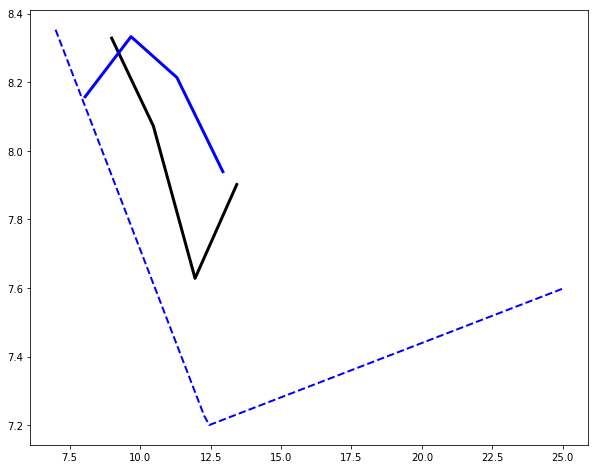

In [12]:
def fitfunc(x,a,z_onset):
    B=0
    return (a*x+z_onset)


f,ax=plt.subplots(1,1,figsize=(10,8))

col='black'

mask=unique_target_redshift_space>7
#ax.errorbar(unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask],linewidth=0,marker='o',color=col)
a,b,c,d=arepo_package.mean_plot(unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask],False,False,4)
ax.errorbar(a,b,linewidth=3,color=col)



scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,kk=arepo_package.get_seeding_events4(basePath44_11,GET_ENVIRONMENT=1)
col='blue'
redshifts_complete=1./scale_fac_complete-1
#ax.errorbar(redshifts_complete,numpy.log10(FOFDMmass_complete*1e10),linewidth=0,marker='o',color=col)
a,b,c,d=arepo_package.mean_plot(redshifts_complete,numpy.log10(FOFDMmass_complete*1e10),False,False,4)
ax.errorbar(a,b,linewidth=3,color=col)



z_space_con=numpy.linspace(7,25,100)
value_space=numpy.array([max(fitfunc(z_cur,-0.2134,9.8469),fitfunc(z_cur,0.0317,6.806)) for z_cur in z_space_con])

ax.plot(z_space_con,value_space,linewidth=2,color=col,linestyle='dashed')





Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  10
Output redshift:  9.996590466186332
Output snaps

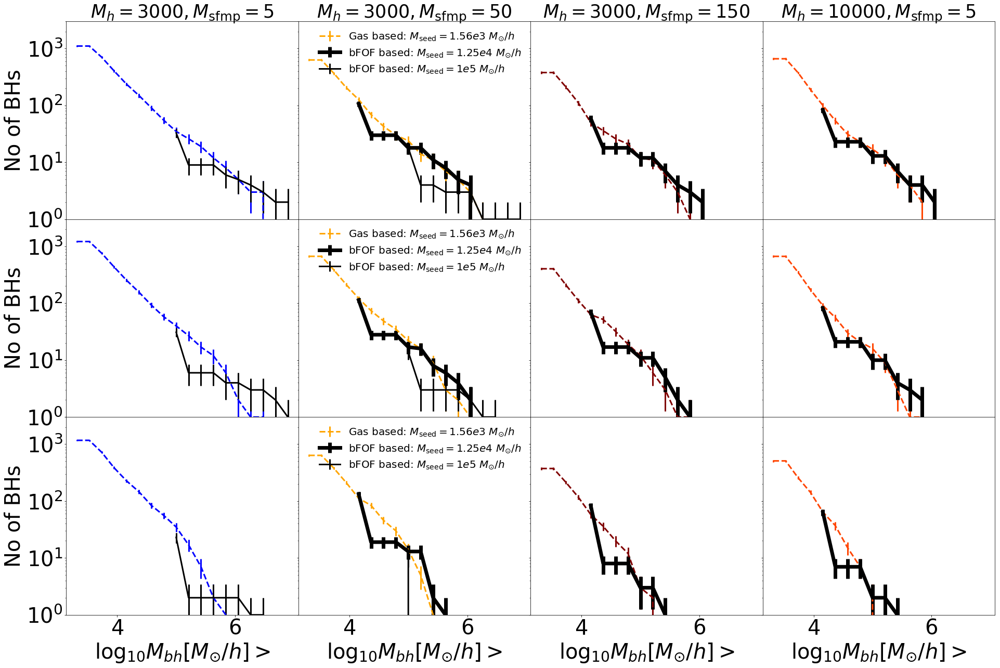

In [46]:
def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0,cumulative=0,density=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        if (cumulative==1):
            mask=(HM>HM_min)
        else:
            mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    if (density==1):
        norm=numpy.diff(centers)
    return centers,HMF/norm,dHMF/norm


def make_plot(ax,style='solid',col='black',width=3,log_mass_min=3.19,labl=' '):
    Nbins, log_HM_min, log_HM_max = 20, 3, 7
    redshift_space=[z_desired]

    BH_no_space=[]

    for redshift in [z_desired]:
    

        BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
        centers,HMF,dHMF=get_distribution(numpy.log10(BH_Mass*1e10), Nbins, log_HM_min, log_HM_max, linear=1,cumulative=1)
        mask=centers>log_mass_min
        ax.errorbar(centers[mask],HMF[mask],dHMF[mask],linewidth=width,linestyle=style,color=col,label=labl)
      
    
        ax.set_yscale('log')

        ax.tick_params(labelsize=label_fontsize)
        ax.set_xlabel('$\log_{10}M_{bh}[M_{\odot}/h] >$',fontsize=label_fontsize)


LogTargetGroupBHMass=5.00
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


f,axx=plt.subplots(3,4,figsize=(32,21),sharey=True)


Nbins,minimum,maximum=15,3,10
i=0
for z_desired in [9,10,12]:
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs

    log_mass_min=3.19
    Msfmp,Mh=5,3000
    output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[i,0],col='blue',style='dashed',log_mass_min=log_mass_min)


    Msfmp,Mh=50,3000
    output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[i,1],col='orange',style='dashed',log_mass_min=log_mass_min,labl='Gas based: $M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$')


    Msfmp,Mh=150,3000
    output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[i,2],col='maroon',style='dashed',log_mass_min=log_mass_min)




    Msfmp,Mh=5,10000
    output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[i,3],col='orangered',style='dashed',log_mass_min=log_mass_min)
    plt.subplots_adjust(wspace=0)


    log_mass_min=4.90
    levelmax,logseedmass=11,4.10
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs


    log_mass_min=4.00
    output='/output_Msfmp50_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6//'
    basePath=path_to_output+run+output
    make_plot(axx[i,1],col='black',width=7,log_mass_min=log_mass_min,labl='bFOF based: $M_{\mathrm{seed}}=1.25e4 \ M_{\odot}/h$')

    output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6/'
    basePath=path_to_output+run+output
    make_plot(axx[i,2],col='black',width=7,log_mass_min=log_mass_min)

    output='/output_Msfmp5_Mh10000_double_powerlaw_env_5_0.1_0.3_slope1.2/'
    basePath=path_to_output+run+output
    make_plot(axx[i,3],col='black',width=7,log_mass_min=log_mass_min)


    log_mass_min=4.90
    levelmax,logseedmass=11,4.10
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
    output='/output_Msfmp5_Mh3000_double_powerlaw_env_5_0.2_0.4_slope1.6_seed5.00/'
    basePath=path_to_output+run+output
    make_plot(axx[i,0],col='black',width=3,log_mass_min=log_mass_min)

    output='/output_Msfmp50_Mh3000_double_powerlaw_env_5_0.2_0.4_slope1.6_seed5.00/'
    basePath=path_to_output+run+output
    make_plot(axx[i,1],col='black',width=3,log_mass_min=log_mass_min,labl='bFOF based: $M_{\mathrm{seed}}=1e5 \ M_{\odot}/h$')







    axx[0,0].set_title('$M_h=3000, M_{\mathrm{sfmp}}=5$',fontsize=label_fontsize-5)
    axx[0,1].set_title('$M_h=3000, M_{\mathrm{sfmp}}=50$',fontsize=label_fontsize-5)
    axx[0,2].set_title('$M_h=3000, M_{\mathrm{sfmp}}=150$',fontsize=label_fontsize-5)
    axx[0,3].set_title('$M_h=10000, M_{\mathrm{sfmp}}=5$',fontsize=label_fontsize-5)

    axx[i,0].set_ylabel('No of BHs',fontsize=label_fontsize)

    axx[i,0].set_ylim(1e0,3e3)

    axx[i,1].legend(loc='upper right',fontsize=label_fontsize-20,frameon=False)
    i+=1
plt.subplots_adjust(hspace=0,wspace=0)
plt.savefig('./Paper5_figures/mass_functions.png',bbox_inches='tight')






Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  10
Output redshift:  9.996590466186332
Out

'\n\n'

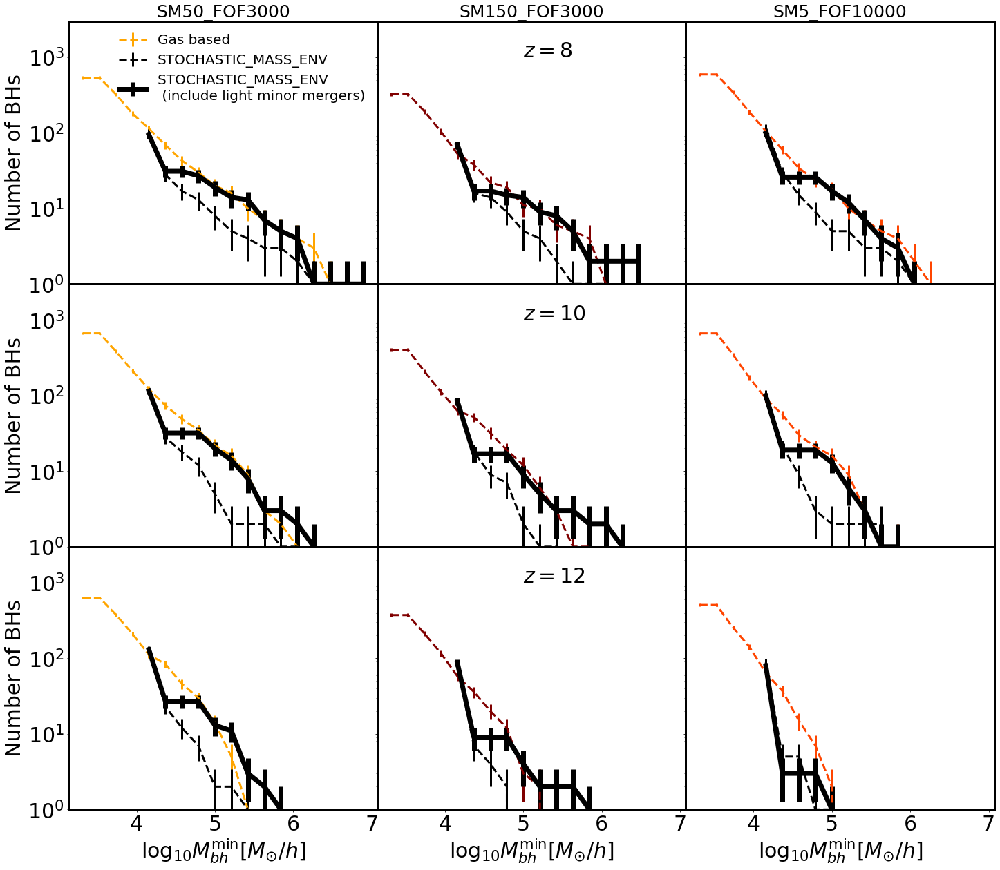

In [86]:
label_fontsize=30
def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0,cumulative=0,density=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        if (cumulative==1):
            mask=(HM>HM_min)
        else:
            mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    if (density==1):
        norm=numpy.diff(centers)
    return centers,HMF/norm,dHMF/norm


def make_plot(ax,style='solid',col='black',width=3,log_mass_min=3.19,labl=' '):
    Nbins, log_HM_min, log_HM_max = 20, 3, 7
    redshift_space=[z_desired]

    BH_no_space=[]

    for redshift in [z_desired]:
    

        BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
        centers,HMF,dHMF=get_distribution(numpy.log10(BH_Mass*1e10), Nbins, log_HM_min, log_HM_max, linear=1,cumulative=1)
        mask=centers>log_mass_min
        ax.errorbar(centers[mask],HMF[mask],dHMF[mask],linewidth=width,linestyle=style,color=col,label=labl)
      
    
        ax.set_yscale('log')

        ax.tick_params(labelsize=label_fontsize)
        ax.set_xlabel('$\log_{10}M^{\mathrm{min}}_{bh}[M_{\odot}/h]$',fontsize=label_fontsize)


LogTargetGroupBHMass=5.00
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19


f,axx=plt.subplots(3,3,figsize=(24,21),sharey=True)


Nbins,minimum,maximum=15,3,10
i=0
for z_desired in [8,10,12]:
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs

    log_mass_min=3.19


    Msfmp,Mh=50,3000
    output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[i,0],col='orange',style='dashed',log_mass_min=log_mass_min,labl='Gas based')


    Msfmp,Mh=150,3000
    output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[i,1],col='maroon',style='dashed',log_mass_min=log_mass_min)




    Msfmp,Mh=5,10000
    output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
    basePath=path_to_output+run+output
    make_plot(axx[i,2],col='orangered',style='dashed',log_mass_min=log_mass_min)
    plt.subplots_adjust(wspace=0)


    log_mass_min=4.90
    levelmax,logseedmass=11,4.10
    path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs


    
    log_mass_min=4.00
    output='/output_Msfmp50_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6_noboost//'
    basePath=path_to_output+run+output
    make_plot(axx[i,0],col='black',style='dashed',width=3,log_mass_min=log_mass_min,labl='STOCHASTIC_MASS_ENV')

    output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6_noboost/'
    basePath=path_to_output+run+output
    make_plot(axx[i,1],col='black',style='dashed',width=3,log_mass_min=log_mass_min)

    output='/output_Msfmp5_Mh10000_double_powerlaw_env_5_0.2_0.4_slope1.2_noboost/'
    basePath=path_to_output+run+output
    make_plot(axx[i,2],col='black',style='dashed',width=3,log_mass_min=log_mass_min)
    
    


    
    
    log_mass_min=4.00
    output='/output_Msfmp50_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6_unresolved//'
    basePath=path_to_output+run+output
    make_plot(axx[i,0],col='black',width=7,log_mass_min=log_mass_min,labl='STOCHASTIC_MASS_ENV \n (include light minor mergers)')

    output='/output_Msfmp150_Mh3000_double_powerlaw_env_5_0.1_0.3_slope1.6_unresolved/'
    basePath=path_to_output+run+output
    make_plot(axx[i,1],col='black',width=7,log_mass_min=log_mass_min)

    output='/output_Msfmp5_Mh10000_double_powerlaw_env_5_0.2_0.4_slope1.2_unresolved/'
    basePath=path_to_output+run+output
    make_plot(axx[i,2],col='black',width=7,log_mass_min=log_mass_min)


    #log_mass_min=4.90
    #output='/output_Msfmp50_Mh3000_double_powerlaw_env_5_0.2_0.4_slope1.6_seed5.00_noboost//'
    ##basePath=path_to_output+run+output
    #make_plot(axx[i,0],col='blue',style='dashed',width=3,log_mass_min=log_mass_min)
    
    #log_mass_min=4.90
    #output='/output_Msfmp50_Mh3000_double_powerlaw_env_5_0.2_0.4_slope1.6_seed5.00//'
    #basePath=path_to_output+run+output
    #make_plot(axx[i,0],col='blue',style='solid',width=7,log_mass_min=log_mass_min)



    axx[0,0].set_title('SM50_FOF3000',fontsize=label_fontsize-5)
    axx[0,1].set_title('SM150_FOF3000',fontsize=label_fontsize-5)
    axx[0,2].set_title('SM5_FOF10000',fontsize=label_fontsize-5)

    axx[i,0].set_ylabel('Number of BHs',fontsize=label_fontsize)

    axx[i,0].set_ylim(1e0,3e3)
    
    axx[i,1].text(5,1e3,'$z=%d$'%z_desired,fontsize=30)

    
    i+=1
axx[0,0].legend(loc='upper right',fontsize=label_fontsize-10,frameon=False)


for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)  # Right axis

plt.subplots_adjust(hspace=0,wspace=0)
plt.savefig('./Paper5_figures/mass_functions.png',bbox_inches='tight')



'''

'''


blackhole_seeding2_79.txt
blackhole_seeding2_176.txt
blackhole_seeding2_59.txt
blackhole_seeding2_205.txt
blackhole_seeding2_98.txt
blackhole_seeding2_253.txt
blackhole_seeding2_254.txt
blackhole_seeding2_4.txt
blackhole_seeding2_157.txt
blackhole_seeding2_186.txt
blackhole_seeding2_245.txt
blackhole_seeding2_206.txt
blackhole_seeding2_142.txt
blackhole_seeding2_199.txt
blackhole_seeding2_123.txt
blackhole_seeding2_117.txt
blackhole_seeding2_172.txt
blackhole_seeding2_215.txt
blackhole_seeding2_147.txt
blackhole_seeding2_242.txt
blackhole_seeding2_85.txt
blackhole_seeding2_3.txt
blackhole_seeding2_180.txt
blackhole_seeding2_167.txt
blackhole_seeding2_126.txt
blackhole_seeding2_146.txt
blackhole_seeding2_84.txt
blackhole_seeding2_133.txt
blackhole_seeding2_154.txt
blackhole_seeding2_32.txt
blackhole_seeding2_250.txt
blackhole_seeding2_49.txt
blackhole_seeding2_149.txt
blackhole_seeding2_96.txt
blackhole_seeding2_229.txt
blackhole_seeding2_38.txt
blackhole_seeding2_237.txt
blackhole_seed

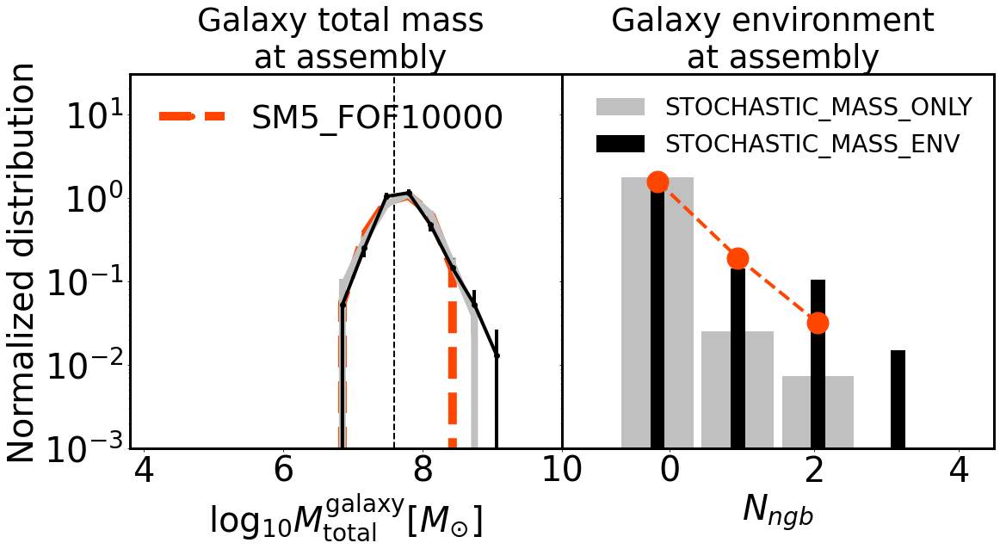

In [10]:

f,axx=plt.subplots(1,2,figsize=(18,8),sharey=True)
label_fontsize=40
LogTargetGroupBHMass=4.10
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19
Msfmp,Mh=5,10000
Nbins,minimum,maximum=20,4,10
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)


basePath=path_to_output+run+output

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_min_redshift_space=data[0]
unique_LogGroupStellarMass_min_redshift_space=data[1]
unique_LogGroupSFR_min_redshift_space=data[2]
unique_LogGroupSF_min_redshift_space=data[3]
unique_LogGroupSFMP_min_redshift_space=data[4]
unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
unique_LogGroupGasMetallicity_min_redshift_space=data[6]
unique_min_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_max_redshift_space=data[0]
unique_LogGroupStellarMass_max_redshift_space=data[1]
unique_LogGroupSFR_max_redshift_space=data[2]
unique_LogGroupSF_max_redshift_space=data[3]
unique_LogGroupSFMP_max_redshift_space=data[4]
unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
unique_LogGroupGasMetallicity_max_redshift_space=data[6]
unique_max_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_target_redshift_space=data[0]
unique_LogGroupStellarMass_target_redshift_space=data[1]
unique_LogGroupSFR_target_redshift_space=data[2]
unique_LogGroupSF_target_redshift_space=data[3]
unique_LogGroupSFMP_target_redshift_space=data[4]
unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
unique_LogGroupGasMetallicity_target_redshift_space=data[6]
unique_target_redshift_space=data[7]

unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)



levelmax,logseedmass=11,4.10

unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp5_Mh10000_double_powerlaw/'
basePath2=path_to_output+run+output







path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp5_Mh10000_double_powerlaw_env_5_0.2_0.4_slope1.2_noboost/'
basePath44_11=path_to_output+run+output



path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_constant_mass_threshold_2.58/'
basePath5_11=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp5_Mh10000_double_powerlaw_2_scatter0/'
basePath6_11=path_to_output+run+output



levelmax,logseedmass=12,3.19

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp5_Mh10000_double_powerlaw_env_5_0.2_0.4_slope1.2/'
basePath44=path_to_output+run+output





Nbins,minimum,maximum=20,4,10
col_gas='orangered'
col_bFOF='silver'
col_bFOF2='grey'
col_bFOF3='black'


a,b,c=get_distribution(unique_LogGroupMass_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[0].errorbar(a-log10(h), b/norm,linewidth=10,marker='o',color=col_gas,linestyle='dashed',label='SM5_FOF10000')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,kk=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=8,color=col_bFOF)#ax.set_yscale('log')


scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,kk=arepo_package.get_seeding_events4(basePath44_11,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=4,color=col_bFOF3)#ax.set_yscale('log')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath5_11,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
#axx[0].errorbar(a,b/norm,c/norm,marker='o',linewidth=1,color=col_bFOF3,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

axx[0].axvline(-2.58+10-log10(h),linewidth=2,linestyle='dashed',color=col_bFOF3)




Nbins,minimum,maximum=10,-1,4
a,b,c=get_distribution(unique_GroupNeighbors_max_redshift_space,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
#b/=norm
axx[1].errorbar(a[maskb], b[maskb]/norm,linewidth=4,marker='o',ms=25,color=col_gas,zorder=10,linestyle='dashed')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,kk=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[1].bar(a,b/norm,width=1,color=col_bFOF,label='STOCHASTIC_MASS_ONLY')#ax.set_yscale('log')



scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,kk=arepo_package.get_seeding_events4(basePath44_11,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[1].bar(a,b/norm,width=0.2,color=col_bFOF3,label='STOCHASTIC_MASS_ENV')#ax.set_yscale('log')

axx[0].set_xlim(3.8,10)

axx[0].set_yscale('log')

axx[0].set_ylim(1e-3,3e1)

axx[0].tick_params(labelsize=label_fontsize)

axx[1].tick_params(labelsize=label_fontsize)

axx[0].set_xlabel('$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)
axx[1].set_xlabel('$N_{ngb}$',fontsize=label_fontsize)

axx[0].set_ylabel('Normalized distribution',fontsize=label_fontsize)


axx[0].set_title('Galaxy total mass \n at assembly',fontsize=label_fontsize-3)

axx[1].set_title('Galaxy environment \n at assembly',fontsize=label_fontsize-3)


axx[0].legend(loc='upper left',fontsize=label_fontsize-2,frameon=False)
axx[1].legend(loc='upper right',fontsize=label_fontsize-12,frameon=False)


for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)  # Right axis


plt.subplots_adjust(wspace=0)

plt.savefig('./Paper5_figures/subhalo_based_models_Msfmp5_Mh10000.png',bbox_inches='tight')



#axx[1].set_yscale('log')



Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  12
Output redshift:  11.980213315300293
Output snapshot:  13
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  14
Output redshift:  14.033992144452485
Output snapshot:  11
Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10
Desired redshift:  16
Output redshift:  16.005041538113627
Output snapshot:  9
Desired redshift:  17
Output redshift:  16.999960992518137
Output snapshot:  8
Desired redshift:  18
Output redshift:  17.963024604582767
Output snapshot:  7
Desired redshift:  19
Output redshift:  18.977615635027277
Output snapshot:  6
Desired redshift:  20
Output redshift:  20.0464909

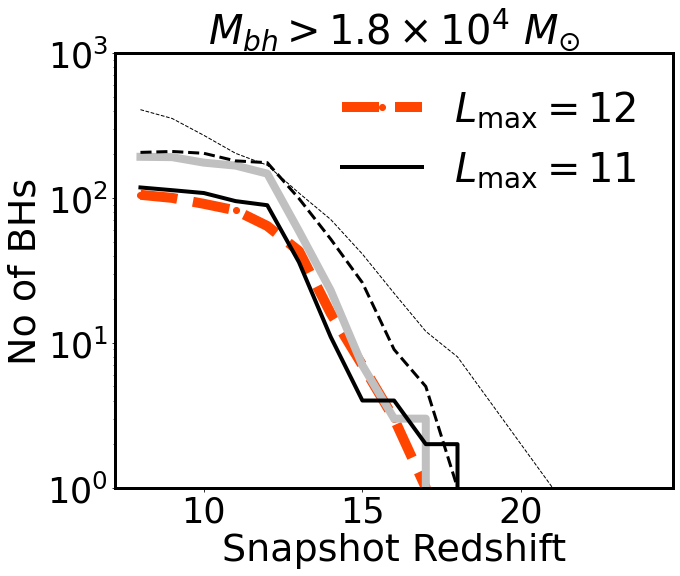

In [95]:
def make_plot(style='solid'):

    redshift_space=numpy.arange(8,25)

    BH_no_space=[]

    

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_gas,linewidth=10,linestyle='dashed',marker='o',label='$L_{\mathrm{max}}=12$')


    BH_no_space=[]

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF,linewidth=8,linestyle=style)
    
    
    BH_no_space=[]

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath44_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=4,linestyle=style,label='$L_{\mathrm{max}}=11$')
    
    

    BH_no_space=[]  

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath5_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=1,linestyle='dashed')
    
    
    BH_no_space=[]  

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath6_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=3,linestyle='dashed')

    
    
    ax.set_yscale('log')

    ax.tick_params(labelsize=35)
    ax.set_xlabel('Snapshot Redshift',fontsize=label_fontsize-2)
    ax.set_ylabel('No of BHs',fontsize=label_fontsize-2)
    


    
mass_cut=1.25e4
f,ax=plt.subplots(1,1,figsize=(10,8))
make_plot()
ax.set_ylim(1,1000)

ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)  # Right axis

ax.legend(loc='upper right',fontsize=label_fontsize,frameon=False)

ax.set_title(r'$M_{bh}>1.8 \times 10^4 \ M_{\odot}$',fontsize=label_fontsize)

plt.savefig('./Paper5_figures/subhalo_based_models2_Msfmp5_Mh10000.png',bbox_inches='tight')





In [11]:
(13.449-13.388)*1e9/1e6

60.99999999999994

Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[2.77041070e-07 2.64948919e-05 2.53384561e-03 2.42324959e-01
 2.31748080e+01]
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[9.20679525e-07 8.80494166e-05 8.42062796e-03 8.05308860e-01
 7.70159142e+01]
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[3.50259067e-07 3.34971134e-05 3.20350481e-03 3.06367984e-01
 2.92995787e+01]
Desired redshift:  8
Output redshift:  8.012172948865935
Output 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[1.07137769e-06 1.02461473e-04 9.79892860e-03 9.37122986e-01
 8.96219910e+01]


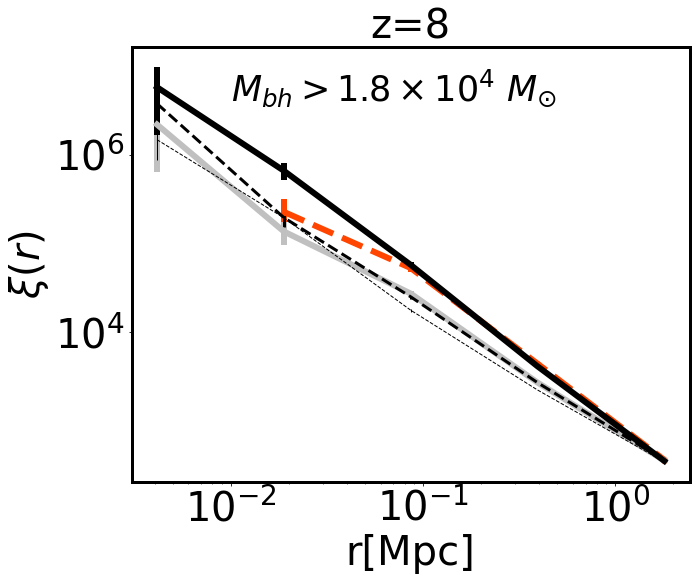

In [12]:



def make_plot(ax):
    for redshift in [8]:
        dist_bins, max_dist,min_dist = 5, 1e-3, 2


        Coordinates,o=arepo_package.get_particle_property(basePath,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_gas,linewidth=6,linestyle='dashed',marker='o')



        Coordinates,o=arepo_package.get_particle_property(basePath2,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath2,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF,linewidth=6)


        Coordinates,o=arepo_package.get_particle_property(basePath44_11,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath44_11,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath44_11,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=6)
        
        
        Coordinates,o=arepo_package.get_particle_property(basePath5_11,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath5_11,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath5_11,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=1,linestyle='dashed')
        
        
        Coordinates,o=arepo_package.get_particle_property(basePath6_11,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath6_11,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath6_11,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=3,linestyle='dashed')



        ax.set_title('z=%d'%redshift,fontsize=40)


        ax.set_xlabel('r[Mpc]',fontsize=label_fontsize)


        #ax.set_ylim(1e2,1e6)

        ax.tick_params(labelsize=label_fontsize)
        ax.set_yscale('log')
        ax.set_xscale('log')

        
        
f,axx=plt.subplots(1,1,figsize=(10,8),sharex=True,sharey=True)

mass_cut=1.25e4/1e10
lum_cut=0


make_plot(axx)



#axx.set_title(r'$M_{bh}>1.25\times10^{4}M_{\odot}/h$',fontsize=label_fontsize)


axx.set_ylabel(r'$\xi(r)$',fontsize=label_fontsize)


axx.text(0.01,4e6,r'$M_{bh}>1.8\times 10^4 \ M_{\odot}$',fontsize=label_fontsize-5)


axx.legend(loc='lower left',fontsize=label_fontsize-15,frameon=False)

ax=axx
ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)  # Right axis

plt.subplots_adjust(wspace=0)

plt.savefig('./Paper5_figures/subhalo_based_models4_Msfmp5_Mh10000.png',bbox_inches='tight')


        

17 8.012172948865935
Total number of mergers 5409
17 8.012172948865935
Total number of mergers 234
17 8.012172948865935
Total number of mergers 144
17 8.012172948865935
Total number of mergers 423
17 8.012172948865935
Total number of mergers 712


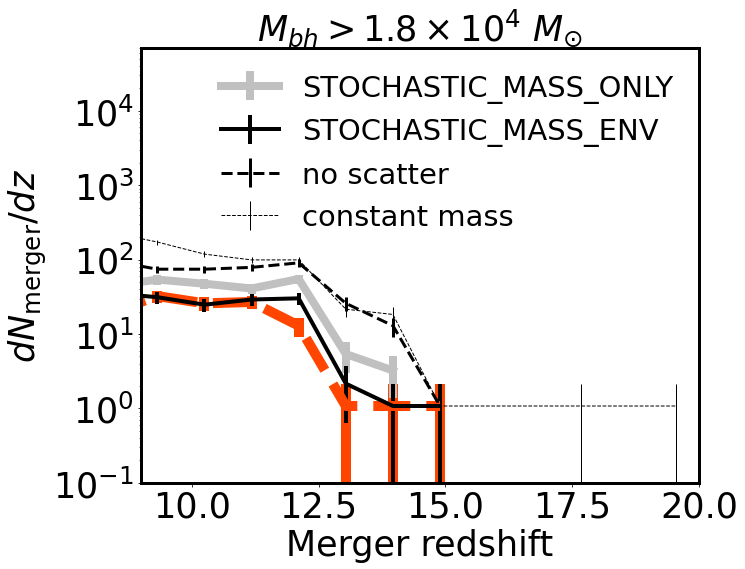

In [98]:
text_fontsize=25

title_fontsize=30

redshift_cut=8



mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=1

nbins=15
min_value=7
max_value=20

upto_redshift=8
f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

ratio=Mh

i=0
HDF5=1
levelmax=12
logseedmass=3.19  


offset=0
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    mass_cut=1.25e4
    
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linestyle='dashed',linewidth=10,color=col_gas)
    #offset+=0
   
    

for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath2,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=8,color=col_bFOF,label='STOCHASTIC_MASS_ONLY')
    #offset+=0.05

 

    
    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath44_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],label='STOCHASTIC_MASS_ENV',linewidth=4,color=col_bFOF3)
    #offset+=0.05

for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath6_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=3,color=col_bFOF3,linestyle='dashed',label='no scatter')
    #offset+=0.05
 
    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath5_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=1,color=col_bFOF3,linestyle='dashed',label='constant mass')
    #offset+=0.05
    
  
    
    ax.set_yscale('log')
    ax.set_ylim(0.1,1000)    
    ax.set_xlim(9,20)
    
    
    
   
  
    
    ax.set_yscale('log')
    ax.set_ylim(0.1,70000)    
    ax.set_xlim(9,20)





axx.set_ylabel('$dN_{\mathrm{merger}}/dz$',fontsize=label_fontsize-5)

axx.set_xlabel('Merger redshift',fontsize=label_fontsize-5)
#set_default_fontsizes(axx[2],'Merger redshift',' ')
#set_default_fontsizes(axx[3],'Merger redshift',' ')

#axx[0].set_ylim(0.1,100)
#axx[1].set_ylim(0.1,100)

axx.tick_params(labelsize=label_fontsize-5)

axx.set_title(r'$M_{bh}>1.8 \times 10^4 \ M_{\odot}$',fontsize=label_fontsize-5)

axx.legend(loc='upper right',fontsize=label_fontsize-11,frameon=False)


#set_legend(axx[0],'upper right')


#axx[0].text(12,600,r'$M_{\mathrm{seed}} = 1.25 \times 10^{4} M_{\odot}/h$',fontsize=text_fontsize+2)


#axx[1].text(12,600,r'$M_{\mathrm{seed}} = 1 \times 10^{5} M_{\odot}/h$',fontsize=text_fontsize+2)

plt.subplots_adjust(wspace=0,hspace=0)
ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)  # Right axis


plt.savefig('./Paper5_figures/subhalo_based_models3_Msfmp5_Mh10000.png',bbox_inches='tight')


#plt.savefig('./Paper2_figures/All_Merger_rates_LW_dependence.png',bbox_inches='tight')





blackhole_seeding2_138.txt
blackhole_seeding2_125.txt
blackhole_seeding2_39.txt
blackhole_seeding2_233.txt
blackhole_seeding2_214.txt
blackhole_seeding2_134.txt
blackhole_seeding2_206.txt
blackhole_seeding2_199.txt
blackhole_seeding2_140.txt
blackhole_seeding2_63.txt
blackhole_seeding2_135.txt
blackhole_seeding2_209.txt
blackhole_seeding2_117.txt
blackhole_seeding2_221.txt
blackhole_seeding2_172.txt
blackhole_seeding2_230.txt
blackhole_seeding2_215.txt
blackhole_seeding2_119.txt
blackhole_seeding2_147.txt
blackhole_seeding2_190.txt
blackhole_seeding2_242.txt
blackhole_seeding2_182.txt
blackhole_seeding2_164.txt
blackhole_seeding2_225.txt
blackhole_seeding2_121.txt
blackhole_seeding2_21.txt
blackhole_seeding2_168.txt
blackhole_seeding2_32.txt
blackhole_seeding2_250.txt
blackhole_seeding2_92.txt
blackhole_seeding2_34.txt
blackhole_seeding2_49.txt
blackhole_seeding2_158.txt
blackhole_seeding2_222.txt
blackhole_seeding2_229.txt
blackhole_seeding2_93.txt
blackhole_seeding2_68.txt
blackhole_

blackhole_seeding2_234.txt
blackhole_seeding2_223.txt
blackhole_seeding2_90.txt
blackhole_seeding2_192.txt
blackhole_seeding2_91.txt
blackhole_seeding2_191.txt
blackhole_seeding2_160.txt
blackhole_seeding2_73.txt
blackhole_seeding2_51.txt
blackhole_seeding2_66.txt
blackhole_seeding2_101.txt
blackhole_seeding2_129.txt
blackhole_seeding2_29.txt
blackhole_seeding2_248.txt
blackhole_seeding2_86.txt
blackhole_seeding2_114.txt
blackhole_seeding2_88.txt
blackhole_seeding2_151.txt
blackhole_seeding2_139.txt
blackhole_seeding2_188.txt
blackhole_seeding2_69.txt
blackhole_seeding2_40.txt
blackhole_seeding2_207.txt
blackhole_seeding2_27.txt
blackhole_seeding2_227.txt
blackhole_seeding2_195.txt
blackhole_seeding2_31.txt
blackhole_seeding2_102.txt
blackhole_seeding2_47.txt
blackhole_seeding2_19.txt
blackhole_seeding2_252.txt
blackhole_seeding2_174.txt
blackhole_seeding2_100.txt
blackhole_seeding2_20.txt
blackhole_seeding2_8.txt
blackhole_seeding2_71.txt
blackhole_seeding2_246.txt
blackhole_seeding2_

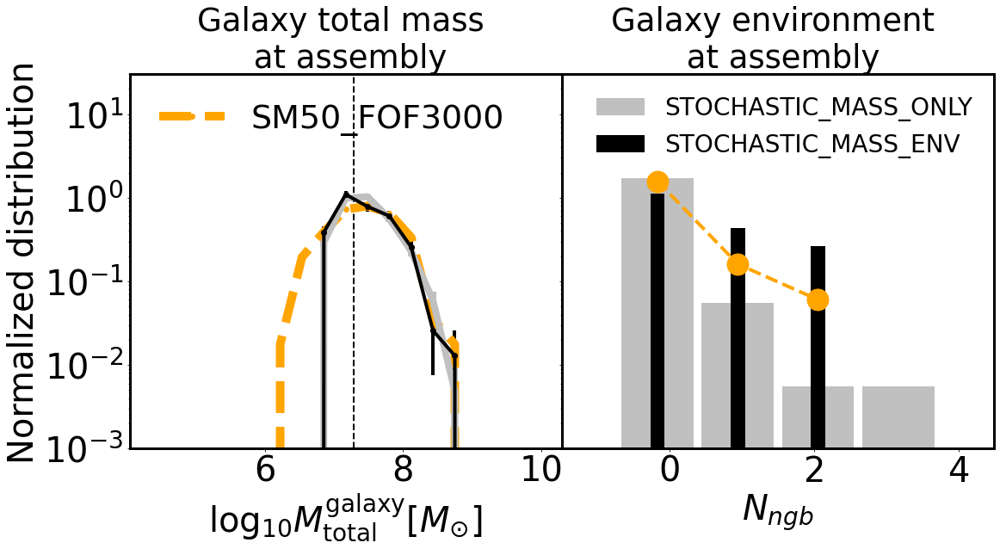

In [13]:

f,axx=plt.subplots(1,2,figsize=(18,8),sharey=True)

LogTargetGroupBHMass=4.10
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19
Msfmp,Mh=50,3000
Nbins,minimum,maximum=20,4,10
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)


basePath=path_to_output+run+output

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_min_redshift_space=data[0]
unique_LogGroupStellarMass_min_redshift_space=data[1]
unique_LogGroupSFR_min_redshift_space=data[2]
unique_LogGroupSF_min_redshift_space=data[3]
unique_LogGroupSFMP_min_redshift_space=data[4]
unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
unique_LogGroupGasMetallicity_min_redshift_space=data[6]
unique_min_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_max_redshift_space=data[0]
unique_LogGroupStellarMass_max_redshift_space=data[1]
unique_LogGroupSFR_max_redshift_space=data[2]
unique_LogGroupSF_max_redshift_space=data[3]
unique_LogGroupSFMP_max_redshift_space=data[4]
unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
unique_LogGroupGasMetallicity_max_redshift_space=data[6]
unique_max_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_target_redshift_space=data[0]
unique_LogGroupStellarMass_target_redshift_space=data[1]
unique_LogGroupSFR_target_redshift_space=data[2]
unique_LogGroupSF_target_redshift_space=data[3]
unique_LogGroupSFMP_target_redshift_space=data[4]
unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
unique_LogGroupGasMetallicity_target_redshift_space=data[6]
unique_target_redshift_space=data[7]

unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)



levelmax,logseedmass=11,4.10

unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw/'%(Msfmp,Mh)
basePath2=path_to_output+run+output







path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath44_11=path_to_output+run+output



path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_constant_mass_threshold_2.88/'
basePath5_11=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_2_scatter0/'%(Msfmp,Mh)
basePath6_11=path_to_output+run+output


levelmax,logseedmass=12,3.19
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath44=path_to_output+run+output



Nbins,minimum,maximum=20,4,10
col_gas='orange'
col_bFOF='silver'
col_bFOF2='grey'
col_bFOF3='black'


a,b,c=get_distribution(unique_LogGroupMass_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[0].errorbar(a-log10(h), b/norm,linewidth=10,marker='o',color=col_gas,linestyle='dashed',label='SM50_FOF3000')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=8,color=col_bFOF)#ax.set_yscale('log')


scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,kk=arepo_package.get_seeding_events4(basePath44_11,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=4,color=col_bFOF3)#ax.set_yscale('log')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath5_11,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
#axx[0].errorbar(a,b/norm,c/norm,marker='o',linewidth=1,color=col_bFOF3,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

axx[0].axvline(-2.88+10-log10(h),linewidth=2,linestyle='dashed',color=col_bFOF3)




Nbins,minimum,maximum=10,-1,4
a,b,c=get_distribution(unique_GroupNeighbors_max_redshift_space,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
#b/=norm
axx[1].errorbar(a[maskb], b[maskb]/norm,linewidth=4,marker='o',ms=25,color=col_gas,zorder=10,linestyle='dashed')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[1].bar(a,b/norm,width=1,color=col_bFOF,label='STOCHASTIC_MASS_ONLY')#ax.set_yscale('log')



scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete=arepo_package.get_seeding_events3(basePath44_11,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[1].bar(a,b/norm,width=0.2,color=col_bFOF3,label='STOCHASTIC_MASS_ENV')#ax.set_yscale('log')


axx[0].set_ylim(1e-3,3e1)
axx[0].set_yscale('log')

axx[0].tick_params(labelsize=label_fontsize)

axx[1].tick_params(labelsize=label_fontsize)

axx[0].set_xlabel('$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)
axx[1].set_xlabel('$N_{ngb}$',fontsize=label_fontsize)

axx[0].set_ylabel('Normalized distribution',fontsize=label_fontsize)


axx[0].set_title('Galaxy total mass \n at assembly',fontsize=label_fontsize-3)

axx[1].set_title('Galaxy environment \n at assembly',fontsize=label_fontsize-3)


axx[0].legend(loc='upper left',fontsize=label_fontsize-2,frameon=False)
axx[1].legend(loc='upper right',fontsize=label_fontsize-12,frameon=False)

plt.subplots_adjust(wspace=0)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)  # Right axis

plt.savefig('./Paper5_figures/subhalo_based_models_Msfmp50_Mh3000.png',bbox_inches='tight')



#axx[1].set_yscale('log')



In [29]:
basePath5_11

'/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4//density_and_metallicity_based_criterion_zoom_levelmin7_levelmax11_haloindex4_redshift5.00_logbhseedmass4.10_NSC/AREPO//output_constant_mass_threshold_2.88/'

Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  12
Output redshift:  11.980213315300293
Output snapshot:  13
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  14
Output redshift:  14.033992144452485
Output snapshot:  11
Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10
Desired redshift:  16
Output redshift:  16.005041538113627
Output snapshot:  9
Desired redshift:  17
Output redshift:  16.999960992518137
Output snapshot:  8
Desired redshift:  18
Output redshift:  17.963024604582767
Output snapshot:  7
Desired redshift:  19
Output redshift:  18.977615635027277
Output snapshot:  6
Desired redshift:  20
Output redshift:  20.0464909

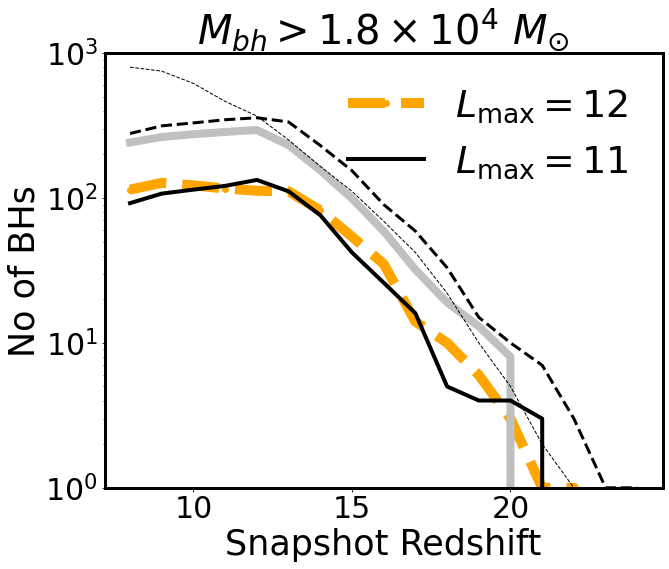

In [5]:
def make_plot(style='solid'):

    redshift_space=numpy.arange(8,25)

    BH_no_space=[]

    

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_gas,linewidth=10,linestyle='dashed',marker='o',label='$L_{\mathrm{max}}=12$')


    BH_no_space=[]

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF,linewidth=8,linestyle=style)
    
    
    BH_no_space=[]

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath44_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=4,linestyle=style,label='$L_{\mathrm{max}}=11$')
    



    BH_no_space=[]  

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath5_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=1,linestyle='dashed')
    
    
    BH_no_space=[]  

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath6_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=3,linestyle='dashed')

    
    
    ax.set_yscale('log')

    ax.tick_params(labelsize=30)
    ax.set_xlabel('Snapshot Redshift',fontsize=label_fontsize-5)
    ax.set_ylabel('No of BHs',fontsize=label_fontsize-5)
    


    
mass_cut=1.25e4
f,ax=plt.subplots(1,1,figsize=(10,8))
make_plot()
ax.set_ylim(1,1000)

ax.legend(loc='upper right',fontsize=label_fontsize-2,frameon=False)
ax.set_title(r'$M_{bh}>1.8 \times 10^4 \ M_{\odot}$',fontsize=label_fontsize)
ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)  # Right axis

plt.savefig('./Paper5_figures/subhalo_based_models2_Msfmp50_Mh3000.png',bbox_inches='tight')





Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  12
Output redshift:  11.980213315300293
Output snapshot:  13
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  14
Output redshift:  14.033992144452485
Output snapshot:  11
Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10
Desired redshift:  16
Output redshift:  16.005041538113627
Output snapshot:  9
Desired redshift:  17
Output redshift:  16.999960992518137
Output snapshot:  8
Desired redshift:  18
Output redshift:  17.963024604582767
Output snapshot:  7
Desired redshift:  19
Output redshift:  18.977615635027277
Output snapshot:  6
Desired redshift:  20
Output redshift:  20.0464909

Text(0.5, 1.0, '$M_{bh}>1.25 \\times 10^4 \\ M_{\\odot}/h$')

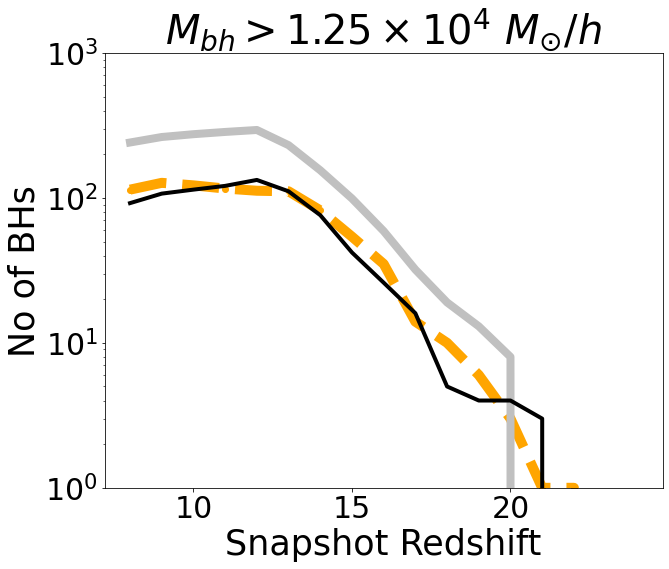

In [18]:
def make_plot(style='solid'):

    redshift_space=numpy.arange(8,25)

    BH_no_space=[]

    

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_gas,linewidth=10,linestyle='dashed',marker='o',label='$L_{\mathrm{max}}=12$')


    BH_no_space=[]

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF,linewidth=8,linestyle=style)
    
    
    BH_no_space=[]

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath44_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=4,linestyle=style,label='$L_{\mathrm{max}}=11$')
    



    BH_no_space=[]  

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath5_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    #ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=1,linestyle='dashed')
    
    
    BH_no_space=[]  

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath6_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    #ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=3,linestyle='dashed')

    
    
    ax.set_yscale('log')

    ax.tick_params(labelsize=30)
    ax.set_xlabel('Snapshot Redshift',fontsize=label_fontsize-5)
    ax.set_ylabel('No of BHs',fontsize=label_fontsize-5)
    


    
mass_cut=1.25e4
f,ax=plt.subplots(1,1,figsize=(10,8))
make_plot()
ax.set_ylim(1,1000)

#ax.legend(loc='upper right',fontsize=label_fontsize-2,frameon=False)
ax.set_title(r'$M_{bh}>1.25 \times 10^4 \ M_{\odot}/h$',fontsize=label_fontsize)


#plt.savefig('./Paper5_figures/subhalo_based_models2_Msfmp50_Mh3000.png',bbox_inches='tight')





Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[3.26817130e-07 3.12552379e-05 2.98910249e-03 2.85863564e-01
 2.73386334e+01]
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[1.44309983e-06 1.38011213e-04 1.31987368e-02 1.26226450e+00
 1.20716981e+02]
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[2.12398153e-07 2.03127505e-05 1.94261497e-03 1.85782468e-01
 1.77673528e+01]
Desired redshift:  8
Output redshift:  8.012172948865935
Output 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[1.95364694e-06 1.86837514e-04 1.78682523e-02 1.70883478e+00
 1.63424841e+02]


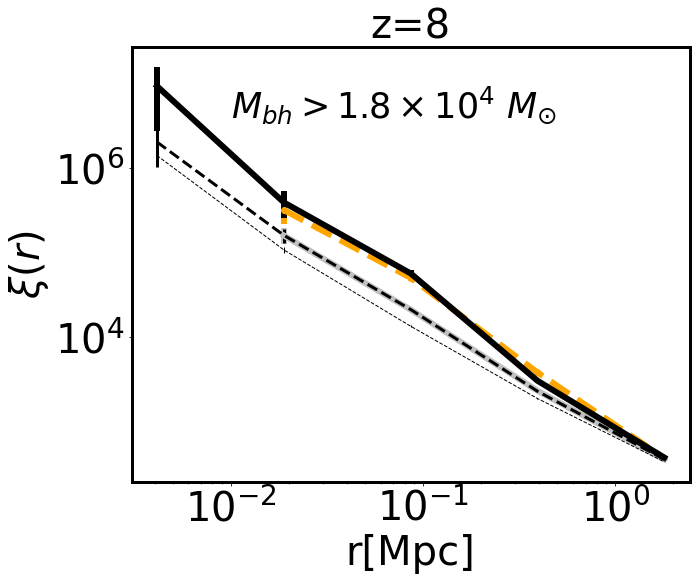

In [9]:



def make_plot(ax):
    for redshift in [8]:
        dist_bins, max_dist,min_dist = 5, 1e-3, 2


        Coordinates,o=arepo_package.get_particle_property(basePath,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_gas,linewidth=6,linestyle='dashed',marker='o')



        Coordinates,o=arepo_package.get_particle_property(basePath2,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath2,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF,linewidth=6)


        Coordinates,o=arepo_package.get_particle_property(basePath44_11,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath44_11,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath44_11,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=6)
        
        
        Coordinates,o=arepo_package.get_particle_property(basePath5_11,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath5_11,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath5_11,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=1,linestyle='dashed')
        
        
        Coordinates,o=arepo_package.get_particle_property(basePath6_11,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath6_11,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath6_11,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=3,linestyle='dashed')



        ax.set_title('z=%d'%redshift,fontsize=40)


        ax.set_xlabel('r[Mpc]',fontsize=label_fontsize)


        #ax.set_ylim(1e2,1e6)

        ax.tick_params(labelsize=label_fontsize)
        ax.set_yscale('log')
        ax.set_xscale('log')

        
        
f,axx=plt.subplots(1,1,figsize=(10,8),sharex=True,sharey=True)

mass_cut=1.25e4/1e10
lum_cut=0


make_plot(axx)



#axx.set_title(r'$M_{bh}>1.25\times10^{4}M_{\odot}/h$',fontsize=label_fontsize)

axx.set_ylabel(r'$\xi(r)$',fontsize=label_fontsize)


axx.text(0.01,4e6,r'$M_{bh}>1.8\times 10^4 \ M_{\odot}$',fontsize=label_fontsize-5)


#axx.set_ylabel(r'$\xi(r)$'+ '\n' + r'$(M_{bh}>1.25 \times 10^4 \ M_{\odot}/h)$',fontsize=label_fontsize)

axx.legend(loc='lower left',fontsize=label_fontsize-15,frameon=False)


ax=axx
ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)  # Right axis

plt.subplots_adjust(wspace=0)

plt.savefig('./Paper5_figures/subhalo_based_models4_Msfmp50_Mh3000.png',bbox_inches='tight')


        

17 8.012172948865935
Total number of mergers 7408
17 8.012172948865935
Total number of mergers 421
17 8.012172948865935
Total number of mergers 149
17 8.012172948865935
Total number of mergers 776
17 8.012172948865935
Total number of mergers 1729


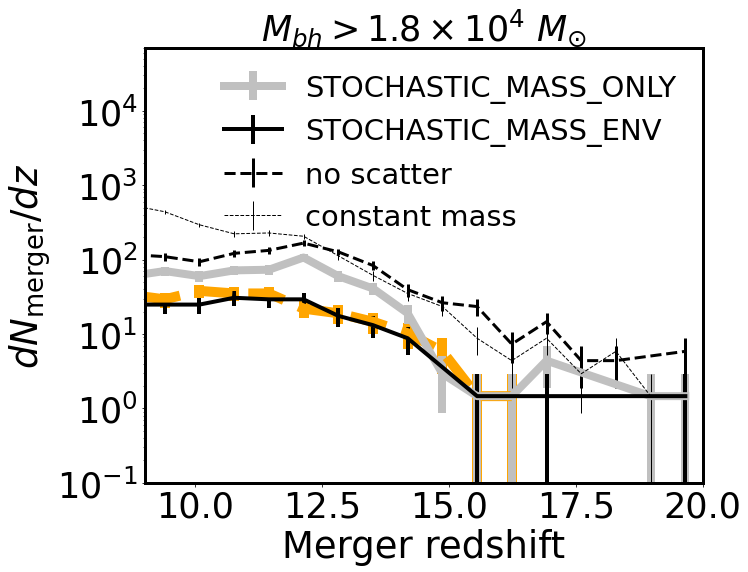

In [15]:
text_fontsize=25

title_fontsize=30

redshift_cut=8



mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=1

nbins=20
min_value=7
max_value=20

upto_redshift=8
f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

ratio=Mh

i=0
HDF5=1
levelmax=12
logseedmass=3.19  


offset=0
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    mass_cut=1.25e4
    
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linestyle='dashed',linewidth=10,color=col_gas)
    #offset+=0
   
    

for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath2,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=8,color=col_bFOF,label='STOCHASTIC_MASS_ONLY')
    #offset+=0.05

 

    
    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath44_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],label='STOCHASTIC_MASS_ENV',linewidth=4,color=col_bFOF3)
    #offset+=0.05


    
    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath6_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=3,color=col_bFOF3,linestyle='dashed',label='no scatter')
    #offset+=0.05
 
    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath5_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=1,color=col_bFOF3,linestyle='dashed',label='constant mass')
    #offset+=0.05
    
  
    
    ax.set_yscale('log')
    ax.set_ylim(0.1,1000)    
    ax.set_xlim(9,20)
    
    
    
   
  
    
    ax.set_yscale('log')
    ax.set_ylim(0.1,70000)    
    ax.set_xlim(9,20)






axx.set_ylabel('$dN_{\mathrm{merger}}/dz$',fontsize=label_fontsize-3)

axx.set_xlabel('Merger redshift',fontsize=label_fontsize-3)
#set_default_fontsizes(axx[2],'Merger redshift',' ')
#set_default_fontsizes(axx[3],'Merger redshift',' ')

#axx[0].set_ylim(0.1,100)
#axx[1].set_ylim(0.1,100)

axx.tick_params(labelsize=label_fontsize-5)

axx.set_title(r'$M_{bh}>1.8 \times 10^4 \ M_{\odot}$',fontsize=label_fontsize-5)

axx.legend(loc='upper right',fontsize=label_fontsize-11,frameon=False)


#set_legend(axx[0],'upper right')


#axx[0].text(12,600,r'$M_{\mathrm{seed}} = 1.25 \times 10^{4} M_{\odot}/h$',fontsize=text_fontsize+2)


#axx[1].text(12,600,r'$M_{\mathrm{seed}} = 1 \times 10^{5} M_{\odot}/h$',fontsize=text_fontsize+2)

ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)  # Right axis


plt.subplots_adjust(wspace=0,hspace=0)


plt.savefig('./Paper5_figures/subhalo_based_models3_Msfmp50_Mh3000.png',bbox_inches='tight')


#plt.savefig('./Paper2_figures/All_Merger_rates_LW_dependence.png',bbox_inches='tight')





17 8.012172948865935
Total number of mergers 7408
17 8.012172948865935
Total number of mergers 421
17 8.012172948865935
Total number of mergers 149
17 8.012172948865935
Total number of mergers 1729
17 8.012172948865935
Total number of mergers 776


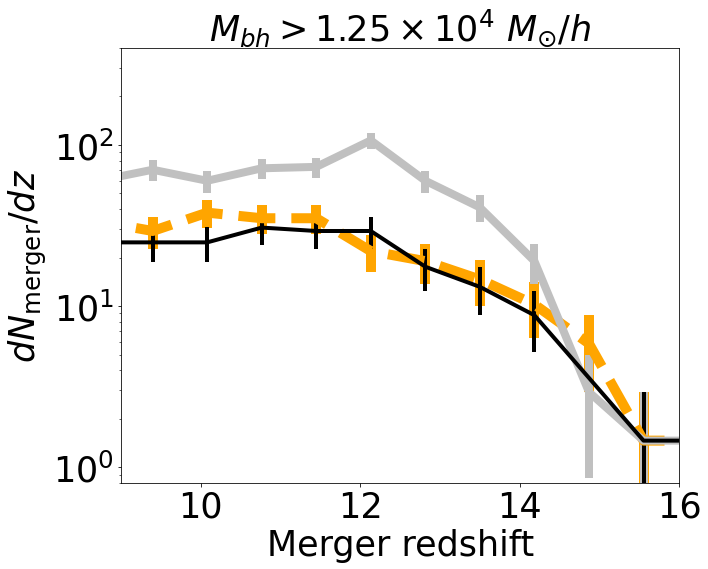

In [22]:
text_fontsize=25

title_fontsize=30

redshift_cut=8



mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=1

nbins=20
min_value=7
max_value=20

upto_redshift=8
f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

ratio=Mh

i=0
HDF5=1
levelmax=12
logseedmass=3.19  


offset=0
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    mass_cut=1.25e4
    
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linestyle='dashed',linewidth=10,color=col_gas)
    #offset+=0
   
    

for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath2,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=8,color=col_bFOF,label='STOCHASTIC_MASS_ONLY')
    #offset+=0.05

 

    
    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath44_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],label='STOCHASTIC_MASS_ENV',linewidth=4,color=col_bFOF3)
    #offset+=0.05


    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath5_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    #ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=1,color=col_bFOF3,linestyle='dashed',label='STOCHASTIC_MASS_ONLY (constant mass)')
    #offset+=0.05
    
  
    
    ax.set_yscale('log')
    ax.set_ylim(0.1,1000)    
    ax.set_xlim(9,20)
    
    
    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath6_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    #ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=3,color=col_bFOF3,linestyle='dashed',label='STOCHASTIC_MASS_ONLY (noscatter)')
    #offset+=0.05
    
  
    
    ax.set_yscale('log')
    ax.set_ylim(0.8,400)    
    ax.set_xlim(9,16)






axx.set_ylabel('$dN_{\mathrm{merger}}/dz$',fontsize=label_fontsize-5)

axx.set_xlabel('Merger redshift',fontsize=label_fontsize-5)
#set_default_fontsizes(axx[2],'Merger redshift',' ')
#set_default_fontsizes(axx[3],'Merger redshift',' ')

#axx[0].set_ylim(0.1,100)
#axx[1].set_ylim(0.1,100)

axx.tick_params(labelsize=label_fontsize-5)

axx.set_title(r'$M_{bh}>1.25 \times 10^4 \ M_{\odot}/h$',fontsize=label_fontsize-5)

#axx.legend(loc='upper right',fontsize=label_fontsize-19,frameon=False)


#set_legend(axx[0],'upper right')


#axx[0].text(12,600,r'$M_{\mathrm{seed}} = 1.25 \times 10^{4} M_{\odot}/h$',fontsize=text_fontsize+2)


#axx[1].text(12,600,r'$M_{\mathrm{seed}} = 1 \times 10^{5} M_{\odot}/h$',fontsize=text_fontsize+2)

plt.subplots_adjust(wspace=0,hspace=0)


plt.savefig('./Paper5_figures/subhalo_based_models3_Msfmp50_Mh3000.png',bbox_inches='tight')


#plt.savefig('./Paper2_figures/All_Merger_rates_LW_dependence.png',bbox_inches='tight')





blackhole_seeding2_79.txt
blackhole_seeding2_176.txt
blackhole_seeding2_59.txt
blackhole_seeding2_205.txt
blackhole_seeding2_98.txt
blackhole_seeding2_253.txt
blackhole_seeding2_254.txt
blackhole_seeding2_4.txt
blackhole_seeding2_157.txt
blackhole_seeding2_186.txt
blackhole_seeding2_245.txt
blackhole_seeding2_206.txt
blackhole_seeding2_142.txt
blackhole_seeding2_199.txt
blackhole_seeding2_123.txt
blackhole_seeding2_117.txt
blackhole_seeding2_172.txt
blackhole_seeding2_215.txt
blackhole_seeding2_147.txt
blackhole_seeding2_242.txt
blackhole_seeding2_85.txt
blackhole_seeding2_3.txt
blackhole_seeding2_180.txt
blackhole_seeding2_167.txt
blackhole_seeding2_126.txt
blackhole_seeding2_146.txt
blackhole_seeding2_84.txt
blackhole_seeding2_133.txt
blackhole_seeding2_154.txt
blackhole_seeding2_32.txt
blackhole_seeding2_250.txt
blackhole_seeding2_49.txt
blackhole_seeding2_149.txt
blackhole_seeding2_96.txt
blackhole_seeding2_229.txt
blackhole_seeding2_38.txt
blackhole_seeding2_237.txt
blackhole_seed

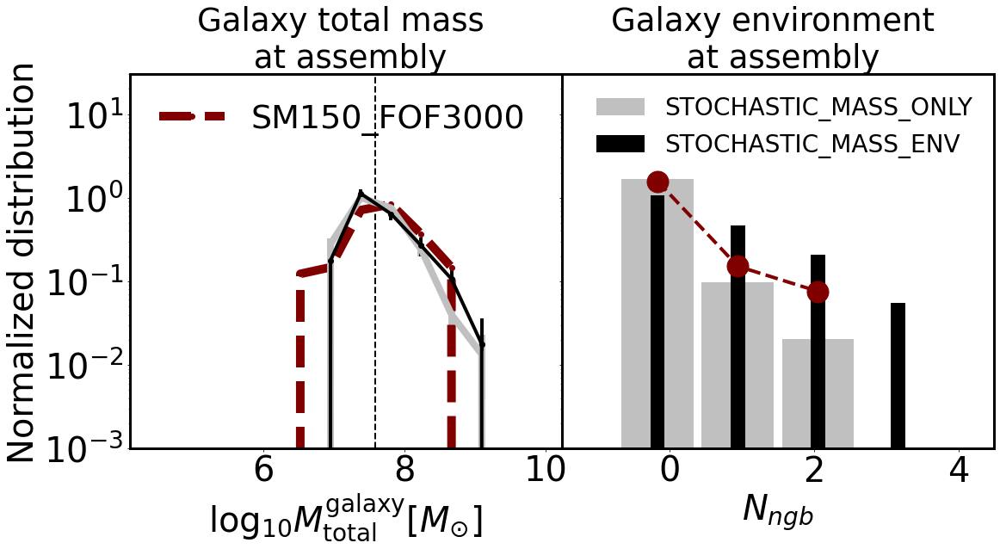

In [37]:

f,axx=plt.subplots(1,2,figsize=(18,8),sharey=True)

LogTargetGroupBHMass=4.10
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19
Msfmp,Mh=150,3000
Nbins,minimum,maximum=12,4,9
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)


basePath=path_to_output+run+output

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_min_redshift_space=data[0]
unique_LogGroupStellarMass_min_redshift_space=data[1]
unique_LogGroupSFR_min_redshift_space=data[2]
unique_LogGroupSF_min_redshift_space=data[3]
unique_LogGroupSFMP_min_redshift_space=data[4]
unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
unique_LogGroupGasMetallicity_min_redshift_space=data[6]
unique_min_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_max_redshift_space=data[0]
unique_LogGroupStellarMass_max_redshift_space=data[1]
unique_LogGroupSFR_max_redshift_space=data[2]
unique_LogGroupSF_max_redshift_space=data[3]
unique_LogGroupSFMP_max_redshift_space=data[4]
unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
unique_LogGroupGasMetallicity_max_redshift_space=data[6]
unique_max_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_target_redshift_space=data[0]
unique_LogGroupStellarMass_target_redshift_space=data[1]
unique_LogGroupSFR_target_redshift_space=data[2]
unique_LogGroupSF_target_redshift_space=data[3]
unique_LogGroupSFMP_target_redshift_space=data[4]
unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
unique_LogGroupGasMetallicity_target_redshift_space=data[6]
unique_target_redshift_space=data[7]

unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)



levelmax,logseedmass=11,4.10

unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_2/'%(Msfmp,Mh)
basePath2=path_to_output+run+output







path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_env_5_0.1_0.3_slope1.6/'%(Msfmp,Mh)
basePath44_11=path_to_output+run+output



path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_constant_mass_threshold_2.58/'
basePath5_11=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_2_scatter0/'%(Msfmp,Mh)
basePath6_11=path_to_output+run+output


Nbins,minimum,maximum=15,4,10
col_gas='maroon'
col_bFOF='silver'
col_bFOF2='grey'
col_bFOF3='black'


a,b,c=get_distribution(unique_LogGroupMass_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[0].errorbar(a-log10(h), b/norm,linewidth=10,marker='o',color=col_gas,linestyle='dashed',label='SM150_FOF3000')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,kk=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=8,color=col_bFOF)#ax.set_yscale('log')


scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,kk=arepo_package.get_seeding_events4(basePath44_11,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=4,color=col_bFOF3)#ax.set_yscale('log')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath5_11,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
#axx[0].errorbar(a,b/norm,c/norm,marker='o',linewidth=1,color=col_bFOF3,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

axx[0].axvline(-2.58+10-log10(h),linewidth=2,linestyle='dashed',color=col_bFOF3)




Nbins,minimum,maximum=10,-1,4
a,b,c=get_distribution(unique_GroupNeighbors_max_redshift_space,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
#b/=norm
axx[1].errorbar(a[maskb], b[maskb]/norm,linewidth=4,marker='o',ms=25,color=col_gas,zorder=10,linestyle='dashed')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,kk=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[1].bar(a,b/norm,width=1,color=col_bFOF,label='STOCHASTIC_MASS_ONLY')#ax.set_yscale('log')



scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,kk=arepo_package.get_seeding_events4(basePath44_11,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[1].bar(a,b/norm,width=0.2,color=col_bFOF3,label='STOCHASTIC_MASS_ENV')#ax.set_yscale('log')


axx[0].set_ylim(1e-3,3e1)
axx[0].set_yscale('log')

axx[0].tick_params(labelsize=label_fontsize)

axx[1].tick_params(labelsize=label_fontsize)

axx[0].set_xlabel('$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)
axx[1].set_xlabel('$N_{ngb}$',fontsize=label_fontsize)

axx[0].set_ylabel('Normalized distribution',fontsize=label_fontsize)


axx[0].set_title('Galaxy total mass \n at assembly',fontsize=label_fontsize-3)

axx[1].set_title('Galaxy environment \n at assembly',fontsize=label_fontsize-3)


axx[0].legend(loc='upper left',fontsize=label_fontsize-2,frameon=False)
axx[1].legend(loc='upper right',fontsize=label_fontsize-12,frameon=False)

plt.subplots_adjust(wspace=0)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)  # Right axis


plt.savefig('./Paper5_figures/subhalo_based_models_Msfmp150_Mh3000.png',bbox_inches='tight')



#axx[1].set_yscale('log')



Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  12
Output redshift:  11.980213315300293
Output snapshot:  13
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  14
Output redshift:  14.033992144452485
Output snapshot:  11
Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10
Desired redshift:  16
Output redshift:  16.005041538113627
Output snapshot:  9
Desired redshift:  17
Output redshift:  16.999960992518137
Output snapshot:  8
Desired redshift:  18
Output redshift:  17.963024604582767
Output snapshot:  7
Desired redshift:  19
Output redshift:  18.977615635027277
Output snapshot:  6
Desired redshift:  20
Output redshift:  20.0464909

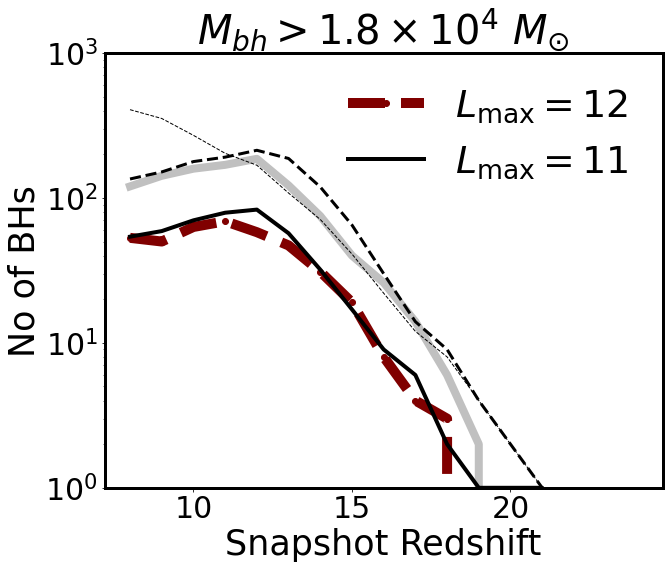

In [18]:
def make_plot(style='solid'):

    redshift_space=numpy.arange(8,25)

    BH_no_space=[]

    

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_gas,linewidth=10,linestyle='dashed',marker='o',label='$L_{\mathrm{max}}=12$')


    BH_no_space=[]

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF,linewidth=8,linestyle=style)
    
    
    BH_no_space=[]

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath44_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=4,linestyle=style,label='$L_{\mathrm{max}}=11$')
    
    

    BH_no_space=[]  

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath5_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=1,linestyle='dashed')
    
    
    BH_no_space=[]  

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath6_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=3,linestyle='dashed')

    
    
    ax.set_yscale('log')

    ax.tick_params(labelsize=30)
    ax.set_xlabel('Snapshot Redshift',fontsize=label_fontsize-5)
    ax.set_ylabel('No of BHs',fontsize=label_fontsize-5)
    


    
mass_cut=1.25e4
f,ax=plt.subplots(1,1,figsize=(10,8))
make_plot()
ax.set_ylim(1,1000)



ax.legend(loc='upper right',fontsize=label_fontsize-2,frameon=False)
ax.set_title(r'$M_{bh}>1.8 \times 10^4 \ M_{\odot}$',fontsize=label_fontsize)


ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)  # Right axis


plt.savefig('./Paper5_figures/subhalo_based_models2_Msfmp150_Mh3000.png',bbox_inches='tight')





Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[6.99198890e-08 6.68680606e-06 6.39494369e-04 6.11582039e-02
 5.84888012e+00]
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[3.62284476e-07 3.46471664e-05 3.31349042e-03 3.16886485e-01
 3.03055182e+01]
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
[7.26091155e-08 6.94399091e-06 6.64090307e-04 6.35104425e-02
 6.07383704e+00]
Desired redshift:  8
Output redshift:  8.012172948865935
Output 

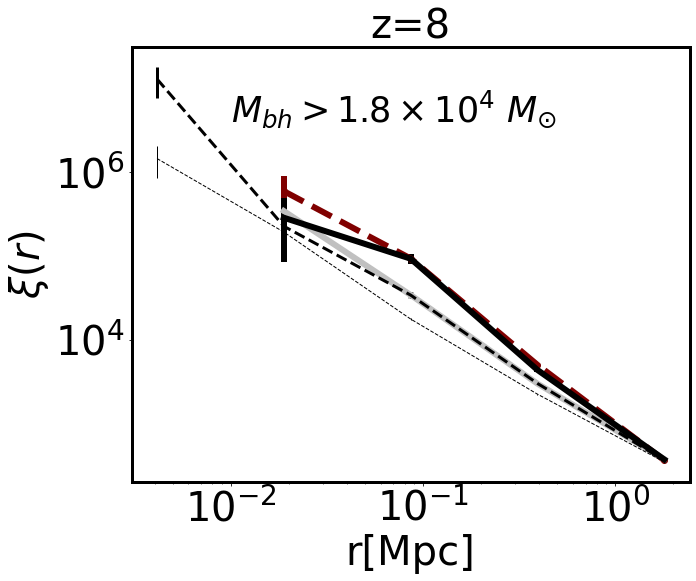

In [21]:



def make_plot(ax):
    for redshift in [8]:
        dist_bins, max_dist,min_dist = 5, 1e-3, 2


        Coordinates,o=arepo_package.get_particle_property(basePath,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_gas,linewidth=6,linestyle='dashed',marker='o')



        Coordinates,o=arepo_package.get_particle_property(basePath2,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath2,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF,linewidth=6)


        Coordinates,o=arepo_package.get_particle_property(basePath44_11,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath44_11,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath44_11,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=6)
        
        
        Coordinates,o=arepo_package.get_particle_property(basePath5_11,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath5_11,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath5_11,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=1,linestyle='dashed')
        
        
        Coordinates,o=arepo_package.get_particle_property(basePath6_11,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath6_11,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath6_11,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist, 25000, WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col_bFOF3,linewidth=3,linestyle='dashed')



        ax.set_title('z=%d'%redshift,fontsize=40)


        ax.set_xlabel('r[Mpc]',fontsize=label_fontsize)


        #ax.set_ylim(1e2,1e6)

        ax.tick_params(labelsize=label_fontsize)
        ax.set_yscale('log')
        ax.set_xscale('log')

        
        
f,axx=plt.subplots(1,1,figsize=(10,8),sharex=True,sharey=True)

mass_cut=1.25e4/1e10
lum_cut=0


make_plot(axx)



#axx.set_title(r'$M_{bh}>1.25\times10^{4}M_{\odot}/h$',fontsize=label_fontsize)


#axx.set_ylabel(r'$\xi(r)$'+ '\n' + r'$(M_{bh}>1.25 \times 10^4 \ M_{\odot}/h)$',fontsize=label_fontsize)

axx.set_ylabel(r'$\xi(r)$',fontsize=label_fontsize)


axx.text(0.01,4e6,r'$M_{bh}>1.8\times 10^4 \ M_{\odot}$',fontsize=label_fontsize-5)
plt.subplots_adjust(wspace=0)
ax=axx
ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)  # Right axis

plt.savefig('./Paper5_figures/subhalo_based_models4_Msfmp150_Mh3000.png',bbox_inches='tight')


        

In [19]:
1.25/h

1.8461084034854525

17 8.012172948865935
Total number of mergers 3722
17 8.012172948865935
Total number of mergers 225
17 8.012172948865935
Total number of mergers 77
17 8.012172948865935
Total number of mergers 373
17 8.012172948865935
Total number of mergers 712


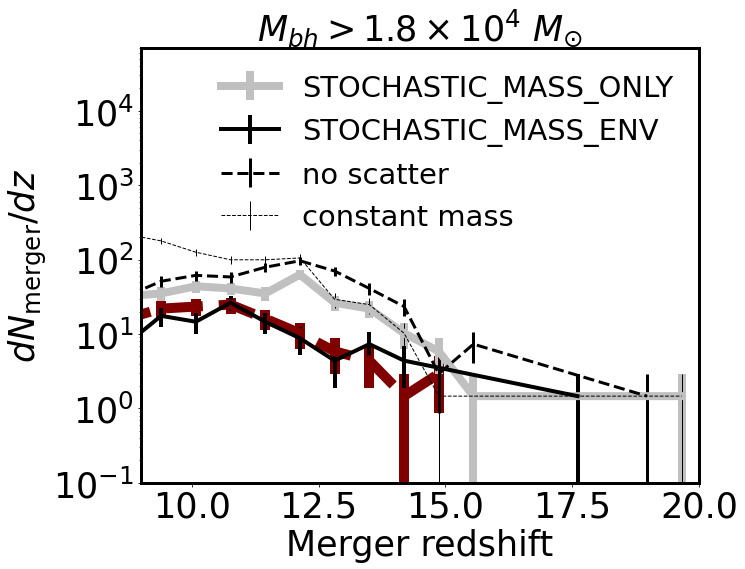

In [22]:
text_fontsize=25

title_fontsize=30

redshift_cut=8



mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=1

nbins=20
min_value=7
max_value=20

upto_redshift=8
f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

ratio=Mh

i=0
HDF5=1
levelmax=12
logseedmass=3.19  


offset=0
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    mass_cut=1.25e4
    
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linestyle='dashed',linewidth=10,color=col_gas)
    #offset+=0
   
    

for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath2,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=8,color=col_bFOF,label='STOCHASTIC_MASS_ONLY')
    #offset+=0.05

 

    
    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath44_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],label='STOCHASTIC_MASS_ENV',linewidth=4,color=col_bFOF3)
    #offset+=0.05

for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath6_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=3,color=col_bFOF3,linestyle='dashed',label='no scatter')
    #offset+=0.05
    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath5_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=1,color=col_bFOF3,linestyle='dashed',label='constant mass')
    #offset+=0.05
    
  
    
    ax.set_yscale('log')
    ax.set_ylim(0.1,1000)    
    ax.set_xlim(9,20)
    
    
    

    
  
    
    ax.set_yscale('log')
    ax.set_ylim(0.1,70000)    
    ax.set_xlim(9,20)





axx.set_ylabel('$dN_{\mathrm{merger}}/dz$',fontsize=label_fontsize-5)

axx.set_xlabel('Merger redshift',fontsize=label_fontsize-5)
#set_default_fontsizes(axx[2],'Merger redshift',' ')
#set_default_fontsizes(axx[3],'Merger redshift',' ')

#axx[0].set_ylim(0.1,100)
#axx[1].set_ylim(0.1,100)

axx.tick_params(labelsize=label_fontsize-5)

axx.set_title(r'$M_{bh}>1.8 \times 10^4 \ M_{\odot}$',fontsize=label_fontsize-5)

axx.legend(loc='upper right',fontsize=label_fontsize-11,frameon=False)



#axx[0].text(12,600,r'$M_{\mathrm{seed}} = 1.25 \times 10^{4} M_{\odot}/h$',fontsize=text_fontsize+2)


#axx[1].text(12,600,r'$M_{\mathrm{seed}} = 1 \times 10^{5} M_{\odot}/h$',fontsize=text_fontsize+2)

plt.subplots_adjust(wspace=0,hspace=0)
ax=axx
ax.spines['top'].set_linewidth(3)    # Top axis
ax.spines['bottom'].set_linewidth(3) # Bottom axis
ax.spines['left'].set_linewidth(3)   # Left axis
ax.spines['right'].set_linewidth(3)  # Right axis


plt.savefig('./Paper5_figures/subhalo_based_models3_Msfmp150_Mh3000.png',bbox_inches='tight')


#plt.savefig('./Paper2_figures/All_Merger_rates_LW_dependence.png',bbox_inches='tight')





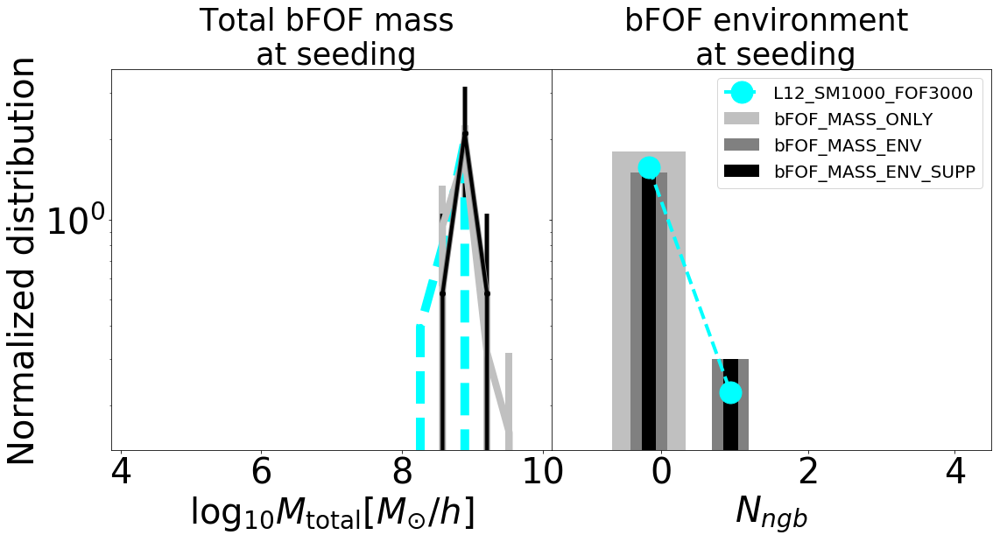

In [13]:

f,axx=plt.subplots(1,2,figsize=(18,8),sharey=True)

LogTargetGroupBHMass=4.10
levelmax_gas,logseedmass_gas=12,3.19
levelmax,logseedmass=12,3.19
Msfmp,Mh=1000,3000
Nbins,minimum,maximum=20,4,10
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)


basePath=path_to_output+run+output

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_min_redshift_space=data[0]
unique_LogGroupStellarMass_min_redshift_space=data[1]
unique_LogGroupSFR_min_redshift_space=data[2]
unique_LogGroupSF_min_redshift_space=data[3]
unique_LogGroupSFMP_min_redshift_space=data[4]
unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
unique_LogGroupGasMetallicity_min_redshift_space=data[6]
unique_min_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_max_redshift_space=data[0]
unique_LogGroupStellarMass_max_redshift_space=data[1]
unique_LogGroupSFR_max_redshift_space=data[2]
unique_LogGroupSF_max_redshift_space=data[3]
unique_LogGroupSFMP_max_redshift_space=data[4]
unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
unique_LogGroupGasMetallicity_max_redshift_space=data[6]
unique_max_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_target_redshift_space=data[0]
unique_LogGroupStellarMass_target_redshift_space=data[1]
unique_LogGroupSFR_target_redshift_space=data[2]
unique_LogGroupSF_target_redshift_space=data[3]
unique_LogGroupSFMP_target_redshift_space=data[4]
unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
unique_LogGroupGasMetallicity_target_redshift_space=data[6]
unique_target_redshift_space=data[7]

unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)





unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.17_1.20_new_no_ex_new9_bFOF3_env/'
basePath2=path_to_output+run+output

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.17_1.20_new_no_ex_new9_bFOF3_env_prob0.3_0.7_mod0.8/'
basePath3=path_to_output+run+output

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.17_1.20_new_no_ex_new9_bFOF3_env_prob0.3_0.7_mod0.8/'
basePath44=path_to_output+run+output


levelmax,logseedmass=11,4.10

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.17_1.20_new_no_ex_new9_bFOF3_env_prob0.3_0.7_mod0.8/'
basePath44_11=path_to_output+run+output


Nbins,minimum,maximum=20,4,10
col_gas='cyan'
col_bFOF='silver'
col_bFOF2='grey'
col_bFOF3='black'
col_bFOF4='cyan'


a,b,c=get_distribution(unique_LogGroupMass_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[0].errorbar(a, b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a,b/norm,c/norm,marker='o',linewidth=8,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath3,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a,b/norm,c/norm,marker='o',linewidth=6,color=col_bFOF2,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath44,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a,b/norm,c/norm,marker='o',linewidth=4,color=col_bFOF3,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')


Nbins,minimum,maximum=10,-1,4
a,b,c=get_distribution(unique_GroupNeighbors_max_redshift_space,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
#b/=norm
axx[1].errorbar(a[maskb], b[maskb]/norm,linewidth=4,marker='o',ms=25,color=col_gas,zorder=10,linestyle='dashed',label='L12_SM1000_FOF3000')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[1].bar(a,b/norm,width=1,color=col_bFOF,label='bFOF_MASS_ONLY')#ax.set_yscale('log')


scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete=arepo_package.get_seeding_events3(basePath3,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[1].bar(a,b/norm,width=0.5,color=col_bFOF2,label='bFOF_MASS_ENV')#ax.set_yscale('log')

scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete=arepo_package.get_seeding_events3(basePath44,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[1].bar(a,b/norm,width=0.2,color=col_bFOF3,label='bFOF_MASS_ENV_SUPP')#ax.set_yscale('log')



axx[0].set_yscale('log')

axx[0].tick_params(labelsize=label_fontsize)

axx[1].tick_params(labelsize=label_fontsize)

axx[0].set_xlabel('$\log_{10} M_{\mathrm{total}}[M_{\odot}/h]$',fontsize=label_fontsize)
axx[1].set_xlabel('$N_{ngb}$',fontsize=label_fontsize)

axx[0].set_ylabel('Normalized distribution',fontsize=label_fontsize)


axx[0].set_title('Total bFOF mass \n at seeding',fontsize=label_fontsize-5)

axx[1].set_title('bFOF environment \n at seeding',fontsize=label_fontsize-5)


axx[1].legend(loc='upper right',fontsize=label_fontsize-20)

plt.subplots_adjust(wspace=0)

plt.savefig('./Paper5_figures/subhalo_based_models_Msfmp1000_Mh3000.png',bbox_inches='tight')



#axx[1].set_yscale('log')



Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  12
Output redshift:  11.980213315300293
Output snapshot:  13
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  14
Output redshift:  14.033992144452485
Output snapshot:  11
Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10
Desired redshift:  16
Output redshift:  16.005041538113627
Output snapshot:  9
Desired redshift:  17
Output redshift:  16.999960992518137
Output snapshot:  8
Desired redshift:  18
Output redshift:  17.963024604582767
Output snapshot:  7
Desired redshift:  19
Output redshift:  18.977615635027277
Output snapshot:  6
Desired redshift:  20
Output redshift:  20.046490988807516
Output snapshot:  5
Desired redshift:  21
Output redshift:  20.963426

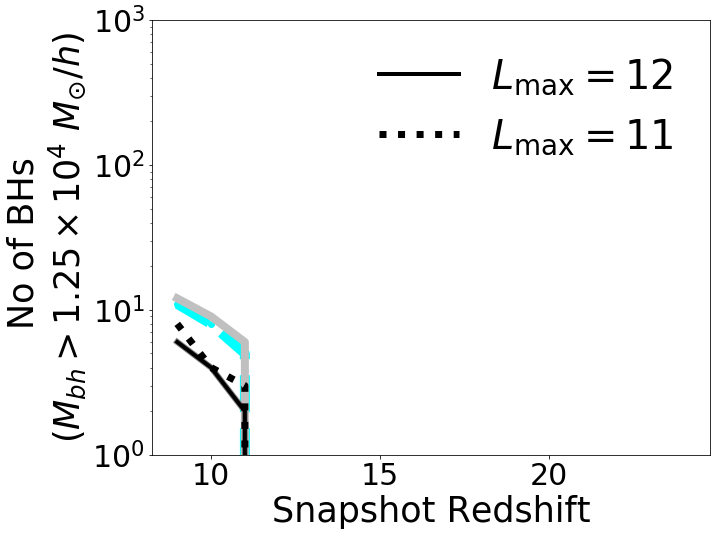

In [16]:
def make_plot(style='solid'):

    redshift_space=numpy.arange(9,25)

    BH_no_space=[]

    

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_gas,linewidth=10,linestyle='dashed',marker='o')


    BH_no_space=[]

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath2,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF,linewidth=8,linestyle=style)
    
    BH_no_space=[]
    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath3,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF2,linewidth=6,linestyle=style)
    
    BH_no_space=[]

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath44,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=4,linestyle=style,label='$L_{\mathrm{max}}=12$')
    
    BH_no_space=[]  

    for redshift in redshift_space:
        try:
            BH_Mass,o=arepo_package.get_particle_property(basePath44_11,'BH_Mass',5,redshift)
            BH_no_space.append(len(BH_Mass[BH_Mass>=mass_cut/1e10]))
        except:
            BH_no_space.append(0)
    BH_no_space=numpy.array(BH_no_space)

    ax.errorbar(redshift_space,BH_no_space,color=col_bFOF3,linewidth=7,linestyle='dotted',label='$L_{\mathrm{max}}=11$')
    

    ax.set_yscale('log')

    ax.tick_params(labelsize=30)
    ax.set_xlabel('Snapshot Redshift',fontsize=label_fontsize-5)
    ax.set_ylabel('No of BHs \n' + r'($M_{bh}>1.25 \times 10^4 \ M_{\odot}/h$)',fontsize=label_fontsize-5)
    


    
mass_cut=1.25e4
f,ax=plt.subplots(1,1,figsize=(10,8))
make_plot()
ax.set_ylim(1,1000)

ax.legend(loc='upper right',fontsize=label_fontsize,frameon=False)


plt.savefig('./Paper5_figures/subhalo_based_models2_Msfmp1000_Mh3000.png',bbox_inches='tight')





16 9.00233985416247
Total number of mergers 234
16 9.00233985416247
Total number of mergers 7
16 9.00233985416247
Total number of mergers 0
16 9.00233985416247
Total number of mergers 0
16 9.00233985416247
Total number of mergers 1


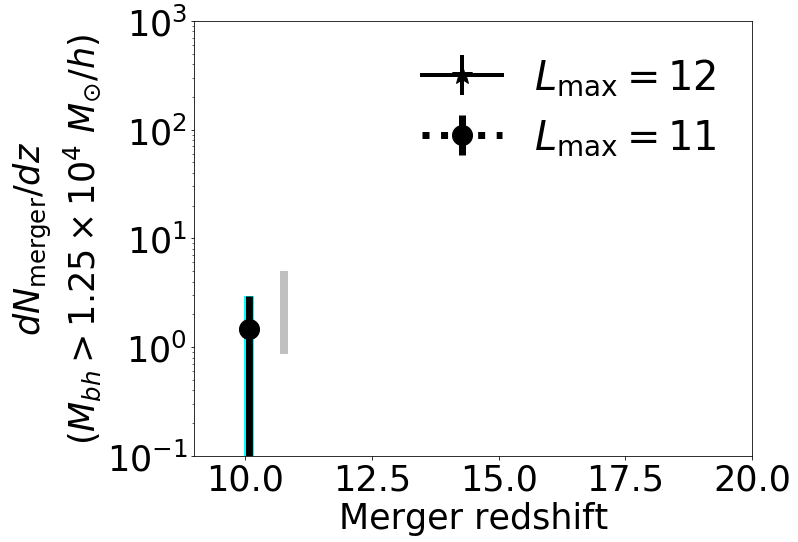

In [24]:
text_fontsize=25

title_fontsize=30

redshift_cut=10



mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=0
ZOOM=1

nbins=20
min_value=7
max_value=20

upto_redshift=9
f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

ratio=Mh

i=0
HDF5=1
levelmax=12
logseedmass=3.19  


offset=0
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    mass_cut=1.1e4
    
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linestyle='dashed',linewidth=10,color=col_gas)
    #offset+=0
   
    

for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath2,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=8,color=col_bFOF)
    #offset+=0.05

for ii,eff in zip([0],[5]):
    i+=1 
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath3,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],linewidth=6,color=col_bFOF2)
    #offset+=0.05
  

    
    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath44,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],label='$L_{\mathrm{max}}=12$',linewidth=4,color=col_bFOF3,marker='*',ms=20)
    #offset+=0.05

    
for ii,eff in zip([0],[5]):
    i+=1
    ax=axx
    #ax.set_title(r'$M_{bh} > 1.25 \times 10^{4} M_{\odot}/h$',fontsize=title_fontsize)  
    bins, dist, dist_err,norm,dz_dt = get_merger_distributions(basePath44_11,nbins,min_value,max_value,mass_cut,linear=1,HDF5=0,path_to_hdf5='./')
    mask=dist>0
    ax.errorbar(bins[mask]+offset,dist[mask],dist_err[mask],label='$L_{\mathrm{max}}=11$',linewidth=7,color=col_bFOF3,linestyle='dotted',marker='o',ms=20)
    #offset+=0.05
    
    
    
    ax.set_yscale('log')
    ax.set_ylim(0.1,1000)    
    ax.set_xlim(9,20)





axx.set_ylabel('$dN_{\mathrm{merger}}/dz$\n'+r'($M_{bh} > 1.25 \times 10^{4} \ M_{\odot}/h)$',fontsize=label_fontsize-5)

axx.set_xlabel('Merger redshift',fontsize=label_fontsize-5)
#set_default_fontsizes(axx[2],'Merger redshift',' ')
#set_default_fontsizes(axx[3],'Merger redshift',' ')

#axx[0].set_ylim(0.1,100)
#axx[1].set_ylim(0.1,100)

axx.tick_params(labelsize=label_fontsize-5)


axx.legend(loc='upper right',fontsize=label_fontsize,frameon=False)

#set_legend(axx[0],'upper right')


#axx[0].text(12,600,r'$M_{\mathrm{seed}} = 1.25 \times 10^{4} M_{\odot}/h$',fontsize=text_fontsize+2)


#axx[1].text(12,600,r'$M_{\mathrm{seed}} = 1 \times 10^{5} M_{\odot}/h$',fontsize=text_fontsize+2)

plt.subplots_adjust(wspace=0,hspace=0)


plt.savefig('./Paper5_figures/subhalo_based_models3_Msfmp1000_Mh3000.png',bbox_inches='tight')


#plt.savefig('./Paper2_figures/All_Merger_rates_LW_dependence.png',bbox_inches='tight')





In [5]:
levelmax_gas=12
logseedmass_gas=3.19


In [57]:
LogTargetGroupBHMass=4.10
Msfmp=50
Mh=3000

desired_redshift=9
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output

GroupMassType,o=arepo_package.get_subhalo_property(basePath,'SubhaloMassType',desired_redshift)
GroupMass5=GroupMassType[:,5]
group_indices=numpy.arange(0,len(GroupMass5))
mask=GroupMass5>1e6/1e10

selected_group_indices=group_indices[mask]
tree=h5py.File(basePath+'/postprocessing/tree_extended.hdf5','r')
SubfindID=tree.get('SubfindID')[:]
SubhaloID=tree.get('SubhaloID')[:]
FirstProgenitorID=tree.get('FirstProgenitorID')[:]
NextProgenitorID=tree.get('NextProgenitorID')[:]
TreeID=tree.get('TreeID')[:]
SnapNum=tree.get('SnapNum')[:]

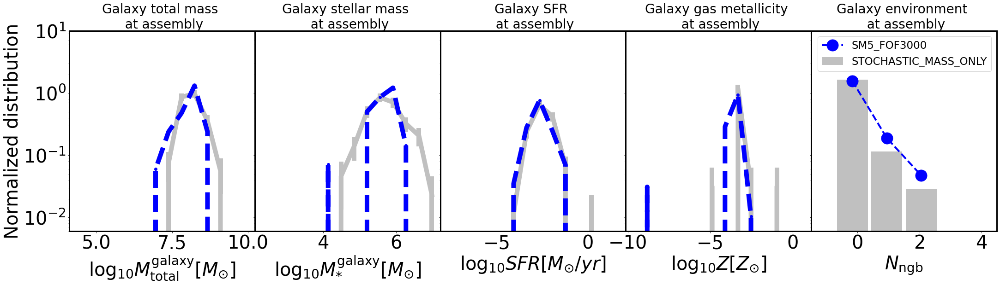

In [24]:
col_gas='blue'
col_bFOF='silver'

levelmax=12
logseedmass=3.19

Msfmp=5
Mh=3000

Nbins,minimum,maximum=30,4,10
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output

LogTargetGroupBHMass=5.00
data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_min_redshift_space=data[0]
unique_LogGroupStellarMass_min_redshift_space=data[1]
unique_LogGroupSFR_min_redshift_space=data[2]
unique_LogGroupSF_min_redshift_space=data[3]
unique_LogGroupSFMP_min_redshift_space=data[4]
unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
unique_LogGroupGasMetallicity_min_redshift_space=data[6]
unique_min_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_max_redshift_space=data[0]
unique_LogGroupStellarMass_max_redshift_space=data[1]
unique_LogGroupSFR_max_redshift_space=data[2]
unique_LogGroupSF_max_redshift_space=data[3]
unique_LogGroupSFMP_max_redshift_space=data[4]
unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
unique_LogGroupGasMetallicity_max_redshift_space=data[6]
unique_max_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_target_redshift_space=data[0]
unique_LogGroupStellarMass_target_redshift_space=data[1]
unique_LogGroupSFR_target_redshift_space=data[2]
unique_LogGroupSF_target_redshift_space=data[3]
unique_LogGroupSFMP_target_redshift_space=data[4]
unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
unique_LogGroupGasMetallicity_target_redshift_space=data[6]
unique_target_redshift_space=data[7]


unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)



levelmax=11
logseedmass=4.10


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_seed5.00/'%(Msfmp,Mh)
basePath2=path_to_output+run+output

path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.35_2.09_new_no_ex_new9_bFOF3_env_seed5.00/'
basePath44=path_to_output+run+output



f,axx=plt.subplots(1,5,figsize=(36,8),sharey=True)

Nbins,minimum,maximum=15,4,10
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,c=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

a,b,c=get_distribution(unique_LogGroupMass_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[0].errorbar(a-log10(h), b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

axx[0].tick_params(labelsize=40)
#axx[1].tick_params(labelsize=40)

axx[0].set_ylim(8e-3,2)
axx[0].set_yscale('log')

axx[0].set_xlabel(r'$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)

axx[0].set_ylabel('Normalized distribution',fontsize=label_fontsize)


Nbins,minimum,maximum=15,2,7
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,c=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(StellarMass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[1].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')


a,b,c=get_distribution(unique_LogGroupStellarMass_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[1].errorbar(a-log10(h), b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')
axx[1].set_xlabel(r'$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{*}}[M_{\odot}]$',fontsize=label_fontsize)

axx[1].tick_params(labelsize=40)

Nbins,minimum,maximum=15,-8,2
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,c=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(SFR_complete),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[2].errorbar(a,b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

a,b,c=get_distribution(unique_LogGroupSFR_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[2].errorbar(a, b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

axx[2].set_xlabel(r'$\log_{10} SFR[M_{\odot}/yr]$',fontsize=label_fontsize)
axx[2].tick_params(labelsize=40)


Nbins,minimum,maximum=15,-10,1
a,b,c=get_distribution(unique_LogGroupStellarMetallicity_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[3].errorbar(a,b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')



scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,neighbor,c=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(StellarMetallicity_complete),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[3].errorbar(a, b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

axx[3].set_xlabel(r'$\log_{10} Z[Z_{\odot}]$',fontsize=label_fontsize)
axx[3].tick_params(labelsize=40)



Nbins,minimum,maximum=10,-1,4

a,b,c=get_distribution(unique_GroupNeighbors_max_redshift_space,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
#b/=norm
axx[4].errorbar(a[maskb], b[maskb]/norm, label='SM%d_FOF%d'%(Msfmp,Mh),linewidth=4,marker='o',ms=25,color=col_gas,zorder=10,linestyle='dashed')





scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,c=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[4].bar(a,b/norm,width=1,color=col_bFOF,label='STOCHASTIC_MASS_ONLY')#ax.set_yscale('log')


axx[4].set_xlabel(r'$N_{\mathrm{ngb}}$',fontsize=label_fontsize)
axx[4].tick_params(labelsize=40)

axx[0].set_title('Galaxy total mass \n at assembly',fontsize=title_fontsize-2)
axx[1].set_title('Galaxy stellar mass \n at assembly',fontsize=title_fontsize-2)
axx[2].set_title('Galaxy SFR \n at assembly',fontsize=title_fontsize-2)
axx[3].set_title('Galaxy gas metallicity \n at assembly',fontsize=title_fontsize-2)
axx[4].set_title('Galaxy environment \n at assembly',fontsize=title_fontsize-2)

plt.subplots_adjust(wspace=0)

axx[0].set_ylim(6e-3,1e1)

axx[4].legend(loc='upper right',fontsize=label_fontsize-17)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)  # Right axis

#axx[1].set_ylabel('Absolute Number',fontsize=30)

plt.savefig('./Paper5_figures/subhalo_mass_only_model_Msfmp5_seed5.00.png',bbox_inches='tight')







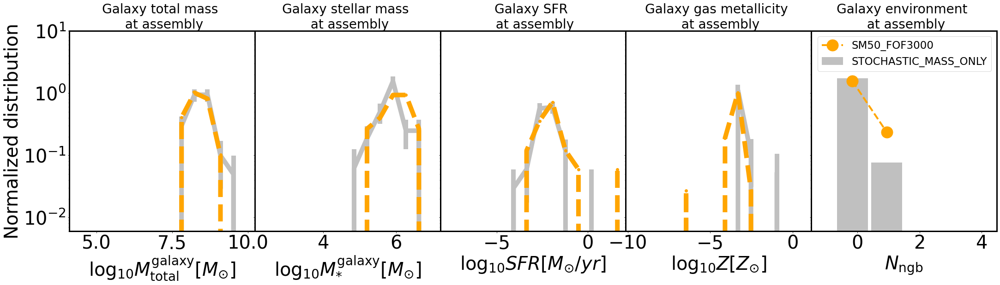

In [25]:
col_gas='orange'
col_bFOF='silver'

levelmax=12
logseedmass=3.19

Msfmp=50
Mh=3000

Nbins,minimum,maximum=30,4,10
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output

LogTargetGroupBHMass=5.00
data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_min_redshift_space=data[0]
unique_LogGroupStellarMass_min_redshift_space=data[1]
unique_LogGroupSFR_min_redshift_space=data[2]
unique_LogGroupSF_min_redshift_space=data[3]
unique_LogGroupSFMP_min_redshift_space=data[4]
unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
unique_LogGroupGasMetallicity_min_redshift_space=data[6]
unique_min_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_max_redshift_space=data[0]
unique_LogGroupStellarMass_max_redshift_space=data[1]
unique_LogGroupSFR_max_redshift_space=data[2]
unique_LogGroupSF_max_redshift_space=data[3]
unique_LogGroupSFMP_max_redshift_space=data[4]
unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
unique_LogGroupGasMetallicity_max_redshift_space=data[6]
unique_max_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_target_redshift_space=data[0]
unique_LogGroupStellarMass_target_redshift_space=data[1]
unique_LogGroupSFR_target_redshift_space=data[2]
unique_LogGroupSF_target_redshift_space=data[3]
unique_LogGroupSFMP_target_redshift_space=data[4]
unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
unique_LogGroupGasMetallicity_target_redshift_space=data[6]
unique_target_redshift_space=data[7]


unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)



levelmax=11
logseedmass=4.10


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw_seed5.00/'%(Msfmp,Mh)
basePath2=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.32_1.83_new_no_ex_new9_bFOF3_env_seed5.00/'
basePath44=path_to_output+run+output



f,axx=plt.subplots(1,5,figsize=(36,8),sharey=True)

Nbins,minimum,maximum=15,4,10
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,c=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

a,b,c=get_distribution(unique_LogGroupMass_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[0].errorbar(a-log10(h), b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

axx[0].tick_params(labelsize=40)
#axx[1].tick_params(labelsize=40)

axx[0].set_ylim(8e-3,2)
axx[0].set_yscale('log')

axx[0].set_xlabel(r'$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)

axx[0].set_ylabel('Normalized distribution',fontsize=label_fontsize)


Nbins,minimum,maximum=15,2,7
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,c=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(StellarMass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[1].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')


a,b,c=get_distribution(unique_LogGroupStellarMass_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[1].errorbar(a-log10(h), b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')
axx[1].set_xlabel(r'$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{*}}[M_{\odot}]$',fontsize=label_fontsize)

axx[1].tick_params(labelsize=40)

Nbins,minimum,maximum=15,-8,2
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,c=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(SFR_complete),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[2].errorbar(a,b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

a,b,c=get_distribution(unique_LogGroupSFR_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[2].errorbar(a, b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

axx[2].set_xlabel(r'$\log_{10} SFR[M_{\odot}/yr]$',fontsize=label_fontsize)
axx[2].tick_params(labelsize=40)


Nbins,minimum,maximum=15,-10,1
a,b,c=get_distribution(unique_LogGroupStellarMetallicity_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[3].errorbar(a,b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')



scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,neighbor,c=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(StellarMetallicity_complete),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[3].errorbar(a, b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

axx[3].set_xlabel(r'$\log_{10} Z[Z_{\odot}]$',fontsize=label_fontsize)
axx[3].tick_params(labelsize=40)



Nbins,minimum,maximum=10,-1,4

a,b,c=get_distribution(unique_GroupNeighbors_max_redshift_space,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
#b/=norm
axx[4].errorbar(a[maskb], b[maskb]/norm, label='SM%d_FOF%d'%(Msfmp,Mh),linewidth=4,marker='o',ms=25,color=col_gas,zorder=10,linestyle='dashed')





scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete,c=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)



axx[4].bar(a,b/norm,width=1,color=col_bFOF,label='STOCHASTIC_MASS_ONLY')#ax.set_yscale('log')


axx[4].set_xlabel(r'$N_{\mathrm{ngb}}$',fontsize=label_fontsize)
axx[4].tick_params(labelsize=40)

axx[0].set_title('Galaxy total mass \n at assembly',fontsize=title_fontsize-2)
axx[1].set_title('Galaxy stellar mass \n at assembly',fontsize=title_fontsize-2)
axx[2].set_title('Galaxy SFR \n at assembly',fontsize=title_fontsize-2)
axx[3].set_title('Galaxy gas metallicity \n at assembly',fontsize=title_fontsize-2)
axx[4].set_title('Galaxy environment \n at assembly',fontsize=title_fontsize-2)

plt.subplots_adjust(wspace=0)

axx[0].set_ylim(6e-3,1e1)

axx[4].legend(loc='upper right',fontsize=label_fontsize-17)


for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)  # Right axis

#axx[1].set_ylabel('Absolute Number',fontsize=30)

plt.savefig('./Paper5_figures/subhalo_mass_only_model_Msfmp50_seed5.00.png',bbox_inches='tight')







blackhole_seeding2_79.txt
blackhole_seeding2_17.txt
blackhole_seeding2_176.txt
blackhole_seeding2_480.txt
blackhole_seeding2_56.txt
blackhole_seeding2_281.txt
blackhole_seeding2_282.txt
blackhole_seeding2_99.txt
blackhole_seeding2_407.txt
blackhole_seeding2_55.txt
blackhole_seeding2_138.txt
blackhole_seeding2_330.txt
blackhole_seeding2_59.txt
blackhole_seeding2_429.txt
blackhole_seeding2_409.txt
blackhole_seeding2_467.txt
blackhole_seeding2_475.txt
blackhole_seeding2_120.txt
blackhole_seeding2_405.txt
blackhole_seeding2_356.txt
blackhole_seeding2_39.txt
blackhole_seeding2_269.txt
blackhole_seeding2_483.txt
blackhole_seeding2_205.txt
blackhole_seeding2_441.txt
blackhole_seeding2_388.txt
blackhole_seeding2_327.txt
blackhole_seeding2_98.txt
blackhole_seeding2_163.txt
blackhole_seeding2_220.txt
blackhole_seeding2_288.txt
blackhole_seeding2_193.txt
blackhole_seeding2_254.txt
blackhole_seeding2_233.txt
blackhole_seeding2_477.txt
blackhole_seeding2_456.txt
blackhole_seeding2_428.txt
blackhole

blackhole_seeding2_191.txt
blackhole_seeding2_328.txt
blackhole_seeding2_490.txt
blackhole_seeding2_314.txt
blackhole_seeding2_336.txt
blackhole_seeding2_160.txt
blackhole_seeding2_73.txt
blackhole_seeding2_51.txt
blackhole_seeding2_66.txt
blackhole_seeding2_430.txt
blackhole_seeding2_340.txt
blackhole_seeding2_110.txt
blackhole_seeding2_101.txt
blackhole_seeding2_312.txt
blackhole_seeding2_129.txt
blackhole_seeding2_29.txt
blackhole_seeding2_18.txt
blackhole_seeding2_86.txt
blackhole_seeding2_177.txt
blackhole_seeding2_365.txt
blackhole_seeding2_198.txt
blackhole_seeding2_114.txt
blackhole_seeding2_143.txt
blackhole_seeding2_390.txt
blackhole_seeding2_304.txt
blackhole_seeding2_151.txt
blackhole_seeding2_440.txt
blackhole_seeding2_124.txt
blackhole_seeding2_139.txt
blackhole_seeding2_188.txt
blackhole_seeding2_259.txt
blackhole_seeding2_258.txt
blackhole_seeding2_69.txt
blackhole_seeding2_161.txt
blackhole_seeding2_40.txt
blackhole_seeding2_207.txt
blackhole_seeding2_493.txt
blackhole

blackhole_seeding2_273.txt
blackhole_seeding2_155.txt
blackhole_seeding2_112.txt
blackhole_seeding2_326.txt
blackhole_seeding2_502.txt
blackhole_seeding2_104.txt
blackhole_seeding2_377.txt
blackhole_seeding2_447.txt
blackhole_seeding2_0.txt
blackhole_seeding2_491.txt
blackhole_seeding2_470.txt
blackhole_seeding2_76.txt
blackhole_seeding2_358.txt
blackhole_seeding2_392.txt
blackhole_seeding2_468.txt
blackhole_seeding2_334.txt
blackhole_seeding2_247.txt
blackhole_seeding2_89.txt
blackhole_seeding2_97.txt
blackhole_seeding2_232.txt
blackhole_seeding2_25.txt
blackhole_seeding2_137.txt
blackhole_seeding2_439.txt
blackhole_seeding2_87.txt
blackhole_seeding2_261.txt
blackhole_seeding2_105.txt
blackhole_seeding2_80.txt
blackhole_seeding2_201.txt
blackhole_seeding2_352.txt
blackhole_seeding2_65.txt
blackhole_seeding2_128.txt
blackhole_seeding2_309.txt
blackhole_seeding2_43.txt
blackhole_seeding2_498.txt
blackhole_seeding2_316.txt
blackhole_seeding2_217.txt
blackhole_seeding2_165.txt
blackhole_s

blackhole_seeding2_145.txt
blackhole_seeding2_397.txt
blackhole_seeding2_12.txt
blackhole_seeding2_41.txt
blackhole_seeding2_1.txt
blackhole_seeding2_335.txt
blackhole_seeding2_156.txt
blackhole_seeding2_75.txt
blackhole_seeding2_243.txt
blackhole_seeding2_37.txt
blackhole_seeding2_383.txt
blackhole_seeding2_162.txt
blackhole_seeding2_478.txt
blackhole_seeding2_504.txt
blackhole_seeding2_454.txt
blackhole_seeding2_357.txt
blackhole_seeding2_453.txt
blackhole_seeding2_353.txt
blackhole_seeding2_458.txt
blackhole_seeding2_257.txt
blackhole_seeding2_179.txt
blackhole_seeding2_266.txt
blackhole_seeding2_263.txt
blackhole_seeding2_111.txt
blackhole_seeding2_72.txt
blackhole_seeding2_426.txt
blackhole_seeding2_487.txt
blackhole_seeding2_277.txt
blackhole_seeding2_62.txt
blackhole_seeding2_506.txt
blackhole_seeding2_372.txt
blackhole_seeding2_197.txt
blackhole_seeding2_379.txt
blackhole_seeding2_58.txt
blackhole_seeding2_240.txt
blackhole_seeding2_273.txt
blackhole_seeding2_155.txt
blackhole_

blackhole_seeding2_474.txt
blackhole_seeding2_96.txt
blackhole_seeding2_294.txt
blackhole_seeding2_229.txt
blackhole_seeding2_299.txt
blackhole_seeding2_235.txt
blackhole_seeding2_93.txt
blackhole_seeding2_274.txt
blackhole_seeding2_38.txt
blackhole_seeding2_255.txt
blackhole_seeding2_378.txt
blackhole_seeding2_395.txt
blackhole_seeding2_94.txt
blackhole_seeding2_68.txt
blackhole_seeding2_237.txt
blackhole_seeding2_449.txt
blackhole_seeding2_228.txt
blackhole_seeding2_60.txt
blackhole_seeding2_178.txt
blackhole_seeding2_412.txt
blackhole_seeding2_264.txt
blackhole_seeding2_239.txt
blackhole_seeding2_153.txt
blackhole_seeding2_450.txt
blackhole_seeding2_108.txt
blackhole_seeding2_370.txt
blackhole_seeding2_333.txt
blackhole_seeding2_310.txt
blackhole_seeding2_226.txt
blackhole_seeding2_67.txt
blackhole_seeding2_216.txt
blackhole_seeding2_295.txt
blackhole_seeding2_44.txt
blackhole_seeding2_361.txt
blackhole_seeding2_302.txt
blackhole_seeding2_306.txt
blackhole_seeding2_141.txt
blackhole

blackhole_seeding2_324.txt
blackhole_seeding2_213.txt
blackhole_seeding2_34.txt
blackhole_seeding2_175.txt
blackhole_seeding2_460.txt
blackhole_seeding2_45.txt
blackhole_seeding2_381.txt
blackhole_seeding2_348.txt
blackhole_seeding2_404.txt
blackhole_seeding2_49.txt
blackhole_seeding2_435.txt
blackhole_seeding2_300.txt
blackhole_seeding2_413.txt
blackhole_seeding2_158.txt
blackhole_seeding2_471.txt
blackhole_seeding2_262.txt
blackhole_seeding2_149.txt
blackhole_seeding2_222.txt
blackhole_seeding2_448.txt
blackhole_seeding2_337.txt
blackhole_seeding2_33.txt
blackhole_seeding2_466.txt
blackhole_seeding2_287.txt
blackhole_seeding2_408.txt
blackhole_seeding2_219.txt
blackhole_seeding2_212.txt
blackhole_seeding2_410.txt
blackhole_seeding2_474.txt
blackhole_seeding2_96.txt
blackhole_seeding2_294.txt
blackhole_seeding2_229.txt
blackhole_seeding2_299.txt
blackhole_seeding2_235.txt
blackhole_seeding2_93.txt
blackhole_seeding2_274.txt
blackhole_seeding2_38.txt
blackhole_seeding2_255.txt
blackhol

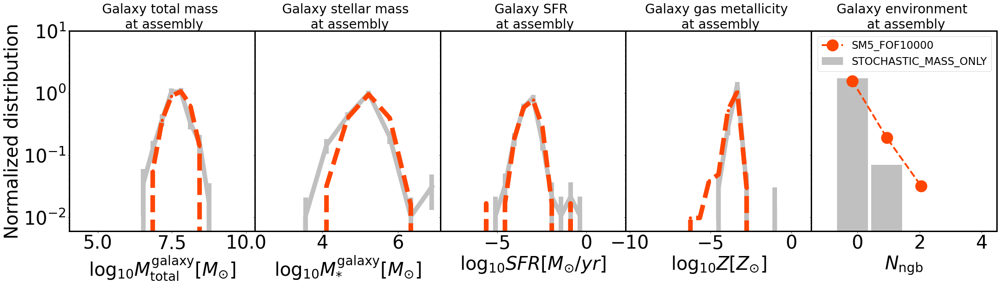

In [27]:
col_gas='orangered'
col_bFOF='silver'

levelmax=12
logseedmass=3.19

Msfmp=5
Mh=10000

Nbins,minimum,maximum=30,4,10
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output

LogTargetGroupBHMass=4.10
data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_min_redshift_space=data[0]
unique_LogGroupStellarMass_min_redshift_space=data[1]
unique_LogGroupSFR_min_redshift_space=data[2]
unique_LogGroupSF_min_redshift_space=data[3]
unique_LogGroupSFMP_min_redshift_space=data[4]
unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
unique_LogGroupGasMetallicity_min_redshift_space=data[6]
unique_min_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_max_redshift_space=data[0]
unique_LogGroupStellarMass_max_redshift_space=data[1]
unique_LogGroupSFR_max_redshift_space=data[2]
unique_LogGroupSF_max_redshift_space=data[3]
unique_LogGroupSFMP_max_redshift_space=data[4]
unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
unique_LogGroupGasMetallicity_max_redshift_space=data[6]
unique_max_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_target_redshift_space=data[0]
unique_LogGroupStellarMass_target_redshift_space=data[1]
unique_LogGroupSFR_target_redshift_space=data[2]
unique_LogGroupSF_target_redshift_space=data[3]
unique_LogGroupSFMP_target_redshift_space=data[4]
unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
unique_LogGroupGasMetallicity_target_redshift_space=data[6]
unique_target_redshift_space=data[7]


unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)


levelmax=12
logseedmass=3.19


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw/'%(Msfmp,Mh)
basePath2=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.48_2.88_new_no_ex_new9_bFOF3_env_powerlaw4/'
basePath44=path_to_output+run+output



f,axx=plt.subplots(1,5,figsize=(36,8),sharey=True)

Nbins,minimum,maximum=20,4,10
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(FOFDMmass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

a,b,c=get_distribution(unique_LogGroupMass_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[0].errorbar(a-log10(h), b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

axx[0].tick_params(labelsize=40)
#axx[1].tick_params(labelsize=40)

axx[0].set_ylim(8e-3,2)
axx[0].set_yscale('log')

axx[0].set_xlabel(r'$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)

axx[0].set_ylabel('Normalized distribution',fontsize=label_fontsize)


Nbins,minimum,maximum=10,2,7
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(StellarMass_complete*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[1].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')


a,b,c=get_distribution(unique_LogGroupStellarMass_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[1].errorbar(a-log10(h), b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')
axx[1].set_xlabel(r'$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{*}}[M_{\odot}]$',fontsize=label_fontsize)

axx[1].tick_params(labelsize=40)

Nbins,minimum,maximum=20,-8,2
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(SFR_complete),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[2].errorbar(a,b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

a,b,c=get_distribution(unique_LogGroupSFR_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[2].errorbar(a, b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

axx[2].set_xlabel(r'$\log_{10} SFR[M_{\odot}/yr]$',fontsize=label_fontsize)
axx[2].tick_params(labelsize=40)


Nbins,minimum,maximum=20,-10,1
a,b,c=get_distribution(unique_LogGroupStellarMetallicity_target_redshift_space,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[3].errorbar(a,b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')



scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,neighbor=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(StellarMetallicity_complete),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[3].errorbar(a, b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

axx[3].set_xlabel(r'$\log_{10} Z[Z_{\odot}]$',fontsize=label_fontsize)
axx[3].tick_params(labelsize=40)



Nbins,minimum,maximum=10,-1,4

a,b,c=get_distribution(unique_GroupNeighbors_max_redshift_space,Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
#b/=norm
axx[4].errorbar(a[maskb], b[maskb]/norm, label='SM%d_FOF%d'%(Msfmp,Mh),linewidth=4,marker='o',ms=25,color=col_gas,zorder=10,linestyle='dashed')





scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete,Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[4].bar(a,b/norm,width=1,color=col_bFOF,label='STOCHASTIC_MASS_ONLY')#ax.set_yscale('log')


axx[4].set_xlabel(r'$N_{\mathrm{ngb}}$',fontsize=label_fontsize)
axx[4].tick_params(labelsize=40)

axx[0].set_title('Galaxy total mass \n at assembly',fontsize=title_fontsize-2)
axx[1].set_title('Galaxy stellar mass \n at assembly',fontsize=title_fontsize-2)
axx[2].set_title('Galaxy SFR \n at assembly',fontsize=title_fontsize-2)
axx[3].set_title('Galaxy gas metallicity \n at assembly',fontsize=title_fontsize-2)
axx[4].set_title('Galaxy environment \n at assembly',fontsize=title_fontsize-2)

plt.subplots_adjust(wspace=0)

axx[0].set_ylim(6e-3,1e1)

axx[4].legend(loc='upper right',fontsize=label_fontsize-17)
for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)  # Right axis
#axx[1].set_ylabel('Absolute Number',fontsize=30)

plt.savefig('./Paper5_figures/subhalo_mass_only_model_Mh10000.png',bbox_inches='tight')







blackhole_seeding2_79.txt
blackhole_seeding2_56.txt
blackhole_seeding2_281.txt
blackhole_seeding2_282.txt
blackhole_seeding2_99.txt
blackhole_seeding2_407.txt
blackhole_seeding2_138.txt
blackhole_seeding2_374.txt
blackhole_seeding2_429.txt
blackhole_seeding2_409.txt
blackhole_seeding2_467.txt
blackhole_seeding2_368.txt
blackhole_seeding2_475.txt
blackhole_seeding2_120.txt
blackhole_seeding2_125.txt
blackhole_seeding2_405.txt
blackhole_seeding2_356.txt
blackhole_seeding2_39.txt
blackhole_seeding2_269.txt
blackhole_seeding2_483.txt
blackhole_seeding2_205.txt
blackhole_seeding2_495.txt
blackhole_seeding2_363.txt
blackhole_seeding2_441.txt
blackhole_seeding2_388.txt
blackhole_seeding2_98.txt
blackhole_seeding2_253.txt
blackhole_seeding2_163.txt
blackhole_seeding2_288.txt
blackhole_seeding2_254.txt
blackhole_seeding2_233.txt
blackhole_seeding2_456.txt
blackhole_seeding2_428.txt
blackhole_seeding2_346.txt
blackhole_seeding2_398.txt
blackhole_seeding2_362.txt
blackhole_seeding2_425.txt
blackh

blackhole_seeding2_496.txt
blackhole_seeding2_494.txt
blackhole_seeding2_170.txt
blackhole_seeding2_185.txt
blackhole_seeding2_48.txt
blackhole_seeding2_251.txt
blackhole_seeding2_95.txt
blackhole_seeding2_30.txt
blackhole_seeding2_444.txt
blackhole_seeding2_420.txt
blackhole_seeding2_83.txt
blackhole_seeding2_371.txt
blackhole_seeding2_53.txt
blackhole_seeding2_446.txt
blackhole_seeding2_272.txt
blackhole_seeding2_394.txt
blackhole_seeding2_406.txt
blackhole_seeding2_159.txt
blackhole_seeding2_79.txt
blackhole_seeding2_56.txt
blackhole_seeding2_281.txt
blackhole_seeding2_282.txt
blackhole_seeding2_99.txt
blackhole_seeding2_407.txt
blackhole_seeding2_138.txt
blackhole_seeding2_374.txt
blackhole_seeding2_429.txt
blackhole_seeding2_409.txt
blackhole_seeding2_467.txt
blackhole_seeding2_368.txt
blackhole_seeding2_475.txt
blackhole_seeding2_120.txt
blackhole_seeding2_125.txt
blackhole_seeding2_405.txt
blackhole_seeding2_356.txt
blackhole_seeding2_39.txt
blackhole_seeding2_269.txt
blackhole_

blackhole_seeding2_135.txt
blackhole_seeding2_61.txt
blackhole_seeding2_497.txt
blackhole_seeding2_131.txt
blackhole_seeding2_148.txt
blackhole_seeding2_290.txt
blackhole_seeding2_6.txt
blackhole_seeding2_221.txt
blackhole_seeding2_339.txt
blackhole_seeding2_172.txt
blackhole_seeding2_78.txt
blackhole_seeding2_249.txt
blackhole_seeding2_109.txt
blackhole_seeding2_509.txt
blackhole_seeding2_24.txt
blackhole_seeding2_215.txt
blackhole_seeding2_119.txt
blackhole_seeding2_380.txt
blackhole_seeding2_416.txt
blackhole_seeding2_14.txt
blackhole_seeding2_396.txt
blackhole_seeding2_387.txt
blackhole_seeding2_218.txt
blackhole_seeding2_147.txt
blackhole_seeding2_190.txt
blackhole_seeding2_479.txt
blackhole_seeding2_242.txt
blackhole_seeding2_85.txt
blackhole_seeding2_182.txt
blackhole_seeding2_401.txt
blackhole_seeding2_463.txt
blackhole_seeding2_3.txt
blackhole_seeding2_359.txt
blackhole_seeding2_400.txt
blackhole_seeding2_166.txt
blackhole_seeding2_57.txt
blackhole_seeding2_355.txt
blackhole_s

blackhole_seeding2_496.txt
blackhole_seeding2_494.txt
blackhole_seeding2_170.txt
blackhole_seeding2_185.txt
blackhole_seeding2_48.txt
blackhole_seeding2_251.txt
blackhole_seeding2_95.txt
blackhole_seeding2_30.txt
blackhole_seeding2_444.txt
blackhole_seeding2_420.txt
blackhole_seeding2_83.txt
blackhole_seeding2_371.txt
blackhole_seeding2_53.txt
blackhole_seeding2_446.txt
blackhole_seeding2_272.txt
blackhole_seeding2_394.txt
blackhole_seeding2_406.txt
blackhole_seeding2_159.txt
blackhole_seeding2_79.txt
blackhole_seeding2_56.txt
blackhole_seeding2_281.txt
blackhole_seeding2_282.txt
blackhole_seeding2_99.txt
blackhole_seeding2_407.txt
blackhole_seeding2_138.txt
blackhole_seeding2_374.txt
blackhole_seeding2_429.txt
blackhole_seeding2_409.txt
blackhole_seeding2_467.txt
blackhole_seeding2_368.txt
blackhole_seeding2_475.txt
blackhole_seeding2_120.txt
blackhole_seeding2_125.txt
blackhole_seeding2_405.txt
blackhole_seeding2_356.txt
blackhole_seeding2_39.txt
blackhole_seeding2_269.txt
blackhole_

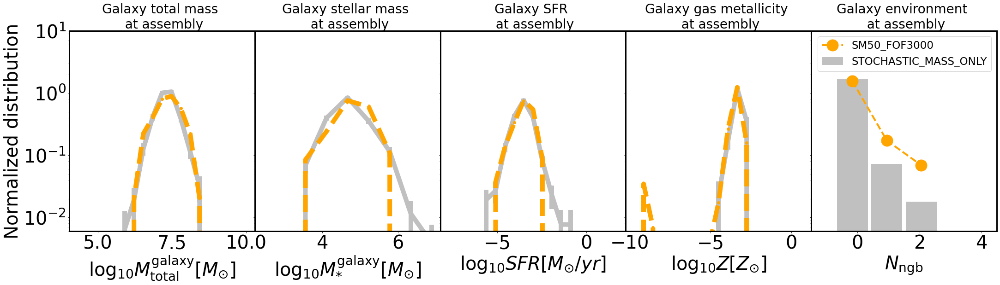

In [28]:
col_gas='orange'
col_bFOF='silver'

levelmax=12
logseedmass=3.19

Msfmp=50
Mh=3000

Nbins,minimum,maximum=30,4,10
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output

LogTargetGroupBHMass=4.10
data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_min_redshift_space=data[0]
unique_LogGroupStellarMass_min_redshift_space=data[1]
unique_LogGroupSFR_min_redshift_space=data[2]
unique_LogGroupSF_min_redshift_space=data[3]
unique_LogGroupSFMP_min_redshift_space=data[4]
unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
unique_LogGroupGasMetallicity_min_redshift_space=data[6]
unique_min_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_max_redshift_space=data[0]
unique_LogGroupStellarMass_max_redshift_space=data[1]
unique_LogGroupSFR_max_redshift_space=data[2]
unique_LogGroupSF_max_redshift_space=data[3]
unique_LogGroupSFMP_max_redshift_space=data[4]
unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
unique_LogGroupGasMetallicity_max_redshift_space=data[6]
unique_max_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_target_redshift_space=data[0]
unique_LogGroupStellarMass_target_redshift_space=data[1]
unique_LogGroupSFR_target_redshift_space=data[2]
unique_LogGroupSF_target_redshift_space=data[3]
unique_LogGroupSFMP_target_redshift_space=data[4]
unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
unique_LogGroupGasMetallicity_target_redshift_space=data[6]
unique_target_redshift_space=data[7]


unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)



levelmax=12
logseedmass=3.19


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw/'%(Msfmp,Mh)
basePath2=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.48_2.88_new_no_ex_new9_bFOF3_env_powerlaw4/'
basePath44=path_to_output+run+output

redshift_cut=9

f,axx=plt.subplots(1,5,figsize=(36,8),sharey=True)

Nbins,minimum,maximum=20,4,10
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
redshifts_complete=1./scale_fac_complete-1
mask4=redshifts_complete>redshift_cut
mask3=unique_target_redshift_space > redshift_cut

a,b,c=get_distribution(numpy.log10(FOFDMmass_complete[mask4]*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

a,b,c=get_distribution(unique_LogGroupMass_target_redshift_space[mask3],Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[0].errorbar(a-log10(h), b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

axx[0].tick_params(labelsize=40)
#axx[1].tick_params(labelsize=40)

axx[0].set_ylim(8e-3,2)
axx[0].set_yscale('log')

axx[0].set_xlabel(r'$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)

axx[0].set_ylabel('Normalized distribution',fontsize=label_fontsize)


Nbins,minimum,maximum=10,2,7
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(StellarMass_complete[mask4]*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[1].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')


a,b,c=get_distribution(unique_LogGroupStellarMass_target_redshift_space[mask3],Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[1].errorbar(a-log10(h), b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')
axx[1].set_xlabel(r'$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{*}}[M_{\odot}]$',fontsize=label_fontsize)

axx[1].tick_params(labelsize=40)

Nbins,minimum,maximum=20,-8,2
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(SFR_complete[mask4]),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[2].errorbar(a,b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

a,b,c=get_distribution(unique_LogGroupSFR_target_redshift_space[mask3],Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[2].errorbar(a, b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

axx[2].set_xlabel(r'$\log_{10} SFR[M_{\odot}/yr]$',fontsize=label_fontsize)
axx[2].tick_params(labelsize=40)


Nbins,minimum,maximum=20,-10,1
a,b,c=get_distribution(unique_LogGroupGasMetallicity_target_redshift_space[mask3],Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[3].errorbar(a,b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')



scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,neighbor=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(GasMetallicity_complete[mask4]),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[3].errorbar(a, b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

axx[3].set_xlabel(r'$\log_{10} Z[Z_{\odot}]$',fontsize=label_fontsize)
axx[3].tick_params(labelsize=40)



Nbins,minimum,maximum=10,-1,4

a,b,c=get_distribution(unique_GroupNeighbors_max_redshift_space[mask3],Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
#b/=norm
axx[4].errorbar(a[maskb], b[maskb]/norm, label='SM%d_FOF%d'%(Msfmp,Mh),linewidth=4,marker='o',ms=25,color=col_gas,zorder=10,linestyle='dashed')





scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete[mask4],Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)
axx[4].bar(a,b/norm,width=1,color=col_bFOF,label='STOCHASTIC_MASS_ONLY')#ax.set_yscale('log')


axx[4].set_xlabel(r'$N_{\mathrm{ngb}}$',fontsize=label_fontsize)
axx[4].tick_params(labelsize=40)

axx[0].set_title('Galaxy total mass \n at assembly',fontsize=title_fontsize-2)
axx[1].set_title('Galaxy stellar mass \n at assembly',fontsize=title_fontsize-2)
axx[2].set_title('Galaxy SFR \n at assembly',fontsize=title_fontsize-2)
axx[3].set_title('Galaxy gas metallicity \n at assembly',fontsize=title_fontsize-2)
axx[4].set_title('Galaxy environment \n at assembly',fontsize=title_fontsize-2)

plt.subplots_adjust(wspace=0)

axx[0].set_ylim(6e-3,1e1)

axx[4].legend(loc='upper right',fontsize=label_fontsize-17)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)

#axx[1].set_ylabel('Absolute Number',fontsize=30)

plt.savefig('./Paper5_figures/subhalo_mass_only_model_Msfmp50.png',bbox_inches='tight')







blackhole_seeding2_17.txt
blackhole_seeding2_176.txt
blackhole_seeding2_480.txt
blackhole_seeding2_56.txt
blackhole_seeding2_281.txt
blackhole_seeding2_99.txt
blackhole_seeding2_407.txt
blackhole_seeding2_55.txt
blackhole_seeding2_138.txt
blackhole_seeding2_330.txt
blackhole_seeding2_59.txt
blackhole_seeding2_374.txt
blackhole_seeding2_429.txt
blackhole_seeding2_409.txt
blackhole_seeding2_467.txt
blackhole_seeding2_368.txt
blackhole_seeding2_475.txt
blackhole_seeding2_120.txt
blackhole_seeding2_125.txt
blackhole_seeding2_405.txt
blackhole_seeding2_356.txt
blackhole_seeding2_269.txt
blackhole_seeding2_483.txt
blackhole_seeding2_205.txt
blackhole_seeding2_495.txt
blackhole_seeding2_363.txt
blackhole_seeding2_441.txt
blackhole_seeding2_388.txt
blackhole_seeding2_98.txt
blackhole_seeding2_253.txt
blackhole_seeding2_163.txt
blackhole_seeding2_220.txt
blackhole_seeding2_288.txt
blackhole_seeding2_193.txt
blackhole_seeding2_254.txt
blackhole_seeding2_233.txt
blackhole_seeding2_477.txt
blackho

blackhole_seeding2_181.txt
blackhole_seeding2_385.txt
blackhole_seeding2_317.txt
blackhole_seeding2_90.txt
blackhole_seeding2_192.txt
blackhole_seeding2_91.txt
blackhole_seeding2_191.txt
blackhole_seeding2_329.txt
blackhole_seeding2_490.txt
blackhole_seeding2_314.txt
blackhole_seeding2_422.txt
blackhole_seeding2_336.txt
blackhole_seeding2_73.txt
blackhole_seeding2_51.txt
blackhole_seeding2_22.txt
blackhole_seeding2_66.txt
blackhole_seeding2_430.txt
blackhole_seeding2_340.txt
blackhole_seeding2_101.txt
blackhole_seeding2_129.txt
blackhole_seeding2_29.txt
blackhole_seeding2_248.txt
blackhole_seeding2_18.txt
blackhole_seeding2_86.txt
blackhole_seeding2_177.txt
blackhole_seeding2_365.txt
blackhole_seeding2_198.txt
blackhole_seeding2_114.txt
blackhole_seeding2_88.txt
blackhole_seeding2_390.txt
blackhole_seeding2_304.txt
blackhole_seeding2_151.txt
blackhole_seeding2_440.txt
blackhole_seeding2_124.txt
blackhole_seeding2_139.txt
blackhole_seeding2_188.txt
blackhole_seeding2_259.txt
blackhole_s

blackhole_seeding2_165.txt
blackhole_seeding2_187.txt
blackhole_seeding2_484.txt
blackhole_seeding2_204.txt
blackhole_seeding2_399.txt
blackhole_seeding2_184.txt
blackhole_seeding2_64.txt
blackhole_seeding2_189.txt
blackhole_seeding2_267.txt
blackhole_seeding2_210.txt
blackhole_seeding2_194.txt
blackhole_seeding2_196.txt
blackhole_seeding2_244.txt
blackhole_seeding2_500.txt
blackhole_seeding2_389.txt
blackhole_seeding2_417.txt
blackhole_seeding2_130.txt
blackhole_seeding2_488.txt
blackhole_seeding2_464.txt
blackhole_seeding2_234.txt
blackhole_seeding2_223.txt
blackhole_seeding2_181.txt
blackhole_seeding2_385.txt
blackhole_seeding2_317.txt
blackhole_seeding2_90.txt
blackhole_seeding2_192.txt
blackhole_seeding2_91.txt
blackhole_seeding2_191.txt
blackhole_seeding2_329.txt
blackhole_seeding2_490.txt
blackhole_seeding2_314.txt
blackhole_seeding2_422.txt
blackhole_seeding2_336.txt
blackhole_seeding2_73.txt
blackhole_seeding2_51.txt
blackhole_seeding2_22.txt
blackhole_seeding2_66.txt
blackhol

blackhole_seeding2_12.txt
blackhole_seeding2_41.txt
blackhole_seeding2_1.txt
blackhole_seeding2_335.txt
blackhole_seeding2_75.txt
blackhole_seeding2_243.txt
blackhole_seeding2_37.txt
blackhole_seeding2_383.txt
blackhole_seeding2_162.txt
blackhole_seeding2_504.txt
blackhole_seeding2_357.txt
blackhole_seeding2_453.txt
blackhole_seeding2_353.txt
blackhole_seeding2_52.txt
blackhole_seeding2_257.txt
blackhole_seeding2_179.txt
blackhole_seeding2_266.txt
blackhole_seeding2_263.txt
blackhole_seeding2_26.txt
blackhole_seeding2_72.txt
blackhole_seeding2_426.txt
blackhole_seeding2_277.txt
blackhole_seeding2_62.txt
blackhole_seeding2_506.txt
blackhole_seeding2_372.txt
blackhole_seeding2_197.txt
blackhole_seeding2_379.txt
blackhole_seeding2_58.txt
blackhole_seeding2_240.txt
blackhole_seeding2_273.txt
blackhole_seeding2_155.txt
blackhole_seeding2_502.txt
blackhole_seeding2_104.txt
blackhole_seeding2_377.txt
blackhole_seeding2_447.txt
blackhole_seeding2_491.txt
blackhole_seeding2_470.txt
blackhole_se

blackhole_seeding2_413.txt
blackhole_seeding2_158.txt
blackhole_seeding2_471.txt
blackhole_seeding2_262.txt
blackhole_seeding2_103.txt
blackhole_seeding2_149.txt
blackhole_seeding2_222.txt
blackhole_seeding2_448.txt
blackhole_seeding2_337.txt
blackhole_seeding2_466.txt
blackhole_seeding2_287.txt
blackhole_seeding2_408.txt
blackhole_seeding2_219.txt
blackhole_seeding2_212.txt
blackhole_seeding2_393.txt
blackhole_seeding2_474.txt
blackhole_seeding2_96.txt
blackhole_seeding2_294.txt
blackhole_seeding2_229.txt
blackhole_seeding2_299.txt
blackhole_seeding2_93.txt
blackhole_seeding2_378.txt
blackhole_seeding2_395.txt
blackhole_seeding2_94.txt
blackhole_seeding2_68.txt
blackhole_seeding2_237.txt
blackhole_seeding2_449.txt
blackhole_seeding2_228.txt
blackhole_seeding2_60.txt
blackhole_seeding2_178.txt
blackhole_seeding2_412.txt
blackhole_seeding2_264.txt
blackhole_seeding2_239.txt
blackhole_seeding2_303.txt
blackhole_seeding2_108.txt
blackhole_seeding2_370.txt
blackhole_seeding2_333.txt
blackh

blackhole_seeding2_147.txt
blackhole_seeding2_190.txt
blackhole_seeding2_445.txt
blackhole_seeding2_479.txt
blackhole_seeding2_242.txt
blackhole_seeding2_85.txt
blackhole_seeding2_182.txt
blackhole_seeding2_401.txt
blackhole_seeding2_508.txt
blackhole_seeding2_373.txt
blackhole_seeding2_3.txt
blackhole_seeding2_180.txt
blackhole_seeding2_359.txt
blackhole_seeding2_400.txt
blackhole_seeding2_166.txt
blackhole_seeding2_307.txt
blackhole_seeding2_57.txt
blackhole_seeding2_164.txt
blackhole_seeding2_369.txt
blackhole_seeding2_355.txt
blackhole_seeding2_225.txt
blackhole_seeding2_121.txt
blackhole_seeding2_384.txt
blackhole_seeding2_167.txt
blackhole_seeding2_341.txt
blackhole_seeding2_106.txt
blackhole_seeding2_286.txt
blackhole_seeding2_126.txt
blackhole_seeding2_241.txt
blackhole_seeding2_503.txt
blackhole_seeding2_427.txt
blackhole_seeding2_11.txt
blackhole_seeding2_146.txt
blackhole_seeding2_270.txt
blackhole_seeding2_21.txt
blackhole_seeding2_485.txt
blackhole_seeding2_437.txt
blackho

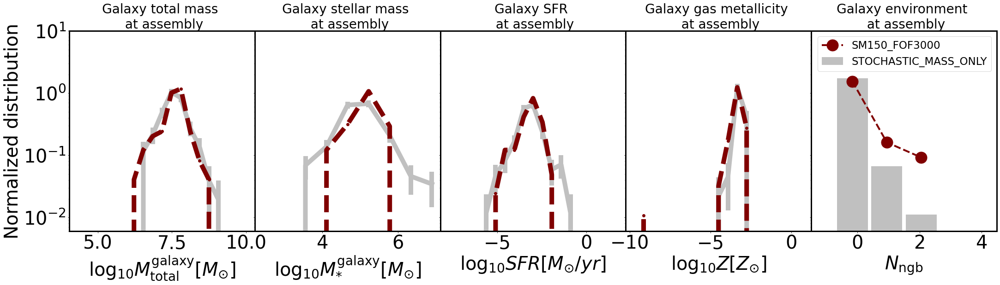

In [38]:
col_gas='maroon'
col_bFOF='silver'

levelmax=12
logseedmass=3.19

Msfmp=150
Mh=3000

Nbins,minimum,maximum=30,4,10
path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output

LogTargetGroupBHMass=4.10
data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_min_redshift_space=data[0]
unique_LogGroupStellarMass_min_redshift_space=data[1]
unique_LogGroupSFR_min_redshift_space=data[2]
unique_LogGroupSF_min_redshift_space=data[3]
unique_LogGroupSFMP_min_redshift_space=data[4]
unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
unique_LogGroupGasMetallicity_min_redshift_space=data[6]
unique_min_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_max_redshift_space=data[0]
unique_LogGroupStellarMass_max_redshift_space=data[1]
unique_LogGroupSFR_max_redshift_space=data[2]
unique_LogGroupSF_max_redshift_space=data[3]
unique_LogGroupSFMP_max_redshift_space=data[4]
unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
unique_LogGroupGasMetallicity_max_redshift_space=data[6]
unique_max_redshift_space=data[7]

data=numpy.load(basePath+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
unique_LogGroupMass_target_redshift_space=data[0]
unique_LogGroupStellarMass_target_redshift_space=data[1]
unique_LogGroupSFR_target_redshift_space=data[2]
unique_LogGroupSF_target_redshift_space=data[3]
unique_LogGroupSFMP_target_redshift_space=data[4]
unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
unique_LogGroupGasMetallicity_target_redshift_space=data[6]
unique_target_redshift_space=data[7]


unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)



levelmax=12
logseedmass=3.19


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_Msfmp%d_Mh%d_double_powerlaw/'%(Msfmp,Mh)
basePath2=path_to_output+run+output


path_to_output='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax,logseedmass) # name of the simulation runs
output='/output_test_0.45_2.58_new_no_ex_new9_bFOF3_env/'
#basePath2=path_to_output+run+output

redshift_cut=9

f,axx=plt.subplots(1,5,figsize=(36,8),sharey=True)

Nbins,minimum,maximum=20,4,10
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
redshifts_complete=1./scale_fac_complete-1
mask4=redshifts_complete > redshift_cut
mask3=unique_target_redshift_space > redshift_cut

a,b,c=get_distribution(numpy.log10(FOFDMmass_complete[mask4]*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[0].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

a,b,c=get_distribution(unique_LogGroupMass_target_redshift_space[mask3],Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[0].errorbar(a-log10(h), b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

axx[0].tick_params(labelsize=40)
#axx[1].tick_params(labelsize=40)

axx[0].set_ylim(8e-3,2)
axx[0].set_yscale('log')

axx[0].set_xlabel(r'$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{total}}[M_{\odot}]$',fontsize=label_fontsize)

axx[0].set_ylabel('Normalized distribution',fontsize=label_fontsize)


Nbins,minimum,maximum=10,2,7
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(StellarMass_complete[mask4]*1e10),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[1].errorbar(a-log10(h),b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')


a,b,c=get_distribution(unique_LogGroupStellarMass_target_redshift_space[mask3],Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[1].errorbar(a-log10(h), b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')
axx[1].set_xlabel(r'$\log_{10} M^{\mathrm{galaxy}}_{\mathrm{*}}[M_{\odot}]$',fontsize=label_fontsize)

axx[1].tick_params(labelsize=40)

Nbins,minimum,maximum=20,-8,2
scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(SFR_complete[mask4]),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[2].errorbar(a,b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')

a,b,c=get_distribution(unique_LogGroupSFR_target_redshift_space[mask3],Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)  
axx[2].errorbar(a, b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

axx[2].set_xlabel(r'$\log_{10} SFR[M_{\odot}/yr]$',fontsize=label_fontsize)
axx[2].tick_params(labelsize=40)


Nbins,minimum,maximum=20,-10,1
a,b,c=get_distribution(unique_LogGroupGasMetallicity_target_redshift_space[mask3],Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[3].errorbar(a,b/norm,c/norm,marker='o',linewidth=10,color=col_bFOF,label='Actual host halo mass distribution at seeding')#ax.set_yscale('log')



scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,neighbor=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
a,b,c=get_distribution(numpy.log10(GasMetallicity_complete[mask4]),Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a) 
axx[3].errorbar(a, b/norm, label='data',linewidth=10,marker='o',color=col_gas,linestyle='dashed')

axx[3].set_xlabel(r'$\log_{10} Z[Z_{\odot}]$',fontsize=label_fontsize)
axx[3].tick_params(labelsize=40)



Nbins,minimum,maximum=10,-1,4

a,b,c=get_distribution(unique_GroupNeighbors_max_redshift_space[mask3],Nbins,minimum,maximum,linear=1)
maskb=b>0
norm=scipy.integrate.trapz(b,a)  
#b/=norm
axx[4].errorbar(a[maskb], b[maskb]/norm, label='SM%d_FOF%d'%(Msfmp,Mh),linewidth=4,marker='o',ms=25,color=col_gas,zorder=10,linestyle='dashed')





scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,FOFNumberOfMajorNeighbors_complete=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=1)
redshift_complete = 1./scale_fac_complete -1
#mask2= redshift_complete>redshict_cut
a,b,c=get_distribution(FOFNumberOfMajorNeighbors_complete[mask4],Nbins,minimum,maximum,linear=1)
norm=scipy.integrate.trapz(b,a)

axx[4].set_xlabel(r'$N_{\mathrm{ngb}}$',fontsize=label_fontsize)
axx[4].tick_params(labelsize=40)

axx[4].bar(a,b/norm,width=1,color=col_bFOF,label='STOCHASTIC_MASS_ONLY')#ax.set_yscale('log')


axx[4].set_xlabel(r'$N_{\mathrm{ngb}}$',fontsize=label_fontsize)
axx[4].tick_params(labelsize=40)

axx[0].set_title('Galaxy total mass \n at assembly',fontsize=title_fontsize-2)
axx[1].set_title('Galaxy stellar mass \n at assembly',fontsize=title_fontsize-2)
axx[2].set_title('Galaxy SFR \n at assembly',fontsize=title_fontsize-2)
axx[3].set_title('Galaxy gas metallicity \n at assembly',fontsize=title_fontsize-2)
axx[4].set_title('Galaxy environment \n at assembly',fontsize=title_fontsize-2)

plt.subplots_adjust(wspace=0)

axx[0].set_ylim(6e-3,1e1)

axx[4].legend(loc='upper right',fontsize=label_fontsize-17)
#axx[1].set_ylabel('Absolute Number',fontsize=30)
for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)
plt.savefig('./Paper5_figures/subhalo_mass_only_model_Msfmp150.png',bbox_inches='tight')







In [3]:
def make_plot(axx,LogTargetGroupBHMass,col='black',style='solid',quantity='total_mass',PPATH=1,width=5,labl=''):
    if(PPATH==1):
        Path=basePath
    else:
        Path=basePath2

    data=numpy.load(Path+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_min_redshift_space=data[0]
    unique_LogGroupStellarMass_min_redshift_space=data[1]
    unique_LogGroupSFR_min_redshift_space=data[2]
    unique_LogGroupSF_min_redshift_space=data[3]
    unique_LogGroupSFMP_min_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
    unique_LogGroupGasMetallicity_min_redshift_space=data[6]
    unique_min_redshift_space=data[7]

    data=numpy.load(Path+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_max_redshift_space=data[0]
    unique_LogGroupStellarMass_max_redshift_space=data[1]
    unique_LogGroupSFR_max_redshift_space=data[2]
    unique_LogGroupSF_max_redshift_space=data[3]
    unique_LogGroupSFMP_max_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
    unique_LogGroupGasMetallicity_max_redshift_space=data[6]
    unique_max_redshift_space=data[7]

    data=numpy.load(Path+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_target_redshift_space=data[0]
    unique_LogGroupStellarMass_target_redshift_space=data[1]
    unique_LogGroupSFR_target_redshift_space=data[2]
    unique_LogGroupSF_target_redshift_space=data[3]
    unique_LogGroupSFMP_target_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
    unique_LogGroupGasMetallicity_target_redshift_space=data[6]
    unique_target_redshift_space=data[7]


    unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)
    if (quantity=='total_mass'):
        quantity_plot=unique_LogGroupMass_target_redshift_space
        axx.set_xlabel('$\log_{10}M_h[M_{\odot}/h]$',fontsize=label_fontsize)
    if (quantity=='stellar_mass'):
        quantity_plot=unique_LogGroupStellarMass_target_redshift_space
        axx.set_xlabel('$\log_{10}M_*[M_{\odot}/h]$',fontsize=label_fontsize)
    if (quantity=='sfr'):
        quantity_plot=unique_LogGroupSFR_target_redshift_space
        axx.set_xlabel('$\log_{10}SFR[M_{\odot}/yr]$',fontsize=label_fontsize)
    if (quantity=='gas_metallicity'):
        quantity_plot=unique_LogGroupGasMetallicity_target_redshift_space
        axx.set_xlabel('$\log_{10}Z_{\odot}$',fontsize=label_fontsize)
    if (quantity=='stellar_metallicity'):
        quantity_plot=unique_LogGroupStellarMetallicity_target_redshift_space
        axx.set_xlabel('$\log_{10}Z_{\odot}$',fontsize=label_fontsize)
  
    if (quantity=='Ngb'):
        quantity_plot=unique_GroupNeighbors_target_redshift_space
        axx.set_xlabel('Ngb',fontsize=label_fontsize)
  
    
    
    a,b,c=get_distribution(quantity_plot,Nbins,minimum,maximum,linear=1)
    norm=scipy.integrate.trapz(b,a)  
    #b/=norm
    axx.errorbar(a, b, label=labl,ms=15,zorder=10,color=col,linewidth=width,linestyle=style)
    axx.tick_params(labelsize=40)

    axx.set_yscale('log')
    
    
def make_plot_seeds(axx,LogTargetGroupBHMass,col='black',style='solid',quantity='total_mass',GET_ENVIRONMENT=1,width=5):    
    if (GET_ENVIRONMENT==1):
        scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor=arepo_package.get_seeding_events3(basePath2,GET_ENVIRONMENT=GET_ENVIRONMENT)
    else:
        scale_fac_complete,BH_id_complete,density_complete,metallicity_complete,SFR_complete,FOFDMmass_complete,indexmaxdens_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,N_empty=arepo_package.get_seeding_events2(basePath)
        #scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty=arepo_package.get_seeding_events3(basePath,GET_ENVIRONMENT=GET_ENVIRONMENT)

    
    if (quantity=='total_mass'):
        quantity_plot=numpy.log10(FOFDMmass_complete*1e10)
        axx.set_xlabel('$\log_{10}M_h[M_{\odot}/h]$',fontsize=label_fontsize)
    if (quantity=='stellar_mass'):
        quantity_plot=numpy.log10(StellarMass_complete*1e10)
        axx.set_xlabel('$\log_{10}M_*[M_{\odot}/h]$',fontsize=label_fontsize)
    if (quantity=='sfr'):
        quantity_plot=numpy.log10(SFR_complete)
        axx.set_xlabel('$\log_{10}SFR[M_{\odot}/yr]$',fontsize=label_fontsize)
    if (quantity=='gas_metallicity'):
        quantity_plot=numpy.log10(GasMetallicity_complete)
        axx.set_xlabel('$\log_{10}Z_{\odot}$',fontsize=label_fontsize)
    if (quantity=='stellar_metallicity'):
        quantity_plot=numpy.log10(StellarMetallicity_complete)
        axx.set_xlabel('$\log_{10}Z_{\odot}$',fontsize=label_fontsize)
    if (quantity=='Ngb'):
        quantity_plot=numpy.log10(Neighbor)
        axx.set_xlabel('$Ngb$',fontsize=label_fontsize)
    print(quantity_plot)
        
    a,b,c=get_distribution(quantity_plot,Nbins,minimum,maximum,linear=1)
    norm=scipy.integrate.trapz(b,a)  
    #b/=norm
    axx.errorbar(a, b, label='data',ms=15,zorder=10,color=col,linewidth=width,linestyle=style)
    axx.tick_params(labelsize=40)
    
    axx.set_yscale('log')
    
    
def make_plot_seeds2(axx,LogTargetGroupBHMass,col='black',style='solid',quantity='total_mass',GET_ENVIRONMENT=1,width=5):    

    scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,DrawnSeedMass=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=GET_ENVIRONMENT)

    
    if (quantity=='total_mass'):
        quantity_plot=numpy.log10(FOFDMmass_complete*1e10)
        axx.set_xlabel('$\log_{10}M_h[M_{\odot}/h]$',fontsize=label_fontsize)
    if (quantity=='stellar_mass'):
        quantity_plot=numpy.log10(StellarMass_complete*1e10)
        axx.set_xlabel('$\log_{10}M_*[M_{\odot}/h]$',fontsize=label_fontsize)
    if (quantity=='sfr'):
        quantity_plot=numpy.log10(SFR_complete)
        axx.set_xlabel('$\log_{10}SFR[M_{\odot}/yr]$',fontsize=label_fontsize)
    if (quantity=='gas_metallicity'):
        quantity_plot=numpy.log10(GasMetallicity_complete)
        axx.set_xlabel('$\log_{10}Z_{\odot}$',fontsize=label_fontsize)
    if (quantity=='stellar_metallicity'):
        quantity_plot=numpy.log10(StellarMetallicity_complete)
        axx.set_xlabel('$\log_{10}Z_{\odot}$',fontsize=label_fontsize)
    if (quantity=='Ngb'):
        quantity_plot=numpy.log10(Neighbor)
        axx.set_xlabel('Ngb',fontsize=label_fontsize)
    print(quantity_plot)
        
    a,b,c=get_distribution(quantity_plot,Nbins,minimum,maximum,linear=1)
    norm=scipy.integrate.trapz(b,a)  
    #b/=norm
    axx.errorbar(a, b, label='data',ms=15,zorder=10,color=col,linewidth=width,linestyle=style)
    axx.tick_params(labelsize=40)
    
    axx.set_yscale('log')


[7.00999449 7.16684438 6.69838157 ... 7.50975344 7.15252378 7.00509038]
[6.75708766 7.08824598 7.01138857 ... 7.22918764 7.38664876 7.56536841]
[7.1858565  6.87826608 6.91186469 ... 6.80990096 7.39763763 7.26122241]


No handles with labels found to put in legend.


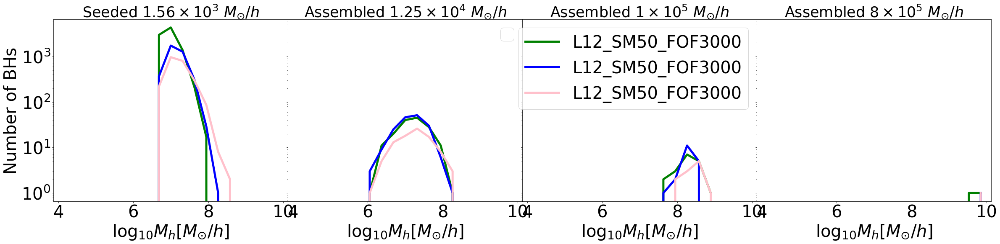

In [6]:

f,axx=plt.subplots(1,4,figsize=(40,8),sharey=True,sharex=True)

quantity='total_mass'

Nbins,minimum,maximum=20,4,10
#path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run

column=0
LogTargetGroupBHMass=4.10
Msfmp=50
Mh=3000

levelmax_gas,logseedmass_gas=12,3.19

path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2

make_plot_seeds(axx[column],LogTargetGroupBHMass,col='green',GET_ENVIRONMENT=1,quantity=quantity)


path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds2(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)

path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_5.00_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds2(axx[column],LogTargetGroupBHMass,col='pink',quantity=quantity)




column=1

LogTargetGroupBHMass=4.10
Msfmp=50
Mh=3000

path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='green',quantity=quantity)

path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)


path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_5.00_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='pink',quantity=quantity)

column=2
LogTargetGroupBHMass=5.00
Msfmp=50
Mh=3000

path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='green',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))



path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))



path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_5.00_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='pink',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))



column=3
LogTargetGroupBHMass=5.90
Msfmp=50
Mh=3000

path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='green',quantity=quantity)


path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)

path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_5.00_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='pink',quantity=quantity)


#axx[0].set_ylim(0.01,3)

#axx[0].set_xlim(5.8,10.2)

axx[0].set_ylabel('Number of BHs',fontsize=label_fontsize)
axx[0].set_title(r'Seeded $1.56 \times 10^{3}\ M_{\odot}/h$',fontsize=label_fontsize-5)
axx[1].set_title(r'Assembled $1.25 \times 10^{4}\ M_{\odot}/h$',fontsize=label_fontsize-5)
axx[2].set_title(r'Assembled $1 \times 10^{5}\ M_{\odot}/h$',fontsize=label_fontsize-5)
axx[3].set_title(r'Assembled $8 \times 10^{5}\ M_{\odot}/h$',fontsize=label_fontsize-5)
plt.subplots_adjust(wspace=0)

axx[1].legend(loc='upper light',fontsize=label_fontsize)

axx[2].legend(loc='upper light',fontsize=label_fontsize)

plt.savefig('./Paper5_figures/assembly_history_Mh_uniform_seed.png',bbox_inches='tight')




NameError: name 'make_plot_seeds' is not defined

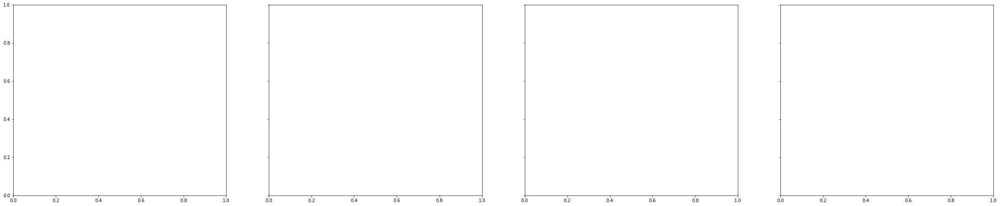

In [4]:

f,axx=plt.subplots(1,4,figsize=(40,8),sharey=True,sharex=True)

quantity='Ngb'

Nbins,minimum,maximum=6,-1,5
#path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run

column=0
LogTargetGroupBHMass=4.10
Msfmp=50
Mh=3000


levelmax_gas,logseedmass_gas=12,3.19
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2

make_plot_seeds(axx[column],LogTargetGroupBHMass,col='green',GET_ENVIRONMENT=1,quantity=quantity)


path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds2(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)

path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_5.00_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds2(axx[column],LogTargetGroupBHMass,col='pink',quantity=quantity)




column=1

LogTargetGroupBHMass=4.10
Msfmp=50
Mh=3000

path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='green',quantity=quantity)

path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)



column=2
LogTargetGroupBHMass=5.00
Msfmp=50
Mh=3000

path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='green',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))



path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))



path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_5.00_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='pink',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))



column=3
LogTargetGroupBHMass=5.90
Msfmp=50
Mh=3000

path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='green',quantity=quantity)


path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_4.10_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)

path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_5.00_env/'%(Msfmp,Mh)
basePath=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='pink',quantity=quantity)


#axx[0].set_ylim(0.01,3)

#axx[0].set_xlim(5.8,10.2)

axx[0].set_ylabel('Number of BHs',fontsize=label_fontsize)
axx[0].set_title(r'Seeded $1.56 \times 10^{3}\ M_{\odot}/h$',fontsize=label_fontsize-5)
axx[1].set_title(r'Assembled $1.25 \times 10^{4}\ M_{\odot}/h$',fontsize=label_fontsize-5)
axx[2].set_title(r'Assembled $1 \times 10^{5}\ M_{\odot}/h$',fontsize=label_fontsize-5)
axx[3].set_title(r'Assembled $8 \times 10^{5}\ M_{\odot}/h$',fontsize=label_fontsize-5)
plt.subplots_adjust(wspace=0)

axx[1].legend(loc='upper light',fontsize=label_fontsize)

axx[2].legend(loc='upper light',fontsize=label_fontsize)

plt.savefig('./Paper5_figures/assembly_history_Mh_uniform_seed.png',bbox_inches='tight')




(7.5, 20)

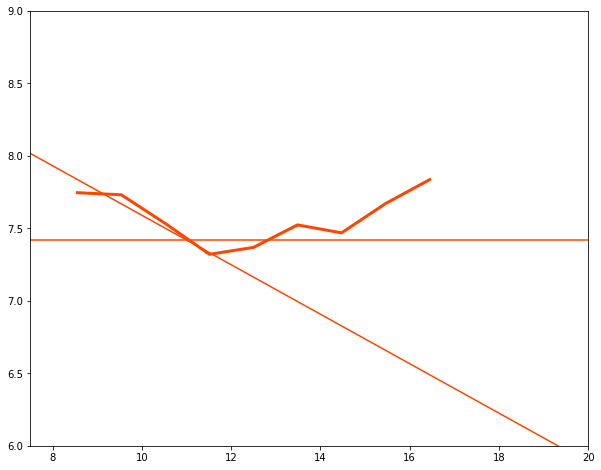

In [14]:




def make_plot(col):
    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
    basePath=path_to_output+run+output
    path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
    output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
    basePath2=path_to_output2+run2+output2 
    LogTargetGroupBHMass=4.10

    Path=basePath2

    if(1==1):

        data=numpy.load(Path+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
        unique_LogGroupMass_min_redshift_space=data[0]
        unique_LogGroupStellarMass_min_redshift_space=data[1]
        unique_LogGroupSFR_min_redshift_space=data[2]
        unique_LogGroupSF_min_redshift_space=data[3]
        unique_LogGroupSFMP_min_redshift_space=data[4]
        unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
        unique_LogGroupGasMetallicity_min_redshift_space=data[6]
        unique_min_redshift_space=data[7]

        data=numpy.load(Path+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
        unique_LogGroupMass_max_redshift_space=data[0]
        unique_LogGroupStellarMass_max_redshift_space=data[1]
        unique_LogGroupSFR_max_redshift_space=data[2]
        unique_LogGroupSF_max_redshift_space=data[3]
        unique_LogGroupSFMP_max_redshift_space=data[4]
        unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
        unique_LogGroupGasMetallicity_max_redshift_space=data[6]
        unique_max_redshift_space=data[7]

        data=numpy.load(Path+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
        unique_LogGroupMass_target_redshift_space=data[0]
        unique_LogGroupStellarMass_target_redshift_space=data[1]
        unique_LogGroupSFR_target_redshift_space=data[2]
        unique_LogGroupSF_target_redshift_space=data[3]
        unique_LogGroupSFMP_target_redshift_space=data[4]
        unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
        unique_LogGroupGasMetallicity_target_redshift_space=data[6]
        unique_target_redshift_space=data[7]
    

    mask=unique_target_redshift_space>7
    #ax.errorbar(unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask],linewidth=0,marker='o',color=col)
   
    a,b=arepo_package.median_plot(unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask],False,False,10)
    ax.errorbar(a,b,linewidth=3,color=col)
    
    
    
    

   
    #print(a)
   
f,ax=plt.subplots(1,1,figsize=(10,8))
levelmax_gas,logseedmass_gas=12,3.19
Msfmp=5
Mh=3000
#make_plot('blue')

z_space_con=numpy.linspace(7,20,100)


'''
slope = -0.02
z_onset = 13
intercept = 1
p_space=(-2.88+10)*((z_space_con-z_onset)*slope+1)
Msfmp=50
Mh=3000
make_plot('orange')
ax.axhline(-2.88+10,color='orange')
ax.plot(z_space_con,p_space,color='orange')




slope = -0.025
z_onset = 12
intercept = 1
p_space=(-2.58+10)*((z_space_con-z_onset)*slope+1)
Msfmp=150
Mh=3000
make_plot('maroon')
ax.axhline(-2.58+10,color='maroon')
ax.plot(z_space_con,p_space,color='maroon')

'''
#ax.axhline(-2.58+10,color='maroon')
#ax.set_ylim(8,9)

Msfmp=1000
Mh=3000
#make_plot('cyan')


Msfmp=5
Mh=10000
slope = -0.023
z_onset = 11.
intercept = 1
p_space=(-2.58+10)*((z_space_con-z_onset)*slope+1)
make_plot('orangered')
ax.axhline(-2.58+10,color='orangered')
ax.plot(z_space_con,p_space,color='orangered')
ax.set_ylim(6,9)

ax.set_xlim(7.5,20)




/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4//density_and_metallicity_based_criterion_zoom_levelmin7_levelmax12_haloindex4_redshift5.00_logbhseedmass3.19_NSC/AREPO//output_SFMFGM150_FOF3000_seed3.19_env/
/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4//density_and_metallicity_based_criterion_zoom_levelmin7_levelmax12_haloindex4_redshift5.00_logbhseedmass3.19_NSC/AREPO//output_SFMFGM150_FOF3000_seed3.19_env_normal/
/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4//density_and_metallicity_based_criterion_zoom_levelmin7_levelmax12_haloindex4_redshift5.00_logbhseedmass3.19_NSC/AREPO//output_SFMFGM150_FOF3000_seed3.19_env_mirror/


(7.5, 20)

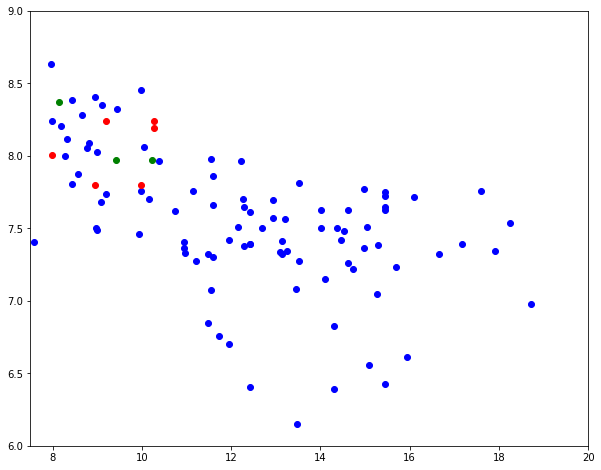

In [74]:




def make_plot(col):


    LogTargetGroupBHMass=4.10

    Path=basePath2
    print(Path)

    if(1==1):

        data=numpy.load(Path+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
        unique_LogGroupMass_min_redshift_space=data[0]
        unique_LogGroupStellarMass_min_redshift_space=data[1]
        unique_LogGroupSFR_min_redshift_space=data[2]
        unique_LogGroupSF_min_redshift_space=data[3]
        unique_LogGroupSFMP_min_redshift_space=data[4]
        unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
        unique_LogGroupGasMetallicity_min_redshift_space=data[6]
        unique_min_redshift_space=data[7]

        data=numpy.load(Path+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
        unique_LogGroupMass_max_redshift_space=data[0]
        unique_LogGroupStellarMass_max_redshift_space=data[1]
        unique_LogGroupSFR_max_redshift_space=data[2]
        unique_LogGroupSF_max_redshift_space=data[3]
        unique_LogGroupSFMP_max_redshift_space=data[4]
        unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
        unique_LogGroupGasMetallicity_max_redshift_space=data[6]
        unique_max_redshift_space=data[7]

        data=numpy.load(Path+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
        unique_LogGroupMass_target_redshift_space=data[0]
        unique_LogGroupStellarMass_target_redshift_space=data[1]
        unique_LogGroupSFR_target_redshift_space=data[2]
        unique_LogGroupSF_target_redshift_space=data[3]
        unique_LogGroupSFMP_target_redshift_space=data[4]
        unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
        unique_LogGroupGasMetallicity_target_redshift_space=data[6]
        unique_target_redshift_space=data[7]
    

    mask=unique_target_redshift_space>7
    ax.errorbar(unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask],linewidth=0,marker='o',color=col)
   
    a,b=arepo_package.median_plot(unique_target_redshift_space[mask],unique_LogGroupMass_target_redshift_space[mask],False,False,10)
    #ax.errorbar(a,b,linewidth=3,color=col)
    
    
    
    

   

 
f,ax=plt.subplots(1,1,figsize=(10,8))
levelmax_gas,logseedmass_gas=12,3.19
Msfmp=150
Mh=3000
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2   
make_plot('blue')


path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env_normal/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2   
make_plot('red')


path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env_mirror/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2   
make_plot('green')

ax.set_ylim(6,9)

ax.set_xlim(7.5,20)




In [42]:
help(arepo_package.mean_plot)

Help on function mean_plot in module arepo_package:

mean_plot(x, y, xscl, yscl, nbins, manual_bins=False, M_BINS=array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 

In [30]:
def make_plot(axx,LogTargetGroupBHMass,col='black',style='solid',quantity='total_mass',PPATH=1,width=5,labl=''):
    if(PPATH==1):
        Path=basePath
    else:
        Path=basePath2

    data=numpy.load(Path+'/postprocessing/final_group_properties_seed%.2f_min.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_min_redshift_space=data[0]
    unique_LogGroupStellarMass_min_redshift_space=data[1]
    unique_LogGroupSFR_min_redshift_space=data[2]
    unique_LogGroupSF_min_redshift_space=data[3]
    unique_LogGroupSFMP_min_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_min_redshift_space=data[5]
    unique_LogGroupGasMetallicity_min_redshift_space=data[6]
    unique_min_redshift_space=data[7]

    data=numpy.load(Path+'/postprocessing/final_group_properties_seed%.2f_max.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_max_redshift_space=data[0]
    unique_LogGroupStellarMass_max_redshift_space=data[1]
    unique_LogGroupSFR_max_redshift_space=data[2]
    unique_LogGroupSF_max_redshift_space=data[3]
    unique_LogGroupSFMP_max_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_max_redshift_space=data[5]
    unique_LogGroupGasMetallicity_max_redshift_space=data[6]
    unique_max_redshift_space=data[7]

    data=numpy.load(Path+'/postprocessing/final_group_properties_seed%.2f_target.npy'%LogTargetGroupBHMass)
    unique_LogGroupMass_target_redshift_space=data[0]
    unique_LogGroupStellarMass_target_redshift_space=data[1]
    unique_LogGroupSFR_target_redshift_space=data[2]
    unique_LogGroupSF_target_redshift_space=data[3]
    unique_LogGroupSFMP_target_redshift_space=data[4]
    unique_LogGroupStellarMetallicity_target_redshift_space=data[5]
    unique_LogGroupGasMetallicity_target_redshift_space=data[6]
    unique_target_redshift_space=data[7]

    if(PPATH==2):
        unique_GroupNeighbors_max_redshift_space,unique_GroupNeighbors_min_redshift_space,unique_GroupNeighbors_target_redshift_space=numpy.load(basePath2+'/postprocessing/final_group_neighbors_seed%.2f.npy'%LogTargetGroupBHMass)
    if (quantity=='redshift'):
        quantity_plot=unique_target_redshift_space
        axx.set_xlabel('Redshift',fontsize=label_fontsize)
    if (quantity=='total_mass'):
        quantity_plot=unique_LogGroupMass_target_redshift_space
        axx.set_xlabel('$\log_{10}M_h[M_{\odot}/h]$',fontsize=label_fontsize)
    if (quantity=='stellar_mass'):
        quantity_plot=unique_LogGroupStellarMass_target_redshift_space
        axx.set_xlabel('$\log_{10}M_*[M_{\odot}/h]$',fontsize=label_fontsize)
    if (quantity=='sfr'):
        quantity_plot=unique_LogGroupSFR_target_redshift_space
        axx.set_xlabel('$\log_{10}SFR[M_{\odot}/yr]$',fontsize=label_fontsize)
    if (quantity=='gas_metallicity'):
        quantity_plot=unique_LogGroupGasMetallicity_target_redshift_space
        axx.set_xlabel('$\log_{10}Z_{\odot}$',fontsize=label_fontsize)
    if (quantity=='stellar_metallicity'):
        quantity_plot=unique_LogGroupStellarMetallicity_target_redshift_space
        axx.set_xlabel('$\log_{10}Z_{\odot}$',fontsize=label_fontsize)
        
    if (quantity=='Ngb'):
        quantity_plot=unique_GroupNeighbors_target_redshift_space
        axx.set_xlabel('Ngb',fontsize=label_fontsize)
  
        
   
    
    a,b,c=get_distribution(quantity_plot,Nbins,minimum,maximum,linear=1)
    norm=scipy.integrate.trapz(b,a)  
    #b/=norm
    axx.errorbar(a, b, label=labl,ms=15,zorder=10,color=col,linewidth=width,linestyle=style)
    axx.tick_params(labelsize=40)

    axx.set_yscale('log')
    
    
def make_plot_seeds(axx,LogTargetGroupBHMass,col='black',style='solid',quantity='total_mass',GET_ENVIRONMENT=1,width=5):    
    if (GET_ENVIRONMENT==1):
        scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty=arepo_package.get_seeding_events3(basePath,GET_ENVIRONMENT=0)
    else:
        scale_fac_complete,BH_id_complete,density_complete,metallicity_complete,SFR_complete,FOFDMmass_complete,indexmaxdens_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,N_empty=arepo_package.get_seeding_events2(basePath)
        #scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty=arepo_package.get_seeding_events3(basePath,GET_ENVIRONMENT=GET_ENVIRONMENT)
    if (quantity=='redshift'): 
        quantity_plot=1./scale_fac_complete-1
        axx.set_xlabel('Redshift',fontsize=label_fontsize)
    if (quantity=='total_mass'):
        quantity_plot=numpy.log10(FOFDMmass_complete*1e10)
        axx.set_xlabel('$\log_{10}M_h[M_{\odot}/h]$',fontsize=label_fontsize)
    if (quantity=='stellar_mass'):
        quantity_plot=numpy.log10(StellarMass_complete*1e10)
        axx.set_xlabel('$\log_{10}M_*[M_{\odot}/h]$',fontsize=label_fontsize)
    if (quantity=='sfr'):
        quantity_plot=numpy.log10(SFR_complete)
        axx.set_xlabel('$\log_{10}SFR[M_{\odot}/yr]$',fontsize=label_fontsize)
    if (quantity=='gas_metallicity'):
        quantity_plot=numpy.log10(GasMetallicity_complete)
        axx.set_xlabel('$\log_{10}Z_{\odot}$',fontsize=label_fontsize)
    if (quantity=='stellar_metallicity'):
        quantity_plot=numpy.log10(StellarMetallicity_complete)
        axx.set_xlabel('$\log_{10}Z_{\odot}$',fontsize=label_fontsize)
    print(quantity_plot)
        
    a,b,c=get_distribution(quantity_plot,Nbins,minimum,maximum,linear=1)
    norm=scipy.integrate.trapz(b,a)  
    #b/=norm
    axx.errorbar(a, b, label='data',ms=15,zorder=10,color=col,linewidth=width,linestyle=style)
    axx.tick_params(labelsize=40)
    
    axx.set_yscale('log')
    
    
def make_plot_seeds2(axx,LogTargetGroupBHMass,col='black',style='solid',quantity='total_mass',GET_ENVIRONMENT=1,width=5):    

    scale_fac_complete,BH_id_complete,StellarMass_complete,StellarMetallicity_complete,SFR_complete,FOFDMmass_complete,GasMetallicity_complete,file_id_complete,FOFStarFormingGasMass_complete,FOFStarFormingGasMetallicity_complete,FOFStarFormingMetalFreeGasMass_complete,N_empty,Neighbor,DrawnSeedMass=arepo_package.get_seeding_events4(basePath2,GET_ENVIRONMENT=GET_ENVIRONMENT)

    if (quantity=='redshift'): 
        quantity_plot=1./scale_fac_complete-1
        axx.set_xlabel('Redshift',fontsize=label_fontsize)
    if (quantity=='total_mass'):
        quantity_plot=numpy.log10(FOFDMmass_complete*1e10)
        axx.set_xlabel('$\log_{10}M_h[M_{\odot}/h]$',fontsize=label_fontsize)
    if (quantity=='stellar_mass'):
        quantity_plot=numpy.log10(StellarMass_complete*1e10)
        axx.set_xlabel('$\log_{10}M_*[M_{\odot}/h]$',fontsize=label_fontsize)
    if (quantity=='sfr'):
        quantity_plot=numpy.log10(SFR_complete)
        axx.set_xlabel('$\log_{10}SFR[M_{\odot}/yr]$',fontsize=label_fontsize)
    if (quantity=='gas_metallicity'):
        quantity_plot=numpy.log10(GasMetallicity_complete)
        axx.set_xlabel('$\log_{10}Z_{\odot}$',fontsize=label_fontsize)
    if (quantity=='stellar_metallicity'):
        quantity_plot=numpy.log10(StellarMetallicity_complete)
        axx.set_xlabel('$\log_{10}Z_{\odot}$',fontsize=label_fontsize)
    print(quantity_plot)
        
    a,b,c=get_distribution(quantity_plot,Nbins,minimum,maximum,linear=1)
    norm=scipy.integrate.trapz(b,a)  
    #b/=norm
    axx.errorbar(a, b, label='data',ms=15,zorder=10,color=col,linewidth=width,linestyle=style)
    axx.tick_params(labelsize=40)
    
    axx.set_yscale('log')



In [77]:
levelmax_gas,logseedmass_gas=12,3.19

[23.20393265 22.46982602 21.43676758 ... 10.27357587  9.78014857
  7.92649921]
-----
[18.60253892 18.25732212 18.21174222 ... 14.25825357 12.29140339
  9.62013067]
-----
[21.5700518  15.4892968  15.10321517 ... 10.34054289 10.27357587
 10.0390019 ]
-----
blackhole_seeding2_17.txt
blackhole_seeding2_176.txt
blackhole_seeding2_281.txt
blackhole_seeding2_99.txt
blackhole_seeding2_59.txt
blackhole_seeding2_429.txt
blackhole_seeding2_409.txt
blackhole_seeding2_475.txt
blackhole_seeding2_125.txt
blackhole_seeding2_39.txt
blackhole_seeding2_495.txt
blackhole_seeding2_388.txt
blackhole_seeding2_327.txt
blackhole_seeding2_288.txt
blackhole_seeding2_193.txt
blackhole_seeding2_477.txt
blackhole_seeding2_346.txt
blackhole_seeding2_214.txt
blackhole_seeding2_313.txt
blackhole_seeding2_245.txt
blackhole_seeding2_280.txt
blackhole_seeding2_271.txt
blackhole_seeding2_77.txt
blackhole_seeding2_231.txt
blackhole_seeding2_206.txt
blackhole_seeding2_142.txt
blackhole_seeding2_501.txt
blackhole_seeding2_46

[18.48679575 17.2576705  15.98490721 ... 10.93315998  9.7480769
  8.91316071]
-----


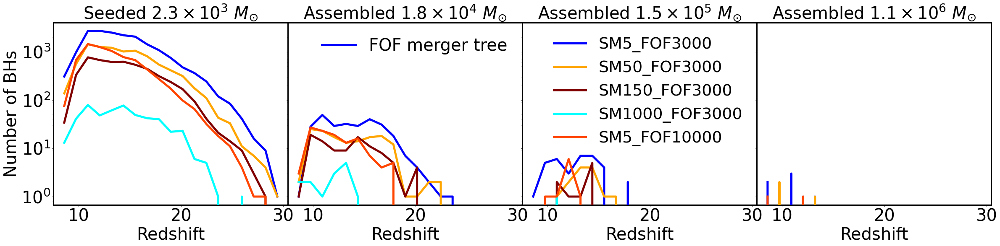

In [31]:

f,axx=plt.subplots(1,4,figsize=(40,8),sharey=True,sharex=True)

quantity='redshift'

Nbins,minimum,maximum=20,8,30
#path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run

column=0
LogTargetGroupBHMass=4.10
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2

make_plot_seeds(axx[column],LogTargetGroupBHMass,col='blue',GET_ENVIRONMENT=1,quantity=quantity)
print("-----")


Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)
print("-----")


Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)
print("-----")
Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity)



Msfmp=5
Mh=10000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='orangered',quantity=quantity)

print("-----")


column=1

LogTargetGroupBHMass=4.10
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,labl='FOF merger tree')
#make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',labl='bFOF merger tree',width=2)



Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)
#make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)



Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)
#make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)

Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity)
#make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=5
Mh=10000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orangered',quantity=quantity)
#make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)



column=2
LogTargetGroupBHMass=5.00
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,labl='SM%d_FOF%d'%(Msfmp,Mh))
#make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,labl='SM%d_FOF%d'%(Msfmp,Mh))
#make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,labl='SM%d_FOF%d'%(Msfmp,Mh))
#make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,labl='SM%d_FOF%d'%(Msfmp,Mh))
#make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=5
Mh=10000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orangered',quantity=quantity,labl='SM%d_FOF%d'%(Msfmp,Mh))





column=3
LogTargetGroupBHMass=5.90
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)
#make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)
#make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)
#make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity)



Msfmp=5
Mh=10000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orangered',quantity=quantity)

#make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)




#axx[0].set_ylim(0.01,3)

#axx[0].set_xlim(5.8,10.2)

axx[0].set_ylabel('Number of BHs',fontsize=label_fontsize)
axx[0].set_title(r'Seeded $2.3 \times 10^{3}\ M_{\odot}$',fontsize=label_fontsize)
axx[1].set_title(r'Assembled $1.8 \times 10^{4}\ M_{\odot}$',fontsize=label_fontsize)
axx[2].set_title(r'Assembled $1.5 \times 10^{5}\ M_{\odot}$',fontsize=label_fontsize)
axx[3].set_title(r'Assembled $1.1 \times 10^{6}\ M_{\odot}$',fontsize=label_fontsize)
plt.subplots_adjust(wspace=0)

axx[1].legend(loc='upper right',fontsize=label_fontsize,frameon=False)

axx[2].legend(loc='upper right',fontsize=label_fontsize-2,frameon=False)

for ax in axx.flatten():
    ax.spines['top'].set_linewidth(3)    # Top axis
    ax.spines['bottom'].set_linewidth(3) # Bottom axis
    ax.spines['left'].set_linewidth(3)   # Left axis
    ax.spines['right'].set_linewidth(3)

plt.savefig('./Paper5_figures/assembly_history_redshift.png',bbox_inches='tight')




[6.6611129  6.68679977 6.68826494 ... 6.87160621 7.02506817 7.01138857]
-----
[7.00999449 7.16684438 6.69838157 ... 7.50975344 7.15252378 7.00509038]
-----
blackhole_seeding2_356.txt
blackhole_seeding2_253.txt
blackhole_seeding2_193.txt
blackhole_seeding2_342.txt
blackhole_seeding2_186.txt
blackhole_seeding2_245.txt
blackhole_seeding2_461.txt
blackhole_seeding2_36.txt
blackhole_seeding2_497.txt
blackhole_seeding2_6.txt
blackhole_seeding2_221.txt
blackhole_seeding2_396.txt
blackhole_seeding2_180.txt
blackhole_seeding2_359.txt
blackhole_seeding2_341.txt
blackhole_seeding2_286.txt
blackhole_seeding2_35.txt
blackhole_seeding2_2.txt
blackhole_seeding2_404.txt
blackhole_seeding2_448.txt
blackhole_seeding2_408.txt
blackhole_seeding2_410.txt
blackhole_seeding2_294.txt
blackhole_seeding2_299.txt
blackhole_seeding2_378.txt
blackhole_seeding2_395.txt
blackhole_seeding2_94.txt
blackhole_seeding2_68.txt
blackhole_seeding2_449.txt
blackhole_seeding2_178.txt
blackhole_seeding2_303.txt
blackhole_seedi

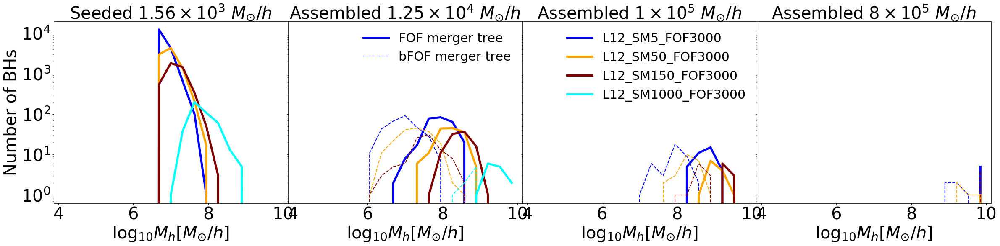

In [6]:

f,axx=plt.subplots(1,4,figsize=(40,8),sharey=True,sharex=True)

quantity='total_mass'

Nbins,minimum,maximum=20,4,10
#path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run

column=0
LogTargetGroupBHMass=4.10
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2

make_plot_seeds(axx[column],LogTargetGroupBHMass,col='blue',GET_ENVIRONMENT=1,quantity=quantity)
print("-----")


Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)
print("-----")


Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)
print("-----")
Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity)

print("-----")


column=1

LogTargetGroupBHMass=4.10
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,labl='FOF merger tree')
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',labl='bFOF merger tree',width=2)



Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)



Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)

Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)



column=2
LogTargetGroupBHMass=5.00
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)


column=3
LogTargetGroupBHMass=5.90
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)


#axx[0].set_ylim(0.01,3)

#axx[0].set_xlim(5.8,10.2)

axx[0].set_ylabel('Number of BHs',fontsize=label_fontsize)
axx[0].set_title(r'Seeded $1.56 \times 10^{3}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[1].set_title(r'Assembled $1.25 \times 10^{4}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[2].set_title(r'Assembled $1 \times 10^{5}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[3].set_title(r'Assembled $8 \times 10^{5}\ M_{\odot}/h$',fontsize=title_fontsize)
plt.subplots_adjust(wspace=0)

axx[1].legend(loc='upper light',fontsize=title_fontsize-10,frameon=False)

axx[2].legend(loc='upper light',fontsize=title_fontsize-10,frameon=False)

plt.savefig('./Paper5_figures/assembly_history_Mh.png',bbox_inches='tight')




[-inf -inf -inf ... -inf -inf -inf]
[      -inf       -inf       -inf ... 3.74603059       -inf       -inf]
[      -inf       -inf       -inf ...       -inf       -inf 3.23754625]
[4.39415738 5.47114497 4.42733515 4.072926   3.74885292 3.97517575
 5.3565402  4.34126631 3.4436181  4.65029878 5.07491148 4.18444157
 4.04352732 4.23299611       -inf 4.37493705 4.71917959 4.03961635
 4.88363532 4.03044994 4.37056675 4.1647899  4.32439976 3.3128393
 3.65720792 3.88053178 4.51686972 4.70938022 4.11341854 4.84387098
 3.96187034 3.23088045       -inf 4.06270229 3.43644254 4.22083218
 3.45657554 4.87041386 4.93423679 4.47481628 4.98701478 5.08802617
 4.64909135 3.82031577 4.46884191       -inf 3.76404306 4.46240399
 3.93099027 4.53419877 5.1487661  3.94260127       -inf 3.72878867
 4.41231436 3.99859932 3.4126302  3.5091057  3.3283796  4.17601308
 4.24451215 4.11496775 3.87496223 5.56964541 3.83017085 3.87297279
 3.37161085 3.8263353  3.82251198 4.87695817 3.9700985  3.79856916
 4.79306083 4.098

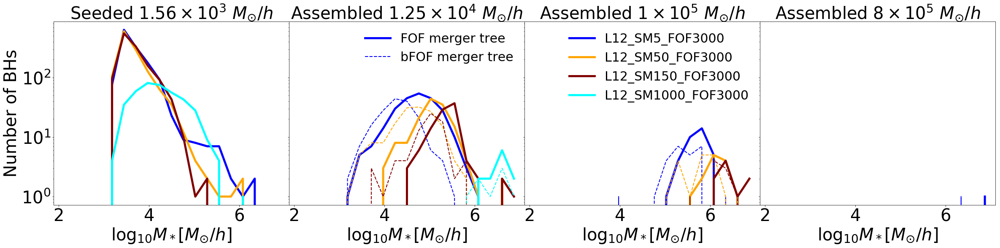

In [26]:

f,axx=plt.subplots(1,4,figsize=(40,8),sharey=True,sharex=True)

quantity='stellar_mass'

Nbins,minimum,maximum=20,2,7
column=0
LogTargetGroupBHMass=4.10
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2

make_plot_seeds(axx[column],LogTargetGroupBHMass,col='blue',GET_ENVIRONMENT=1,quantity=quantity)



Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)



Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)

Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity)




column=1

LogTargetGroupBHMass=4.10
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,labl='FOF merger tree')
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',labl='bFOF merger tree',width=2)



Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)



Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)

Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)



column=2
LogTargetGroupBHMass=5.00
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)


column=3
LogTargetGroupBHMass=5.90
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)


#axx[0].set_ylim(0.01,3)

#axx[0].set_xlim(5.8,10.2)

axx[0].set_ylabel('Number of BHs',fontsize=label_fontsize)
axx[0].set_title(r'Seeded $1.56 \times 10^{3}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[1].set_title(r'Assembled $1.25 \times 10^{4}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[2].set_title(r'Assembled $1 \times 10^{5}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[3].set_title(r'Assembled $8 \times 10^{5}\ M_{\odot}/h$',fontsize=title_fontsize)
plt.subplots_adjust(wspace=0)

axx[1].legend(loc='upper light',fontsize=title_fontsize-10,frameon=False)

axx[2].legend(loc='upper light',fontsize=title_fontsize-10,frameon=False)

plt.savefig('./Paper5_figures/assembly_history_Mstar.png',bbox_inches='tight')



[-3.84867306 -5.2916131  -5.18935288 ... -5.2914185  -4.97407591
 -5.28829735]
[-4.35138144 -4.04309716 -4.34128857 ... -3.54246931 -4.23940037
 -4.33632922]
[-3.92350155 -3.94374326 -3.8916312  ... -3.91514143 -3.99464786
 -3.55999349]
[-2.81173823 -2.43869583 -3.06555054 -2.93430827 -3.06971641 -2.85632957
 -2.26192614 -2.77706514 -3.15804019 -2.72949818 -2.44745589 -2.90624572
 -2.98347224 -2.8696019  -3.15275997 -2.71511378 -2.91407468 -2.969113
 -2.65844678 -2.9528381  -3.05251187 -3.04133198 -2.85490309 -3.12164713
 -2.89201036 -3.09312162 -2.9203196  -2.88523227 -2.99713013 -2.55229634
 -3.13437554 -2.97035248 -3.13806434 -2.9809419  -3.06191929 -2.96783672
 -3.04333654 -2.775089   -2.44356964 -2.89685335 -2.58952646 -2.48192321
 -2.77033607 -3.16817308 -2.83472599 -3.14146521 -2.96271298 -2.75606699
 -3.12445086 -2.84570387 -2.55721617 -3.06216327 -3.07505427 -3.06261954
 -2.72073469 -2.88813285 -3.04095574 -3.01486195 -3.02496958 -2.72808408
 -2.83089599 -2.97648828 -3.0067882

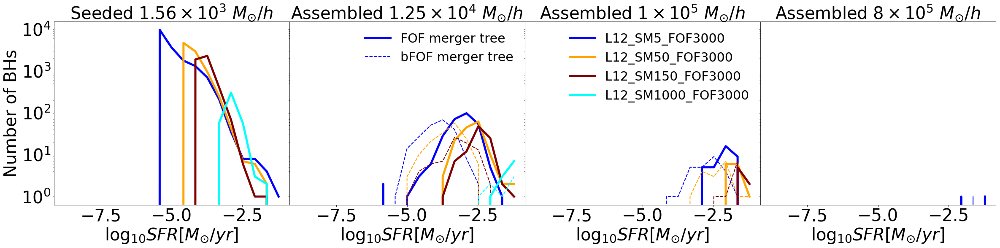

In [23]:

f,axx=plt.subplots(1,4,figsize=(40,8),sharey=True,sharex=True)

quantity='sfr'

Nbins,minimum,maximum=20,-9,-1
column=0
LogTargetGroupBHMass=4.10
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2

make_plot_seeds(axx[column],LogTargetGroupBHMass,col='blue',GET_ENVIRONMENT=1,quantity=quantity)



Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)



Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)

Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity)




column=1

LogTargetGroupBHMass=4.10
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,labl='FOF merger tree')
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',labl='bFOF merger tree',width=2)



Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)



Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)

Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)



column=2
LogTargetGroupBHMass=5.00
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)


column=3
LogTargetGroupBHMass=5.90
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)


#axx[0].set_ylim(0.01,3)

#axx[0].set_xlim(5.8,10.2)

axx[0].set_ylabel('Number of BHs',fontsize=label_fontsize)
axx[0].set_title(r'Seeded $1.56 \times 10^{3}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[1].set_title(r'Assembled $1.25 \times 10^{4}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[2].set_title(r'Assembled $1 \times 10^{5}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[3].set_title(r'Assembled $8 \times 10^{5}\ M_{\odot}/h$',fontsize=title_fontsize)
plt.subplots_adjust(wspace=0)

axx[1].legend(loc='upper light',fontsize=title_fontsize-10,frameon=False)

axx[2].legend(loc='upper light',fontsize=title_fontsize-10,frameon=False)

plt.savefig('./Paper5_figures/assembly_history_SFR.png',bbox_inches='tight')



[-5.35500634 -9.09650034 -9.09457491 ... -9.09691056 -9.09555388
 -5.29726711]
[-9.09600003 -9.09310386 -8.13466206 ... -4.94967052 -7.92569932
 -5.91431706]
[-7.53496234 -6.17051933 -9.09415557 ... -6.20294862 -9.09323519
 -5.12438782]
[-4.37725147 -3.9580155  -4.55934905 -5.32570574 -4.94420134 -4.90907567
 -3.97634431 -4.70183492 -5.8588796  -4.34695351 -4.15249767 -4.82054301
 -4.61025642 -4.99719485 -9.08457959 -4.60822184 -4.33464794 -5.23745272
 -4.42483064 -4.60783261 -4.81291661 -4.75533701 -4.54780402 -5.26802143
 -5.04142991 -4.9641022  -4.31955933 -4.51658674 -4.63787393 -4.30988281
 -5.94172965 -5.49818104 -8.2722384  -5.00297816 -5.43163633 -5.03489336
 -4.92504101 -4.32675785 -4.17297856 -4.76531571 -4.23221357 -4.14056387
 -4.58321143 -9.09047018 -4.58675222 -9.08427048 -4.84393872 -4.46154441
 -4.98294996 -4.3977533  -3.86846474 -5.21038545 -9.07858199 -5.16878248
 -4.48355454 -5.11374453 -5.24856769 -5.05585502 -5.06618332 -5.25621281
 -4.81691246 -4.81697799 -5.35451

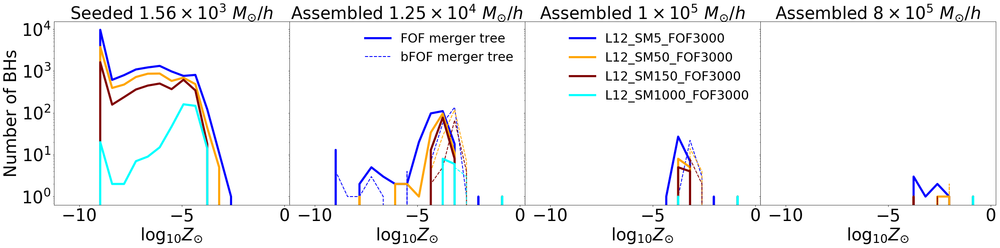

In [25]:

f,axx=plt.subplots(1,4,figsize=(40,8),sharey=True,sharex=True)

quantity='gas_metallicity'

Nbins,minimum,maximum=20,-11,0
column=0
column=0
LogTargetGroupBHMass=4.10
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2

make_plot_seeds(axx[column],LogTargetGroupBHMass,col='blue',GET_ENVIRONMENT=1,quantity=quantity)



Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)



Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)

Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity)




column=1

LogTargetGroupBHMass=4.10
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,labl='FOF merger tree')
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',labl='bFOF merger tree',width=2)



Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)



Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)

Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)



column=2
LogTargetGroupBHMass=5.00
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,labl='L12_SM%d_FOF%d'%(Msfmp,Mh))
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)


column=3
LogTargetGroupBHMass=5.90
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=1000
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='cyan',quantity=quantity,PPATH=2,style='dashed',width=2)


#axx[0].set_ylim(0.01,3)

#axx[0].set_xlim(5.8,10.2)

axx[0].set_ylabel('Number of BHs',fontsize=label_fontsize)
axx[0].set_title(r'Seeded $1.56 \times 10^{3}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[1].set_title(r'Assembled $1.25 \times 10^{4}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[2].set_title(r'Assembled $1 \times 10^{5}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[3].set_title(r'Assembled $8 \times 10^{5}\ M_{\odot}/h$',fontsize=title_fontsize)
plt.subplots_adjust(wspace=0)

axx[1].legend(loc='upper light',fontsize=title_fontsize-10,frameon=False)

axx[2].legend(loc='upper light',fontsize=title_fontsize-10,frameon=False)

plt.savefig('./Paper5_figures/assembly_history_Zgas.png',bbox_inches='tight')




[nan nan nan ... nan nan nan]


/apps/jupyterhub/1.0.0/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: invalid value encountered in greater
/apps/jupyterhub/1.0.0/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: invalid value encountered in less


[        nan         nan         nan ... -5.47516656         nan
         nan]
[        nan         nan         nan ...         nan         nan
 -9.09684596]
[-9.09360246         nan         nan ... -3.89702462         nan
 -9.09691001]


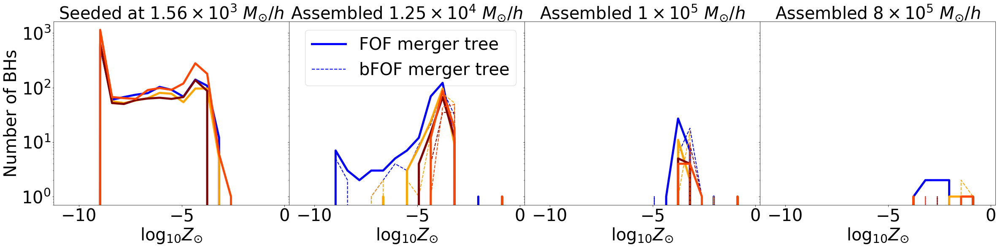

In [53]:

f,axx=plt.subplots(1,4,figsize=(40,8),sharey=True,sharex=True)

quantity='stellar_metallicity'
column=0
LogTargetGroupBHMass=4.10
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2

make_plot_seeds(axx[column],LogTargetGroupBHMass,col='blue',GET_ENVIRONMENT=1,quantity=quantity)



Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)



Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)

Msfmp=5
Mh=10000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='orangered',quantity=quantity)




column=1

LogTargetGroupBHMass=4.10
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,labl='FOF merger tree')
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',labl='bFOF merger tree',width=2)



Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)



Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)

Msfmp=5
Mh=10000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orangered',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='orangered',quantity=quantity,PPATH=2,style='dashed',width=2)



column=2
LogTargetGroupBHMass=5.00
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=5
Mh=10000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orangered',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='orangered',quantity=quantity,PPATH=2,style='dashed',width=2)


column=3
LogTargetGroupBHMass=5.90
Msfmp=5
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='orange',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=150
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='maroon',quantity=quantity,PPATH=2,style='dashed',width=2)


Msfmp=5
Mh=10000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot(axx[column],LogTargetGroupBHMass,col='orangered',quantity=quantity)
make_plot(axx[column],LogTargetGroupBHMass,col='orangered',quantity=quantity,PPATH=2,style='dashed',width=2)


#axx[0].set_ylim(0.01,3)

#axx[0].set_xlim(5.8,10.2)

axx[0].set_ylabel('Number of BHs',fontsize=label_fontsize)
axx[0].set_title(r'Seeded at $1.56 \times 10^{3}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[1].set_title(r'Assembled $1.25 \times 10^{4}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[2].set_title(r'Assembled $1 \times 10^{5}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[3].set_title(r'Assembled $8 \times 10^{5}\ M_{\odot}/h$',fontsize=title_fontsize)
plt.subplots_adjust(wspace=0)

axx[1].legend(loc='upper light',fontsize=title_fontsize)




Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
The root subhalo is at the following redshift and snapshot: 9.996590466186332 15


array([0, 0, 0, ..., 0, 0, 0])

In [15]:
selected_group_indices

array([   0, 1297, 1298, 2828, 4132, 4371, 4372, 4611, 5956, 6105, 6392])

In [ ]:

f,axx=plt.subplots(1,4,figsize=(40,8),sharey=True,sharex=True)

quantity='total_mass'

Nbins,minimum,maximum=20,4,10
#path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run


column=0

LogTargetGroupBHMass=4.10
Msfmp=5
Mh=3000

path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
basePath=basePath2

make_plot_seeds(axx[column],LogTargetGroupBHMass,col='blue',GET_ENVIRONMENT=1,quantity=quantity)



Msfmp=50
Mh=3000
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
path_to_output2='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
run2='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax%d_haloindex4_redshift5.00_logbhseedmass%.2f_NSC/AREPO/'%(levelmax_gas,logseedmass_gas) # name of the simulation runs
output2='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath2=path_to_output2+run2+output2
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='orange')


'''
Msfmp=150
Mh=3000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='maroon')

Msfmp=5
Mh=10000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot_seeds(axx[column],LogTargetGroupBHMass,col='pink')

'''


column=1

LogTargetGroupBHMass=4.10
Msfmp=5
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)



Msfmp=50
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[column],LogTargetGroupBHMass,col='orange')


'''
Msfmp=150
Mh=3000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[column],LogTargetGroupBHMass,col='maroon')

Msfmp=5
Mh=10000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[column],LogTargetGroupBHMass,col='pink')
'''


column=2
LogTargetGroupBHMass=5.00
Msfmp=5
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)


Msfmp=50
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[column],LogTargetGroupBHMass,col='orange')

'''
Msfmp=150
Mh=3000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[column],LogTargetGroupBHMass,col='maroon')


Msfmp=5
Mh=10000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[column],LogTargetGroupBHMass,col='pink')
'''

column=3
LogTargetGroupBHMass=5.90
Msfmp=5
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[column],LogTargetGroupBHMass,col='blue',quantity=quantity)


Msfmp=50
Mh=3000
output='/output_debug6_test_painted0p5_ratio%d_SFMFGM%d/'%(Mh,Msfmp)
basePath=path_to_output+run+output
make_plot(axx[column],LogTargetGroupBHMass,col='orange')

'''
Msfmp=150
Mh=3000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[column],LogTargetGroupBHMass,col='maroon')


Msfmp=5
Mh=10000
output='/output_SFMFGM%d_FOF%d_seed3.19_env/'%(Msfmp,Mh)
basePath=path_to_output+run+output
make_plot(axx[column],LogTargetGroupBHMass,col='pink')
'''

#axx[0].set_ylim(0.01,3)

axx[0].set_xlim(5.8,10.2)

axx[0].set_ylabel('Number of BHs',fontsize=label_fontsize)
axx[0].set_title(r'Seeded at $1.56 \times 10^{3}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[1].set_title(r'Assembled $1.25 \times 10^{4}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[2].set_title(r'Assembled $1 \times 10^{5}\ M_{\odot}/h$',fontsize=title_fontsize)
axx[3].set_title(r'Assembled $8 \times 10^{5}\ M_{\odot}/h$',fontsize=title_fontsize)
plt.subplots_adjust(wspace=0)



